In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import xlrd

### Read in data

We want to read in the spreadsheet and then validate that the data seems to have read in corectly.  I'll then get rid of some columns that don't have any value.

In [ ]:
df = pd.read_csv('Little_Dental.csv')
df.head(2)

In [ ]:
df.tail(5)

It looks like the headers read in correctly and that there are 19,057 records.  Let's check the distribution on some of these values.

In [ ]:
# get number of rows
len(df)

In [ ]:
# fix data types
df['ACTIVITYID'] = pd.to_numeric(df['ACTIVITYID'], downcast='integer')
df['PGID'] = pd.to_numeric(df['PGID'], downcast='integer')
df['OID'] = pd.to_numeric(df['OID'], downcast='integer')
df['RPID'] = pd.to_numeric(df['RPID'], downcast='integer')
df['PATID'] = pd.to_numeric(df['PATID'], downcast='integer')
df.head(2)

In [ ]:
df.rename(columns={'Unnamed: 5':'USERID'}, inplace=True)
df.head(2)

In [2]:
# save cleaned up file as parquet
# df.to_parquet('little_dental.pq')
df = pd.read_parquet('little_dental.pq')

In [5]:
df.memory_usage()

Index               128
ACTIVITYID     26488888
PGID            3311111
OID             6622222
RPID           13244444
PATID          13244444
USERID         26488888
SESSIONID      26488888
WEBSERVERIP    26488888
REMOTEIP       26488888
PAGENAME       26488888
CREATEDON      26488888
dtype: int64

In [3]:
df.PGID.value_counts()

65    3311111
Name: PGID, dtype: int64

PGID is the same for all rows so it does not contains any useful information.

In [4]:
df.OID.value_counts()

111    257217
118    245566
108    203154
132    164765
411    133363
125    129682
456    124728
120    123319
140    111610
128    106750
104    106126
134    103348
106     93706
124     91438
458     90654
130     89736
459     88808
105     88662
422     85242
100     83208
131     79804
460     75233
407     70299
122     69884
141     64290
113     62766
401     60718
119     58975
126     57082
457     51862
121     39249
454     21555
455     18971
135     11564
137     11020
138     10813
136      9479
139      8042
129      4491
461      2458
142       869
439       445
112        79
452        17
451        15
449        15
123        10
127         6
114         4
117         2
115         2
110         2
453         2
107         2
103         2
102         2
Name: OID, dtype: int64

In [5]:
df.RPID.value_counts()[:10]

 0             255252
 2001015308    254320
-1              14594
 42005478       10252
 2091010225      8587
 2091036057      6173
 2091033270      5479
 2091016634      5476
 20008491        5466
 2091007455      5074
Name: RPID, dtype: int64

In [6]:
df.USERID.value_counts()

DCOOPER22021           675783
DCOOPERROCK3652021     165562
ASHLEY.PECTOLBV2021     91227
KELSEY.G2021            61151
JESSICADELACRUZ2021     44256
                        ...  
ANNAKHARLAMOVA2021          4
MARLALAVAL2021              2
ASHLYBARRALES2021           2
BRENDAQUIROZ2021            2
TRACYCOX12021               1
Name: USERID, Length: 378, dtype: int64

In [7]:
len(df.SESSIONID.unique())

119624

In [8]:
df.WEBSERVERIP.value_counts()[:10]

172.16.172.115    141484
172.16.172.110    140185
172.16.172.121    137648
172.16.172.109    137566
172.16.172.116    137355
172.16.172.114    137201
172.16.172.119    136285
172.16.172.123    135968
172.16.172.102    135765
172.16.172.104    134286
Name: WEBSERVERIP, dtype: int64

In [9]:
df.REMOTEIP.value_counts()[:10]

64.137.181.26     176804
70.90.226.45      163664
70.182.162.101    144252
216.163.21.212    108133
24.144.7.246      101754
108.219.60.216     99699
216.163.4.97       98082
50.245.86.186      90463
76.125.111.87      87295
173.160.11.177     84419
Name: REMOTEIP, dtype: int64

**Finding**



### Data Cleanup

Next we'll do a bit of cleanup such as remove the PGID column.  I'll also convert the timestamp into a datetime data time so we can do computations on it.

In [10]:
df['timestamp'] = pd.to_datetime(df.CREATEDON)
del(df['PGID'])
del(df['OID'])
del(df['CREATEDON'])
del(df['WEBSERVERIP'])
df.head(2)

,ACTIVITYID,RPID,PATID,USERID,SESSIONID,WEBSERVERIP,REMOTEIP,PAGENAME,timestamp
0,124130650925,41019304,41052965,RAYLENERAYFORD2021,bvh455ixumcrgc553pr0ul45,172.16.172.112,23.30.205.249,SearchPatients,2021-11-17 04:32:36.943
1,124130650935,41019304,41052965,RAYLENERAYFORD2021,bvh455ixumcrgc553pr0ul45,172.16.172.112,23.30.205.249,SearchPatients,2021-11-17 04:32:39.860


### Sessions

Let's look at sessions some.  The first thing I'm curious about is how many pages are there in a typical session and does that vary by user.  This shows us the sessions for each user and the number of pages in each session.  This is just a subset of the whole data.

In [11]:
df.groupby(['USERID', 'SESSIONID']).PAGENAME.count()

USERID               SESSIONID               
ABARCAESPIRITU2021   1e0athmc3knhdp451csz4on4    19
                     1vq3hf55noreo4qizcmyh2jc    40
                     222nip552t4drw45wmmybvzv     4
                     230jjez1aurv2sjomvqq5h45     2
                     2yeye1eyt31wa43mlm0a2dir    13
                                                 ..
YESENIAZENDEJAS2021  wo4vag45yl5acvbxvnji0t55    29
                     xa0bow45pwhm2e55sbnz0q3m     2
                     xdxmsq55nxbggzeyiijll445    35
                     y0rhdl45axsbjcn1avlniy45    26
                     y202qk55yvn5vc55ke0pq5vq    25
Name: PAGENAME, Length: 122590, dtype: int64

This looks pretty reasonable at this point as there is a good distribution of session sizes which I would expect.  This also seems to be true for all the users shown.  This makes me wonder what the duration of each session is.  I would expect the duration to be somewhat related to the number of commands (assuming the session is automatically terminated after some period of inactivity).

In [12]:
for k, gbdf in df.groupby(['USERID', 'SESSIONID']):
    user, session = k
    number_of_pages = gbdf.PAGENAME.count()
    duration = max(gbdf.timestamp) - min(gbdf.timestamp)
    print(f"{user:10s}, {session}, {number_of_pages:3d} pages - {duration}")

ABARCAESPIRITU2021, 1e0athmc3knhdp451csz4on4,  19 pages - 0 days 00:06:26.514000
ABARCAESPIRITU2021, 1vq3hf55noreo4qizcmyh2jc,  40 pages - 0 days 09:35:25.160000
ABARCAESPIRITU2021, 222nip552t4drw45wmmybvzv,   4 pages - 0 days 01:39:29.637000
ABARCAESPIRITU2021, 230jjez1aurv2sjomvqq5h45,   2 pages - 0 days 00:00:08.063000
ABARCAESPIRITU2021, 2yeye1eyt31wa43mlm0a2dir,  13 pages - 2 days 07:19:53.564000
ABARCAESPIRITU2021, 3alhqnvpbevwfya3jr1qdl55,   5 pages - 0 days 00:21:25.633000
ABARCAESPIRITU2021, 3ev3r455ewiogz550nqrcv45,  95 pages - 0 days 09:31:09.866000
ABARCAESPIRITU2021, 40p5j3y43g4wzi45rupprr55,  30 pages - 0 days 00:41:18.854000
ABARCAESPIRITU2021, 40qt2i45bo1qod45g4lsvm45,   2 pages - 0 days 00:00:12.563000
ABARCAESPIRITU2021, 4hkaxmjhg4u55cybgp0sapec,  49 pages - 0 days 05:57:22.497000
ABARCAESPIRITU2021, 4jny2p45ty35h23ls0lm5345,   2 pages - 0 days 00:00:06.167000
ABARCAESPIRITU2021, 4lkeysnk2tjabuap20hgseew,  17 pages - 0 days 02:49:24.500000
ABARCAESPIRITU2021, ajsuoke2

ADRIANAMARTINEZ2021, i2ckwj55igsjye45vuocx5m0, 1161 pages - 1 days 01:04:40.910000
ADRIANAMARTINEZ2021, i4z53z55i2p1hj55gdwzdhup, 1043 pages - 1 days 03:26:02.437000
ADRIANAMARTINEZ2021, iyxwq3vjjloxhaz2od3lsd55, 809 pages - 1 days 01:03:31.080000
ADRIANAMARTINEZ2021, jetkonmj5szpsz55f3ihlbry,   1 pages - 0 days 00:00:00
ADRIANAMARTINEZ2021, klwoqs45utkqpv45vm2h2oba, 389 pages - 0 days 04:27:23.320000
ADRIANAMARTINEZ2021, kxkk2zjxxhbvqn551s0uar45, 665 pages - 0 days 08:09:06.157000
ADRIANAMARTINEZ2021, l5q205bqxpvuve45zm2s2bnt,   1 pages - 0 days 00:00:00
ADRIANAMARTINEZ2021, la3lkzvnz4ihmrrul5ye0qvl, 467 pages - 0 days 06:30:53.760000
ADRIANAMARTINEZ2021, ls5zjc3ncbxm4xa0nvd2arrn,  43 pages - 0 days 01:39:07.223000
ADRIANAMARTINEZ2021, myu21t45eu3qqw45ex2iu355, 492 pages - 0 days 09:19:08.333000
ADRIANAMARTINEZ2021, nbkd4obp4tead555fvwror55,  22 pages - 0 days 01:02:23.447000
ADRIANAMARTINEZ2021, nf1pe055rx50gzzaprshyv2t,   1 pages - 0 days 00:00:00
ADRIANAMARTINEZ2021, nhz33245jxjqeg

ALYSONPERRY2021, eiadtsmg00jbec45pbr1ka45, 3939 pages - 1 days 07:20:29.284000
ALYSONPERRY2021, gddja345jxvjrl55rqifcrrn, 2036 pages - 1 days 07:22:27.377000
ALYSONPERRY2021, inc3cieantuwgzuuyevd11qi, 10411 pages - 56 days 05:40:15.957000
ALYSONPERRY2021, lujoq24514ayamztzncbf345, 3078 pages - 1 days 07:42:23.916000
ALYSONPERRY2021, zp4zja55jqhfvjuwtjkkcxvx, 1732 pages - 1 days 07:54:54.657000
AMANDABOCK2021, 02e2zbndbhjwkd55zd4p5zi4,   2 pages - 0 days 00:00:13.813000
AMANDABOCK2021, 05mczlik1fopf5qz2h0aou55,   1 pages - 0 days 00:00:00
AMANDABOCK2021, 0f214d45nmhhio55mdrdrn45,  15 pages - 0 days 01:31:08.184000
AMANDABOCK2021, 0hmrjj45xjzthfmaxvtrbqub,   1 pages - 0 days 00:00:00
AMANDABOCK2021, 0piehya3lavl4o55gn0ayy45,  40 pages - 0 days 07:17:30.836000
AMANDABOCK2021, 0rsf2455j2qffr55rsqzjq55,  23 pages - 0 days 04:24:42.430000
AMANDABOCK2021, 0zexjd45i4xfuf3gdlrrsjuh,  20 pages - 0 days 02:06:01.196000
AMANDABOCK2021, 1pffaz555yg1dcyolhb0qanf,  26 pages - 0 days 01:20:41.600000
A

AMBERFLETCHER2021, 35jfdn45sz5hx5zb0wzkmh55, 805 pages - 0 days 08:41:06.403000
AMBERFLETCHER2021, 5hrieb34rzby4jb1fywptt45, 173 pages - 0 days 00:53:41.790000
AMBERFLETCHER2021, 5l3bsxv3obayh3zwyyqgeeih, 788 pages - 0 days 08:35:29.033000
AMBERFLETCHER2021, am1pld55lj1c5pnos3yswyvb, 262 pages - 0 days 03:04:23.780000
AMBERFLETCHER2021, bi24khewjv2u213z10s2dz2d, 243 pages - 0 days 02:19:31.543000
AMBERFLETCHER2021, bs0bd0vdia13jejopj3jdr55,   3 pages - 0 days 00:00:25.920000
AMBERFLETCHER2021, c3yosquotlmk4x55qphqv045, 1362 pages - 1 days 08:43:42.417000
AMBERFLETCHER2021, cmabrnf0gfmkqz555ytxyi55, 174 pages - 0 days 01:35:07.963000
AMBERFLETCHER2021, de55mjz3o4hqah55yl0vrxfl, 213 pages - 0 days 03:02:35.956000
AMBERFLETCHER2021, fxqt5b45fhpk0a45q4ir2ajk, 1162 pages - 4 days 08:40:29.320000
AMBERFLETCHER2021, g55huzmxgwq3ok55rdxikd45,  70 pages - 0 days 00:35:13.554000
AMBERFLETCHER2021, gf0rgw34pyt1qwnrbhyv5k3m, 635 pages - 1 days 02:41:12.960000
AMBERFLETCHER2021, gwbqw355qolho045dkc

ANAGOMEZ2021, 4gpkkdfeh1cw4h55xdexsaad, 1017 pages - 0 days 05:00:36.136000
ANAGOMEZ2021, 5iolymjsgfqfiqamf1xujlep, 1112 pages - 0 days 05:17:00.894000
ANAGOMEZ2021, aq1vs5bsjowcazz0k44oxv45,   5 pages - 0 days 00:01:47.547000
ANAGOMEZ2021, as3nxwq40ozgvlf13mofy245, 428 pages - 0 days 02:32:44.150000
ANAGOMEZ2021, c2h2j445vfirxnru3biv2fvb, 1281 pages - 0 days 08:31:36.084000
ANAGOMEZ2021, dtn0ag45tallnw55hkvkjh55, 915 pages - 0 days 08:58:36.370000
ANAGOMEZ2021, e3bicb552uwqmie5k4rfn355, 1038 pages - 0 days 09:02:17.097000
ANAGOMEZ2021, etb02xijxcn1vs55zlcuw245, 951 pages - 0 days 08:57:43.407000
ANAGOMEZ2021, ghjj2bykm4lhcni5saf353el, 241 pages - 0 days 02:30:26.496000
ANAGOMEZ2021, giawj3451hqj1z55jock1g55,   1 pages - 0 days 00:00:00
ANAGOMEZ2021, htapy345tzki1nrmxs5kt43j, 1046 pages - 0 days 07:56:43.470000
ANAGOMEZ2021, htmuet55boukhv55utn2it45, 1344 pages - 0 days 09:41:05.997000
ANAGOMEZ2021, i01e41af4vung4zyv1iamf45, 1436 pages - 0 days 08:53:22.037000
ANAGOMEZ2021, i3mrn34515t

ANALISES2021, m0y1wh45spvqemizb45yci45, 108 pages - 4 days 07:54:18.980000
ANALISES2021, m1vjunqhk4gv4sja1qdhhzuv,   3 pages - 0 days 00:00:12.233000
ANALISES2021, m5qxhc45co50opyolw4j3b55,  10 pages - 0 days 00:40:36.133000
ANALISES2021, mhjzgmrnxqjfsvrhdhue31el,  25 pages - 0 days 01:13:40.737000
ANALISES2021, mu30xvvjj4114p45rm2kgr55,  25 pages - 0 days 00:45:25.216000
ANALISES2021, mysy4l553it51v55kcrttbe1,   1 pages - 0 days 00:00:00
ANALISES2021, nghuzp45awjyhr45niijlfye,  36 pages - 0 days 00:35:16.707000
ANALISES2021, nhqlhx45gghos455almpwh55, 103 pages - 0 days 05:19:46.984000
ANALISES2021, ntkfuu45hdzctl45trnope55,   6 pages - 0 days 00:22:57.970000
ANALISES2021, o0alvc2qc1no5d453k2rqx2h,   5 pages - 0 days 01:03:54.820000
ANALISES2021, ou0gclejoekivvm5mmrley55,  86 pages - 5 days 00:51:20.524000
ANALISES2021, paekcvrxv1a5qaqlpcwdygzu,   3 pages - 0 days 00:05:07.480000
ANALISES2021, pdesbx55yyc3mnixcvurcmrp,   3 pages - 0 days 00:03:48.620000
ANALISES2021, pload3jk0ms5qjacnf

ANGELABARBO2021, rfvasi55ymvuxzacaiqcse55, 514 pages - 0 days 07:58:46.673000
ANGELABARBO2021, t2w1lt2mdqblkgzcxgtqminj, 414 pages - 0 days 07:56:46.410000
ANGELABARBO2021, tbjmew45wm2kcpyjjbro4f45, 361 pages - 0 days 08:25:27.680000
ANGELABARBO2021, tqvw5jqbzappdk45amu4j055, 292 pages - 0 days 04:22:19.257000
ANGELABARBO2021, u2w0qbrma4y41355qwwwwe45, 371 pages - 0 days 08:02:23.844000
ANGELABARBO2021, u4poffq0x1rlkbitbo1s2145, 526 pages - 0 days 07:23:38.290000
ANGELABARBO2021, xnmghj55daacctrx5bkrjo45, 544 pages - 0 days 08:08:41.027000
ANGELABARBO2021, yb3e3p55045leqvdwwrernbw, 169 pages - 0 days 03:01:26.667000
ANGELABARBO2021, yhbi1v3s1ixv4sev1ncv4e55, 519 pages - 0 days 08:35:59.764000
ANGELABARBO2021, ytlizi55vszr13etcmrefqy0, 606 pages - 0 days 06:54:02.753000
ANGELABARBO2021, z41eog55zzorjm55sd3y2jv3, 346 pages - 0 days 04:44:21.186000
ANGELAMUNOZ2021, 04pxfs55shaeyg55v3je4fml,  54 pages - 0 days 02:34:51.646000
ANGELAMUNOZ2021, 0if3b145oh0tr24513d0pi45,   2 pages - 0 days 00

APRILSMITH2021, 2u4gws55lxzqbe55xvichn55, 7756 pages - 22 days 07:22:57.976000
APRILSMITH2021, 5ki3jfflcjh5zl45vsmz2qjr, 700 pages - 0 days 08:35:01.190000
APRILSMITH2021, jd3tkruotr15ai55s2etzy45, 264 pages - 0 days 06:13:48.027000
APRILSMITH2021, lywh11v3z21htt55kxq1lwu5, 582 pages - 1 days 03:16:51.394000
APRILSMITH2021, o11yf045j3ifdv45lb0uehye, 583 pages - 4 days 02:17:20.787000
APRILSMITH2021, seau5ia45mq3lc45gid3ewmv, 1218 pages - 8 days 06:34:01.430000
APRILSMITH2021, t0vkxw55ysdeyn45wniwdgy3, 2651 pages - 13 days 06:25:34.374000
APRILSMITH2021, z3hb3d55ldh4tpq05uhc2tj2, 455 pages - 1 days 00:10:00.364000
ARELYVALADEZ2021, 0cco2obuqkwxva2dzztjgt45, 166 pages - 0 days 03:42:55.950000
ARELYVALADEZ2021, 0ih343ffi0gee3ir4vobnp45,  12 pages - 0 days 00:31:39.804000
ARELYVALADEZ2021, 0npefzm3p4xktgqek24vb5qm,  14 pages - 0 days 01:05:18.740000
ARELYVALADEZ2021, 1i2dd045zltts155koilktyi,  16 pages - 0 days 01:56:50.547000
ARELYVALADEZ2021, 1kvduq450fuf3q55kgsbyo45, 269 pages - 0 days 

ASHLEY.PECTOLBV2021, 0to1rgjqe2kej245sv53vw55, 9939 pages - 4 days 07:29:44.993000
ASHLEY.PECTOLBV2021, 34mbvlalsknfme55vqf5pqas, 7455 pages - 2 days 09:06:03.067000
ASHLEY.PECTOLBV2021, 3x0yilzgp1p13w55hjexrlzx, 4658 pages - 1 days 08:48:27.473000
ASHLEY.PECTOLBV2021, 50tcpu2bghcqvk45tdbs4f45, 3234 pages - 0 days 08:28:04.143000
ASHLEY.PECTOLBV2021, cilyjz55gmcw2545akhju445, 1673 pages - 1 days 07:37:51.440000
ASHLEY.PECTOLBV2021, e5hwli45t4dxfl55bukolzae, 1667 pages - 0 days 03:26:07.707000
ASHLEY.PECTOLBV2021, jj05h5451bylbe45tmrpcona,   2 pages - 0 days 00:00:06.656000
ASHLEY.PECTOLBV2021, pxt14z45bby4lffntxghia45, 1105 pages - 0 days 06:38:56.600000
ASHLEY.PECTOLBV2021, qmkcv4f2bujyry45yrhhycz5, 15635 pages - 15 days 05:31:45.003000
ASHLEY.PECTOLBV2021, rnjw5n3jvhiwlojnlrvo4d45, 14717 pages - 7 days 06:59:35.900000
ASHLEY.PECTOLBV2021, uwrotuntg0yiu355vpy3ie55, 1783 pages - 0 days 09:10:14.380000
ASHLEY.PECTOLBV2021, vy1d4y45ddgala45vthfxerz, 12641 pages - 9 days 08:30:59.003000
A

ASHLEYDONAHOE2021, 0yqwsa55qyafkea50tse3ffi, 880 pages - 0 days 08:13:43.600000
ASHLEYDONAHOE2021, 1x424a45yx3m5dqq1z4aywew, 693 pages - 0 days 08:22:20.934000
ASHLEYDONAHOE2021, 2bhuwu2uhvw0qe233nazpzfr, 934 pages - 0 days 08:54:26.493000
ASHLEYDONAHOE2021, 2mxtfk55lvswpt2q1egdzhzw, 979 pages - 0 days 08:41:53.633000
ASHLEYDONAHOE2021, 3japak55pe1kx2fv3detdei4,  13 pages - 0 days 00:03:30.513000
ASHLEYDONAHOE2021, 4zrlk0552pxmtv55yj0ghe45, 692 pages - 0 days 08:34:56.584000
ASHLEYDONAHOE2021, ag1ta1aqrd2cee45srirxcmi,  37 pages - 0 days 00:57:07.244000
ASHLEYDONAHOE2021, bitey0454d1bqi45ojkpvg55, 556 pages - 0 days 06:30:34.006000
ASHLEYDONAHOE2021, bqc3ucyfpxnhyl45stilujfy, 647 pages - 0 days 08:25:48.160000
ASHLEYDONAHOE2021, bztmrc45eb4jbn45jrqyi3y3, 804 pages - 0 days 08:14:31.130000
ASHLEYDONAHOE2021, dh52in45vgiddljd44uefoee, 932 pages - 0 days 08:40:11.743000
ASHLEYDONAHOE2021, egyszb55z25ctdbm12cyk155, 887 pages - 0 days 08:23:44.964000
ASHLEYDONAHOE2021, ewr32qens2ioly55gvmyb

ASHLEYPERKINS2021, vayd2r55lqi33n3kdu2jmijz,  48 pages - 0 days 04:28:59.770000
ASHLEYPERKINS2021, veqxr255luzbgm55ajf21e45,  60 pages - 0 days 06:34:21.577000
ASHLEYPERKINS2021, vjptj355sctcvo3asj1scm45,  39 pages - 0 days 07:31:08.107000
ASHLEYPERKINS2021, wlsb3begfjeb5xzqpscnlfao, 107 pages - 0 days 18:03:47.427000
ASHLEYPERKINS2021, yva3zd55v4yvgx45p4x3cu3m, 103 pages - 0 days 05:30:13.450000
ASHLEYPERKINS2021, yvb04yzjv4feur55dy2ynz55,  79 pages - 0 days 05:20:49.390000
ASHLEYPERKINS2021, zi2k5055pnxdp0fejpvpe055,  43 pages - 0 days 00:22:15.880000
ASHLEYPERKINS2021, zmvpo5zcdgjchoue2km3tl55,   1 pages - 0 days 00:00:00
ASHLEYRANKIN2021, 1lvouavtsugokp45mtteymfz,   9 pages - 0 days 00:06:38.087000
ASHLEYRANKIN2021, 1u4rq2fh5vgewsilihbnt3ee,  18 pages - 0 days 00:53:36.210000
ASHLEYRANKIN2021, 1ym3zrix2nhnbhik2jdfzv45,  29 pages - 0 days 02:13:47.710000
ASHLEYRANKIN2021, 3ki5t255ngqnt555oupp40vl,   4 pages - 0 days 00:09:36.400000
ASHLEYRANKIN2021, 3mkdlz45ukia5i45hkg0az55,  25 pag

BAILEYSMITH2021, 5nwb1v450frdk5agh20pe5ug,  35 pages - 0 days 03:40:41.237000
BAILEYSMITH2021, 5olzja55vg2ljsvjyauepr45,  54 pages - 0 days 01:21:41.470000
BAILEYSMITH2021, 5ot43o2xdpy5dty2zhsmyu55,  52 pages - 0 days 07:47:41.676000
BAILEYSMITH2021, acezd145axrl53u3cr4ios45,  27 pages - 0 days 08:30:15.610000
BAILEYSMITH2021, ag42cp45xgf2mq45wiho2gq1, 311 pages - 0 days 08:42:45.126000
BAILEYSMITH2021, b3pmrc45cm14jlqakbtyvi55, 181 pages - 0 days 09:18:02.203000
BAILEYSMITH2021, b52wap55a2hgqh451m1p0oy0,   5 pages - 0 days 00:53:06.623000
BAILEYSMITH2021, bgcql345gnb1edfrmw5de545,   4 pages - 0 days 00:12:30.477000
BAILEYSMITH2021, buvhkx55zqvuza55bm25xs45, 135 pages - 0 days 08:52:18.077000
BAILEYSMITH2021, dccqeij0ltz4ygvhetccz545,  28 pages - 0 days 05:02:01.540000
BAILEYSMITH2021, dfrgzqurz0vi0bi2btszm42j,  14 pages - 0 days 04:48:25.660000
BAILEYSMITH2021, du3kjc45bebkmn454bmggj55,  13 pages - 0 days 00:39:39.997000
BAILEYSMITH2021, e1fkgh2riaik42rbrh43hz45,  68 pages - 0 days 06

BERENICEDELGADO2021, 1dtugc2aq5fp112zyicsmfu5,   3 pages - 0 days 00:01:27.670000
BERENICEDELGADO2021, 1lzhpmz0bxdtsh554djf2b45,  15 pages - 0 days 00:52:59.714000
BERENICEDELGADO2021, 1vglid55fcztbn55pujv0i45,   5 pages - 0 days 00:01:05.700000
BERENICEDELGADO2021, 1zn5e1550tso4batrzkf1d55,  23 pages - 0 days 05:00:54.703000
BERENICEDELGADO2021, 2gi4rzzuwnrhuy551arype55,   3 pages - 0 days 00:00:08.546000
BERENICEDELGADO2021, 2sg3pqerh4jocfijqh2qmgaf,  16 pages - 0 days 02:46:43.020000
BERENICEDELGADO2021, 2tcuqwigxzx2deigdxtiky22,  12 pages - 0 days 00:37:19.110000
BERENICEDELGADO2021, 2tnj1srh2ir1ss55qtbbdh55,   2 pages - 0 days 00:22:25.363000
BERENICEDELGADO2021, 2z1ygm55zykgx03jeigy3pu2,  11 pages - 0 days 00:14:55.240000
BERENICEDELGADO2021, 3clc5f552r34m055nuy2kt55,  20 pages - 0 days 01:29:21.413000
BERENICEDELGADO2021, 3lnfpjux4xr4jf55qeg3d5eb,   2 pages - 0 days 00:25:08.213000
BERENICEDELGADO2021, 3m1ywab10vcafingcjgoti45,   3 pages - 0 days 00:00:16.964000
BERENICEDELGADO2

BLANCHEGREER2021, f1gggs55kzcue345pu0tbt45, 597 pages - 1 days 03:47:50.526000
BLANCHEGREER2021, fl4oua555eyaofy3ag0uuayd, 213 pages - 0 days 04:15:43.770000
BLANCHEGREER2021, fuchikb0ct32sz3zpnxh5z45,  94 pages - 0 days 01:18:08.047000
BLANCHEGREER2021, gewjikbhnmg1vsi4h0stb5j0, 262 pages - 0 days 08:54:52.590000
BLANCHEGREER2021, hajnq455j3uo3d45uqnhzv55, 289 pages - 0 days 02:27:14.126000
BLANCHEGREER2021, hnqylrzd3p334n55flslw4aq,  49 pages - 0 days 03:26:29.523000
BLANCHEGREER2021, hx2wcqfcgnak3j45pp0peq45, 197 pages - 0 days 03:09:34.756000
BLANCHEGREER2021, icp1fd45ogmxal554khkfcmd, 100 pages - 0 days 02:04:23.666000
BLANCHEGREER2021, j2inm555vcgtyfbt3an2i1et, 302 pages - 0 days 08:24:08.523000
BLANCHEGREER2021, jae3mizbsh1vks55dflnlh2n, 147 pages - 0 days 01:18:24.973000
BLANCHEGREER2021, jmkmuc45edpqeb45yohharmd, 184 pages - 0 days 04:06:07.247000
BLANCHEGREER2021, ju0alp3yiirl4n55xwtvgnbg, 202 pages - 0 days 04:19:12.330000
BLANCHEGREER2021, jyxdwijtmxlx5z4514t35u55, 221 page

BPOINDEXTER2021, ym124355yw4jtkbndisi5aff,   9 pages - 1 days 22:02:32.396000
BPOINDEXTER2021, yr2ujw55klvvlvyvzshpwg55,   3 pages - 0 days 00:00:20.996000
BPOINDEXTER2021, zatiezibtuc2xnueixu5d155,  15 pages - 0 days 00:56:40.137000
BPOINDEXTER2021, zcr1gu55xizd1waauyku152f,   7 pages - 0 days 00:15:04.807000
BPOINDEXTER2021, zjlcxfav0vk41ensqzxbuk55,  29 pages - 0 days 02:19:44.090000
BPOINDEXTER2021, zkgpg155bf3yt155jhyjue45,   7 pages - 0 days 00:30:23.474000
BPOINDEXTER2021, zmlg122qxz3e5p55soflizrj,   2 pages - 0 days 00:00:15.827000
BRENDAQUIROZ2021, fxdqwknwtbueryba3mgf4155,   1 pages - 0 days 00:00:00
BRENDAQUIROZ2021, nys1r12xy2fatu45pcy4xpan,   1 pages - 0 days 00:00:00
BRENDONPIKE2021, 00ffev45zmfife25llhefjvi,  54 pages - 0 days 04:52:00.236000
BRENDONPIKE2021, 0denbjam5r41j2452jixmw55,  32 pages - 0 days 03:00:05.354000
BRENDONPIKE2021, 1jqnqy551gxbnw55pj1xpc45,  23 pages - 0 days 02:20:18.077000
BRENDONPIKE2021, 1pxeiiaj3wpjkm45zkdzpn55,   5 pages - 0 days 00:01:01.58000

BRESHUNACARROL2021, ztb3fd55xrmhfv551oswduqg,  10 pages - 0 days 00:02:44.796000
BRIANPLATT2021, 5zgfls55yejk5q45b51jigy5,  29 pages - 0 days 05:09:18.410000
BRIANPLATT2021, ckggpyifawtloyew5gqorwza,   9 pages - 0 days 00:07:12.310000
BRIANPLATT2021, cv2hfjeqoclipnrzp1yzyz45,  22 pages - 0 days 05:52:27.417000
BRIANPLATT2021, ev351l55lskuth45tlrfve45,   4 pages - 0 days 00:02:12.500000
BRIANPLATT2021, ga0a45zrvmu20xncoqrewmqk,  24 pages - 0 days 00:14:50.243000
BRIANPLATT2021, ggyfru5530mq0p55gjj54345,  25 pages - 0 days 00:53:58.547000
BRIANPLATT2021, gjz4ys55w22ywcybjqpi1f45,  35 pages - 0 days 05:00:47.084000
BRIANPLATT2021, othzej55hzv3ge45vsq4jkqg,  15 pages - 0 days 00:10:11.704000
BRIANPLATT2021, tizpu3foldlsyl450q4gruqb,  31 pages - 0 days 04:00:29.684000
BRIANPLATT2021, tvsibvqdbrz3or55erocvm2p,  50 pages - 0 days 06:25:27.900000
BRITTANYWILLIAM2021, 2idagunpg0zyw445prl2zzvd, 749 pages - 0 days 09:44:39.913000
BRITTANYWILLIAM2021, 3gmom1rdbiaunh2dgn2kgn45,  92 pages - 0 days 0

BROOKLYNGLASS2021, nqgblv45rwo0ej552igzmj3p,   2 pages - 0 days 00:00:10.067000
BROOKLYNGLASS2021, nsk2qx45arfe4e45icgf0g55,   7 pages - 0 days 00:07:02.657000
BROOKLYNGLASS2021, nsqaa245nnhjd4qtcoba1u55,  68 pages - 0 days 08:42:32.390000
BROOKLYNGLASS2021, ntdwmg23hugnd155b1bp3045,   6 pages - 0 days 00:00:59.050000
BROOKLYNGLASS2021, o1oxlj450hhu0x450bclxr55,   2 pages - 0 days 00:00:08.957000
BROOKLYNGLASS2021, osasne45bi1prfakrz5syv55,   2 pages - 0 days 00:00:10.353000
BROOKLYNGLASS2021, pbframzffja2mt55f2ubgpjx,   8 pages - 0 days 00:16:12.857000
BROOKLYNGLASS2021, ph4fhh55ahofjkfpcovod255,   2 pages - 0 days 00:00:30.914000
BROOKLYNGLASS2021, q11yaf55dt1hkcvvx224hjbj,   4 pages - 0 days 00:02:10.527000
BROOKLYNGLASS2021, qatftbqc3koiun2hmayx1h45,  21 pages - 0 days 02:18:21.360000
BROOKLYNGLASS2021, qwpoa0rtqtbu00454uirf4im,  44 pages - 0 days 08:45:08.667000
BROOKLYNGLASS2021, qxr1wx55ud0jmg45uf5s4bey,  47 pages - 0 days 00:03:54.980000
BROOKLYNGLASS2021, rbduzfrrzrqoai45vxejk

CALLIEDEPRIEST2021, bhlcla453xqlsanow0qssz45, 816 pages - 0 days 08:21:14.353000
CALLIEDEPRIEST2021, boto1mn1k32hvz2qk52ltfvb, 165 pages - 0 days 01:58:06.153000
CALLIEDEPRIEST2021, d3ff4uablihqxcuxv1iotx55, 185 pages - 0 days 05:33:17.244000
CALLIEDEPRIEST2021, dowauy55miuhbm55vzla4l55, 972 pages - 0 days 08:02:02.150000
CALLIEDEPRIEST2021, ejlgjpmldxilbi31rhofffaj, 933 pages - 0 days 08:26:50.927000
CALLIEDEPRIEST2021, ewfp1enw4krlh321c02pza45,  10 pages - 0 days 00:00:58.390000
CALLIEDEPRIEST2021, h34zcs55v5kha045ywtmmzb0, 909 pages - 0 days 08:14:13.403000
CALLIEDEPRIEST2021, hj2fdh55r20wt155j24dimug,   4 pages - 0 days 00:00:13.466000
CALLIEDEPRIEST2021, io4ffamcx3oica55v4l3fm45, 768 pages - 0 days 07:52:22.640000
CALLIEDEPRIEST2021, j5ulvjb04pkc2hikbmnh3h45, 915 pages - 0 days 07:59:17.633000
CALLIEDEPRIEST2021, k3z34hjexg45a23x3c52r0nf, 594 pages - 0 days 07:17:54.336000
CALLIEDEPRIEST2021, ljjw2o45iv34pj55lddqr555, 640 pages - 0 days 04:49:24.373000
CALLIEDEPRIEST2021, muleym55

CAROLBROWN2021, 4mfwx155glrthv55kmeaal55, 708 pages - 0 days 09:06:14.510000
CAROLBROWN2021, 5hyruyr5tpvx3u45htecwe55, 751 pages - 0 days 09:01:32.653000
CAROLBROWN2021, 5lurcpyyc33lnyjhguwxuj55, 653 pages - 0 days 08:55:41.997000
CAROLBROWN2021, a10yfyqbunbzew45h03g1ejj, 153 pages - 0 days 04:02:38.523000
CAROLBROWN2021, anp4dyf2ls1yam22b3vvju45, 816 pages - 0 days 08:52:01.327000
CAROLBROWN2021, aowqogq4ckbk2k45t1drhl45, 306 pages - 0 days 05:32:40.963000
CAROLBROWN2021, avwws1ucer33flibom3vgo55, 750 pages - 0 days 08:48:52.134000
CAROLBROWN2021, b1ju0v55tr200fvblxxoet3u, 683 pages - 0 days 08:21:11.086000
CAROLBROWN2021, feeuwy45gklhld55qyepnj3i,   4 pages - 0 days 00:03:53.736000
CAROLBROWN2021, gb1gse45wj0tml555ftq3ljs, 514 pages - 0 days 08:21:50.893000
CAROLBROWN2021, gujwobnyrqvxak45ulk03myh, 851 pages - 0 days 09:19:06.700000
CAROLBROWN2021, idf5jkrd3svlufme0akmx545,  62 pages - 0 days 01:18:09.274000
CAROLBROWN2021, j14bhrnv2czpjq55pz2si1nj, 521 pages - 0 days 04:17:56.030000

CARRIE.JONES2021, qidhdw450nrepieovn5saeep,   9 pages - 0 days 02:09:36.787000
CARRIE.JONES2021, qiitv355woamlhbknui0rlyu,  11 pages - 0 days 00:10:58.760000
CARRIE.JONES2021, sbktgw55zb2zg555fuvzr4qr,   5 pages - 0 days 00:00:18.070000
CARRIE.JONES2021, sqpp0fmmzpylrhu5eixvp145,  75 pages - 0 days 07:34:05.583000
CARRIE.JONES2021, svrey5452qymo445yklfcu2w, 345 pages - 0 days 09:26:56.930000
CARRIE.JONES2021, ufi1o345ofsfkwjepdqd1niv,  13 pages - 0 days 02:00:43.943000
CARRIE.JONES2021, um5flafpk043u4552vcjw555,   1 pages - 0 days 00:00:00
CARRIE.JONES2021, vnmne355kuqu0055b2sh4145, 380 pages - 0 days 09:24:17.253000
CARRIE.JONES2021, vwmprsr4cs2tybfds5xtgnqo, 778 pages - 1 days 09:17:26.963000
CARRIE.JONES2021, w4nhmwzmv2kmfe55lbqccd2q,  13 pages - 0 days 00:00:43.014000
CARRIE.JONES2021, xeiiv245b14qbl55tlyecqbw, 776 pages - 1 days 06:57:02.836000
CARRIE.JONES2021, y3qg1x45c0almq45wzoctz45, 550 pages - 0 days 08:52:17.957000
CARRIE.JONES2021, yx33nj45aqlj2l45cvf0vm45, 109 pages - 0 d

CASSIEDAWSON2021, rwjgaymsz5rn2c454mref555,   7 pages - 0 days 22:56:28.444000
CASSIEDAWSON2021, s55iq155lzydftbr55f1ks45,  29 pages - 0 days 01:55:43.464000
CASSIEDAWSON2021, srjtlujv5zrt4g45ovartdru,   9 pages - 0 days 00:20:57.640000
CASSIEDAWSON2021, szicnbm4u15mujfdd1xcs445,  16 pages - 0 days 01:13:10.570000
CASSIEDAWSON2021, t1su1pihpsbffi552ldvbu55,  80 pages - 1 days 02:00:02.360000
CASSIEDAWSON2021, twkzxmaubbhljxfcze1iiu45,  35 pages - 0 days 00:30:35.404000
CASSIEDAWSON2021, uv1jph45hd3ok1yl4gdha555,   9 pages - 0 days 00:20:24.187000
CASSIEDAWSON2021, uvjues20icy0czredb5g4ojr,  26 pages - 0 days 07:10:42.716000
CASSIEDAWSON2021, veg0gcnchf4zawrmoaeg4dje,  63 pages - 0 days 08:56:30.784000
CASSIEDAWSON2021, whxhe2uy1o2lvi45qlwn3i35,  46 pages - 0 days 08:49:15.687000
CASSIEDAWSON2021, wk4yp255dr1ox5yio4voay45,  78 pages - 0 days 08:28:49.567000
CASSIEDAWSON2021, wqvgxk45ztfrqjakpjam2gyc,   6 pages - 0 days 22:12:30.124000
CASSIEDAWSON2021, x5wwfmqi1shx0p45gtmcgsiu,  30 page

CDAVENPORT2021, tlqklh24ehrszhftvsaqvg45,   7 pages - 0 days 00:15:15.527000
CDAVENPORT2021, toix5kf2kgibglfoplyr3t55,  41 pages - 0 days 08:22:16.333000
CDAVENPORT2021, txj3lg55113rtx55kbntf5mz,   3 pages - 0 days 01:22:58.790000
CDAVENPORT2021, tyemmyb41ithczifwca15gm4,   3 pages - 0 days 00:03:00.343000
CDAVENPORT2021, u5btr4voh0yxck55hsnlaa55,   2 pages - 0 days 00:00:24.280000
CDAVENPORT2021, ubvwltzrdw5xshnra1s0tnrs,  30 pages - 0 days 05:24:14.763000
CDAVENPORT2021, udzfrmjy3mvfel45wo020rfb,  39 pages - 0 days 06:49:46.900000
CDAVENPORT2021, ue5dbw55xdsshf45oni2ff45,  16 pages - 0 days 01:28:52.817000
CDAVENPORT2021, uezsmd452ujbxnqzxjdh0h55,  46 pages - 0 days 06:28:52.600000
CDAVENPORT2021, uhnyt555d5qo2dq0ewnkfx2n,  15 pages - 0 days 03:18:04.387000
CDAVENPORT2021, ukl0lc55sivjd2n4gzy2rdmn,  61 pages - 0 days 22:18:02.363000
CDAVENPORT2021, unsjcg3ukkpc5u45gxjq2y45,  56 pages - 1 days 03:13:33.360000
CDAVENPORT2021, uvwfof45ew3yc5emykgdek45,  11 pages - 0 days 02:00:38.726000

CEDSTAFF32021, mkotzuarpksys3ic1atcajbo,   4 pages - 0 days 00:00:56.783000
CEDSTAFF32021, mlhpad3ffmmbvfy5cupoym45,   1 pages - 0 days 00:00:00
CEDSTAFF32021, mqqqz0eerh0zhofplr0twriv,  38 pages - 0 days 00:07:01.084000
CEDSTAFF32021, n2httq45aat4zezbexw5hg45, 295 pages - 0 days 01:29:05.117000
CEDSTAFF32021, nayzo0fo43qdxh45ulcor245, 266 pages - 0 days 02:46:42.797000
CEDSTAFF32021, nf2avy55msaq5aeeznewyg55,  12 pages - 0 days 00:28:11.010000
CEDSTAFF32021, nkpivs554kcjgq55p4vkwr55,  73 pages - 0 days 03:01:54.067000
CEDSTAFF32021, nl2r1cnjnnmmeo55cahyrzbm,  19 pages - 0 days 00:32:34.650000
CEDSTAFF32021, nlhzd0byqfpu5v554fuwngbg,   1 pages - 0 days 00:00:00
CEDSTAFF32021, nnpkptbxl1h53e45ovwhi3il,   2 pages - 0 days 00:00:24.033000
CEDSTAFF32021, nqxqg445xgojtfjwint4xduw,  99 pages - 0 days 03:40:30.770000
CEDSTAFF32021, nsodlh55ewpe1en12yxck545, 254 pages - 0 days 07:15:36.043000
CEDSTAFF32021, od4w5h55dbcodsy3ko4z0sfv,  37 pages - 0 days 00:13:56.867000
CEDSTAFF32021, odob2r55vya

CHARRIAPERRY2021, wf5rny553b2dh1usn3hsopeh, 772 pages - 0 days 08:52:14.334000
CHARRIAPERRY2021, yldexz55ivoc4pauu4t1d545,  14 pages - 0 days 00:28:52.990000
CHARRIAPERRY2021, yt4c3a454im3wy45zdqij1mq,  27 pages - 0 days 00:13:43.796000
CHARRIAPERRY2021, zqtiym2npdvej2f3yfdtx22g, 1698 pages - 2 days 04:30:10.610000
CHARRIAPERRY2021, zyaerd55fuzb0145m11pjnqk, 674 pages - 0 days 08:50:13
CHELSIMCKINNEY2021, 01qumbay1ermyaib0di44545,   9 pages - 0 days 00:05:23.123000
CHELSIMCKINNEY2021, 05mjs5453pxjpl45ecf420u2,   9 pages - 0 days 00:38:13.053000
CHELSIMCKINNEY2021, 0ci5qv45x2ykh2movdl35u45,   8 pages - 0 days 01:41:31.040000
CHELSIMCKINNEY2021, 0lv0ri55ygjr0k45zdxpcj45,  50 pages - 1 days 20:36:03.740000
CHELSIMCKINNEY2021, 0rbx2cyg2hyvs345b03x5h45,  14 pages - 0 days 02:21:05.914000
CHELSIMCKINNEY2021, 0xmpq32vc3zcfi45gw5k12jb,   3 pages - 0 days 00:01:19.770000
CHELSIMCKINNEY2021, 10b34yrtmikhljaizpjh0kjn,   2 pages - 0 days 00:00:16.407000
CHELSIMCKINNEY2021, 10j44l550wjc0hbu0rduzdvc

CHERYLPATTERSON2021, qrs144eqwb4bfgqjn4wsfeyx, 239 pages - 0 days 03:15:13.287000
CHERYLPATTERSON2021, rw4su545lthaljnsy1xu4e55,  65 pages - 0 days 02:04:17.650000
CHERYLPATTERSON2021, rwex4jjjiqdpoqa5vbwmdfjr,  66 pages - 0 days 03:34:51.753000
CHERYLPATTERSON2021, rzgtnrubmxlpfb45yd0gqbvb, 354 pages - 0 days 08:15:41.547000
CHERYLPATTERSON2021, s1djxtn2uv2f3o45orrwkm55,  68 pages - 0 days 03:19:07.410000
CHERYLPATTERSON2021, sattqk2m1uromg2jrba2vi55, 159 pages - 0 days 03:31:53.556000
CHERYLPATTERSON2021, trvtahvgcby1wrn2533ca055, 188 pages - 1 days 01:54:00.180000
CHERYLPATTERSON2021, umif3qzehx50sy45tzitpt55, 128 pages - 0 days 04:11:13.600000
CHERYLPATTERSON2021, vb4gx4i41voton55cyclof45,   6 pages - 0 days 00:21:27.533000
CHERYLPATTERSON2021, vigdcb55e2otyz55aita2xrt,  20 pages - 0 days 00:23:08.304000
CHERYLPATTERSON2021, wc0z3145am1erk3clp3sd245, 184 pages - 0 days 03:07:51.896000
CHERYLPATTERSON2021, x2g4g02gwxeyls45whk1qfij,  67 pages - 0 days 03:56:43.427000
CHERYLPATTERSON2

CHRISTINAGLENN2021, rgxvko55rwt3fqr2cwyhkk55, 512 pages - 0 days 08:05:36.723000
CHRISTINAGLENN2021, rn2qtduiibaxpom24ivy3qi3,  69 pages - 0 days 00:41:57.183000
CHRISTINAGLENN2021, rnsxnb45uig1cq45gfmrws55, 171 pages - 0 days 02:44:47.820000
CHRISTINAGLENN2021, rvs1my45s32u1kmjjn2du4ft,  31 pages - 0 days 05:48:01.814000
CHRISTINAGLENN2021, sswjaw55kzs0ytv1fbyxum22,  48 pages - 0 days 01:20:39.623000
CHRISTINAGLENN2021, tg2yldml5u2syd554f3cju45,  19 pages - 0 days 01:06:59.636000
CHRISTINAGLENN2021, ucyvxnvmfm2jevqzihrse5ry,  98 pages - 0 days 02:18:39.910000
CHRISTINAGLENN2021, v40r3nesxk10ic45yzi5lemm, 342 pages - 0 days 04:30:31.157000
CHRISTINAGLENN2021, vciwtj55fvf0o045aqrurk45, 765 pages - 0 days 06:39:27.166000
CHRISTINAGLENN2021, xum1df45s4xob0f2a4vdne55, 742 pages - 0 days 08:35:56.930000
CHRISTINAGLENN2021, y4ek4vyqp0v3qr5521mwbxub,   9 pages - 0 days 00:01:14.620000
CHRISTINAGLENN2021, ygbit055bdzzc4553nmgwt55,  22 pages - 0 days 02:07:13.343000
CHRISTINAGLENN2021, yomkav45

CINDYTRUJILLO2021, yi2jqsiw1gq3ysfcrut5ew45,   5 pages - 0 days 00:08:15.563000
CINDYTRUJILLO2021, yj0bev55nxedp1irkvoek155,  17 pages - 0 days 01:26:41.343000
CINDYTRUJILLO2021, yoabcs3o4y2cul45utjz1zrj,   3 pages - 0 days 00:00:10.850000
CINDYTRUJILLO2021, yx0kbv450df2yd5541ac0z45,  14 pages - 0 days 00:48:41.050000
CINDYTRUJILLO2021, yzw32z4511ghmmfetzgtkyel,   3 pages - 0 days 00:00:20.313000
CINDYTRUJILLO2021, z2ikymywxv333daptkjgtn45,   3 pages - 0 days 00:00:12.367000
CINDYTRUJILLO2021, zaqvax55gp3ii5nxch0vvm2c,   6 pages - 0 days 00:07:52.233000
CINDYTRUJILLO2021, ze0x4k55tzkeggj50zemnh45,  15 pages - 0 days 00:31:21.026000
CINDYTRUJILLO2021, zeloy555cfeeoa55p2jiy455,  14 pages - 0 days 05:10:20.873000
CINDYTRUJILLO2021, zfzhyk45sijxrz55h5k4bubm,  15 pages - 0 days 00:41:49.964000
CINDYTRUJILLO2021, zgk1lzj3rlwch3bozhz1mnjr,  82 pages - 0 days 03:57:24.680000
CINDYTRUJILLO2021, zi04fv45j2zpp433llq2sw55, 124 pages - 0 days 03:29:52.077000
CINDYTRUJILLO2021, zqio1sblw2t5d045gwthe

CRYSTAL.IZELL2021, pco2xv452axu4q55lk3hco55,  34 pages - 0 days 22:27:30.620000
CRYSTAL.IZELL2021, prgg2r453quc2255k4bg15mh,   4 pages - 0 days 00:39:46.096000
CRYSTAL.IZELL2021, py5iiof1qmd4ukre2dw5n345, 209 pages - 0 days 08:18:31.550000
CRYSTAL.IZELL2021, qdduvi55lvgqzhzdungixizo,  70 pages - 0 days 04:53:44.533000
CRYSTAL.IZELL2021, qegj3x45q553y2brr3f3bf45,   1 pages - 0 days 00:00:00
CRYSTAL.IZELL2021, qopby545ablsu345anxpdc3g,   4 pages - 0 days 01:52:50.567000
CRYSTAL.IZELL2021, qwruxe55zdwqmtjo0njkriuu,  25 pages - 2 days 01:14:22.510000
CRYSTAL.IZELL2021, qylu0a55us1g4rvmz43ahcz3,   1 pages - 0 days 00:00:00
CRYSTAL.IZELL2021, rtyvoamijrtqqt55lf4vtgf0,   1 pages - 0 days 00:00:00
CRYSTAL.IZELL2021, rw3yc155rbfcgm45soiiwdew, 265 pages - 0 days 08:37:05.697000
CRYSTAL.IZELL2021, sitf3o55xoncnjatbbucuo45,  20 pages - 0 days 00:15:00.397000
CRYSTAL.IZELL2021, sl14vlukhk1hqf55oav3wmez,   9 pages - 0 days 01:56:55.087000
CRYSTAL.IZELL2021, t0gyxn45l4cmvl55lfya3e55, 379 pages - 0 da

CYNTHIA.JONES2021, izmu05itiiq1rtzcgtnsfnz4, 253 pages - 0 days 23:20:47.503000
CYNTHIA.JONES2021, j4rfgg551kbdanfkpfj5qxe2,   7 pages - 0 days 01:13:07.143000
CYNTHIA.JONES2021, jlltgt45zakotvrwppw0wezi,   1 pages - 0 days 00:00:00
CYNTHIA.JONES2021, jpv2h3mbelwpg255wseoi0em, 127 pages - 0 days 07:41:06.697000
CYNTHIA.JONES2021, jpzwctzlfxhgxynaumb3kezc, 396 pages - 0 days 09:12:03.297000
CYNTHIA.JONES2021, k331n255f2syhu45k2muyi45, 125 pages - 0 days 02:56:46.540000
CYNTHIA.JONES2021, l3rdao55h2kv2aitb2fiou2u, 114 pages - 0 days 08:58:57.180000
CYNTHIA.JONES2021, lflbpy2fje01q0452jcay355,   1 pages - 0 days 00:00:00
CYNTHIA.JONES2021, lso454ifg5rvmvyszilx1345, 121 pages - 0 days 02:06:41.210000
CYNTHIA.JONES2021, ltqanh55xeaxzurs1orc5v45, 974 pages - 2 days 03:38:25.403000
CYNTHIA.JONES2021, lwwgylqzsxbg2b55qjdwxe55,  79 pages - 0 days 00:48:41.980000
CYNTHIA.JONES2021, m1drzv2ydeyo1vbb1l5yol55, 141 pages - 0 days 04:22:31.433000
CYNTHIA.JONES2021, nbelis45qpmaz4uie4stuma2,   3 pages

DANAWATKINS2021, troitx55cj0dg3eru0hbecbi, 1971 pages - 2 days 04:51:39.073000
DANAWATKINS2021, uogi5xia1g0ytky32nak5o21, 1102 pages - 0 days 08:22:52.617000
DANAWATKINS2021, uubovu45v212jf45c1og1l55, 899 pages - 0 days 08:24:35.104000
DANAWATKINS2021, v4o3no55bz4llj45dvpbkc55, 637 pages - 0 days 08:40:24.387000
DANAWATKINS2021, v5xu5i55yiwi1l2w12mxzf45,  94 pages - 0 days 00:39:32.793000
DANAWATKINS2021, veaodceenomzba453zxzxq55, 756 pages - 0 days 06:17:28.500000
DANAWATKINS2021, w3iq1445fq3kyc2mnxvb0cy3,  55 pages - 0 days 00:14:33.487000
DANAWATKINS2021, wlgtcdbac5dwztbppzj1wa55, 194 pages - 0 days 01:01:23.640000
DANAWATKINS2021, wog3xcefav5swsfcc2vocn55, 163 pages - 0 days 00:58:33.566000
DANAWATKINS2021, xmifygvlvjdgnk45oy4lnj45,   1 pages - 0 days 00:00:00
DANAWATKINS2021, xwbraruxsmbkwhr00gjlpf45, 2008 pages - 2 days 01:59:06.237000
DANAWATKINS2021, ygrb1r454tg4fsyly2xfgry0, 284 pages - 0 days 06:55:08.630000
DANAWATKINS2021, yxc1vd45edobtsz2gngr1cny,   2 pages - 0 days 00:00:

DAVEALYNLA2021, mzsvlcbj1eaithblaculi4rs, 129 pages - 0 days 09:00:27.237000
DAVEALYNLA2021, n1ailr455jwzgo450114qm55,   9 pages - 0 days 00:14:46.603000
DAVEALYNLA2021, n1s1co55r5cbdt55lj0u4g45,  68 pages - 0 days 03:36:53.413000
DAVEALYNLA2021, nhiuijnyxh4ckiarmxqbje55,  15 pages - 0 days 00:12:46.397000
DAVEALYNLA2021, nlal0j55zbq1li55tstpyczo,   3 pages - 0 days 00:00:23.114000
DAVEALYNLA2021, nvvf3y45y3gq1lrhuodakrvj,   2 pages - 0 days 00:00:10.597000
DAVEALYNLA2021, omnlogmork41pn2vajzwlzi1,   1 pages - 0 days 00:00:00
DAVEALYNLA2021, otrqftu0iaeilt45sobdd155,  15 pages - 0 days 00:16:39.093000
DAVEALYNLA2021, oxgszf551flhlc55tque1555,  86 pages - 0 days 09:20:38.106000
DAVEALYNLA2021, ozhbmw45qcxecz55q4z50i30,  30 pages - 0 days 02:02:16.483000
DAVEALYNLA2021, pdj5it45gsbjmsn4g51yz245,  17 pages - 0 days 00:40:55.977000
DAVEALYNLA2021, pjbg5uyuxx435knktgi2tj45, 113 pages - 0 days 06:25:14.770000
DAVEALYNLA2021, pub03j552u2ffsmmxb1e1u45,   5 pages - 0 days 00:04:24.480000
DAVEAL

DCOOPER22021, 01getd3brjc3ogvfb4g3iu45,   6 pages - 0 days 00:18:05.586000
DCOOPER22021, 01gkiejklawson555t42yh55,   6 pages - 0 days 00:11:27.490000
DCOOPER22021, 01gutl45ucyyrb55yja0sl3s,   7 pages - 0 days 00:00:48.443000
DCOOPER22021, 01gxs2m5lqxy0u33mnx4gp3v,   6 pages - 0 days 00:10:51.067000
DCOOPER22021, 01h1ux55decvok55ltyllw45,   1 pages - 0 days 00:00:00
DCOOPER22021, 01i1rh55yi25wv55qc5rwr3k,   1 pages - 0 days 00:00:00
DCOOPER22021, 01irj1555ykgqgmhq4jfdv55,   6 pages - 0 days 00:14:53.540000
DCOOPER22021, 01iufluzss24yf55d01aq045,   1 pages - 0 days 00:00:00
DCOOPER22021, 01ivrb2jktdfh445s3ckvjro,   1 pages - 0 days 00:00:00
DCOOPER22021, 01j4u5myhzcyzg450wvevv3g,   6 pages - 0 days 00:12:57.310000
DCOOPER22021, 01jiyr55jjufti45sitb1iaa,   1 pages - 0 days 00:00:00
DCOOPER22021, 01jkfm45fjell555jtihgn45,   6 pages - 0 days 00:11:34.807000
DCOOPER22021, 01jkxh552cnd2n45yay00c55,   6 pages - 0 days 00:12:06.944000
DCOOPER22021, 01jlbpn2gysu4h55qnkskcvj,   6 pages - 0 days 0

DCOOPER22021, 04jleabizrxsmevck21osk45,   6 pages - 0 days 00:12:27.837000
DCOOPER22021, 04jrfj55kvddje2iblhfefmh,   6 pages - 0 days 00:14:36.153000
DCOOPER22021, 04jsev55mxrc3xid3geaoten,   6 pages - 0 days 00:11:11.880000
DCOOPER22021, 04kofk45coo3o345ztzpr455,   6 pages - 0 days 00:12:04.650000
DCOOPER22021, 04ld4ejtxnf3ko2vitw4l255,  19 pages - 0 days 00:02:54.284000
DCOOPER22021, 04ldnu55gjy4ypqurpx0dh55,   1 pages - 0 days 00:00:00
DCOOPER22021, 04lpdujqarnh5r45evllpe3j,   6 pages - 0 days 00:11:21.196000
DCOOPER22021, 04n0rxbclxwopg555ijvenqv,   6 pages - 0 days 00:11:07.803000
DCOOPER22021, 04nforjsa3opkt45mv5y3kyp,   6 pages - 0 days 00:10:33.797000
DCOOPER22021, 04ngak45zjm43qisxesm1lj5,   6 pages - 0 days 00:15:05.086000
DCOOPER22021, 04nh40uebuk0bs55efxg4z55,   2 pages - 0 days 00:00:08.420000
DCOOPER22021, 04nwne550zzut3q0ptjchm45,   1 pages - 0 days 00:00:00
DCOOPER22021, 04orm4i2banwyg55ul4t4e45,   6 pages - 0 days 00:12:54.577000
DCOOPER22021, 04osu4ip1e4kiv3e4gn2i0ip,

DCOOPER22021, 0bspgsmpnwz1tkydkg53yc45,   6 pages - 0 days 00:12:14.627000
DCOOPER22021, 0bt1uw45ss5c1czpvo2pawjm,   6 pages - 0 days 00:11:45.650000
DCOOPER22021, 0btnde45j1qaws45zmqbhg55,   1 pages - 0 days 00:00:00
DCOOPER22021, 0btovbzgyg1kha55cqlcua45,   6 pages - 0 days 00:12:00.237000
DCOOPER22021, 0bu01p34vcyheajauvfefp55,   6 pages - 0 days 00:11:23.350000
DCOOPER22021, 0buuy0b2saoxchafs1ou0c45,   6 pages - 0 days 00:12:17.184000
DCOOPER22021, 0bvewh45onkfzh55u5vszu45,   6 pages - 0 days 00:12:42.713000
DCOOPER22021, 0bvl5mvvzktjt445j2g2ft55,   6 pages - 0 days 00:10:53.100000
DCOOPER22021, 0bvwz455whe2hdjklr2uj455,   6 pages - 0 days 00:10:11.316000
DCOOPER22021, 0bx04x45z21wvt45mlg5xyix,   6 pages - 0 days 00:13:20.280000
DCOOPER22021, 0bx0hvbzcnnbj055lwe5xcf1,   1 pages - 0 days 00:00:00
DCOOPER22021, 0byp01ajty0xxtz4dceircbq,   6 pages - 0 days 00:10:45.070000
DCOOPER22021, 0byt0mrmt5ojsjef1rpvqa55,   6 pages - 0 days 00:12:27.373000
DCOOPER22021, 0byxxzvejd50xxjvonqszd45,

DCOOPER22021, 0fcnr1454k1ek045bwsz3kfl,   6 pages - 0 days 00:12:42.917000
DCOOPER22021, 0fcpzo2qdzdi5xvfhpuhk0jt,   6 pages - 0 days 00:16:09.480000
DCOOPER22021, 0fcsuf55pop0lj55npdgb355,   6 pages - 0 days 00:15:17.450000
DCOOPER22021, 0fe4p445axiad4rgn1jt0c45,   6 pages - 0 days 00:11:47.677000
DCOOPER22021, 0febno450xgnlm2rs2ropbm4,   5 pages - 0 days 00:00:25.537000
DCOOPER22021, 0fevu345t0upo555ulnlr145,   6 pages - 0 days 00:10:30.863000
DCOOPER22021, 0ff1nw45vgvtopzcb1by2l45,   1 pages - 0 days 00:00:00
DCOOPER22021, 0ffd0rnmwkyaqv45b4tvvq55,   6 pages - 0 days 00:10:36.053000
DCOOPER22021, 0fg23veu0wrw4ajrzxihdh45,   6 pages - 0 days 00:10:34.767000
DCOOPER22021, 0fgb5sylqxixmwaz0s01akr3,   1 pages - 0 days 00:00:00
DCOOPER22021, 0fghh3iazotj4x45bpeg3i45,   6 pages - 0 days 00:10:46.726000
DCOOPER22021, 0fgvm1qvj4bycc5554x4cy55,   6 pages - 0 days 00:40:08.054000
DCOOPER22021, 0fh2dmuxttlyyvalc3nwqu45,   7 pages - 0 days 00:00:23.604000
DCOOPER22021, 0fhktc4533104f55entfua45,

DCOOPER22021, 0irxbzel3p45dujs53nwjl45,   6 pages - 0 days 00:16:41.357000
DCOOPER22021, 0irxeb55p0y15x55nfmbs2as,   6 pages - 0 days 00:16:59.813000
DCOOPER22021, 0issa4yoo44vto2zdjyz4mju,   6 pages - 0 days 00:11:35.110000
DCOOPER22021, 0isvw13gews5l1554bfypv45,   6 pages - 0 days 00:14:02.207000
DCOOPER22021, 0isynpfgeg2s53yfu2ai3p45,   1 pages - 0 days 00:00:00
DCOOPER22021, 0iux5jfwo0c2um55g0ye4x45,   6 pages - 0 days 00:12:29.010000
DCOOPER22021, 0iv4nujmqdb3vaqwj4h02yfc,   6 pages - 0 days 00:22:22.410000
DCOOPER22021, 0ivinrnmn4cu3tf32jluc155,   6 pages - 0 days 00:14:06.016000
DCOOPER22021, 0ivyy345kaipp5ejzbtumq45,   6 pages - 0 days 00:12:32.110000
DCOOPER22021, 0iw5l3n5vsyg2155jf5uxc45,   6 pages - 0 days 00:11:48.136000
DCOOPER22021, 0iwdftyg4zqpp25541lzz445,   6 pages - 0 days 00:11:36.063000
DCOOPER22021, 0iwerxmqbgdu3vnomlqqlfrp,   6 pages - 0 days 00:12:34.327000
DCOOPER22021, 0ix4uo2emfjypti00fr5jr45,   6 pages - 0 days 00:11:05.103000
DCOOPER22021, 0ix52f454kuul0expe

DCOOPER22021, 0lte0y4533mtlgalvni3oc2i,   6 pages - 0 days 00:11:34.677000
DCOOPER22021, 0lti3t55ldc3dq5533lcut55,   6 pages - 0 days 00:16:15.990000
DCOOPER22021, 0lu3mi45owbz0wronlgf3z55,   6 pages - 0 days 00:10:40.613000
DCOOPER22021, 0lug5v55yvkeez455wrq1evc,   6 pages - 0 days 00:13:01.657000
DCOOPER22021, 0lugr045yeycjl55blpv3jra,   6 pages - 0 days 00:12:05.260000
DCOOPER22021, 0luick554vdkigjbj12fhrao,   6 pages - 0 days 00:10:34.430000
DCOOPER22021, 0luk4y453dsqwhej1hqxhz45,   6 pages - 0 days 00:13:03.884000
DCOOPER22021, 0luqzdv2bziimoyhk5c14l45,   1 pages - 0 days 00:00:00
DCOOPER22021, 0luz3b21hcy15o4501j4nc45,   6 pages - 0 days 00:12:03.700000
DCOOPER22021, 0lvff1qx5l0kstb0zojy0krc,   6 pages - 0 days 00:11:19.604000
DCOOPER22021, 0lvhkjzckj3oxo4525r21wqr,   6 pages - 0 days 00:14:26.720000
DCOOPER22021, 0lvmhfi1plld4wir3duoon45,   6 pages - 0 days 00:14:39.490000
DCOOPER22021, 0lvyyqa5da1ua045mcdvup55,   6 pages - 0 days 00:11:55.933000
DCOOPER22021, 0lvzrrf0cpmuss55mu

DCOOPER22021, 0oy5js45eudsem45ww5tno45,   1 pages - 0 days 00:00:00
DCOOPER22021, 0oyqxxat4p3noqqtm0ylovr5,   6 pages - 0 days 00:15:52.226000
DCOOPER22021, 0oz5sf3kll4eks45zn2pgv45,   6 pages - 0 days 00:12:08.463000
DCOOPER22021, 0oznbxjtbz0x5z45pdilmczu,   6 pages - 0 days 00:14:14.637000
DCOOPER22021, 0ozqwm55jf2ec0vkfelfqrbm,   6 pages - 0 days 00:15:12.664000
DCOOPER22021, 0p0r1f55apzkhu55b2nqt3ze,   6 pages - 0 days 00:10:37.897000
DCOOPER22021, 0p1a4mij0kzefxnxea4ohj45,   6 pages - 0 days 00:10:40.126000
DCOOPER22021, 0p1iy545pdhqaeidzo4fy4vu,   6 pages - 0 days 00:11:24.790000
DCOOPER22021, 0p1ro255mromzcnqoxsnzw55,   6 pages - 0 days 00:10:41.953000
DCOOPER22021, 0p20rp55wpgphr554mu5bo45,   6 pages - 0 days 00:12:54.273000
DCOOPER22021, 0p24mgimcjypas55sinkzxjk,   6 pages - 0 days 00:16:30.730000
DCOOPER22021, 0p2ihi55wodtpsjfs2efy345,   6 pages - 0 days 00:10:52.020000
DCOOPER22021, 0p2pv2ejkhmgt2ad5ltuib55,   6 pages - 0 days 00:11:28.447000
DCOOPER22021, 0p2uzsu2baist0v0do

DCOOPER22021, 0rsejqyaeo3vw555joyadcr5,   6 pages - 0 days 00:17:31.247000
DCOOPER22021, 0rshs055assttjbnjaprisyq,   6 pages - 0 days 00:11:02.026000
DCOOPER22021, 0rstro45sc1s2zrbatsmwq55,   6 pages - 0 days 00:15:12.034000
DCOOPER22021, 0rt1svuw1bqu4gzofqh2k155,   6 pages - 0 days 00:11:31.203000
DCOOPER22021, 0rt5uo55mgm2lwurdrf54dnt,   1 pages - 0 days 00:00:00
DCOOPER22021, 0rtznm450muqui45iis4gy55,   6 pages - 0 days 00:10:30.810000
DCOOPER22021, 0rulqj55ezxgxqjmta2r3255,   6 pages - 0 days 00:12:57.043000
DCOOPER22021, 0rv1ivvgccvfuq2lo1mnyunj,   6 pages - 0 days 00:11:52.504000
DCOOPER22021, 0rvbdh45m35linb5t3subamx,   6 pages - 0 days 00:11:47.974000
DCOOPER22021, 0rvbkg55o2ttqd45ewexzniz,   6 pages - 0 days 00:10:38.440000
DCOOPER22021, 0rvd1x55ydgqtt45nqiy1jro,   6 pages - 0 days 00:22:52.347000
DCOOPER22021, 0rvyfnec23tnidqhipvp03i5,   6 pages - 0 days 00:13:33.027000
DCOOPER22021, 0rws1w55hrow3i45znhckwzn,   6 pages - 0 days 00:10:29.924000
DCOOPER22021, 0rwx01ug4ylhzgvemr

DCOOPER22021, 0ublm545pmq2xjfemf1nriqa, 103 pages - 0 days 23:50:45.213000
DCOOPER22021, 0ubsmy55b2q2wrztc5cpou55,   6 pages - 0 days 00:12:57
DCOOPER22021, 0uci2f55aqcpul45gtv0sjbl,   6 pages - 0 days 00:13:32.020000
DCOOPER22021, 0ucovy2jtrdpnrj5xmo5bl55,   6 pages - 0 days 00:15:16.537000
DCOOPER22021, 0udbejjjqmhzdo55eeuo1wnt,   6 pages - 0 days 00:11:34.376000
DCOOPER22021, 0udesxzv1ivis1455pmn0x45,   6 pages - 0 days 00:11:01.243000
DCOOPER22021, 0udm4d45lde5gs45vdzvvn3o,   6 pages - 0 days 00:11:32.380000
DCOOPER22021, 0udxmjybchgorh55wcwlx355,   6 pages - 0 days 00:26:20.657000
DCOOPER22021, 0udyb355b0kysa455gsbdd55,   6 pages - 0 days 00:10:34.146000
DCOOPER22021, 0ue4rn55xvskgkumgepe0oyl,   6 pages - 0 days 00:11:35.686000
DCOOPER22021, 0uek2l45qnq4hqu3cxey4z55,   1 pages - 0 days 00:00:00
DCOOPER22021, 0ufcte45iew24q45jycttz55,   1 pages - 0 days 00:00:00
DCOOPER22021, 0uga5huzounobtybkpyeloiv,   6 pages - 0 days 00:10:24.813000
DCOOPER22021, 0ugac545labmar45x4vvtrrk,   6 pa

DCOOPER22021, 0xkceqnvxum3fq55s4v4h245,   6 pages - 0 days 00:15:40.740000
DCOOPER22021, 0xkmjy55we4tmc45fmvtsxei,   6 pages - 0 days 00:22:49.550000
DCOOPER22021, 0xktb345l1rmvpnzfx4daw3h,   6 pages - 0 days 00:10:22.443000
DCOOPER22021, 0xl31s55qoqo0je4hyuq1m55,   6 pages - 0 days 00:13:30.237000
DCOOPER22021, 0xlp12bboqpszk45i2xo0umr,   6 pages - 0 days 00:10:36.280000
DCOOPER22021, 0xlzaarxf1ynaryyn0uigvzz,   6 pages - 0 days 00:43:19.650000
DCOOPER22021, 0xlzy1n33f3wo5vn1wluzdqk,   6 pages - 0 days 00:10:37.717000
DCOOPER22021, 0xmbs03lgwzhcuiq2r0wwt55,   1 pages - 0 days 00:00:00
DCOOPER22021, 0xmfxbn2xrjbmevhywd324b3,   6 pages - 0 days 00:11:40.013000
DCOOPER22021, 0xoo1eu3051yvq55mmbxleew,   6 pages - 0 days 00:14:51.437000
DCOOPER22021, 0xot1145dgjve445id1jrl45,   6 pages - 0 days 00:12:04.360000
DCOOPER22021, 0xotegvrkxasnaj1je1rkhbg,   1 pages - 0 days 00:00:00
DCOOPER22021, 0xov34554t2wcm45pzcrhc55,   6 pages - 0 days 00:12:05.157000
DCOOPER22021, 0xph0v55nfpv5wvgyxdnwz45,

DCOOPER22021, 112bgz45ayhnqoeybhjxxzjj,   6 pages - 0 days 00:10:48.683000
DCOOPER22021, 1135lv55zig2xk55gdlopdew,   6 pages - 0 days 00:11:23.037000
DCOOPER22021, 113qgx454ptbww55dtczrg45,   6 pages - 0 days 00:10:37.637000
DCOOPER22021, 114c3h45cdymwq55112p5mzd,   6 pages - 0 days 00:13:00.867000
DCOOPER22021, 114dnk55ufcf1f45lpizrd55,   6 pages - 0 days 00:12:48.716000
DCOOPER22021, 114eilew2tbqnm55uzhv1f55,   6 pages - 0 days 00:10:39.497000
DCOOPER22021, 114k2lrlvew2pcztrwnlj3zz,   6 pages - 0 days 00:12:40.917000
DCOOPER22021, 114mr2551stwxx45dddfxsit,   1 pages - 0 days 00:00:00
DCOOPER22021, 114oyxmiiwbygjjg5xjkutvx,   1 pages - 0 days 00:00:00
DCOOPER22021, 114sotug0a3u2r55e3t1lcme,   6 pages - 0 days 00:15:22.960000
DCOOPER22021, 115d3azlzlz4i2451pplnk55,   6 pages - 0 days 00:10:27.250000
DCOOPER22021, 115ohmm1xurslsa5zfmpsm45,   6 pages - 0 days 00:11:52.020000
DCOOPER22021, 115p2xrzijwvbkbkpupovc45,   1 pages - 0 days 00:00:00
DCOOPER22021, 11acfg554xgxybu1bmvpqi45,   6 pa

DCOOPER22021, 14fpdb2pidyhzw45palkbdm4,   6 pages - 0 days 00:10:46.620000
DCOOPER22021, 14g2aa55l454fvypahrbt155,   6 pages - 0 days 00:11:10.980000
DCOOPER22021, 14gphcq1b2bojl55etfmuv45,   7 pages - 0 days 00:13:38.903000
DCOOPER22021, 14hfpp2lqtzsho55h5obaeiw,  23 pages - 0 days 00:12:10.780000
DCOOPER22021, 14i1k045xdm0lavkejxgoa55,   6 pages - 0 days 00:14:01.070000
DCOOPER22021, 14irm3zybi13t345q1je2yme,   6 pages - 0 days 00:11:37.253000
DCOOPER22021, 14ivjtetal0ecnetkyiqulqr,   1 pages - 0 days 00:00:00
DCOOPER22021, 14jf25qc4g5vdn55rqvq4pyr,   6 pages - 0 days 00:13:10.660000
DCOOPER22021, 14jfyg55m5qjab45er0fvvj2,   6 pages - 0 days 00:21:04.187000
DCOOPER22021, 14k21m55g3tiijjnqt1v5gmw,   1 pages - 0 days 00:00:00
DCOOPER22021, 14klpj550he5ci45euryufuf,   6 pages - 0 days 00:13:08.690000
DCOOPER22021, 14knr1z5dzoxya45mbuv3ybg,  20 pages - 0 days 00:01:30.707000
DCOOPER22021, 14kxepnvngnlqn55venz2w45,   1 pages - 0 days 00:00:00
DCOOPER22021, 14ldn245eix2ni45vnfwdujq,   6 pa

DCOOPER22021, 1bxlym55u3lfuy45sevfl545,   6 pages - 0 days 00:13:06.370000
DCOOPER22021, 1bxtpc45o12qfg45x1nwib55,   6 pages - 0 days 00:16:56.334000
DCOOPER22021, 1by4c2byxcptrx55hd04ir55,   1 pages - 0 days 00:00:00
DCOOPER22021, 1bywks55tgenmm55gm4bj1r0,   6 pages - 0 days 00:12:37.490000
DCOOPER22021, 1byyrd55qkruv455e0fo343u,   6 pages - 0 days 00:12:41.963000
DCOOPER22021, 1byzb3uuubthql3fgoekruqm,   6 pages - 0 days 00:24:00.207000
DCOOPER22021, 1bzevo3iun1hhe45qcueqp45,  16 pages - 0 days 00:12:17.073000
DCOOPER22021, 1c0bbo45krv0yo45s2bjsy55,   6 pages - 0 days 00:12:12.806000
DCOOPER22021, 1c0bm255t1r0ov45v4pb3q55,   6 pages - 0 days 00:10:54.827000
DCOOPER22021, 1c0dz255cacvlq45w02zmm45,   1 pages - 0 days 00:00:00
DCOOPER22021, 1c0e2sfte5ggjk552c2kukj4,   1 pages - 0 days 00:00:00
DCOOPER22021, 1c0ump551f1ceii2fywd5p55,   6 pages - 0 days 00:11:57.300000
DCOOPER22021, 1c0xqy45wgz00gzvfbbvsh45,   6 pages - 0 days 00:10:59.466000
DCOOPER22021, 1c1bjh55crst0155bgy3fu55,   6 pa

DCOOPER22021, 1f1hs3z4ddn4sj55dgiais45,   6 pages - 0 days 00:25:46.050000
DCOOPER22021, 1f1q3huvebnkvje0hvhb33ac,   6 pages - 0 days 00:12:52.427000
DCOOPER22021, 1f1tco55l1jrjhbkrvxf5dec,   6 pages - 0 days 00:11:40.424000
DCOOPER22021, 1f1ts4ft3oeiazjqsv3q1ba5,   6 pages - 0 days 00:10:26.464000
DCOOPER22021, 1f1voo55hlcgec45psoy1gah,   1 pages - 0 days 00:00:00
DCOOPER22021, 1f21bi55vxaqnl45rxwvk055,   6 pages - 0 days 00:13:09.964000
DCOOPER22021, 1f22zvbla1sgs2b5240yz345,   1 pages - 0 days 00:00:00
DCOOPER22021, 1f2lak45jwi4j4vax2ub2g45,  16 pages - 0 days 01:10:41.360000
DCOOPER22021, 1f2sfdjwf4d3fq451jugnmr4,   6 pages - 0 days 00:14:17.176000
DCOOPER22021, 1f2zgmuszqm3xj55svfn0i55,   6 pages - 0 days 00:14:29.700000
DCOOPER22021, 1f3c3friv2xtbvrdh4o0sc55,   6 pages - 0 days 00:11:46.797000
DCOOPER22021, 1f3zjn55hrj5ezaqfzucqpfe,   6 pages - 0 days 00:14:19.786000
DCOOPER22021, 1f40keeb3hh2m3nsdekky5uo,   1 pages - 0 days 00:00:00
DCOOPER22021, 1f4ery55fpxwnpbfbybuao45,   6 pa

DCOOPER22021, 1i1yl3nqhgp3phrutnktpzvx,   6 pages - 0 days 00:10:51.197000
DCOOPER22021, 1i22f2bidieith55ubinwpz4,   6 pages - 0 days 00:21:12.934000
DCOOPER22021, 1i253345io3n4suudxuujizf,   6 pages - 0 days 00:10:26.253000
DCOOPER22021, 1i2awl55m533rknygyqq3ka2,   1 pages - 0 days 00:00:00
DCOOPER22021, 1i2jd4aaz33tfw55uyrfhg45,   6 pages - 0 days 00:10:41.783000
DCOOPER22021, 1i2o50b5pttj3naxsri1cuzk,   6 pages - 0 days 00:10:33.277000
DCOOPER22021, 1i3ea445iwrqyf55mrygvdfy,   1 pages - 0 days 00:00:00
DCOOPER22021, 1i3m0r45yqfqm2ax5hcl2555,   6 pages - 0 days 00:17:26.793000
DCOOPER22021, 1i4z1amp1pgsncequzgdrnao,   6 pages - 0 days 00:12:46.787000
DCOOPER22021, 1i5j4b45zrwvru55wlkl5k55,   6 pages - 0 days 00:14:05.417000
DCOOPER22021, 1i5kbgrdxfsiqo5503vknx45,   6 pages - 0 days 00:13:58.957000
DCOOPER22021, 1iat1545vq21si55jvn2gsaf,   6 pages - 0 days 00:12:11.424000
DCOOPER22021, 1iatho45g53kum55ucpet555,  78 pages - 0 days 23:38:59.993000
DCOOPER22021, 1ibfjh55ja0fyb45mxlcov45,

DCOOPER22021, 1kzjo3q2ycco235524evyy55,   6 pages - 0 days 00:10:33.306000
DCOOPER22021, 1l02uf45f41zqw555ow5noid,   6 pages - 0 days 00:11:15.753000
DCOOPER22021, 1l0dwa55pai0dinyopzggzbt,   6 pages - 0 days 00:12:32.787000
DCOOPER22021, 1l0jnqalouz1wzeob5sape45,   6 pages - 0 days 00:12:08.093000
DCOOPER22021, 1l0tfg55bms30s55qegdyyi1,   6 pages - 0 days 00:12:53.163000
DCOOPER22021, 1l1u1lvdikwuvo2lh3empjnf,   6 pages - 0 days 00:14:08.254000
DCOOPER22021, 1l1xzvi1o4ck13rrqww5hz55,   1 pages - 0 days 00:00:00
DCOOPER22021, 1l2h5nyco0luk155j4wpjb55,   6 pages - 0 days 00:12:10.083000
DCOOPER22021, 1l2i1y45fuijvz45je4zx245,   6 pages - 0 days 00:16:26.150000
DCOOPER22021, 1l3mbmfm3uhedd55qdr4dz55,   6 pages - 0 days 00:15:19.947000
DCOOPER22021, 1l3xz245omfclm55ahub3fva,   1 pages - 0 days 00:00:00
DCOOPER22021, 1l40tdvwfgpene55l0kafj45,   6 pages - 0 days 00:12:36.040000
DCOOPER22021, 1l41eqbqkrw21wibwcv4i345,   6 pages - 0 days 00:10:34.830000
DCOOPER22021, 1l4gsc55j52ewx5543upocbb,

DCOOPER22021, 1o4prkbmkogovn55kqtn3vvz,   6 pages - 0 days 00:13:24.617000
DCOOPER22021, 1o4xwlfh2p2ndmuu3uer1355,   1 pages - 0 days 00:00:00
DCOOPER22021, 1oaaeufykg4uiq45srxoul45,   1 pages - 0 days 00:00:00
DCOOPER22021, 1oahyo4552y3rn55vn4mafbd,   6 pages - 0 days 00:18:39.227000
DCOOPER22021, 1oaogoykb1nxtbnuhxmvstzu,   6 pages - 0 days 00:14:01.700000
DCOOPER22021, 1ob3p055bzb40jbgzggld245,   6 pages - 0 days 00:10:36.387000
DCOOPER22021, 1obe15ajbwpkgtutxhdber45,   6 pages - 0 days 00:11:49.083000
DCOOPER22021, 1obka1r1dam5lomcqfhcnd3w,   6 pages - 0 days 00:13:05.663000
DCOOPER22021, 1obo2z45jzkltl55prkn4p55,   6 pages - 0 days 00:12:14.687000
DCOOPER22021, 1obrzw554zhx0b451leolr45,   1 pages - 0 days 00:00:00
DCOOPER22021, 1ocn3t55k3zuj4qgeij20v55,   1 pages - 0 days 00:00:00
DCOOPER22021, 1ocpkf45igyya5550ognfm55,   1 pages - 0 days 00:00:00
DCOOPER22021, 1od0fi55uar0zy5513aado2w,   6 pages - 0 days 00:15:06.297000
DCOOPER22021, 1odryiqzedlalh55prlsk23n,   6 pages - 0 days 0

DCOOPER22021, 1ryruxjfux24t3nn3fj1kf55,   6 pages - 0 days 00:10:47.067000
DCOOPER22021, 1rzdakewk0hibprlajtife55,   1 pages - 0 days 00:00:00
DCOOPER22021, 1rzyxp45fmpjwj45ojaoyo2v,   6 pages - 0 days 00:12:32.787000
DCOOPER22021, 1s04cx5530mgute3qi1knf55,   1 pages - 0 days 00:00:00
DCOOPER22021, 1s0gbsvst5a0toesgmyt5i3q,   6 pages - 0 days 00:15:59.147000
DCOOPER22021, 1s0ktwn4hf2ogvyads3tgy3o,   6 pages - 0 days 00:13:39.553000
DCOOPER22021, 1s0rm245bnxy5p55kvxbnc45,   6 pages - 0 days 00:12:48.440000
DCOOPER22021, 1s15k345wtjvfgf50f2xum45,   6 pages - 0 days 00:10:59.457000
DCOOPER22021, 1s1krnivkz11xo55vei031i3,  14 pages - 0 days 00:53:20.527000
DCOOPER22021, 1s1yjg45yiln2eyzhi4azj45,   1 pages - 0 days 00:00:00
DCOOPER22021, 1s22ljm5imagiwnobaeuom55,   1 pages - 0 days 00:00:00
DCOOPER22021, 1s2o2mifwazw3r55ny4nybim,   6 pages - 0 days 00:10:52.347000
DCOOPER22021, 1s2qgq2pxqjmsmuw3zq4kvfs,   1 pages - 0 days 00:00:00
DCOOPER22021, 1s2you3gzasma355vobrnh55,   6 pages - 0 days 0

DCOOPER22021, 1uxxjsa0jawdq0f5tanv3oyx,   6 pages - 0 days 00:14:15.677000
DCOOPER22021, 1uyihf2x0xtnjkblrjum5e45,   6 pages - 0 days 00:10:32.180000
DCOOPER22021, 1uyjsujflnlx1t31le40vhmu,   6 pages - 0 days 00:13:45.170000
DCOOPER22021, 1uytos55dx2lz445d0jryp45,   6 pages - 0 days 00:14:58.980000
DCOOPER22021, 1uz0e4msgegdu345ulv2le55,  12 pages - 0 days 00:01:18.977000
DCOOPER22021, 1uzezj55lnnaha45oumtd245,   6 pages - 0 days 00:11:08.217000
DCOOPER22021, 1v052lqrug23wgnkye5ujr55,   6 pages - 0 days 00:11:44.237000
DCOOPER22021, 1v0kkb55bybjv52p0tf2213b,   6 pages - 0 days 00:11:30.680000
DCOOPER22021, 1v0ooqixcevhr155ylxh2z45,   1 pages - 0 days 00:00:00
DCOOPER22021, 1v0vxdf4ampcof2dl4pdmgek,   6 pages - 0 days 00:13:51.007000
DCOOPER22021, 1v1aibzxddgdix55bnbeyjee,   4 pages - 0 days 00:00:23.537000
DCOOPER22021, 1v1hqm45zrcxz5v0uocp4sn2,   6 pages - 0 days 00:12:37.576000
DCOOPER22021, 1v1pwqajzbdpcn551gl34255,   6 pages - 0 days 00:11:18.677000
DCOOPER22021, 1v1vztaggkil1iyyjb

DCOOPER22021, 1ya5x355qc5bwq45x51wfuy1,   6 pages - 0 days 00:12:26.697000
DCOOPER22021, 1yaqzfzatwfzbs555tajtiuv,   6 pages - 0 days 00:12:22.056000
DCOOPER22021, 1yazhzikcfdhkdverydxbtmb,  26 pages - 0 days 00:02:42.514000
DCOOPER22021, 1ycjfl2ftu4kyfzuqonwsei4,   6 pages - 0 days 00:12:57.800000
DCOOPER22021, 1yclblf5yijrcq45yqh3a0j1,   6 pages - 0 days 00:12:13.434000
DCOOPER22021, 1yclhua2qmsjap45nrdtcu45,   6 pages - 0 days 00:13:47.104000
DCOOPER22021, 1ydji2qubvw2yb55zy4ypaqa,   6 pages - 0 days 00:16:08.570000
DCOOPER22021, 1ydkkg45peio3s554mpkshqy,   6 pages - 0 days 00:22:14.983000
DCOOPER22021, 1yesdfedtzcsmln2ruthdd3q,   6 pages - 0 days 00:22:18.603000
DCOOPER22021, 1yexjrb4rjhmzn45jmyvc3eb,   6 pages - 0 days 00:13:02.320000
DCOOPER22021, 1yfat5ykzyr51gvjpktenb55,   6 pages - 0 days 00:12:28.294000
DCOOPER22021, 1yficv55id0yu155x1hncs45,   6 pages - 0 days 00:11:08.730000
DCOOPER22021, 1yg3d4552c5gmgnrddt2os55,   5 pages - 0 days 00:00:45.360000
DCOOPER22021, 1ygrayvpkde

DCOOPER22021, 21anlv22uhaorgiemwavjx55,   1 pages - 0 days 00:00:00
DCOOPER22021, 21ar3vuyzetvx245dks5uomw,   1 pages - 0 days 00:00:00
DCOOPER22021, 21bajq55k5m5gj45kb5slc45,   6 pages - 0 days 00:15:03.847000
DCOOPER22021, 21boovmyqknvsz55dkmrfci0,   6 pages - 0 days 00:12:29.443000
DCOOPER22021, 21d3ha452zunplzcfrg2bnnl,   4 pages - 0 days 00:00:14.860000
DCOOPER22021, 21d44y455nssdzju4o2bqc55,   1 pages - 0 days 00:00:00
DCOOPER22021, 21djjq55wvnv45454ylvy5r5,   6 pages - 0 days 00:11:06.510000
DCOOPER22021, 21dn2445bclwhk55vrxhrse2,   6 pages - 0 days 00:13:03.520000
DCOOPER22021, 21dp3255hpff2c55nsrdvc55,   1 pages - 0 days 00:00:00
DCOOPER22021, 21e01s55qnittp45pdbfdp55,   1 pages - 0 days 00:00:00
DCOOPER22021, 21e1xj45y2egscengsgc2hni,   6 pages - 0 days 00:11:21.230000
DCOOPER22021, 21esref2kr4vlla02habbh45,   2 pages - 0 days 00:00:09.437000
DCOOPER22021, 21fi5rqo5h1hnr451f4qmqes,   6 pages - 0 days 00:10:37.550000
DCOOPER22021, 21fqyurxrpj2js45m13ued55, 237 pages - 0 days 0

DCOOPER22021, 23wwlh55hozyfkndlu4bj1rx,   1 pages - 0 days 00:00:00
DCOOPER22021, 23xzfzu5qzswoe45qcsqhe45,   6 pages - 0 days 00:10:54.383000
DCOOPER22021, 23xzmc55rqwcsa45j1z5ea45,   6 pages - 0 days 00:12:34.870000
DCOOPER22021, 23yaxzzxmtfwm245c4g5zu55,   6 pages - 0 days 00:12:38.800000
DCOOPER22021, 23yiedbgnlr3hofsf1j53p55,   1 pages - 0 days 00:00:00
DCOOPER22021, 23yqkbvwdmwmw555grpdui55,   1 pages - 0 days 00:00:00
DCOOPER22021, 23zars22jqqzi455z4fln4bq,   6 pages - 0 days 00:13:44.737000
DCOOPER22021, 23zj0y55bzubxb45gopfrz3t,   1 pages - 0 days 00:00:00
DCOOPER22021, 23zvy53sykso5b55ads2cz45,   7 pages - 0 days 00:00:48.870000
DCOOPER22021, 2400xwennxjh4ezrsdfhxryn, 235 pages - 0 days 00:27:22.790000
DCOOPER22021, 241goqevbkw40f45abks3b45,   6 pages - 0 days 00:10:22.653000
DCOOPER22021, 241lon554g0defaqhvexvv45,   6 pages - 0 days 00:13:58.247000
DCOOPER22021, 241rxf45xr3jwaylk5c5lorc,   6 pages - 0 days 00:11:36.130000
DCOOPER22021, 241xd345gnxhmuu554wp0k55,   6 pages - 0

DCOOPER22021, 2azazn55qu4ay355wrlfof55,   6 pages - 0 days 00:12:53.713000
DCOOPER22021, 2azekrmkaup5sdaodciufc55,   6 pages - 0 days 00:10:50.266000
DCOOPER22021, 2azoxi453pkip1jlbsioijfb,   1 pages - 0 days 00:00:00
DCOOPER22021, 2azsxv55xmpmbr55sjtrjdac,   6 pages - 0 days 00:13:59.756000
DCOOPER22021, 2azyqb55uzrjah550sut3a45,   1 pages - 0 days 00:00:00
DCOOPER22021, 2b03t1baksd0lo55clpfye45,   1 pages - 0 days 00:00:00
DCOOPER22021, 2b0ihhqq3lmx4vbqy0c0cjvc,   6 pages - 0 days 00:11:54.526000
DCOOPER22021, 2b0jy2qnk0rk5a45rt2rowfr,   6 pages - 0 days 00:10:42.736000
DCOOPER22021, 2b0ol02htyoxlq45elqwyn55,   6 pages - 0 days 00:12:18.003000
DCOOPER22021, 2b0vo3joasherz5543rj0gb5,   6 pages - 0 days 00:14:51.253000
DCOOPER22021, 2b1d2sfk3amjgr3v02pm2xfo,   1 pages - 0 days 00:00:00
DCOOPER22021, 2b1ddmzrqy5jfcf3gmi0zkry,   6 pages - 0 days 00:23:20.187000
DCOOPER22021, 2b2qqmvjp11jrcfofdow44vf,   6 pages - 0 days 00:15:09.483000
DCOOPER22021, 2b302z455sj2gm55dok2fs45,   6 pages - 0

DCOOPER22021, 2e5yfond3krtsl55deaqbp45,   6 pages - 0 days 00:13:20.247000
DCOOPER22021, 2ea2w32x0eaiylzsebd0qb55,   6 pages - 0 days 00:10:34.817000
DCOOPER22021, 2eacvsfdtkxtqmicjk4ed3nt,   6 pages - 0 days 00:22:02.910000
DCOOPER22021, 2eam42qxhtky53451mwullr4,   1 pages - 0 days 00:00:00
DCOOPER22021, 2eaovx55f1amyobhlrelrdr2,   6 pages - 0 days 00:12:19.493000
DCOOPER22021, 2earb245pk1yycf0gdvpj0um,   1 pages - 0 days 00:00:00
DCOOPER22021, 2eb2xm45qdyc3k45h3ceyz45,   6 pages - 0 days 01:50:01.420000
DCOOPER22021, 2ecnnz5550dvgg45e3d4ed55, 188 pages - 0 days 00:23:39.060000
DCOOPER22021, 2edauiz2fzhtqzmk4mzfeu45,   6 pages - 0 days 00:11:04.440000
DCOOPER22021, 2edtup45djw0h245tb2jy445,   6 pages - 0 days 00:14:06.320000
DCOOPER22021, 2edxwxv353yt3u55v1ekdpiu,   6 pages - 0 days 00:11:30.267000
DCOOPER22021, 2ee043j1arp2ld45uelbz1zb,   6 pages - 0 days 00:13:54.024000
DCOOPER22021, 2eeqxsus4crqw455lweg3x45,   6 pages - 0 days 00:11:20.960000
DCOOPER22021, 2ef4lo45of3k2rjyypj0y4rc,

DCOOPER22021, 2h5fwp551zdluarx1n04db45,   1 pages - 0 days 00:00:00
DCOOPER22021, 2h5leaivgj2v0345yc3zkq55,   6 pages - 0 days 00:20:46.430000
DCOOPER22021, 2ha2h245whdx3pbpmu04hnfa,   6 pages - 0 days 00:23:58.447000
DCOOPER22021, 2ha4eo45fxbrdvm4wsucxsb1,   6 pages - 0 days 00:14:04.980000
DCOOPER22021, 2hb05p45oyzxgemawex1bj55,   6 pages - 0 days 00:12:16.147000
DCOOPER22021, 2hbecq22myblnej5ef14k555,   6 pages - 0 days 00:15:18.074000
DCOOPER22021, 2hbpwbqvge21od2bzbwue5rz,   1 pages - 0 days 00:00:00
DCOOPER22021, 2hbtwx55flpc5d45m52wul55,   6 pages - 0 days 00:15:16.883000
DCOOPER22021, 2hbzip55q0r331btgwuvd4um,   1 pages - 0 days 00:00:00
DCOOPER22021, 2hc01k451ogu2yqaxxxnplem,   6 pages - 0 days 00:12:34.177000
DCOOPER22021, 2hccyl450vxt1h45cgbcbg45,   6 pages - 0 days 00:14:15.947000
DCOOPER22021, 2hchwmqifoa33kuzmhscfczp,   6 pages - 0 days 00:11:49.334000
DCOOPER22021, 2hcpezqgcbsyn055utqaku55,   1 pages - 0 days 00:00:00
DCOOPER22021, 2hd2rq450t2qmfro2cpukkbv,   1 pages - 0

DCOOPER22021, 2jszpbuh4tzqao55eprcgz45,   6 pages - 0 days 00:10:38.374000
DCOOPER22021, 2jtbhz45jxvzjajyotiej0ev,   2 pages - 0 days 00:00:06.363000
DCOOPER22021, 2jtenk45z2gwjyai3w22ym55,   6 pages - 0 days 00:11:42.713000
DCOOPER22021, 2jtkkdeogckezkykrubnx045,   6 pages - 0 days 00:15:09.030000
DCOOPER22021, 2jtxhx55kpvttl55kzwgft45,   1 pages - 0 days 00:00:00
DCOOPER22021, 2jtysc55yqvd5gqjwncfojj1,   1 pages - 0 days 00:00:00
DCOOPER22021, 2jui1w55ryf0rvn5qslrvsqf,   1 pages - 0 days 00:00:00
DCOOPER22021, 2juvtj3rv4bj1uvhpjuy2b55,   1 pages - 0 days 00:00:00
DCOOPER22021, 2jve4w45jfvcbxmcm1qabqro,   6 pages - 0 days 00:10:39.014000
DCOOPER22021, 2jvrbm55uyf4fpuny3gizg45,   6 pages - 0 days 00:11:06.220000
DCOOPER22021, 2jvvrd55chmhjg55zccmej55,   6 pages - 0 days 00:10:33.603000
DCOOPER22021, 2jvzbn45m5tjbt3al03xiayx,   1 pages - 0 days 00:00:00
DCOOPER22021, 2jwymr45py5jvu24ytgzyey2,   6 pages - 0 days 00:12:30.670000
DCOOPER22021, 2jx3z3zamcov0n55mzxrcoiz,   6 pages - 0 days 0

DCOOPER22021, 2mot45f4w4xg5uiwxh1zlimb,   6 pages - 0 days 00:11:14.473000
DCOOPER22021, 2mp4tayo03l3ar45q5uyhtf3,   6 pages - 0 days 00:11:08.704000
DCOOPER22021, 2mp5bge2ae44dl455ekwie45,   1 pages - 0 days 00:00:00
DCOOPER22021, 2mpajw45al4gdx23zdrpw2jy,   6 pages - 0 days 00:47:23.130000
DCOOPER22021, 2mpfm0bn4dgwc54503gbl0mo,   6 pages - 0 days 00:17:13.714000
DCOOPER22021, 2mplt5554twjfenw1leq4k55,   6 pages - 0 days 00:11:17.113000
DCOOPER22021, 2mpmah552fbj3kylnpfqeb45,   6 pages - 0 days 00:13:27.840000
DCOOPER22021, 2mpmex45xpevge55zq355u55,   6 pages - 0 days 00:10:30.833000
DCOOPER22021, 2mpqyi45j0lcvg45yuwp2u55,   6 pages - 0 days 00:14:42.180000
DCOOPER22021, 2mqxsl55peusnquegoivccug,   6 pages - 0 days 00:11:44.630000
DCOOPER22021, 2mr1xnvgnfzknu55ii315f2c,   6 pages - 0 days 00:12:02.233000
DCOOPER22021, 2mrfygf2n1emjg552emjiemb,   6 pages - 0 days 00:11:43.724000
DCOOPER22021, 2mrk2y55rw05vx452ttab245,   6 pages - 0 days 00:11:15.323000
DCOOPER22021, 2mrn4lm0hgvhzlm3kx

DCOOPER22021, 2pjxwdbpsm2pblrcbyqykurz,   6 pages - 0 days 00:12:57.597000
DCOOPER22021, 2pk0isqqghrnokrhx4vwcpq4,   6 pages - 0 days 00:12:09.187000
DCOOPER22021, 2pkdt1450hki1l3o3lpj5i55,   6 pages - 0 days 00:15:05.210000
DCOOPER22021, 2pket045r4w54e554k2jidbj,   6 pages - 0 days 00:22:26.727000
DCOOPER22021, 2pkipx451uc33m45o04luo55,   6 pages - 0 days 00:11:59.513000
DCOOPER22021, 2pkmcc55i5va5v3updf1izzl,   1 pages - 0 days 00:00:00
DCOOPER22021, 2pknsu55jgzn3k45edjv1dvd,   6 pages - 0 days 00:11:56.220000
DCOOPER22021, 2pksalmb1yv30p3zxhaj2h45,   6 pages - 0 days 00:11:41.043000
DCOOPER22021, 2pkwvqinq0gdzw55trsadfqb,   6 pages - 0 days 00:11:54.524000
DCOOPER22021, 2pl23pzjoun3svfz2n2ihe2m,   1 pages - 0 days 00:00:00
DCOOPER22021, 2pldnu55sjmivj55xcf5ur45,   1 pages - 0 days 00:00:00
DCOOPER22021, 2plmaqb5hti2k445xtcca045,   6 pages - 0 days 00:11:36.907000
DCOOPER22021, 2plrzl45aqjiysiysttwr0jx,   1 pages - 0 days 00:00:00
DCOOPER22021, 2pltas55h3e0ea55pquebqrq,   6 pages - 0

DCOOPER22021, 2sgzmzvxwki3ns55qiigxm55,   6 pages - 0 days 00:14:08.307000
DCOOPER22021, 2sha1r45f3tb2f551fkrxe55,   6 pages - 0 days 00:12:09.004000
DCOOPER22021, 2shqazaaqrddzefwi00ziqar,   6 pages - 0 days 00:19:22.480000
DCOOPER22021, 2shstz45z23mp0r4xkin33z2,   6 pages - 0 days 00:10:41.273000
DCOOPER22021, 2shwrs55hfcung45vvcwqc55,   1 pages - 0 days 00:00:00
DCOOPER22021, 2si0koei3xaceo45ja40epe2,   6 pages - 0 days 00:12:54.780000
DCOOPER22021, 2si5cbrkxchhyd45rnr3nxbm,   2 pages - 0 days 00:00:04.893000
DCOOPER22021, 2sirbs55bxn12evosu5zh245,   6 pages - 0 days 00:16:26.923000
DCOOPER22021, 2siz0sizl43c4nm3qebb0fvx,   6 pages - 0 days 00:16:19.457000
DCOOPER22021, 2sjczj55t0wxy2mbwzxf1yyw,   6 pages - 0 days 00:10:46.034000
DCOOPER22021, 2sjeja55mxztcz55z4ymcf2a,   6 pages - 0 days 00:15:19.647000
DCOOPER22021, 2sjshzvbzppeyf453gkv2f55,   6 pages - 0 days 00:11:45.683000
DCOOPER22021, 2sjzgv55s1dwka55frus3tqh,   6 pages - 0 days 00:16:23.490000
DCOOPER22021, 2sk5qh55c5nr1q55ty

DCOOPER22021, 2w1rugnnjjjea545lqtabrvc,   1 pages - 0 days 00:00:00
DCOOPER22021, 2w1syo45gyu4pfe5lz4ph345,   6 pages - 0 days 00:10:29.967000
DCOOPER22021, 2w23qguhuts5ye45lautbe55,   6 pages - 0 days 00:15:39.424000
DCOOPER22021, 2w2ohb45nut3i155pp5wjp3l,   6 pages - 0 days 00:14:15.657000
DCOOPER22021, 2w2qnrbga1cbvp30j00dbf2k,   6 pages - 0 days 00:10:20.797000
DCOOPER22021, 2w3a0z45gblume2n4yuef145,   6 pages - 0 days 00:12:29.910000
DCOOPER22021, 2w3cyebfb4in4gjngm2cmcep,   6 pages - 0 days 00:11:40.920000
DCOOPER22021, 2w3kr555vvxrsrquzev03o45,   6 pages - 0 days 00:10:46.257000
DCOOPER22021, 2w3mj1y5igdy51552frkwd24,   6 pages - 0 days 00:20:48.750000
DCOOPER22021, 2w3pcv2h1soa3anbm2qisb45,   6 pages - 0 days 00:10:30.797000
DCOOPER22021, 2w4kagaf5vuasw3r3ty5abnt,  17 pages - 0 days 01:22:05.366000
DCOOPER22021, 2w4lk455mjipebjqnzq5tq45,   6 pages - 0 days 00:11:47.783000
DCOOPER22021, 2w5hki4514uzj3uyo5gt3k2c,   6 pages - 0 days 00:10:45.034000
DCOOPER22021, 2wacngamyr4qb155to

DCOOPER22021, 2yupgo55lnrpuw55yxl4n2vo,   1 pages - 0 days 00:00:00
DCOOPER22021, 2yv1kjrtn1htipyj1jvuwc45,   1 pages - 0 days 00:00:00
DCOOPER22021, 2yvcmx55ltlgr045pjy1du45,   6 pages - 0 days 00:12:31.210000
DCOOPER22021, 2yvm4uqstrcd21yapgfu1tnw,   1 pages - 0 days 00:00:00
DCOOPER22021, 2yvsqdfm5zqzzu3hnclqgj45,   6 pages - 0 days 00:11:21.637000
DCOOPER22021, 2yvynw55e1zdrf55qqhrkaui,   6 pages - 0 days 00:12:10.717000
DCOOPER22021, 2yw1he455ubltpblyk3lim55,   6 pages - 0 days 00:13:29.003000
DCOOPER22021, 2ywaqh45wu2fm0rcvv4zhtui,   6 pages - 0 days 00:11:12.296000
DCOOPER22021, 2ywkpb55brl2yj45tkqqbmvn,   6 pages - 0 days 00:10:45.244000
DCOOPER22021, 2ywllr45s3stqvysba1wh245,   6 pages - 0 days 00:12:51.474000
DCOOPER22021, 2ywqfo45gh4fct55kkraybqv,   1 pages - 0 days 00:00:00
DCOOPER22021, 2ywurxmzo5k24ga0cycml045,   6 pages - 0 days 00:13:01.330000
DCOOPER22021, 2ywxuy55ybhh0m55imlqf0q1,   1 pages - 0 days 00:00:00
DCOOPER22021, 2yx4p0553xoivy3anqwmtm55,   6 pages - 0 days 0

DCOOPER22021, 3253rl555qdvi055yoruor55,   6 pages - 0 days 00:13:05.980000
DCOOPER22021, 3253xwnd4aotxgmd4dt3np45,   1 pages - 0 days 00:00:00
DCOOPER22021, 325m0445a44gvx45ian4i555,   6 pages - 0 days 00:11:38.037000
DCOOPER22021, 32alua45n3lhmx45qrgqtp45,   1 pages - 0 days 00:00:00
DCOOPER22021, 32azyc55xz4xgjbxjlagaf55,   6 pages - 0 days 00:14:16.070000
DCOOPER22021, 32b13h452bf4ng55qzvtosqo,   6 pages - 0 days 00:23:51.030000
DCOOPER22021, 32bf444555k0fxnv3csduxm4,   6 pages - 0 days 00:10:27.960000
DCOOPER22021, 32bjid551ujeuu55bostvy55,   6 pages - 0 days 00:11:12.606000
DCOOPER22021, 32ccpcq4cbrzbszaes4tbb45,   1 pages - 0 days 00:00:00
DCOOPER22021, 32cvgmeoox1bh4ztbsvktfik,   6 pages - 0 days 00:16:23.340000
DCOOPER22021, 32cx23554ba5nnvzqx4bmx45,   6 pages - 0 days 00:11:05.310000
DCOOPER22021, 32dkdzym1b205rjp3rfsgu55,   1 pages - 0 days 00:00:00
DCOOPER22021, 32doa345xtca4z55mukaytvi,   6 pages - 0 days 00:13:37.017000
DCOOPER22021, 32dwiiuosdz1op45kzp4b455,   6 pages - 0

DCOOPER22021, 35jiz1453drfzsvyr4rxtdbn,   6 pages - 0 days 00:14:28.067000
DCOOPER22021, 35jknu55yfiuefejxzkoc4mi,   3 pages - 0 days 00:00:19.663000
DCOOPER22021, 35jlfoiqwnwjbwyhyvmkmsfn,   6 pages - 0 days 00:41:13.376000
DCOOPER22021, 35jugj55popg1tnxtod4sinq,   6 pages - 0 days 00:15:31.080000
DCOOPER22021, 35k04h45zvf0u545tlhsxgzo,   6 pages - 0 days 00:12:22.043000
DCOOPER22021, 35k21ju1anjc0g55r33qj4n4,   6 pages - 0 days 00:14:07.007000
DCOOPER22021, 35kbe355rjdlhwvp4ksbe2nt,   6 pages - 0 days 00:14:09.497000
DCOOPER22021, 35kjr455twwl3p45kkx3sm45,   6 pages - 0 days 00:11:14.487000
DCOOPER22021, 35kmqp45czjrz145cmx11czp,   6 pages - 0 days 00:10:40.617000
DCOOPER22021, 35l4ql55jolowi45bijsbg55,   6 pages - 0 days 00:32:09.037000
DCOOPER22021, 35lng4ajeilwoz45pk5lydez,   1 pages - 0 days 00:00:00
DCOOPER22021, 35lnhd45tnrzghzjzw3pa555,   6 pages - 0 days 00:14:18.110000
DCOOPER22021, 35lofl55c24i1o452dvc2nft,   6 pages - 0 days 00:14:37.720000
DCOOPER22021, 35ltjcilngeiiuauma

DCOOPER22021, 3cfgbs45wc2dmw55vp0aycis,   1 pages - 0 days 00:00:00
DCOOPER22021, 3cfgi1jymzxivhqtxuskle32,   6 pages - 0 days 00:11:32.474000
DCOOPER22021, 3cfkr0emocvsko45xve2ikup,   6 pages - 0 days 00:13:23.627000
DCOOPER22021, 3cgatlby2orsdneaaoz2a445,   6 pages - 0 days 00:15:02.274000
DCOOPER22021, 3cgein453qkcfg55nylddbnr,   6 pages - 0 days 00:16:36.130000
DCOOPER22021, 3chfuk454zq30p55jct2niet,   6 pages - 0 days 00:12:44.730000
DCOOPER22021, 3ciktgnv5n33vo4534de0let,   6 pages - 0 days 00:11:03.123000
DCOOPER22021, 3cjews45lm1d3d553n1tefnc,   6 pages - 0 days 00:22:37.350000
DCOOPER22021, 3cjhssa50f0xy055a1n4l545,   6 pages - 0 days 00:11:48.127000
DCOOPER22021, 3cjthsam3hy2g455heydnw55,   1 pages - 0 days 00:00:00
DCOOPER22021, 3ck25j45t3g3cinmu2ut0p55,   5 pages - 0 days 00:00:27.307000
DCOOPER22021, 3ckqh355vwpt1k55crztpkrc,   6 pages - 0 days 00:10:46.763000
DCOOPER22021, 3clfft5510kida55vnoxgh45,   6 pages - 0 days 00:13:00.626000
DCOOPER22021, 3cljqw55t4iu5p55lzirghyn,

DCOOPER22021, 3fxomfa5gz2uzzejn12wjk55,   1 pages - 0 days 00:00:00
DCOOPER22021, 3fxxpfjcz1vbpjbbwh0mot45,   6 pages - 0 days 00:10:31.497000
DCOOPER22021, 3fyckeb1c3413u451q1akn55,   6 pages - 0 days 00:16:15.367000
DCOOPER22021, 3fygzx451f0zzdj1yrbvgt55,   6 pages - 0 days 00:12:31.387000
DCOOPER22021, 3fyq1d55c0r5zm55wxjkvsnr,   6 pages - 0 days 00:12:18.580000
DCOOPER22021, 3fythy45ezb01fe4fyf1j155,   6 pages - 0 days 00:10:22.100000
DCOOPER22021, 3fyveg55pn5cdj55st5w4d45,   1 pages - 0 days 00:00:00
DCOOPER22021, 3fz3pkeylnlz4yel0ff045fp,   1 pages - 0 days 00:00:00
DCOOPER22021, 3fzezqivmd4yyavbncazx2mw,   6 pages - 0 days 00:15:03.853000
DCOOPER22021, 3fznmz45lyu5xmms54drdd55,   6 pages - 0 days 00:16:20.650000
DCOOPER22021, 3fzoke554fk15nyw451njd55,   6 pages - 0 days 00:10:44.373000
DCOOPER22021, 3g0irx55wlzayljgqxkpvxzq,   6 pages - 0 days 00:10:45.227000
DCOOPER22021, 3g0r5ljlqyjxbaa4eaymyr55,   6 pages - 0 days 00:13:54.270000
DCOOPER22021, 3g0xbgvkljzoyi2fesq3kleu,   6 pa

DCOOPER22021, 3jmq4a45hvlzcz45ujuq0355,   6 pages - 0 days 00:14:36.603000
DCOOPER22021, 3jmreiyyu5cmaebhydqueo45,   6 pages - 0 days 00:11:54.617000
DCOOPER22021, 3jmsvfiafs5kslqyzy4rzyrh,   6 pages - 0 days 00:12:31.636000
DCOOPER22021, 3jnc53452zjopinrezqkwfq4,   6 pages - 0 days 00:11:20.527000
DCOOPER22021, 3jnilm55cmkzie55k4qnve55,   6 pages - 0 days 00:11:00.490000
DCOOPER22021, 3jnqr4fpkenjto45fgdspcmy,   1 pages - 0 days 00:00:00
DCOOPER22021, 3joazp55awimnx25hc1bnu55,   1 pages - 0 days 00:00:00
DCOOPER22021, 3jojbd55p0npegelxozcp255,   1 pages - 0 days 00:00:00
DCOOPER22021, 3jp1tp45nahqugyzp14na03o,   6 pages - 0 days 00:11:59.883000
DCOOPER22021, 3jp4ujriigdzpe45bfkpqlyg,   6 pages - 0 days 00:10:41.663000
DCOOPER22021, 3jpf4qai4ggpmfut5vo2n12f,   6 pages - 0 days 00:10:28.500000
DCOOPER22021, 3jpmjd45ushe0d45qi4u3miw,   1 pages - 0 days 00:00:00
DCOOPER22021, 3jpvzr55tsxup1rlrdezbo45,   6 pages - 0 days 00:21:54.750000
DCOOPER22021, 3jqbiz455mkyq3i2041gwv55,   6 pages - 0

DCOOPER22021, 3m15p0ypwikaflfoeyckdy55,   6 pages - 0 days 00:15:48.257000
DCOOPER22021, 3m1ddrmn2iq2pl55juk2p055,   6 pages - 0 days 00:13:41.500000
DCOOPER22021, 3m1xyqbehafoa2a3kag15j55,   6 pages - 0 days 00:14:31.910000
DCOOPER22021, 3m2d1k55awtapzbszhkmlarg,   6 pages - 0 days 00:20:50.417000
DCOOPER22021, 3m2txuibiooo0ryi1poqrd55,   1 pages - 0 days 00:00:00
DCOOPER22021, 3m2ue43irowatnytqeo351nq,   6 pages - 0 days 00:21:01.013000
DCOOPER22021, 3m2wtt45lwbnsn55g20pboj0,   6 pages - 0 days 00:11:25.523000
DCOOPER22021, 3m3csn552ph1ot45mf3zxne1,   1 pages - 0 days 00:00:00
DCOOPER22021, 3m3fzv45pltdep550va341b0,   6 pages - 0 days 00:12:42.456000
DCOOPER22021, 3m4fxx452lnj5a55fprmrx55,   6 pages - 0 days 00:22:18.200000
DCOOPER22021, 3m4gzeqmltmh0g45d3gclqfp,   6 pages - 0 days 00:11:44.690000
DCOOPER22021, 3m4huobtz42yt455sllxm555,   1 pages - 0 days 00:00:00
DCOOPER22021, 3m53wc550wht5xaoeqtkza2e,   6 pages - 0 days 00:11:58.600000
DCOOPER22021, 3m5c5f3fgk2jhg55ofx0mdbi,   6 pa

DCOOPER22021, 3ov4fy55hd5achr0ryidkdyx,   6 pages - 0 days 00:14:58.883000
DCOOPER22021, 3ovgiwj0gyihdu45mdwkjjqp,   6 pages - 0 days 00:13:06.086000
DCOOPER22021, 3ovsd155cxutm355rt5pkmyo,   6 pages - 0 days 00:12:50.110000
DCOOPER22021, 3ovtmkysn0a3jw55wynnrr2n,   6 pages - 0 days 00:10:38.263000
DCOOPER22021, 3owc4l45vi3hmaybjj2te2i2,   6 pages - 0 days 00:14:11.080000
DCOOPER22021, 3owrormth5jraa55kieqwqei,   6 pages - 0 days 00:11:14.574000
DCOOPER22021, 3ox5e055osiebe3pm1gq53fa,   6 pages - 0 days 00:17:32.487000
DCOOPER22021, 3oxnsx45odsp4tb5hpijee45,   6 pages - 0 days 00:14:24.083000
DCOOPER22021, 3oxu1h551cigpwbkupmz3pvs,   6 pages - 0 days 00:10:38.810000
DCOOPER22021, 3oy0xu45dlvbanfc12efmd3d,  14 pages - 0 days 00:57:59.964000
DCOOPER22021, 3oz21y55rllfqa55l1svrxzp,   6 pages - 0 days 00:10:46.077000
DCOOPER22021, 3ozfbu55k4gua2uks3xjp5io,   1 pages - 0 days 00:00:00
DCOOPER22021, 3ozfppjuau4a5n55tg0moj35,   6 pages - 0 days 00:14:10.563000
DCOOPER22021, 3ozgu3fbr1najk2lix

DCOOPER22021, 3s0pxyzuxwi2cz55ak1tzuyj,   6 pages - 0 days 00:10:39.794000
DCOOPER22021, 3s0wxnjgzwfrhqel431okx45,   6 pages - 0 days 00:11:21.640000
DCOOPER22021, 3s0ykt55jrmyacyttuyrdq55,   6 pages - 0 days 00:40:20.343000
DCOOPER22021, 3s12g345epdfrv5552byj2qg,   6 pages - 0 days 00:11:25.110000
DCOOPER22021, 3s1tokic0qdxqb45mx5x3d45,   6 pages - 0 days 00:11:15.160000
DCOOPER22021, 3s23iu3djppzjvfxb1ikyn45,   6 pages - 0 days 00:20:54.247000
DCOOPER22021, 3s25qzbuo1xqc3bvw0jz5055,  16 pages - 0 days 01:18:14.487000
DCOOPER22021, 3s2dgh45ewh4w3yh5harlii5,   6 pages - 0 days 00:16:28.654000
DCOOPER22021, 3s2ltt24n4pchz55nuhafybm,   6 pages - 0 days 00:10:38.476000
DCOOPER22021, 3s2zf23m5tnquizpjykkts55,   6 pages - 0 days 00:10:23.024000
DCOOPER22021, 3s4g4d55nh0elevfxcsubg55,   6 pages - 0 days 00:12:23.853000
DCOOPER22021, 3s4iea2f3z4m4xmgtb0tpg45,   6 pages - 0 days 00:15:39.287000
DCOOPER22021, 3s4jn23waai5iv55uy4itsuq,   6 pages - 0 days 00:49:31.577000
DCOOPER22021, 3s5sw5vqfr5

DCOOPER22021, 3vqxui55mtrqyla3oto4t555,   6 pages - 0 days 00:10:24.306000
DCOOPER22021, 3vrjmtijpscfky45t5ctr345,   6 pages - 0 days 00:11:04.184000
DCOOPER22021, 3vrrb2fpsy041455o5fnrh45,   6 pages - 0 days 00:11:01.243000
DCOOPER22021, 3vrspt55gzu32qu1xmz5pzrj,   6 pages - 0 days 00:10:34.090000
DCOOPER22021, 3vs0f1bexyxijf55i4eprsur,   6 pages - 0 days 00:12:32.707000
DCOOPER22021, 3vsjlsmwssk2waucj4dwelmm,   6 pages - 0 days 00:14:32.973000
DCOOPER22021, 3vskq0qovc4vmz55izjzum3i,   6 pages - 0 days 00:18:58.920000
DCOOPER22021, 3vt10gaxfdk50ija5041twft,   6 pages - 0 days 00:10:55.330000
DCOOPER22021, 3vt5k0v2iqjrvhnvc4gdqiry,   6 pages - 0 days 00:11:12.017000
DCOOPER22021, 3vteurnw2gkaojvotyhbns55,   6 pages - 0 days 00:10:35.020000
DCOOPER22021, 3vtnnwjkmatel245un5a5k45,   6 pages - 0 days 00:22:17.590000
DCOOPER22021, 3vty51u2kizrro55b5dphmuc,   2 pages - 0 days 00:00:11.626000
DCOOPER22021, 3vu2wv45nthq1dji0glsfq3b,   6 pages - 0 days 00:14:48.307000
DCOOPER22021, 3vuh2lioeab

DCOOPER22021, 3zcd4eny35asybz2t4lc5byp,   6 pages - 0 days 00:11:25.507000
DCOOPER22021, 3zcuzf45uzftim5553gwxs45,   6 pages - 0 days 00:12:18.253000
DCOOPER22021, 3ze3wd45djokvkfjqmbn1bm0,   6 pages - 0 days 00:12:03.026000
DCOOPER22021, 3zeigwjtfyj1q545sposorji,   6 pages - 0 days 00:11:12.164000
DCOOPER22021, 3zetguzkgoa3bijodjswd245,   6 pages - 0 days 00:12:33.647000
DCOOPER22021, 3zfxltzps0mgfx55u5ef0o3w,   6 pages - 0 days 00:11:55.950000
DCOOPER22021, 3zgggpvd5jx3jt55xnr51i55,   6 pages - 0 days 00:12:03.223000
DCOOPER22021, 3zh0fs45ibjkkl55vbbwih45,   6 pages - 0 days 00:12:31.277000
DCOOPER22021, 3zh4ww45tz1ez445mbsdgp55,   6 pages - 0 days 00:10:24.223000
DCOOPER22021, 3zhc5iea1i5m2u55pqd2yc55,   6 pages - 0 days 00:11:12.226000
DCOOPER22021, 3zhk2j45vtszjy55jddir245,   6 pages - 0 days 00:14:19.596000
DCOOPER22021, 3zhlpw555gq3c255u1egghik,   6 pages - 0 days 00:13:17.980000
DCOOPER22021, 3zi04j555cfcpb55ijaxbtao,   6 pages - 0 days 00:14:48.190000
DCOOPER22021, 3zibv23khnt

DCOOPER22021, 42lfpvvbgagzwxnuhwg3k055,   6 pages - 0 days 00:11:33.160000
DCOOPER22021, 42ma3lap1u2h3p55jkjs0a55,   6 pages - 0 days 00:14:13.877000
DCOOPER22021, 42mt3t45jl5dxdvuflgkhtmt,   1 pages - 0 days 00:00:00
DCOOPER22021, 42nkt0454quy2jvuewlku5q4,   6 pages - 0 days 00:10:35.603000
DCOOPER22021, 42nuh4mypcua1mnunydjrxz1,   6 pages - 0 days 00:22:00.550000
DCOOPER22021, 42odry45tqo22155dglihs2u,   6 pages - 0 days 00:12:32.210000
DCOOPER22021, 42og2qiux3h5fkvz2jxzmdzy,   1 pages - 0 days 00:00:00
DCOOPER22021, 42ot5o55e3p15buakotgtdf2,   6 pages - 0 days 00:14:31.217000
DCOOPER22021, 42pirrz3ardtsu45p52mae45,   5 pages - 0 days 00:00:34.250000
DCOOPER22021, 42r32l55dfh0d4v4o4m4rcic,   6 pages - 0 days 00:10:50.493000
DCOOPER22021, 42rburr1ohmpoozswu3j0145,   1 pages - 0 days 00:00:00
DCOOPER22021, 42s23yztk3jscu454lg00x45,   6 pages - 0 days 00:10:35.860000
DCOOPER22021, 42s4hr45mb3cil45f43u1n55,   6 pages - 0 days 00:14:29.963000
DCOOPER22021, 42sm42qct0xagu45nk1hhb45,   6 pa

DCOOPER22021, 45zksh45gcv3gpfjsmuulpev,   6 pages - 0 days 00:16:16.846000
DCOOPER22021, 4a0iwnffusjqhs552lxrxnm3,   6 pages - 0 days 00:18:02.930000
DCOOPER22021, 4a0xym552x303uisusp2vh55,   6 pages - 0 days 00:11:27.247000
DCOOPER22021, 4a1fzu55wcoradi0fuzqj33o,   6 pages - 0 days 00:10:58.097000
DCOOPER22021, 4a1rimvbkzehix55rlhwdv45,   6 pages - 0 days 00:23:17.547000
DCOOPER22021, 4a24q02yfvkodz55lasnle45,   6 pages - 0 days 00:12:10.117000
DCOOPER22021, 4a2gbu55kfaw1j55dy1melia,   6 pages - 0 days 00:22:08.317000
DCOOPER22021, 4a2r1f45o4z0gkrmo3p1xcf3,   6 pages - 0 days 00:18:26.547000
DCOOPER22021, 4a2vfjrjuxvlcm55qqmt3n2t,   1 pages - 0 days 00:00:00
DCOOPER22021, 4a32oc45ij2uvbeez2sqahnv,   6 pages - 0 days 00:11:12.677000
DCOOPER22021, 4a3mbb55hez2t145heasmbzj,   6 pages - 0 days 00:11:29.386000
DCOOPER22021, 4a3oqh45w42vgkjg5tihs2nz,   1 pages - 0 days 00:00:00
DCOOPER22021, 4a3or0eosoaya0i5rkd00eut, 300 pages - 0 days 00:25:06.670000
DCOOPER22021, 4a5cvy551yk4woyq1jhxorfh,

DCOOPER22021, 4d1hp1bbfq0ctryb10w1zvqs,   6 pages - 0 days 00:10:45.630000
DCOOPER22021, 4d1rgs55jy1m3n55iblo5o55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4d2p1m55wxc23e45egmspb55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4d2wkn45pofjz555zhjqeaap,   6 pages - 0 days 00:12:04.184000
DCOOPER22021, 4d3f1nmolpfep5bkufoxo255,   6 pages - 0 days 00:41:37.714000
DCOOPER22021, 4d3gsmbdmndstleytee0pabl,   6 pages - 0 days 00:10:37.213000
DCOOPER22021, 4d3z31i1fqo1e4r4btcxa5nq,   6 pages - 0 days 00:15:20.350000
DCOOPER22021, 4d4brmihkd2wji45gbh5ndb3,   6 pages - 0 days 00:10:58.900000
DCOOPER22021, 4d4c1k3j22a4yge4nwzg5k45,   1 pages - 0 days 00:00:00
DCOOPER22021, 4d4zgjf5st2k2ynt4r3jbymg,   6 pages - 0 days 00:10:54.904000
DCOOPER22021, 4d5ixhumz4pv1u55mvrjucnd,   6 pages - 0 days 00:11:33.043000
DCOOPER22021, 4da2rbupleewanegm5pupgft,   6 pages - 0 days 00:14:31.310000
DCOOPER22021, 4da5gxm2hzwtxn3wz3zzwe45,   6 pages - 0 days 00:16:51.626000
DCOOPER22021, 4dbgf5ybuvzpbq451epu0miu,   6 pa

DCOOPER22021, 4ga0ex2ekojhqc2fizvdfy45,   6 pages - 0 days 00:11:28.744000
DCOOPER22021, 4ga3iwj5x3x4ic55qwieq555,   6 pages - 0 days 00:11:22.887000
DCOOPER22021, 4gaaz155o1ed1sfeagped3a1,   6 pages - 0 days 00:16:13.473000
DCOOPER22021, 4gbaj355vte1qg55mgscni55,   6 pages - 0 days 00:39:00.337000
DCOOPER22021, 4gbefw55emrp5jupbjzytxnt,   6 pages - 0 days 00:10:41.530000
DCOOPER22021, 4gbejgyr2aqnpce4hjrzt055,   5 pages - 0 days 00:00:46.127000
DCOOPER22021, 4gbvst45zcuolk45oojko4bv,   1 pages - 0 days 00:00:00
DCOOPER22021, 4gcfgh45knxhnu2b4z0pqj45,   6 pages - 0 days 00:14:20.890000
DCOOPER22021, 4gd3hh45l4xbujiysqqjhr55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4gdiu12em0cccemgdp2z4o45,   6 pages - 0 days 00:17:54.276000
DCOOPER22021, 4gdj0245tigep055vfin2euq,   1 pages - 0 days 00:00:00
DCOOPER22021, 4gdonm45dt1gil55nf2c0o55,   6 pages - 0 days 00:24:09.634000
DCOOPER22021, 4gdw0x451udkeem2qqnos13j,   6 pages - 0 days 00:23:46.790000
DCOOPER22021, 4ge1u255xbhv5pinvyv3ta55,   6 pa

DCOOPER22021, 4jkx3ceief43rkzvlcrnrg55, 239 pages - 0 days 00:34:42.750000
DCOOPER22021, 4jl5rn55ff3q3qjzy3zw0v45,   6 pages - 0 days 00:16:24.844000
DCOOPER22021, 4jljh5yp1p3svjjvshkx242u,   6 pages - 0 days 00:16:38.307000
DCOOPER22021, 4jmijau1vusoh3b03gqrxc45,   6 pages - 0 days 00:11:09.250000
DCOOPER22021, 4jmshifshsb4khyz0wxevb45,   6 pages - 0 days 00:10:43.424000
DCOOPER22021, 4jmtus555ija2g55yz3rxezv,   1 pages - 0 days 00:00:00
DCOOPER22021, 4jn5vc55kh0p0y3jrfntuz45,   6 pages - 0 days 00:17:57.920000
DCOOPER22021, 4jnqwy45cgpiskzfgathl345,   6 pages - 0 days 00:13:49.720000
DCOOPER22021, 4jnvi155jobbv055r5cccvb0,   6 pages - 0 days 00:12:28.326000
DCOOPER22021, 4jny1t55hb5p4vjwto3q3z45,   6 pages - 0 days 00:10:54.590000
DCOOPER22021, 4johea3dqcgx4g55nudasd55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4jp2d455z1obygjrv0taj4ji,   6 pages - 0 days 00:10:19.330000
DCOOPER22021, 4jpqojuovs2szi55n4diyj45,   6 pages - 0 days 00:12:22.344000
DCOOPER22021, 4jqbrj45tmvwwviybpbwizrp,

DCOOPER22021, 4m35lp2fdwgbdb45yjz101js,   6 pages - 0 days 00:15:20.407000
DCOOPER22021, 4m3e5bagcabst1e1eordzd45,   6 pages - 0 days 00:16:13.170000
DCOOPER22021, 4m3focabvil2e4uwmzhqkjmk,   1 pages - 0 days 00:00:00
DCOOPER22021, 4m3pcsvmeipso2551ioksmyu,   6 pages - 0 days 00:15:28.437000
DCOOPER22021, 4m3thw4524eocn25tffbd33e,   6 pages - 0 days 00:12:27.177000
DCOOPER22021, 4m45qn3sb532wc55qxieyr55,   6 pages - 0 days 00:10:42.034000
DCOOPER22021, 4m4dein4ceelvb453fcegm55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4m4egb555qic5m2gy5rhhjfx,   6 pages - 0 days 00:16:25.866000
DCOOPER22021, 4m4rwh55juus3x55eocbuh55,   6 pages - 0 days 00:11:29.474000
DCOOPER22021, 4m5a1ojmodagaqalcmz5wv55,  17 pages - 0 days 01:20:11.473000
DCOOPER22021, 4m5aro55woxdtu55opwjsh55,   6 pages - 0 days 00:11:45.810000
DCOOPER22021, 4m5tgkjogho2ebzf10nto2rz,   5 pages - 0 days 00:00:33.620000
DCOOPER22021, 4macpz3xy0bz2sfwbo0uie45,   6 pages - 0 days 00:15:07.683000
DCOOPER22021, 4mat3t55dwulqf553rsmn245,

DCOOPER22021, 4pberg45tysxixjfhvobn0mf,   6 pages - 0 days 00:10:53.486000
DCOOPER22021, 4pbt5r45dppoqb55r2u1nk45,   6 pages - 0 days 00:11:03.134000
DCOOPER22021, 4pbtbiiuu4ihw245dybclbbw,   1 pages - 0 days 00:00:00
DCOOPER22021, 4pcslnqd1vm34b3cujb23a45,   6 pages - 0 days 00:44:11.926000
DCOOPER22021, 4pcy4n452gsqld45criwus45,   1 pages - 0 days 00:00:00
DCOOPER22021, 4pd5vlesca53wfu1tbqllri4,   1 pages - 0 days 00:00:00
DCOOPER22021, 4pdc5en433t1nr45mkbepl55,   6 pages - 0 days 00:17:10.077000
DCOOPER22021, 4pdfx555yeqhmwi30odhzy55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4pdooynamnz1f245cr1xj445,   6 pages - 0 days 00:12:46.127000
DCOOPER22021, 4pdsgt55qtwgt045cz5zkk3t,   6 pages - 0 days 00:16:19.940000
DCOOPER22021, 4pe3g1554kyqtr454zlqzxu4,   1 pages - 0 days 00:00:00
DCOOPER22021, 4pencj2nlue3va55d4fdsayo,   6 pages - 0 days 00:11:13.670000
DCOOPER22021, 4peqv1jf115kre3wvo5fezrv,   6 pages - 0 days 00:11:55.877000
DCOOPER22021, 4pesemncwkkrbx555mpih145,   6 pages - 0 days 0

DCOOPER22021, 4s2toa45awbkfx550jcnvea4,   1 pages - 0 days 00:00:00
DCOOPER22021, 4s2xz0iruspxzz45bg45p03i,   6 pages - 0 days 00:10:34.340000
DCOOPER22021, 4s3bkayk10uytm5511gx2v45,   1 pages - 0 days 00:00:00
DCOOPER22021, 4s3sooypm5wwh445d5xaaguh,   6 pages - 0 days 00:15:03.536000
DCOOPER22021, 4s44j245z0v1rimjl1zj2x45,   6 pages - 0 days 00:13:54.054000
DCOOPER22021, 4s44pbz2ee0ma145gpcgla45,   6 pages - 0 days 00:12:52.440000
DCOOPER22021, 4s4izvnhc05vkjbxncjqrr45,   1 pages - 0 days 00:00:00
DCOOPER22021, 4s4rft45hthnjxjchc2yi055,   6 pages - 0 days 00:13:13.680000
DCOOPER22021, 4s54mcrabmmeyc45e22cf4vb,   6 pages - 0 days 00:14:21.650000
DCOOPER22021, 4s5c1oewmwpga455tj1zceqy,   6 pages - 0 days 00:10:29.040000
DCOOPER22021, 4s5p5u45q4bgxfqoc1rnhayp,   6 pages - 0 days 00:14:58.240000
DCOOPER22021, 4s5y0r55iieww1451vem1hri,   6 pages - 0 days 00:10:40.557000
DCOOPER22021, 4sa0vjb3whpqckvsjfbn1jev,   6 pages - 0 days 00:13:47.650000
DCOOPER22021, 4sa3rovpv35zulrx20l4uznd,   6 pa

DCOOPER22021, 4uwt2k55bn434s45hl2rw545,   6 pages - 0 days 00:10:43.533000
DCOOPER22021, 4ux02a55fvturuq21paufcal,   6 pages - 0 days 00:12:03.413000
DCOOPER22021, 4ux1yhyn0qqkzpz4b21fre45,   6 pages - 0 days 00:10:56.810000
DCOOPER22021, 4uxsoauzsy3fatjoxtmbenbt,   1 pages - 0 days 00:00:00
DCOOPER22021, 4uy5pe554ng3aw4544yahf45,   1 pages - 0 days 00:00:00
DCOOPER22021, 4uyelp2uric1sx55o4uevrrv,   1 pages - 0 days 00:00:00
DCOOPER22021, 4uyink55lu300smpgwuvvz55,   6 pages - 0 days 00:11:38.124000
DCOOPER22021, 4uytr2i44mocfeyfwqz3dw55,   6 pages - 0 days 00:11:11.170000
DCOOPER22021, 4uzhnr55xwetme454f5zkm45,   6 pages - 0 days 00:16:22.010000
DCOOPER22021, 4uzkrlj1vvwtbh55og0l5tyq,   5 pages - 0 days 00:00:31.910000
DCOOPER22021, 4uznp545q43dmu452joq5v45,   6 pages - 0 days 00:11:44.914000
DCOOPER22021, 4uzqrfamepyppm55svdp4u55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4uzvlkjseuxvaa554r4wjsyw,   6 pages - 0 days 00:22:53.663000
DCOOPER22021, 4uzwv555pvv3km55tfh125au,   6 pages - 0

DCOOPER22021, 4yg0xy55ueiigl3s4nd2hd55,   6 pages - 0 days 00:11:40.404000
DCOOPER22021, 4yg3e3zgsogciu45hysw2o55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4yg3hf55cio14azbmdqf11ep,   1 pages - 0 days 00:00:00
DCOOPER22021, 4yg4t245owvgi14551st1f45,   6 pages - 0 days 00:13:11.867000
DCOOPER22021, 4ygseo55skzfwm45pxaynjrx,   6 pages - 0 days 00:10:35.687000
DCOOPER22021, 4ygzra55oogtdr55sivdvtya,   6 pages - 0 days 00:11:35.213000
DCOOPER22021, 4yh3hq2uhhdy4ea4c12f3grt,   6 pages - 0 days 00:11:46.360000
DCOOPER22021, 4yhije45mq4yllazfh0dcsbw,   6 pages - 0 days 00:21:54.837000
DCOOPER22021, 4yhyfxf3mnrzfwittf5sdf45,   6 pages - 0 days 00:12:19.816000
DCOOPER22021, 4yhyrxu0ngpcdbiyrb5ahpbz,   6 pages - 0 days 00:11:55.393000
DCOOPER22021, 4yin0fn5oltey5553vzxsd55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4yioe5bt5nffla55ndvz1c55,   1 pages - 0 days 00:00:00
DCOOPER22021, 4yirql45xidpwbqdwumm0p45,   6 pages - 0 days 00:13:38.160000
DCOOPER22021, 4yjeuv45nw2gsrb35j2s4mnr,   6 pages - 0

DCOOPER22021, 51l0zk451mpws5ahgcf0nw45,   6 pages - 0 days 00:12:57.320000
DCOOPER22021, 51l0znueqsieppq0vgv4vn45,   6 pages - 0 days 00:13:14.977000
DCOOPER22021, 51lbdt45czqckj3or4gtbyrm,   6 pages - 0 days 00:13:59.606000
DCOOPER22021, 51le1v55wtqvho55tr0cji2d,   1 pages - 0 days 00:00:00
DCOOPER22021, 51lf0u45r5uadp45nu0ypa55,   1 pages - 0 days 00:00:00
DCOOPER22021, 51lphy55a0jeco3dpncajy55,   6 pages - 0 days 00:14:42.834000
DCOOPER22021, 51lrgof5pkozfgewu3pw5355,   1 pages - 0 days 00:00:00
DCOOPER22021, 51luqqjdv0jwcc55jex1lj55,   6 pages - 0 days 00:11:26.927000
DCOOPER22021, 51mfyf55yvsj0i45pnt01gin,   6 pages - 0 days 00:10:43.596000
DCOOPER22021, 51mmayqeq4oesg45gsdukjic,   6 pages - 0 days 00:11:11.117000
DCOOPER22021, 51muyw45fuovctq0trei4j3m,   1 pages - 0 days 00:00:00
DCOOPER22021, 51n2fqyqh32zn455eubtgkzs,   1 pages - 0 days 00:00:00
DCOOPER22021, 51nolbegth5i5a453umabfzg,   6 pages - 0 days 00:13:42.020000
DCOOPER22021, 51ny12451sa12045s4rlq3q1,   6 pages - 0 days 0

DCOOPER22021, 54qgub55azopodipatn0gz55,   6 pages - 0 days 00:12:40.980000
DCOOPER22021, 54r23j554kkeuuyhfashpa45,   6 pages - 0 days 00:15:34.347000
DCOOPER22021, 54rczzqnsjhasqfj45rlpq45,   6 pages - 0 days 00:40:02.853000
DCOOPER22021, 54rfd545suqzmpun52bvgnjc,   6 pages - 0 days 00:10:37.794000
DCOOPER22021, 54s4caneqv3t3s55zpr3q1bu,   6 pages - 0 days 00:11:19.873000
DCOOPER22021, 54scww45y4r0ggzozeqifs45,   1 pages - 0 days 00:00:00
DCOOPER22021, 54sjljjl0olhfpb3eem1svzw,   6 pages - 0 days 00:11:35.756000
DCOOPER22021, 54t0xl3oxrbbppuwczyf1zub,   6 pages - 0 days 00:11:04.580000
DCOOPER22021, 54t12h55keeo0f451s2vg555,   1 pages - 0 days 00:00:00
DCOOPER22021, 54t3oz45of0ynd24sqf00i45,   6 pages - 0 days 00:10:55
DCOOPER22021, 54t4jt55smn22iryzrrzvrep,   6 pages - 0 days 00:14:45.357000
DCOOPER22021, 54ts1a2f42girzukteeq4x45,   1 pages - 0 days 00:00:00
DCOOPER22021, 54txm5rpbo40pr55aiws1055,   6 pages - 0 days 00:12:27.790000
DCOOPER22021, 54udxb55fflktxuja1dkdf45,   6 pages - 0

DCOOPER22021, 5bqc4zv4gzqihb55icgiizyq,   6 pages - 0 days 00:14:58.580000
DCOOPER22021, 5bqjlr3jewqypgniebrem3yh,   6 pages - 0 days 00:10:31.990000
DCOOPER22021, 5bqs3t55kxkf0njyym4jzl45,   6 pages - 0 days 00:10:33.823000
DCOOPER22021, 5br1b5qs4kfcge55p2u53g55,   6 pages - 0 days 00:12:38.860000
DCOOPER22021, 5breaf45sa1gej551uc3bz55,   6 pages - 0 days 00:12:34.166000
DCOOPER22021, 5bsdw4455udstfbr4xhhetup,   1 pages - 0 days 00:00:00
DCOOPER22021, 5bt2w045pqrxaf45xitzimys,   6 pages - 0 days 00:12:43.383000
DCOOPER22021, 5btbp1roxfwbplebdaa15q55,   6 pages - 0 days 00:10:50.233000
DCOOPER22021, 5bthyy45ll3oca55ihjccm45,  16 pages - 0 days 02:05:16.453000
DCOOPER22021, 5btohi55i3yrfv45qr5xozf5,   6 pages - 0 days 00:17:03.356000
DCOOPER22021, 5btuc5iupr4i5455chjl0fuu,  32 pages - 0 days 00:12:20.047000
DCOOPER22021, 5btvmc55tltmcnu5hi41l0qx,   3 pages - 0 days 00:00:12.240000
DCOOPER22021, 5bu2ns45ekgwsm45xsoj1b2y,   6 pages - 0 days 00:11:39.870000
DCOOPER22021, 5bucxh2q2nws2qybjy

DCOOPER22021, 5f3spt45mnm5ihzlfamcee45,   6 pages - 0 days 00:12:25.910000
DCOOPER22021, 5f44uzudo3whyz2cudsciirk,   6 pages - 0 days 00:14:41.473000
DCOOPER22021, 5f4ctlvfgbzxrcip1g32jd45,   6 pages - 0 days 00:11:45.943000
DCOOPER22021, 5f4nafuvo33e0d454owian45,   6 pages - 0 days 00:14:42.290000
DCOOPER22021, 5f4ymle0qjb0hh55ap1r0r55,   6 pages - 0 days 00:11:37.830000
DCOOPER22021, 5f5t51450iqgkozuwiyqs1b0,   6 pages - 0 days 00:16:20.647000
DCOOPER22021, 5fae1ejdpma3fb552oecmq34,   6 pages - 0 days 00:10:37.976000
DCOOPER22021, 5fat3e555ytk0345ydnrrk45,   6 pages - 0 days 00:14:15.220000
DCOOPER22021, 5faxfe550b5m2dy5wulmftyl,   6 pages - 0 days 00:11:10.057000
DCOOPER22021, 5fayainrdz1nbp55ipr0xz45,   6 pages - 0 days 00:14:53.307000
DCOOPER22021, 5fazagep31bfyazr1flrj3bz,   6 pages - 0 days 00:10:42.047000
DCOOPER22021, 5fbbk3r2rcxu3u5503zy5zic,   6 pages - 0 days 00:11:33.153000
DCOOPER22021, 5fbe13e50a3und454salbc2e,   6 pages - 0 days 00:12:19.737000
DCOOPER22021, 5fbgrw55jrd

DCOOPER22021, 5iewcdnttokquu55ov2iva45,   6 pages - 0 days 00:12:46.170000
DCOOPER22021, 5iffrf34ncdfb53qaivkvv55,   6 pages - 0 days 00:12:21.040000
DCOOPER22021, 5ifsir553ok1vcrww5nw14jg,   6 pages - 0 days 00:14:35.937000
DCOOPER22021, 5iftvo453tj21y452cfokw45,   1 pages - 0 days 00:00:00
DCOOPER22021, 5ih1ni452mk2zfaqfom3eh45,   6 pages - 0 days 00:11:36.657000
DCOOPER22021, 5ih1yu45oxymaq451dt24rqi,   1 pages - 0 days 00:00:00
DCOOPER22021, 5ih2doqft0q4spenfoz3sjy2,   4 pages - 0 days 00:00:14.667000
DCOOPER22021, 5ihhcb55pggsvy3owfi2zvmu,   6 pages - 0 days 00:12:10.376000
DCOOPER22021, 5ihro145pysv3emno0ubv4mv,   6 pages - 0 days 00:14:05.694000
DCOOPER22021, 5iht123cuxsx4b455xcbly55,   6 pages - 0 days 00:11:26.903000
DCOOPER22021, 5ihws245jdba3045fmkrpdnd,   6 pages - 0 days 00:23:19.303000
DCOOPER22021, 5ihzwo2rmfbonfnm2pbghr55,   1 pages - 0 days 00:00:00
DCOOPER22021, 5iifedjny4lshh55pyegg055,   6 pages - 0 days 00:18:02.244000
DCOOPER22021, 5iikfc55ry3t2df00w4wc4ez,   6 pa

DCOOPER22021, 5lovtnvcrvsvbo55eajfp4jy,   1 pages - 0 days 00:00:00
DCOOPER22021, 5lpcbzuvj44n3ef32iat3g55,   6 pages - 0 days 00:12:15.490000
DCOOPER22021, 5lpjazyt3tc2rh55rhxrn045,   6 pages - 0 days 00:10:51.910000
DCOOPER22021, 5lpqrjqabhg1tq45zmu3vfiv,   6 pages - 0 days 00:15:41.160000
DCOOPER22021, 5lqcd031hauq5s45atxguh55,   6 pages - 0 days 00:10:30.040000
DCOOPER22021, 5lrq10453jqsfh454r5wtg2h,   1 pages - 0 days 00:00:00
DCOOPER22021, 5lsnswr3fa5tehurha350q55,   6 pages - 0 days 00:10:40.666000
DCOOPER22021, 5lt0g055z3arpgrlih4sz445,   6 pages - 0 days 00:15:24.867000
DCOOPER22021, 5lts3pamwtk2hl55zggzxb45,   6 pages - 0 days 00:11:38.883000
DCOOPER22021, 5lu3gu55n2icpr45hlsdvsnu,   6 pages - 0 days 00:11:12.456000
DCOOPER22021, 5luupw55bute4xmzdlvm1j3h,   6 pages - 0 days 00:42:21.353000
DCOOPER22021, 5luwh1yghbdn5a55lkwa10aj,   6 pages - 0 days 00:11:04.776000
DCOOPER22021, 5lvohzqnqsx0ko55teisua55,   1 pages - 0 days 00:00:00
DCOOPER22021, 5lvy5k552lr14xmewjeqzfru,   1 pa

DCOOPER22021, 5og5y2icw4snkbfzyphvgxbd,   6 pages - 0 days 00:10:26.947000
DCOOPER22021, 5oge3a45twvgxp45fcwnesir,   5 pages - 0 days 00:00:26.697000
DCOOPER22021, 5ogkeq45cjreqz555njic445,   6 pages - 0 days 00:12:37.423000
DCOOPER22021, 5ogpid55g4zyaayujby32su1,   6 pages - 0 days 00:10:26.287000
DCOOPER22021, 5ohspkrjemr4ee55bkge12ek,   1 pages - 0 days 00:00:00
DCOOPER22021, 5ohsro45jt5yoij3czzh21bv,   6 pages - 0 days 00:14:08.284000
DCOOPER22021, 5ohsvh55df5a5yrmeco2mn45,   6 pages - 0 days 00:22:38.760000
DCOOPER22021, 5oiqvp5550pq00550hmksrvr,   6 pages - 0 days 00:11:10.066000
DCOOPER22021, 5ojr5045l1qevk55vm3rwdur,   1 pages - 0 days 00:00:00
DCOOPER22021, 5ok54hiuizivdn2phz15xqfb,   6 pages - 0 days 00:12:07.117000
DCOOPER22021, 5okiyn21wfmqtfnepw03g4a5,   1 pages - 0 days 00:00:00
DCOOPER22021, 5ol1yb55i2joyq55join4o2b,   6 pages - 0 days 00:12:07.563000
DCOOPER22021, 5ol32vz3cfs5snrfpnrxdvak,   1 pages - 0 days 00:00:00
DCOOPER22021, 5ol4ek45shddcp2fkepalsua,   1 pages - 0

DCOOPER22021, 5rrah32xikqnnr55lmkac455,   6 pages - 0 days 00:16:04.437000
DCOOPER22021, 5rrczp25o4zrq42fquad5o45,   1 pages - 0 days 00:00:00
DCOOPER22021, 5rru0wapnjfbl155rubxc53c,   6 pages - 0 days 00:14:48.790000
DCOOPER22021, 5rrycgj3q2mvxm45n10gqlag,   6 pages - 0 days 00:11:44.453000
DCOOPER22021, 5rs3v1umjishybioc554h3vk,   6 pages - 0 days 00:11:51.846000
DCOOPER22021, 5rs50qmo1qjh5hqignq4ix55,   6 pages - 0 days 00:11:27.594000
DCOOPER22021, 5rsadmyhnko4otegoptwpmr2,   6 pages - 0 days 00:11:05.147000
DCOOPER22021, 5rsqht45mquc5045q2auyr45,   6 pages - 0 days 00:12:04.624000
DCOOPER22021, 5rtjd245wtz3dyjgrdlmusn5,   6 pages - 0 days 00:11:22.717000
DCOOPER22021, 5ru2df553rmpqtmsklwwnren,   6 pages - 0 days 00:15:27.573000
DCOOPER22021, 5ruhylerd43nqr55xptakh45,   6 pages - 0 days 00:14:27.290000
DCOOPER22021, 5ruw3l45xrsfin2u22hgjdaf,   6 pages - 0 days 00:11:06
DCOOPER22021, 5ruzr4yfcpmylkisrfrlcie2,   6 pages - 0 days 00:10:57.396000
DCOOPER22021, 5rv0pd450mwrl145mhdnk2bb,

DCOOPER22021, 5vcq5ifbxpnx1mnj0qvflend,   6 pages - 0 days 00:11:22.340000
DCOOPER22021, 5vdad4ajqh12rr45mw3tca55,   6 pages - 0 days 00:17:26.290000
DCOOPER22021, 5vdxrq45pvgfiaeaxkjsi222,   6 pages - 0 days 00:14:26.593000
DCOOPER22021, 5ve3ete3kbxptdfesoazbn55,   6 pages - 0 days 00:12:09.890000
DCOOPER22021, 5vfiqf45mzoi2g45ifwokvr2,   6 pages - 0 days 00:11:58.510000
DCOOPER22021, 5vg1ej45knvtkzjladvqipin,  16 pages - 0 days 00:10:16.517000
DCOOPER22021, 5vgczjajhcpmtc55y5hjd0j1,   6 pages - 0 days 00:14:07.943000
DCOOPER22021, 5vghvq453ujo3c55fsf4owyh,   6 pages - 0 days 00:10:45.637000
DCOOPER22021, 5vgthoud23bghd55bazflvfm,   6 pages - 0 days 00:11:33.126000
DCOOPER22021, 5vhau455w4b0ee45ogtf2045,   6 pages - 0 days 00:40:42.276000
DCOOPER22021, 5vherdrgr0peq045p3scms45,   6 pages - 0 days 01:01:24.930000
DCOOPER22021, 5vhninizfq0dsv451ue1td45,   1 pages - 0 days 00:00:00
DCOOPER22021, 5vhrndbfy5shkx55nbwfwubf,   6 pages - 0 days 00:11:43.523000
DCOOPER22021, 5vi4xhipr5nt0h45zw

DCOOPER22021, 5ygtnyjjj25wolzke5qj41ah,   6 pages - 0 days 00:13:48.623000
DCOOPER22021, 5yh1wc45az32bw55c2lx5k45,   6 pages - 0 days 00:11:27.934000
DCOOPER22021, 5yhbr5452sufvh450np32q45,   6 pages - 0 days 00:17:44.247000
DCOOPER22021, 5yhfsr45rlldb055flpl1juw,   6 pages - 0 days 00:11:41.340000
DCOOPER22021, 5yhpuoitvyywjvuaoplumb55,   1 pages - 0 days 00:00:00
DCOOPER22021, 5yhtj155npxpne55qzg43l45,   6 pages - 0 days 00:11:33.457000
DCOOPER22021, 5yi5qo55i40nzm45fijbh4ne,   6 pages - 0 days 00:11:17.147000
DCOOPER22021, 5yijygilhtd2wkrtnky01ozn,   1 pages - 0 days 00:00:00
DCOOPER22021, 5yin4455a4ribwja2f40hmb5,   6 pages - 0 days 00:11:00.280000
DCOOPER22021, 5yj00455bnhvsfmcphehul45,   6 pages - 0 days 00:12:02.866000
DCOOPER22021, 5yjaeiamfrszyje1bwkhuy45,   6 pages - 0 days 00:10:36.040000
DCOOPER22021, 5yk20s554gjhaw4554slj4u4,   6 pages - 0 days 00:10:57.020000
DCOOPER22021, 5yk4v145opsocy55b0m10szp,   1 pages - 0 days 00:00:00
DCOOPER22021, 5ykh5u55sblzsa45jtefytzr,   6 pa

DCOOPER22021, a1lciy45cn2abdmixawact45,   6 pages - 0 days 00:11:24.887000
DCOOPER22021, a1loyy45y12qeh45mf14gn55,   6 pages - 0 days 00:10:44.157000
DCOOPER22021, a1lqf33fcm3wz4q1k5ymroe3,   1 pages - 0 days 00:00:00
DCOOPER22021, a1mcr4rluafsazyxcyfs3j45,   6 pages - 0 days 00:14:06.883000
DCOOPER22021, a1mfxj55mhvzqsqnjwnwtnz1,   6 pages - 0 days 00:15:14.490000
DCOOPER22021, a1mjqv45toihgn55mbkcbx45,   6 pages - 0 days 00:11:17.130000
DCOOPER22021, a1mofvq02oxvvj45svoz0ouw,   6 pages - 0 days 00:22:35.080000
DCOOPER22021, a1myzontl1elqgujulpbdzmv,   1 pages - 0 days 00:00:00
DCOOPER22021, a1n1pdahefolmwykgbpnu4mn,   6 pages - 0 days 00:15:18.914000
DCOOPER22021, a1nf1cagm12ndo3jiqmiax45,   6 pages - 0 days 00:14:36.183000
DCOOPER22021, a1ni5rqy0r4xto45ig15gzbq,   6 pages - 0 days 00:10:38.497000
DCOOPER22021, a1nk2n450jr3h155tp1xax45,   6 pages - 0 days 00:11:30.033000
DCOOPER22021, a1okmrip5ktxuljjvz5f0i55,   4 pages - 0 days 00:00:20.960000
DCOOPER22021, a1ornk453jhpup55gfvxzj55,

DCOOPER22021, a4satq453vux4j2ufygsehas,   6 pages - 0 days 00:11:40.456000
DCOOPER22021, a4sh3kyotncx2x5512zxr0jh,   6 pages - 0 days 00:15:32.874000
DCOOPER22021, a4si2o45gtcozi45vanpm045,   6 pages - 0 days 00:10:28.633000
DCOOPER22021, a4sy1p45e3kzil55qnyk4beu,   6 pages - 0 days 00:11:56.647000
DCOOPER22021, a4szsh55p0zam0zyv5osybu0,   6 pages - 0 days 00:17:14.676000
DCOOPER22021, a4t3gaq3tx4igwi0mpdemg55,   6 pages - 0 days 00:11:58.214000
DCOOPER22021, a4tcg455cmbdfjvk3hwgbpbt,   1 pages - 0 days 00:00:00
DCOOPER22021, a4tgfc45a2hmwhylcrmhka45,   6 pages - 0 days 00:11:24.543000
DCOOPER22021, a4u2irbgl3kppo450b0upe45,   1 pages - 0 days 00:00:00
DCOOPER22021, a4uhm4453b4nsw5503jhif55,   6 pages - 0 days 00:11:05.840000
DCOOPER22021, a4uja3bxrimoxbupvyroyqqr,   6 pages - 0 days 00:10:45.784000
DCOOPER22021, a4upkj55l4g55nfrcp1g3ums,   6 pages - 0 days 00:13:25.017000
DCOOPER22021, a4uyiu551ictko5510ms0x45,   6 pages - 0 days 00:12:31.923000
DCOOPER22021, a4v40f2qp3hg25fl1ebwj445,

DCOOPER22021, abrnedepx5llfafctijp2m55,   1 pages - 0 days 00:00:00
DCOOPER22021, abrrjsu3ztfhiseywhmwwhuc,   1 pages - 0 days 00:00:00
DCOOPER22021, abs3qv2wzr2ink45mi4ezxij,   6 pages - 0 days 00:14:39.980000
DCOOPER22021, abss1345y4aj4t2pdxufrs45,   6 pages - 0 days 00:15:00.214000
DCOOPER22021, absyjs551ffutpfzzb1oo245,   6 pages - 0 days 00:12:55.006000
DCOOPER22021, abszeu55pzjchbmsnc0uhv55,   1 pages - 0 days 00:00:00
DCOOPER22021, abt21v55qdmmcd45mkyzoq45,   6 pages - 0 days 00:12:24.224000
DCOOPER22021, abt3idi1lqxeiufnzei1eo55,   6 pages - 0 days 00:10:51.493000
DCOOPER22021, abtv4g451b1k2z55wfkjn32s,   6 pages - 0 days 00:11:47.500000
DCOOPER22021, abtwbp45wq5diiqxx04n4h45,   5 pages - 0 days 00:01:12.943000
DCOOPER22021, abtxieybcgfmsbagdf4ofb55,   6 pages - 0 days 00:11:09.950000
DCOOPER22021, abu2pvzj0lczqd454piahmjs,   6 pages - 0 days 00:11:02.243000
DCOOPER22021, abuhvlrgynxma12qyg3y4cvt,   6 pages - 0 days 00:22:35.350000
DCOOPER22021, abus0fuwfzsuvx45v30bxj45,  17 pa

DCOOPER22021, afcva555nm3f0f55ltoc0h3k,   6 pages - 0 days 00:12:13.126000
DCOOPER22021, afde4zarkaaodp2t0hzog155,   6 pages - 0 days 00:10:29.077000
DCOOPER22021, afdla3e0ddgshmq2lkgcid22,   6 pages - 0 days 00:12:04.733000
DCOOPER22021, afe1cp55dssdbt55pjwn5y45,   6 pages - 0 days 00:10:27.877000
DCOOPER22021, afeaqu55otvwykqmkw2qqr45,   6 pages - 0 days 00:10:50.793000
DCOOPER22021, afeluaixrmcxa5bmdr0rpi55,   6 pages - 0 days 00:14:33.677000
DCOOPER22021, affpupqsg43krtjnr51qvy45,   6 pages - 0 days 00:10:21.107000
DCOOPER22021, affq1b55jzgxop45ib0afwu3,  17 pages - 0 days 01:12:07.604000
DCOOPER22021, afft3ketniaz2mqjzj1r5rmz,   6 pages - 0 days 00:12:33.697000
DCOOPER22021, affvc345el5tcwvu2gzkyt55,   6 pages - 0 days 00:49:39.443000
DCOOPER22021, affzob45j4rpgc451i1qsv45,   2 pages - 0 days 00:00:05.243000
DCOOPER22021, afg2ewqkk1sliyrl1ox4nymr,   6 pages - 0 days 00:10:38.303000
DCOOPER22021, afgec545si55ccvuxrbags45,   6 pages - 0 days 00:13:04.287000
DCOOPER22021, afggx555i4o

DCOOPER22021, aisjykzf1uuotemicm4agd45,   6 pages - 0 days 00:14:42.620000
DCOOPER22021, aisvmx55svb20e45tc3xyd45,   6 pages - 0 days 00:17:03.230000
DCOOPER22021, aiswiq45zb53i2qqodl42d55,   6 pages - 0 days 00:12:49.397000
DCOOPER22021, aitat1mixz102iag43rt2545,   2 pages - 0 days 00:00:06.003000
DCOOPER22021, aiucn0rlwrj4ba2tgcohsh45,   6 pages - 0 days 00:12:46.324000
DCOOPER22021, aiudhfzx2snauh55klquf555,   6 pages - 0 days 00:10:37.144000
DCOOPER22021, aiumhlbkanf4tf455duwqfry,   6 pages - 0 days 00:12:28.890000
DCOOPER22021, aivi0ouhaaiak0yf3u3czg55,   1 pages - 0 days 00:00:00
DCOOPER22021, aivilbuook3e4q451zyd4r45,   6 pages - 0 days 00:15:28.317000
DCOOPER22021, aivxl445ovnjspzscz1401n3,   6 pages - 0 days 00:17:35.613000
DCOOPER22021, aivzo155pjoco12o4hkicdes,   6 pages - 0 days 00:11:58.987000
DCOOPER22021, aix3zs45tabfd255eymku545,   6 pages - 0 days 00:12:32.554000
DCOOPER22021, aixa1xb2dlysjgznsqgaotbz,   1 pages - 0 days 00:00:00
DCOOPER22021, aixqhj555vhfv12j3vf3d245,

DCOOPER22021, aluv2avjzmk45cqex0w05fnc,   1 pages - 0 days 00:00:00
DCOOPER22021, alvvwlrkx03ie15555tycdnj,   6 pages - 0 days 00:14:51.564000
DCOOPER22021, alvww545rgrivqaobhqm1055,   6 pages - 0 days 00:13:02.146000
DCOOPER22021, alw0dl55nvpjby2myaq5h555,   6 pages - 0 days 00:11:22.800000
DCOOPER22021, alx0ptyrtiym20ih53lgslvz,   6 pages - 0 days 00:42:20.690000
DCOOPER22021, alxeod453cl5lhuknkkxdeej,   6 pages - 0 days 00:14:59.416000
DCOOPER22021, alxq0h5542w3jd55x3zvc5nu,   1 pages - 0 days 00:00:00
DCOOPER22021, aly0ebuoptmzvu3n4nq3irne,   6 pages - 0 days 00:10:26.813000
DCOOPER22021, aly1xb55qa2sr155xjitlh45,   1 pages - 0 days 00:00:00
DCOOPER22021, alzkgf45zhwbdj55tgt3w5uj,   6 pages - 0 days 00:11:19.273000
DCOOPER22021, alzsv145jc24dh555bjhce45,   6 pages - 0 days 00:13:45.333000
DCOOPER22021, alzxdr45nrn4cqzaiee1j145,   6 pages - 0 days 00:15:26.353000
DCOOPER22021, am02rg45gu0otk45ib5qsbvt,   6 pages - 0 days 00:15:57.687000
DCOOPER22021, am0ecxvbojktdl550uktvm55,  16 pa

DCOOPER22021, apdz5u45wi2icyfvu3q5j055,   6 pages - 0 days 00:12:42.960000
DCOOPER22021, ape3sobclnxtfe45x55q3sik,   6 pages - 0 days 00:12:31.467000
DCOOPER22021, apecrk45hinzxk4514u2thmq,   6 pages - 0 days 00:10:45.090000
DCOOPER22021, aperkp55cvay3vva3ujlav55,  85 pages - 0 days 22:38:16.117000
DCOOPER22021, apety055cn42umescm1kmyqd,   6 pages - 0 days 00:15:55.066000
DCOOPER22021, apf1zr45s1sp5qa2qux5enu3,   6 pages - 0 days 00:15:06.990000
DCOOPER22021, apg3ajiuiopdy1jurea5iu45,   6 pages - 0 days 00:14:53.894000
DCOOPER22021, apgorfqsdz4kpn5541tyec55,   6 pages - 0 days 00:14:26.940000
DCOOPER22021, apgp4o55ytlbly55ojvhosba,   1 pages - 0 days 00:00:00
DCOOPER22021, apgzvn455sspfo55dw2efj45,   6 pages - 0 days 00:21:38.016000
DCOOPER22021, aphboie2x20fxffts02aln45,   1 pages - 0 days 00:00:00
DCOOPER22021, aphbvsfwddbo1x55rf3hl045,   6 pages - 0 days 00:15:58.793000
DCOOPER22021, aphqc03i25t2h155tacwqn55,   1 pages - 0 days 00:00:00
DCOOPER22021, aphwee55igohc355ti1v1v55,   2 pa

DCOOPER22021, asqkv445v0bzex55mivp0kbw,   6 pages - 0 days 00:11:11.616000
DCOOPER22021, asqmaa2cv04arobuafr3sc45,   2 pages - 0 days 00:00:09.910000
DCOOPER22021, asqsh3j45rqqx145y3maez55,   6 pages - 0 days 00:11:41.470000
DCOOPER22021, asqtai45vghf5uzime2hfe55,   6 pages - 0 days 00:11:01.964000
DCOOPER22021, asqua245okgzqkuddttfoe55,   6 pages - 0 days 00:14:49.014000
DCOOPER22021, asqvranu0nh3uhirx1hde43m,   6 pages - 0 days 00:39:54.130000
DCOOPER22021, asqzm545khdufq45kkkrd0yb,   6 pages - 0 days 00:12:16.490000
DCOOPER22021, asriev45iu2cc5qog3bx5h45,  21 pages - 0 days 00:10:14.536000
DCOOPER22021, asrmlvuprzx0a1bkyz0cbq2m,   6 pages - 0 days 00:16:57.093000
DCOOPER22021, asrnkeacpzwo1krwbysbrh45,   6 pages - 0 days 00:13:58.863000
DCOOPER22021, asrozevvpi5urq55plxmus45,   6 pages - 0 days 00:12:53.483000
DCOOPER22021, asrwddrqbcrkph45mrovfcqy,   6 pages - 0 days 00:11:19.730000
DCOOPER22021, ass3rx2yfrp04g4553mxed45,   6 pages - 0 days 00:11:47.887000
DCOOPER22021, assd2lf0fww

DCOOPER22021, aw2jkduhvwurt3vj0bco1i33, 251 pages - 0 days 00:19:16.597000
DCOOPER22021, aw2jzvybmzv002zi5zxe2o55,   6 pages - 0 days 00:11:25.177000
DCOOPER22021, aw2su445nzj43545lqovlki5,   6 pages - 0 days 00:13:51.307000
DCOOPER22021, aw2ua3ulfsxjl0j2w5k44qnz,   6 pages - 0 days 00:11:21.323000
DCOOPER22021, aw2vwsyj3jilky45bhczkwi0,   6 pages - 0 days 00:10:43.990000
DCOOPER22021, aw3abn551fxu3zbky320xgai,   6 pages - 0 days 00:12:43.633000
DCOOPER22021, aw3fjb55hvpnab55w3bhse55,   6 pages - 0 days 00:11:40.696000
DCOOPER22021, aw3gi3qu0uozmg454o4yhj55,   6 pages - 0 days 00:18:24.533000
DCOOPER22021, aw3jli550vx0l055wmhf3afn,   6 pages - 0 days 00:11:25.820000
DCOOPER22021, aw42gk5540s1uc552hmqy0y1,   6 pages - 0 days 00:15:21.963000
DCOOPER22021, aw4des55lkjspw45jrbexu2c,   6 pages - 0 days 00:16:22.483000
DCOOPER22021, aw4fmj450yg2kvrgeoo3v545,   6 pages - 0 days 00:11:02.203000
DCOOPER22021, aw4lg155ovxvsn455fosgl35,   6 pages - 0 days 00:13:19.953000
DCOOPER22021, aw4lkj55sih

DCOOPER22021, azolp0irpq0nax55rdd4f455,   1 pages - 0 days 00:00:00
DCOOPER22021, azpaefbuoxoyqy55vvyczrj0,   6 pages - 0 days 00:12:45.953000
DCOOPER22021, azpcommddinqwn45lkznfy45,   6 pages - 0 days 00:14:35.903000
DCOOPER22021, azpfyt45ohykxy55y5d3zw45,   1 pages - 0 days 00:00:00
DCOOPER22021, azpr4lqxgh4hns455baft345,   1 pages - 0 days 00:00:00
DCOOPER22021, azpweoaqkqv3rhjuagi1ewyr,   6 pages - 0 days 00:15:09.877000
DCOOPER22021, azq205ehdyd1ve45cocv0445,   6 pages - 0 days 00:17:09.060000
DCOOPER22021, azq5q255fncijgekwywmhv23,   6 pages - 0 days 00:17:14.276000
DCOOPER22021, azqr2231mgpfqcudkyi5frns,   6 pages - 0 days 00:11:22.057000
DCOOPER22021, azqz4diskdwbnaa24eylid55,   6 pages - 0 days 00:12:49.750000
DCOOPER22021, azrrhizhktzb0xydfzyzumqd,   1 pages - 0 days 00:00:00
DCOOPER22021, azrw5r5554vbdv23h1qqizq1,   6 pages - 0 days 00:12:15.077000
DCOOPER22021, azs2cibzyyac5h45kcvu0ibq,   6 pages - 0 days 00:21:24.994000
DCOOPER22021, azs3hjr5az52ds55scqigr55,   6 pages - 0

DCOOPER22021, b34dwgmt145kb0ipqqh2poeb,   6 pages - 0 days 00:17:54.040000
DCOOPER22021, b34p53uoyn51bo55zbgyf445,   6 pages - 0 days 00:13:32.983000
DCOOPER22021, b34pen453xye1r55qjt2gu55,   6 pages - 0 days 00:12:17.354000
DCOOPER22021, b34rdu55mrn2hq552hxmhyj0,   6 pages - 0 days 00:11:44.763000
DCOOPER22021, b355eo55mmryd3mdf2k4qkuk,   5 pages - 0 days 00:00:42.457000
DCOOPER22021, b35jys55p3u4d045fxw0ur45,   6 pages - 0 days 00:13:45.937000
DCOOPER22021, b35lqj55z0pcpm2uan3oyprb,   6 pages - 0 days 00:11:45.873000
DCOOPER22021, b35m4j55bj22ryjyhfczfyvf,   6 pages - 0 days 00:10:33.360000
DCOOPER22021, b3bf5m454yeygs45volcjsyi,   6 pages - 0 days 00:13:27.580000
DCOOPER22021, b3bimjqlkjhsa2453jy5jbyx,   6 pages - 0 days 00:11:31.957000
DCOOPER22021, b3c1fk55q2qolzyvf1xwbl45,   1 pages - 0 days 00:00:00
DCOOPER22021, b3c2r4bxvatsytn5ud1pmz45,   1 pages - 0 days 00:00:00
DCOOPER22021, b3c4jcavrhv1cra4wn1w0gr3,   6 pages - 0 days 00:11:37.476000
DCOOPER22021, b3cbna55lfiontmyphkyil55,

DCOOPER22021, bao4iimmbouwjj55tzrjv045,   6 pages - 0 days 00:14:38.353000
DCOOPER22021, baoipr55mcof05byqflzj0ie,   6 pages - 0 days 00:13:13.050000
DCOOPER22021, baoxt545djqls145lbytlzuo,   6 pages - 0 days 00:12:37.590000
DCOOPER22021, bap1lg55z35bh2ycnzqlh3jc,   1 pages - 0 days 00:00:00
DCOOPER22021, baps3o4540pycy55m51qmi45,   6 pages - 0 days 00:11:25.913000
DCOOPER22021, baqwrg55krro5an2ujazfz45,   8 pages - 0 days 00:05:16.133000
DCOOPER22021, bashmyyjhm1cv355exrs3k45,   1 pages - 0 days 00:00:00
DCOOPER22021, bashwens4xiwxyuhfexk4g45,   6 pages - 0 days 00:10:55.807000
DCOOPER22021, bastmi21234cxj45o0c5nty5,   6 pages - 0 days 00:15:51.490000
DCOOPER22021, batgjezx4wu4iujl5rdxs455,   6 pages - 0 days 00:12:11.756000
DCOOPER22021, batl1r550zghzj55c2pczu55,   6 pages - 0 days 00:12:33.163000
DCOOPER22021, batm2e45ki1mjvmwz2lrxtij,   6 pages - 0 days 00:11:30.030000
DCOOPER22021, bau0z4fd1bhl2c2dbqefkm2a,   6 pages - 0 days 00:15:02.423000
DCOOPER22021, bauz40v1cvorol2setkta455,

DCOOPER22021, bdwcbm45mddvbhq4n1yjqsy3,   6 pages - 0 days 00:13:30.550000
DCOOPER22021, bdwids45whm2542wkw51kc45,   5 pages - 0 days 00:00:51.137000
DCOOPER22021, bdwl5a45bjozb4awkbdhod55,   5 pages - 0 days 00:00:28.083000
DCOOPER22021, bdwlni55lf0pu1552xd53u45,   1 pages - 0 days 00:00:00
DCOOPER22021, bdwsis55dv51bc45ngg0j345,   6 pages - 0 days 00:13:16.594000
DCOOPER22021, bdxioyfvniwu4u55cwc1em45,   4 pages - 0 days 00:00:11.267000
DCOOPER22021, bdygn2bhx0o523m4yhgeozem,   6 pages - 0 days 00:11:13.020000
DCOOPER22021, bdylx420jspvxbzlqprw4bfw,  13 pages - 0 days 00:10:01.420000
DCOOPER22021, bdypao55p41tjf550enjsh45,   6 pages - 0 days 00:11:35.297000
DCOOPER22021, bdyvmk4541odqk55c3rgjxmt,   6 pages - 0 days 00:11:00.887000
DCOOPER22021, bdzeiyfzbzt5xr21ugo5kt45,   6 pages - 0 days 00:10:45.480000
DCOOPER22021, bdzejk45ptdyjwnbywjctn55,   6 pages - 0 days 00:10:58.750000
DCOOPER22021, bdzl5w55ab53c4b2qw3pod55,   6 pages - 0 days 00:16:05.330000
DCOOPER22021, be05rqbqv50vom551d

DCOOPER22021, bh2wbe45kzn5jjrujckytm55,   6 pages - 0 days 00:14:44.093000
DCOOPER22021, bh3cr1etpp5dnn45xf02cz45,   6 pages - 0 days 00:11:35.324000
DCOOPER22021, bh3m2v45lkigqm55r4bugxmn,   1 pages - 0 days 00:00:00
DCOOPER22021, bh5lbzayephpukn4eladpljg,   6 pages - 0 days 00:13:01.457000
DCOOPER22021, bhaamgnwze101l45abvgclb1,   6 pages - 0 days 00:58:57.637000
DCOOPER22021, bhadwdmrqytntg45dng11k45,   6 pages - 0 days 00:12:23.570000
DCOOPER22021, bhappd55mzgwptakovcbiy45,   6 pages - 0 days 00:13:02.660000
DCOOPER22021, bhbbzav3e4uvdf552a5iggbx,   1 pages - 0 days 00:00:00
DCOOPER22021, bhbca145vr0aa1ipyc1nvyqw,   6 pages - 0 days 00:12:19.150000
DCOOPER22021, bhbdxbqofnbkih55tamfcf55,   6 pages - 0 days 00:11:50.277000
DCOOPER22021, bhc2t4bspfudjp45lbhvtiyd,   6 pages - 0 days 00:16:36.250000
DCOOPER22021, bhc4uxmqio45m3rmnaqx2rm0,   6 pages - 0 days 00:11:28.040000
DCOOPER22021, bhcavh55ctfqwb55n1wa1y3b,   1 pages - 0 days 00:00:00
DCOOPER22021, bhcm1fb2ulp4ue454cyus22y,   6 pa

DCOOPER22021, bkjcoo555rmziu554k0jdwfi,   6 pages - 0 days 00:11:52.360000
DCOOPER22021, bkjqjj55fp4yjz553w4xsy45,   6 pages - 0 days 00:15:05.780000
DCOOPER22021, bkkc0w45bgdyvcnexhmuju32,   6 pages - 0 days 00:10:58.047000
DCOOPER22021, bkkzrxa5uq4xou55daa40w55,   6 pages - 0 days 00:14:46.753000
DCOOPER22021, bkldf02gkkieqf55q1a0ao55,   6 pages - 0 days 00:42:45.637000
DCOOPER22021, bkldq045hk3szzrcg1wwn2es,   1 pages - 0 days 00:00:00
DCOOPER22021, bklgsmjrxfgf5jayqij4bnuw,   6 pages - 0 days 00:10:55.473000
DCOOPER22021, bkljbh45dwmriz45jn1b3e45,   6 pages - 0 days 00:15:01.394000
DCOOPER22021, bklvc4qxwtmsro55crhqgem4,   6 pages - 0 days 00:14:31.574000
DCOOPER22021, bkmnnsqdkj02zs4552nc3u45,   6 pages - 0 days 00:41:18.767000
DCOOPER22021, bkmok0550swumtm3h3gs532l,   6 pages - 0 days 00:11:11.953000
DCOOPER22021, bkmowu4502pc0n45aecl2mfk,   6 pages - 0 days 00:10:52.247000
DCOOPER22021, bkmqfrahdc4umw45zrmw1pn5, 158 pages - 0 days 23:08:35.930000
DCOOPER22021, bkmzuvjyd4tlaq55mb

DCOOPER22021, bnugoa45orrhljyad2yw4q45,   6 pages - 0 days 00:11:44.783000
DCOOPER22021, bnun4d3xzr4a1fnpmfey3o45,   6 pages - 0 days 00:12:21.594000
DCOOPER22021, bnuti23el5lycsuf5mon0n35,   6 pages - 0 days 00:12:24.697000
DCOOPER22021, bnv1a255bkt30v45modvgy55,   1 pages - 0 days 00:00:00
DCOOPER22021, bnvkrt55vvhv1345a02plf55,   6 pages - 0 days 00:11:41.967000
DCOOPER22021, bnvmic55mmxdo0f1qi22qrew,   6 pages - 0 days 00:13:15.930000
DCOOPER22021, bnvq2q45f2bewn45rvz1i145,  10 pages - 0 days 00:04:36.750000
DCOOPER22021, bnvvqlvhf0uglv45bloppqrx,   6 pages - 0 days 00:11:04.956000
DCOOPER22021, bnvxihv1q2abny45mkqrvx55,   6 pages - 0 days 00:11:40.287000
DCOOPER22021, bnwc3w45xnbsv0ia3xbeef55,   1 pages - 0 days 00:00:00
DCOOPER22021, bnwvmw55lx2mye55j5wytya4,   6 pages - 0 days 00:14:15.113000
DCOOPER22021, bnwvnl25rneppm55aqmqv355,   2 pages - 0 days 00:00:16.474000
DCOOPER22021, bnx5yj45gk0inn551a1nzdeq,   6 pages - 0 days 00:14:22.607000
DCOOPER22021, bnxcnw55auovz255ki2tesnc,

DCOOPER22021, bqutbi55y1304yrgcua10q55,   6 pages - 0 days 00:11:45.200000
DCOOPER22021, bqvvipugqaxs4s3rfsmjvuyv,   6 pages - 0 days 00:13:53.680000
DCOOPER22021, bqvzgovflhqufjjx1k22xu55,   6 pages - 0 days 00:10:27.203000
DCOOPER22021, bqw34yj5kycsdq55b0pttaai,   1 pages - 0 days 00:00:00
DCOOPER22021, bqwgs1453daafm2vzjvjid55,   6 pages - 0 days 01:08:21.310000
DCOOPER22021, bqwigfuv0cbxcy55wh52rd55,   6 pages - 0 days 00:10:43.807000
DCOOPER22021, bqwoat55q4muvbz5nfx2e4js,   6 pages - 0 days 00:11:30.754000
DCOOPER22021, bqxjbluogujpp4bseqkr4555,   6 pages - 0 days 00:23:36.493000
DCOOPER22021, bqxjuyas31aton55prkt5n55,   6 pages - 0 days 00:11:36.487000
DCOOPER22021, bqxmvfn1i5krcc45tkxeec55,   6 pages - 0 days 00:11:15.190000
DCOOPER22021, bqxxmr3zqyklz245tgds5045,   6 pages - 0 days 00:11:12.774000
DCOOPER22021, bqy0xu45ymoub0jg05ag1lz4,   6 pages - 0 days 00:12:26.906000
DCOOPER22021, bqy1ndepwepnn045p2j44d55,   1 pages - 0 days 00:00:00
DCOOPER22021, bqycpp45ly13ve45vo41ez45,

DCOOPER22021, btqduviqz021nl55pemlfnby,   6 pages - 0 days 00:10:55.813000
DCOOPER22021, btqnj0abfbujkp3yuey5li55,   6 pages - 0 days 00:12:31.240000
DCOOPER22021, btqpo555hbdxbsn5wjoxxo55,   1 pages - 0 days 00:00:00
DCOOPER22021, btqvixb4aztsag45w2pfsjfz,   8 pages - 0 days 00:48:46.957000
DCOOPER22021, btqwlqnwf0orpk45ogbmzhbp,   6 pages - 0 days 00:11:08.193000
DCOOPER22021, btr33cj0zoxldsiacty0xozj,   2 pages - 0 days 00:00:09.933000
DCOOPER22021, btr43ma0s24efhew5fzb3ayo,   6 pages - 0 days 00:11:58.566000
DCOOPER22021, btrcx3nivdlgmiuvwllo1mfq,   6 pages - 0 days 00:15:31.563000
DCOOPER22021, btrnoz55vffq5j453jqmku45,   6 pages - 0 days 00:15:27.273000
DCOOPER22021, bts4mrq5pud3qa55j3msf255,   6 pages - 0 days 00:15:39.587000
DCOOPER22021, bttfdcacv34ewij5hhl02ge2,   6 pages - 0 days 00:12:44.064000
DCOOPER22021, bttgpcuhrpjarw2lp0zxqs55,   6 pages - 0 days 00:16:05.003000
DCOOPER22021, btti34bnjss1rk551zp1hw55,   6 pages - 0 days 00:10:54.387000
DCOOPER22021, bttpkx55r0knjs45ak

DCOOPER22021, bx0klib4h10u1wyvjjfcpv25,   2 pages - 0 days 00:00:04.783000
DCOOPER22021, bx0wbjidtjor2zusgn0bpz45,   6 pages - 0 days 00:14:15.520000
DCOOPER22021, bx0wnf552taxzvjl2dedfg45,   6 pages - 0 days 00:11:07.606000
DCOOPER22021, bx0ww5yahmalrpvrumblwq55,   6 pages - 0 days 00:12:00.753000
DCOOPER22021, bx12apqu4qmexq550en3gkjd,   6 pages - 0 days 00:12:23.704000
DCOOPER22021, bx1bvnmbmaivkd55maeyeras,   6 pages - 0 days 00:12:35.620000
DCOOPER22021, bx1bxx45uwwikd55pqkfo2en,   6 pages - 0 days 00:11:20.806000
DCOOPER22021, bx1gxyjzzgsum13q3ednd4vk,   6 pages - 0 days 00:11:28.607000
DCOOPER22021, bx1gzk45jy4qsfvv22ymtj45,   6 pages - 0 days 00:14:43.706000
DCOOPER22021, bx1mjprrfgtpl055zgtoxs55,   1 pages - 0 days 00:00:00
DCOOPER22021, bx20pdqgnf5jgsiurwc4k245,   1 pages - 0 days 00:00:00
DCOOPER22021, bx25ajqhdnrdpz55vf3godik,   1 pages - 0 days 00:00:00
DCOOPER22021, bx2bipa51oxwhy552oizisnl,   6 pages - 0 days 00:12:55.330000
DCOOPER22021, bx2dj345kzbyw2vduult3s55,   4 pa

DCOOPER22021, c0jk4kmys4oocwublmhuk2r2,   6 pages - 0 days 00:11:24.243000
DCOOPER22021, c0jpywvpedclif5525xsmi55,   6 pages - 0 days 00:11:35.170000
DCOOPER22021, c0jsgibxzon0dsnqgeixesyx,   6 pages - 0 days 00:14:12.743000
DCOOPER22021, c0kc3ly3bou3di45hmy3z155,   6 pages - 0 days 00:10:30.117000
DCOOPER22021, c0kjd545qaoky0njsmasds55,   6 pages - 0 days 00:10:22.177000
DCOOPER22021, c0kmucmk5vkkr145cmg0xa55,   6 pages - 0 days 00:14:33.423000
DCOOPER22021, c0lnnvemyr1d5s45tlth00nj,   1 pages - 0 days 00:00:00
DCOOPER22021, c0lswd555nurhmmj5mzrmx45,   6 pages - 0 days 00:15:40.556000
DCOOPER22021, c0m3ln45amasyljwabzsyjvd,   6 pages - 0 days 00:13:20.673000
DCOOPER22021, c0md2hi5tv12t045hqv22t3k,   6 pages - 0 days 00:11:35.783000
DCOOPER22021, c0mld2ftzopi3o45ookkx0nh,   4 pages - 0 days 00:00:10.386000
DCOOPER22021, c0mm5055ky2jyiqx4n5hziah,   6 pages - 0 days 00:11:18.547000
DCOOPER22021, c0mwnprbf0merkiqcwhcey55,   6 pages - 0 days 00:13:13.097000
DCOOPER22021, c0n2uhbkck24bs450p

DCOOPER22021, c3qbmgj4j2n35h45kvcdinfj,   6 pages - 0 days 00:10:38.714000
DCOOPER22021, c3qi4p55kfkrw3455pdp02jd,   6 pages - 0 days 00:11:27.746000
DCOOPER22021, c3qw04qxn1ucriyhmm3reais,   1 pages - 0 days 00:00:00
DCOOPER22021, c3r41xyrbcs4f045f3hdtv55,   6 pages - 0 days 00:20:48.360000
DCOOPER22021, c3rthc55dcpa5du3a1ejl2md,   6 pages - 0 days 00:13:10.616000
DCOOPER22021, c3rtpk55ilfmj0mew5vpmq45,   6 pages - 0 days 00:13:05.983000
DCOOPER22021, c3rumxvl4dirfqub2qird455,   6 pages - 0 days 00:18:17.357000
DCOOPER22021, c3sbrlqjdmhwpaa3ojj2mq45,   6 pages - 0 days 00:13:10.186000
DCOOPER22021, c3snx0iqmdfud4a5diqi5v2o,   6 pages - 0 days 00:11:27.004000
DCOOPER22021, c3soxq45va0ucpf1gyhu5e45,   1 pages - 0 days 00:00:00
DCOOPER22021, c3spke55htow0avkhxkqhk45,   6 pages - 0 days 00:10:28.123000
DCOOPER22021, c3tu0055ye2ji4bglmkxnw55,  63 pages - 0 days 00:43:00.190000
DCOOPER22021, c3ubdq45z55l5wzui1digs45,   6 pages - 0 days 00:11:05.244000
DCOOPER22021, c3ucuk45x5ujgv55jhf2er2e,

DCOOPER22021, cakzwp45vxl10g55vdxut2ed,   1 pages - 0 days 00:00:00
DCOOPER22021, callps3xz0qc1wnvazcktwyp,   1 pages - 0 days 00:00:00
DCOOPER22021, calm1t45gwqdja55jaqw1m55,   1 pages - 0 days 00:00:00
DCOOPER22021, caloc145zicsd355olbnir55,   6 pages - 0 days 00:14:13.387000
DCOOPER22021, calwde554qr4o255lqdtdn55,   6 pages - 0 days 00:17:55.147000
DCOOPER22021, cam1ykmbk03wjd45nod1ete4,   6 pages - 0 days 00:14:06.147000
DCOOPER22021, cam5xm22majlejywrum1gn45,   6 pages - 0 days 00:10:54.300000
DCOOPER22021, camix54551z4dm55mdlivfmy,   1 pages - 0 days 00:00:00
DCOOPER22021, camrgq55sx3xm045gajvseqj,   6 pages - 0 days 00:12:18.223000
DCOOPER22021, cao4ux55n5n0w555b3wwgb55,   6 pages - 0 days 00:11:19.860000
DCOOPER22021, caoa5055jio5knugr2k0gkf5,   1 pages - 0 days 00:00:00
DCOOPER22021, caomhn2slrkwtxz2pxjvqnzq,   6 pages - 0 days 00:11:22.890000
DCOOPER22021, caoo4g55k23eim55sano34r0,   6 pages - 0 days 00:15:01.390000
DCOOPER22021, capeup4554gm5155xoaz0qer,   6 pages - 0 days 0

DCOOPER22021, cdpjxq2ztzo13k45mmas2fr4,   6 pages - 0 days 00:43:20.900000
DCOOPER22021, cdpmd145rhmvpb45psa3o5yw,   1 pages - 0 days 00:00:00
DCOOPER22021, cdpwbl45w1j4xgblvwrs3fmo,   6 pages - 0 days 00:11:33.053000
DCOOPER22021, cdq5xe55nzm4tf55dcdpbcyj,   2 pages - 0 days 00:00:05.203000
DCOOPER22021, cdqbkc450u40ri45eakf3uns,   6 pages - 0 days 00:10:50.050000
DCOOPER22021, cdqc1i45i3s5gju300cgqb3i,   1 pages - 0 days 00:00:00
DCOOPER22021, cdqpbqn2df5y1ae4b0vhs3mk,   6 pages - 0 days 00:13:13.533000
DCOOPER22021, cdqxye554fqr0v452ltywr45,   6 pages - 0 days 00:10:20.864000
DCOOPER22021, cdrd4e4534jtcaybvpobb2rp,   1 pages - 0 days 00:00:00
DCOOPER22021, cdrf3o45rpz5lk55b5w4mq45,   1 pages - 0 days 00:00:00
DCOOPER22021, cdrgfjiwo4kpu524jvu2lg45,   6 pages - 0 days 00:15:34.097000
DCOOPER22021, cdrwin4541ygn22cl5lzruiz,   1 pages - 0 days 00:00:00
DCOOPER22021, cdscp445qibmlh455gj1lbvl,   6 pages - 0 days 00:12:42.463000
DCOOPER22021, cdsdrcyq11c5ltafin2som55,   6 pages - 0 days 0

DCOOPER22021, chg5cy55m3mixk3ud0zpec55,   6 pages - 0 days 00:11:10.746000
DCOOPER22021, chgjb4zrqvo45i45loxb22ee,   6 pages - 0 days 00:15:21.863000
DCOOPER22021, chgn0hesq3dskpn2n2vsko3r,   6 pages - 0 days 00:10:50.580000
DCOOPER22021, chgtn3450l4evjmykhoick55,   6 pages - 0 days 00:12:34.474000
DCOOPER22021, chhluj2ravazk3qmhscii145,   1 pages - 0 days 00:00:00
DCOOPER22021, chhsse450fh3jmy5mrlpdy45,   6 pages - 0 days 00:12:05.254000
DCOOPER22021, chic5155un3fhle2pxsaeenl,   1 pages - 0 days 00:00:00
DCOOPER22021, chiq2tvohhgpb23hxizyor45,   1 pages - 0 days 00:00:00
DCOOPER22021, chiqac45iuplazbouxjoikan,   6 pages - 0 days 00:13:28.137000
DCOOPER22021, chislhbkrcfw11qcv31z0a45,   6 pages - 0 days 00:11:58.887000
DCOOPER22021, chj5apuwgib40czyrwledaap,   6 pages - 0 days 00:10:28.507000
DCOOPER22021, chjpmyuhxw35vt55b2ry02et,   6 pages - 0 days 00:17:26.927000
DCOOPER22021, chjxg5bbluz4j5550hfsjsna,   6 pages - 0 days 00:11:25.044000
DCOOPER22021, chmnpa552weqe5iez503lrzr,   6 pa

DCOOPER22021, ckqxul45wujqgbnb1a5qbdr4,   1 pages - 0 days 00:00:00
DCOOPER22021, ckqyva45lmrg3oukalikwn2l,   6 pages - 0 days 00:10:18.450000
DCOOPER22021, ckr2hu55df3butrbnfzpc345,   5 pages - 0 days 00:00:27.040000
DCOOPER22021, ckre0ya5y5oblg45agix21fx,   6 pages - 0 days 00:11:08.520000
DCOOPER22021, ckrqmpagko2yvf45orhu1p45,   6 pages - 0 days 00:10:55.263000
DCOOPER22021, ckrsemqigngknfv4vunffi55,   6 pages - 0 days 00:23:05.256000
DCOOPER22021, ckrweb45ngioa2v2eq12lr45,   6 pages - 0 days 00:11:28.070000
DCOOPER22021, cks2di55uisa2g55l0lvso55,   6 pages - 0 days 00:11:12.420000
DCOOPER22021, cksfms55cop5cj55laotxd55,   6 pages - 0 days 00:11:44.957000
DCOOPER22021, cksgpt3x4d4t3h2m2rsifd55,   1 pages - 0 days 00:00:00
DCOOPER22021, ckswpu45mkvmyq55tllszcrl,   6 pages - 0 days 00:22:20.057000
DCOOPER22021, ckt5uz455jyiwzehhiuchd55,  33 pages - 0 days 00:12:52.516000
DCOOPER22021, cktchx553gdkmi45e5w1owfb,   6 pages - 0 days 00:11:12.963000
DCOOPER22021, cktryd452bsvscyb34svw1uh,

DCOOPER22021, cnkhjo45tmpneujr5p2fey55,   6 pages - 0 days 00:12:38.090000
DCOOPER22021, cnkys5zbg5tq4jze23ovpw45,   6 pages - 0 days 00:10:32.350000
DCOOPER22021, cnl3wa45jgoez34524natb45,   6 pages - 0 days 00:13:03.750000
DCOOPER22021, cnlim355tfbga355z1kaul45,   6 pages - 0 days 00:10:58.743000
DCOOPER22021, cnlnllae51u0z245nbue0h45,   6 pages - 0 days 00:10:44.513000
DCOOPER22021, cnlprs4510wjoi554qfcyf45,   6 pages - 0 days 00:17:02.100000
DCOOPER22021, cnlup345j5gr1s2jnwxz1o2t,   6 pages - 0 days 00:12:02.283000
DCOOPER22021, cnmovqybrpzqbr452w3cco45,   6 pages - 0 days 00:11:48.770000
DCOOPER22021, cnmvvj45lpps3j55ztjob4fe,   6 pages - 0 days 00:12:18.677000
DCOOPER22021, cnnkpomhaur4sbqfbnxtmx45,   1 pages - 0 days 00:00:00
DCOOPER22021, cnoe4ybfi1i5ip55f2rhrruj,   1 pages - 0 days 00:00:00
DCOOPER22021, cnonremsjrnayeb2rhym1j45,   7 pages - 0 days 00:00:48.697000
DCOOPER22021, cnorilz123evs2vbux4a2w55,   1 pages - 0 days 00:00:00
DCOOPER22021, cnozhrfhhcl3qfn5q0ulqy55,   1 pa

DCOOPER22021, cqbrm0bwfvkgts55blau0g55,   6 pages - 0 days 00:14:35.070000
DCOOPER22021, cqcazw2vx3jm44zcb3qmdxet,   6 pages - 0 days 00:16:11.126000
DCOOPER22021, cqcpavy5j14tli45kzcfcqny,   6 pages - 0 days 00:10:35.750000
DCOOPER22021, cqcpce453c5wyb45x24usseu,   1 pages - 0 days 00:00:00
DCOOPER22021, cqcrtd55qsr43xroklfoel45,   1 pages - 0 days 00:00:00
DCOOPER22021, cqctkvzbabesmf455rnassr2,   6 pages - 0 days 00:10:43.870000
DCOOPER22021, cqdbh255hrxlon45mfp013be,   1 pages - 0 days 00:00:00
DCOOPER22021, cqdcoe55jgppdzyxy2cvvyeu,   1 pages - 0 days 00:00:00
DCOOPER22021, cqdqyxfqrfqe2wmlpka4xzan,   6 pages - 0 days 00:14:10.850000
DCOOPER22021, cqebv323x5ivjz32p1w1bj45,   6 pages - 0 days 00:11:14.917000
DCOOPER22021, cqeoxdbtheigdlrby0j0mq45,   6 pages - 0 days 00:17:23.457000
DCOOPER22021, cqewxq55nla5d345pqcdbq55,   6 pages - 0 days 00:11:30.810000
DCOOPER22021, cqfddkmhmaqc1c45anosbu45,   6 pages - 0 days 00:11:16.433000
DCOOPER22021, cqfe2c45stthgkqoa2jqyqna,   6 pages - 0

DCOOPER22021, csx2dc45dbz3qxacccgln055,   6 pages - 0 days 00:11:31.143000
DCOOPER22021, csxsjh45mwjv4g55ifny3v45,   1 pages - 0 days 00:00:00
DCOOPER22021, csxtm0ynan41jfi4e0higfmb,   6 pages - 0 days 00:10:48.950000
DCOOPER22021, csxyl12vdam3juibyadixxbq,   6 pages - 0 days 00:13:04.907000
DCOOPER22021, csybvr45mjzfbzmg0ks34p45,   1 pages - 0 days 00:00:00
DCOOPER22021, csyfvg55lup3g1fh55pq14mj,   6 pages - 0 days 00:12:39.096000
DCOOPER22021, csygogmwugcqkwmhgee1mj3q,   6 pages - 0 days 00:12:47.437000
DCOOPER22021, csyiuh55vf2tx255uybg0a55,   6 pages - 0 days 00:12:26.260000
DCOOPER22021, csyopf55nxsmkizbztjqz445,   1 pages - 0 days 00:00:00
DCOOPER22021, csyurw55q1egte55ucg5jk55,   6 pages - 0 days 00:11:13.677000
DCOOPER22021, csyyquenknmwboeresfhmc55,   6 pages - 0 days 00:10:43.880000
DCOOPER22021, cszjxlrq4jahc555hrp3ej32,   1 pages - 0 days 00:00:00
DCOOPER22021, cszy3c55aooie2zookfwxz45,   6 pages - 0 days 00:11:24.363000
DCOOPER22021, cszzyi45tijjn1mbppxetr55,   6 pages - 0

DCOOPER22021, cvkock3okgq02b45c3l0alib,   6 pages - 0 days 00:10:48.407000
DCOOPER22021, cvkz5e3dhmvjor45ss5nfluu,   6 pages - 0 days 00:11:18.420000
DCOOPER22021, cvlgg3q0jzol2yfbay2g2k2k,   6 pages - 0 days 00:46:09.687000
DCOOPER22021, cvlguxvbmftogxvvveam1snr,   6 pages - 0 days 00:11:28.756000
DCOOPER22021, cvluf055ck2tix454qvi113r,   6 pages - 0 days 00:12:24.823000
DCOOPER22021, cvmswsvwsxn43t55lleqvt31,   6 pages - 0 days 00:12:44.117000
DCOOPER22021, cvnr1wiccn3bixuaph30mlza,   6 pages - 0 days 00:11:12.213000
DCOOPER22021, cvnvrivf0af2ml55h0xpir55,   6 pages - 0 days 00:11:13.070000
DCOOPER22021, cvoxjc45xqk1lsz44ba3hb45,   6 pages - 0 days 00:14:00.100000
DCOOPER22021, cvozya34sogcnw55ufzfef55,   6 pages - 0 days 00:10:20.897000
DCOOPER22021, cvp1g42bdrebj0a13f5ga455,   6 pages - 0 days 00:23:25.127000
DCOOPER22021, cvpcrki2bqe0o4ym4abc5355,  13 pages - 0 days 00:52:11.250000
DCOOPER22021, cvpfpb45pvce3rzqe5o2fo45,   6 pages - 0 days 00:21:49.904000
DCOOPER22021, cvpmxp55v5h

DCOOPER22021, czgyssmq3r1kkq55mpaqqvec,   2 pages - 0 days 00:00:06.497000
DCOOPER22021, czha0n55ibsyfa45oa5oylz4,   1 pages - 0 days 00:00:00
DCOOPER22021, czhfdbqpsxa3mlrwm0wmi4ez,   6 pages - 0 days 00:12:04.163000
DCOOPER22021, czhfel32ffyvokii3vz5w33h,   6 pages - 0 days 00:16:57.103000
DCOOPER22021, czhowy3551ebtwfm5vgdo1io, 133 pages - 0 days 23:45:45.430000
DCOOPER22021, czi0u0zg3xnrlx55vyt3w1mu,   6 pages - 0 days 00:14:38.990000
DCOOPER22021, czi4ia55rvzxo0fhmjzdoj55,   6 pages - 0 days 00:15:00.553000
DCOOPER22021, cziexv55g4v3ls45xrgr5n55,  14 pages - 0 days 00:57:25.473000
DCOOPER22021, czii1oqxealqbm45o1rmr0b0,   6 pages - 0 days 00:12:44.104000
DCOOPER22021, czii4sf4hthmz5b5nomrlx45,   6 pages - 0 days 00:10:41.557000
DCOOPER22021, czivis45kew53ujtt5mmok45,   1 pages - 0 days 00:00:00
DCOOPER22021, czjj2f45wsz4ns55voocuhe2,   2 pages - 0 days 00:00:09.800000
DCOOPER22021, czki55552yxfo1ebx0yc4a45,   6 pages - 0 days 00:13:00.800000
DCOOPER22021, czl5kg55d3ofbfilsafcog45,

DCOOPER22021, d2kdf43nsikodgjapym5pi55,   1 pages - 0 days 00:00:00
DCOOPER22021, d2kgqg45svgwzj55ef1tfl55,   1 pages - 0 days 00:00:00
DCOOPER22021, d2koo43olx4xxg2ttmwyglns,   1 pages - 0 days 00:00:00
DCOOPER22021, d2lcc255etiein3bo4nyt1qo,   1 pages - 0 days 00:00:00
DCOOPER22021, d2lcmx451hqgvu45mc5oyuan,   6 pages - 0 days 00:12:49.510000
DCOOPER22021, d2lgnj453xtflincmsr0v055,   1 pages - 0 days 00:00:00
DCOOPER22021, d2ll3a45heyqrxm5p4tuqn2c,   6 pages - 0 days 00:15:47.820000
DCOOPER22021, d2lrfen0cw4i5payhpxhfc55,   6 pages - 0 days 00:11:52.433000
DCOOPER22021, d2mtb3qdczjb0o553luabgqv,   6 pages - 0 days 00:12:59.673000
DCOOPER22021, d2mxhd45srphtoj404snnm2i,   6 pages - 0 days 00:12:35.396000
DCOOPER22021, d2n2kornz2ss1o453wuqpe55,   6 pages - 0 days 00:13:57.900000
DCOOPER22021, d2ntrxqf1qmnoz45ts0x5ynp,   6 pages - 0 days 00:16:28.533000
DCOOPER22021, d2nvmi45bpq0s355zpd0embf,   1 pages - 0 days 00:00:00
DCOOPER22021, d2o2ob3mqluz4a45hkk2bmub,   1 pages - 0 days 00:00:00

DCOOPER22021, d5gfwx55oi02g3vfxwwl2gyx,   6 pages - 0 days 00:11:13.950000
DCOOPER22021, d5grpcylaaawcy55m3v5rqbi,   6 pages - 0 days 00:10:36.183000
DCOOPER22021, d5gx4e550uscpd4511wl5n55,   6 pages - 0 days 00:11:10.147000
DCOOPER22021, d5i2cq45vzltxq55jrmznlnw,   6 pages - 0 days 00:10:54.304000
DCOOPER22021, d5ivjque2xujr045uqptwr55,   5 pages - 0 days 00:00:26.490000
DCOOPER22021, d5jwr445xpsk2b45hvndkd45,   6 pages - 0 days 00:12:47.283000
DCOOPER22021, d5jzd1v3fptrsembabvfz3jm,   5 pages - 0 days 00:00:39.084000
DCOOPER22021, d5k1b4y5xqh0bm55qj1kcz55,   6 pages - 0 days 00:13:20.543000
DCOOPER22021, d5ktb055chbhz0mythvq3k45,   6 pages - 0 days 00:12:56.244000
DCOOPER22021, d5l2je45nlgdonn5k1s3r345,   6 pages - 0 days 00:40:45.010000
DCOOPER22021, d5llsh45vixdaa3robobqzbw,   6 pages - 0 days 00:10:15.156000
DCOOPER22021, d5mds1jib1tojpng1gf2je55,   6 pages - 0 days 00:11:51.636000
DCOOPER22021, d5mnvgvnjoaoej45ljgq0345,   6 pages - 0 days 00:12:35.227000
DCOOPER22021, d5n0dfjgtk1

DCOOPER22021, dcmh1krbi2ojph45xqpmdw55,   6 pages - 0 days 00:11:27.947000
DCOOPER22021, dcmi3q2qo52s1yqc4n0mz145,   6 pages - 0 days 00:11:22.320000
DCOOPER22021, dcmwwrrluqhsny45fpazyp45,   6 pages - 0 days 00:10:35.760000
DCOOPER22021, dcn54bfgppkys1ajj1tgjtnv,   6 pages - 0 days 00:13:20.240000
DCOOPER22021, dcngl3jrc4ekluf4c3aoc0yp,   6 pages - 0 days 00:12:27.623000
DCOOPER22021, dcnxxl55nvcksjv0hs22x555,   1 pages - 0 days 00:00:00
DCOOPER22021, dcnxyt55am3by155tnmqwi45,   6 pages - 0 days 00:14:49.107000
DCOOPER22021, dcobax45bvwdnyvi5esmflfb,   6 pages - 0 days 00:16:11.070000
DCOOPER22021, dcojmr55njlqak455gfdrua4,   6 pages - 0 days 00:16:51.600000
DCOOPER22021, dcpk1q55yzas0u20t4owfb3j,   6 pages - 0 days 00:12:25.944000
DCOOPER22021, dcpmxm55is43lh55l02pn055,   6 pages - 0 days 00:11:11.767000
DCOOPER22021, dcpqhtam0p3wsz3lsnkwqqju,   1 pages - 0 days 00:00:00
DCOOPER22021, dcpy31z4t10aae45bbq2fj45,   6 pages - 0 days 00:15:18.803000
DCOOPER22021, dcqlcxy1f4vyyqaphjdgnkqt,

DCOOPER22021, dfm5jfzfy1vca0452qcargbx,   6 pages - 0 days 00:11:28.107000
DCOOPER22021, dfnmlfedfs3wh5eupouyoz55,   6 pages - 0 days 00:10:43.424000
DCOOPER22021, dfogrm45jvwowy22jlaas22n,   6 pages - 0 days 00:11:44.467000
DCOOPER22021, dfoj5airbvl4e55521xamqax,   6 pages - 0 days 00:21:04.637000
DCOOPER22021, dforgt555nr1op45kqoabx55,   6 pages - 0 days 00:13:06.120000
DCOOPER22021, dfoxvt55otyrrw55sw0ygwnv,   6 pages - 0 days 00:50:18.393000
DCOOPER22021, dfp5uqb2lhicez55mb0bbe3y,   6 pages - 0 days 00:12:40.027000
DCOOPER22021, dfpczvznwxxnbj45rqcnkh45,   6 pages - 0 days 00:13:07.207000
DCOOPER22021, dfpdha55ybblljuh53nt1a45,   6 pages - 0 days 00:10:49.147000
DCOOPER22021, dfpmhazmxkdne2n2sgbmc5mq,   6 pages - 0 days 00:10:43.637000
DCOOPER22021, dfpybpn1olhpwp451kvislbu,   6 pages - 0 days 00:15:08.640000
DCOOPER22021, dfqgnd451hl4ud45qwids055,   6 pages - 0 days 00:13:45.677000
DCOOPER22021, dfqupv55nk1blj55tnolzj20,   6 pages - 0 days 00:13:11.724000
DCOOPER22021, dfqw3355vvj

DCOOPER22021, djetf3551mflqie1rqrdi5n2,   6 pages - 0 days 00:10:48.790000
DCOOPER22021, djf4y245cujm4x45ilu2ignh,   6 pages - 0 days 00:12:46.217000
DCOOPER22021, djf5icjlsxzwqcyw5udbrq45,   6 pages - 0 days 00:12:06.377000
DCOOPER22021, djfyzemibi4jlt2tjyxelsfv,   6 pages - 0 days 00:14:06.787000
DCOOPER22021, djh5dk55is13bx55j5ec0o45,   1 pages - 0 days 00:00:00
DCOOPER22021, djhiwk454ozwjz45lgotwa55,   6 pages - 0 days 00:14:09.754000
DCOOPER22021, djhjqm45lvaljxicslhswi55,   1 pages - 0 days 00:00:00
DCOOPER22021, djhmqv55djarslzx0l41cbnx,   6 pages - 0 days 00:12:09.270000
DCOOPER22021, djhxhsyxnkksw1rol3o2icbq,   1 pages - 0 days 00:00:00
DCOOPER22021, djijreeqoumv1e45vcipx1nq,   5 pages - 0 days 00:00:24.290000
DCOOPER22021, djjyttaj24t5xj55kerzjcjo,   1 pages - 0 days 00:00:00
DCOOPER22021, djkcrhz0my12mbykwjo3iwn5,   1 pages - 0 days 00:00:00
DCOOPER22021, djkfwjjwdggk1555jxrjq355,   6 pages - 0 days 00:10:30.727000
DCOOPER22021, djkj01rnyehmxh55enqwaq45,   9 pages - 0 days 0

DCOOPER22021, dn24fw55at5gcr55h2mjr355,   6 pages - 0 days 00:16:30.090000
DCOOPER22021, dn2bbo55q51tdybneye4jine,   6 pages - 0 days 00:12:57.200000
DCOOPER22021, dn2vzsvgck5vcmfglcb2ekyr,   1 pages - 0 days 00:00:00
DCOOPER22021, dn3dnrqje2o11gvgajn13245,   1 pages - 0 days 00:00:00
DCOOPER22021, dn3mpz55mpnov1r2nvhnvh55,   6 pages - 0 days 00:14:19.194000
DCOOPER22021, dn3qlp45luestz555gjvjpua,   6 pages - 0 days 00:10:44.370000
DCOOPER22021, dn40ek55le4qg0jsfsjqvi2u,   1 pages - 0 days 00:00:00
DCOOPER22021, dn42neyd5jhyr2553lvhuuus,   6 pages - 0 days 00:11:38.447000
DCOOPER22021, dn4apqvbyt0het45g2ajdryr,   4 pages - 0 days 00:00:17.263000
DCOOPER22021, dn4nl455z0blhf551sfw3yyv,   6 pages - 0 days 00:10:39.160000
DCOOPER22021, dn5asoy3s5ldjo45dc2cke55,   6 pages - 0 days 00:13:23.460000
DCOOPER22021, dna44jifmtezwje0dfye4vvd,   6 pages - 0 days 00:11:42.943000
DCOOPER22021, dnao0knpjoxtt0fg45qpsq55,   6 pages - 0 days 00:22:52.923000
DCOOPER22021, dnb0if550n5xp055ioysnj45,   6 pa

DCOOPER22021, dqenonzqo0bwe055hagz02vd,   6 pages - 0 days 00:13:41.376000
DCOOPER22021, dqfotg45ocehel45tknuanmp,   6 pages - 0 days 00:11:47.003000
DCOOPER22021, dqfrv3555mlmnz45xbr2zl45,   4 pages - 0 days 00:00:17.434000
DCOOPER22021, dqg3fq45wcvvrlyhln03bg55,   6 pages - 0 days 00:10:44.983000
DCOOPER22021, dqglog552wkhuk45le3wjh45,   6 pages - 0 days 00:13:58.977000
DCOOPER22021, dqgnuu55lxqmf345ox2qxh45,   6 pages - 0 days 00:12:17.294000
DCOOPER22021, dqhbt4fsirqeiozggkl2w03w,   1 pages - 0 days 00:00:00
DCOOPER22021, dqhj0efo2lkujsnw3jjuuq22,   6 pages - 0 days 00:11:53.023000
DCOOPER22021, dqi4og55su0f0u45vobsjc55,   6 pages - 0 days 00:12:24.837000
DCOOPER22021, dqinicihr2bykkbfu13xxdmj,   6 pages - 0 days 00:10:36.780000
DCOOPER22021, dqiozz55ydyqngfmqpng1355,   6 pages - 0 days 00:11:14.246000
DCOOPER22021, dqir2u55zmnxhp45aceww1qm,   6 pages - 0 days 00:12:13.950000
DCOOPER22021, dqja5w45lvy4uj45a2zd5ffp,   6 pages - 0 days 00:13:48.280000
DCOOPER22021, dqjag4iicd4el145le

DCOOPER22021, dtm52v4500wei23l1w3iqz55,   6 pages - 0 days 00:11:55.427000
DCOOPER22021, dtmdn2abydg0spa4f1mdfira,   6 pages - 0 days 00:14:57.450000
DCOOPER22021, dtmjy2451raahr55hce3tjmj,   6 pages - 0 days 00:11:03.994000
DCOOPER22021, dtmm2wvtelqjqj45gfpki455,   6 pages - 0 days 00:14:47.270000
DCOOPER22021, dtngbnvgsjr3cnqvwlvrhhu5,   6 pages - 0 days 00:10:47.333000
DCOOPER22021, dtnmlw55jncxte45qjqrxsft,   6 pages - 0 days 00:11:40.564000
DCOOPER22021, dtnpa1r4iwvodjeomiyqrr45,   6 pages - 0 days 00:16:48.647000
DCOOPER22021, dtophqa4en55xt55ia2n4yzo,   6 pages - 0 days 00:15:39.913000
DCOOPER22021, dtp4b155i01cju20xo52yeuf,   6 pages - 0 days 00:16:10.474000
DCOOPER22021, dtpk2kbqtpirqd453ng5en55,   6 pages - 0 days 00:11:02.767000
DCOOPER22021, dtpopprqlfbob4amitndpbjt,   6 pages - 0 days 00:15:31.933000
DCOOPER22021, dtqxrviundl2dv55xug4ei45,   1 pages - 0 days 00:00:00
DCOOPER22021, dtr5fn55zvoizmzod3lm0z45,   6 pages - 0 days 00:24:01.867000
DCOOPER22021, dtrm2evtekmah5bkwg

DCOOPER22021, dwmmmfj1fxxc1345ymbqdea0,   6 pages - 0 days 00:12:07.280000
DCOOPER22021, dwojyve045jbr055a5c2esao,   6 pages - 0 days 00:10:31.420000
DCOOPER22021, dwp0tdi0sozqntjjnhdsaimh,   1 pages - 0 days 00:00:00
DCOOPER22021, dwpalxeh1uxpvn55knjzxe2z,   6 pages - 0 days 00:18:53.714000
DCOOPER22021, dwpc2r21kxzthd3bxmkzrye0,   6 pages - 0 days 00:12:53.884000
DCOOPER22021, dwpgpj451lzyuimxinbjem55,   1 pages - 0 days 00:00:00
DCOOPER22021, dwpvxsbcrhrwbwni5wjozozv,   6 pages - 0 days 00:23:21.914000
DCOOPER22021, dwqsp2nqr3jf15qh4bvbysaq,   6 pages - 0 days 00:11:43.160000
DCOOPER22021, dwqspc45ojaqhcq3ub1lus55,   6 pages - 0 days 00:11:12.550000
DCOOPER22021, dwqzg3bz2e4dw545x30ydret,   1 pages - 0 days 00:00:00
DCOOPER22021, dwrfwr45ssrzduidu15lttyq,   6 pages - 0 days 00:40:28.070000
DCOOPER22021, dwrij5maklmfhk450rxqjr55,   6 pages - 0 days 00:42:23.460000
DCOOPER22021, dwrvlg45xll1jl3qxxxbge55,   6 pages - 0 days 00:13:27.744000
DCOOPER22021, dws32e55urza5deopyluzn45,   6 pa

DCOOPER22021, e0bp35rlgpuvyw55s4g0fv45,  73 pages - 0 days 23:42:19.457000
DCOOPER22021, e0bv1k551fm14n45u35ju0io,   6 pages - 0 days 00:12:00.113000
DCOOPER22021, e0cbc055maedvrmfcyhvhd45,   6 pages - 0 days 00:10:20.700000
DCOOPER22021, e0cenjzq1gwmvqeemojx4w3s,   6 pages - 0 days 00:12:21.723000
DCOOPER22021, e0cos1450l2tbxvk2kpqjr45,   6 pages - 0 days 00:10:52.930000
DCOOPER22021, e0cugifav5usvvuhbkq2zk55,   1 pages - 0 days 00:00:00
DCOOPER22021, e0ddmo55nm5hl355ta2wqqfg,   6 pages - 0 days 00:14:02.623000
DCOOPER22021, e0dfmr45edzniw451ssuszqc,   6 pages - 0 days 00:16:02.930000
DCOOPER22021, e0dm2zfc2z40yf55kn2pvqrp,   6 pages - 0 days 00:15:11.256000
DCOOPER22021, e0doke55bdjyva45edjkavam,   1 pages - 0 days 00:00:00
DCOOPER22021, e0emjr45dzmdvc55q01sufr5,   6 pages - 0 days 00:11:20.413000
DCOOPER22021, e0enlk45cnqupln4tvtucr45,   6 pages - 0 days 00:12:40.124000
DCOOPER22021, e0ewzkf4scmaeyioqza5oi55,   6 pages - 0 days 00:10:28.870000
DCOOPER22021, e0f0im55izm1z5zqssyiewvb,

DCOOPER22021, e3sqryjy2t4lrb45tr0rbh55, 251 pages - 0 days 00:19:03.533000
DCOOPER22021, e3twam55dowyzdu4qizjvfef,   6 pages - 0 days 00:10:53.946000
DCOOPER22021, e3tzmy2keqpljq550cpsfl3t,   6 pages - 0 days 01:00:51.270000
DCOOPER22021, e3u1reibrer5gw45thjoq1ir,   6 pages - 0 days 00:11:22.434000
DCOOPER22021, e3ub5k55y0nrcrmgkv0kj255,   6 pages - 0 days 00:11:11.807000
DCOOPER22021, e3vear55hjrtjl45nok2rjjm,   6 pages - 0 days 00:14:13.896000
DCOOPER22021, e3vuzmjgofpxbm454qszq345,   6 pages - 0 days 00:11:37.343000
DCOOPER22021, e3xaw5bhhfxpmc55au5mstuw,   6 pages - 0 days 00:14:04.144000
DCOOPER22021, e3ygrw452ymjupvvzoxabaev,   1 pages - 0 days 00:00:00
DCOOPER22021, e3yltx55jc1rnk45gkochi55,   6 pages - 0 days 00:10:43.200000
DCOOPER22021, e3ypdsbhwy1asw452myucq45,   6 pages - 0 days 00:12:09.730000
DCOOPER22021, e3yy3irrzh3ffl55jije4145,   6 pages - 0 days 00:11:04.470000
DCOOPER22021, e3yzbdudfevenbrvr3h134fq,   1 pages - 0 days 00:00:00
DCOOPER22021, e3z1am45zm0jb2mlgviguyzd,

DCOOPER22021, ebe1olfx3bmdf5553wfome55,   6 pages - 0 days 00:16:43.326000
DCOOPER22021, ebebir45qp1p5t55spesubef,   6 pages - 0 days 00:12:49.713000
DCOOPER22021, ebf4rcq2vrs4lb55g2nsrs45,   1 pages - 0 days 00:00:00
DCOOPER22021, ebfmqhz455qrq5eokmgqr5m1,   6 pages - 0 days 00:15:52.336000
DCOOPER22021, ebfspzn3pznzvy451l00fa45,   6 pages - 0 days 00:11:17.497000
DCOOPER22021, ebftgl3tozr1lm45qpyitk45,   1 pages - 0 days 00:00:00
DCOOPER22021, ebg4lkmzlucrpcadycz1au55,   6 pages - 0 days 00:12:19.700000
DCOOPER22021, ebhic5nsevpq1s45ikptgn55,   6 pages - 0 days 00:14:19.550000
DCOOPER22021, ebht0d4550asaj55j2lxb0fp,   6 pages - 0 days 00:10:57.367000
DCOOPER22021, ebit5s45bu1zug45yqhdvfvq,   6 pages - 0 days 00:14:13.564000
DCOOPER22021, ebiwtu55l5lsa0mzmefp45af,   6 pages - 0 days 00:22:01.107000
DCOOPER22021, ebiyt255oifgpi45qmvedkei,   6 pages - 0 days 00:16:22.070000
DCOOPER22021, ebj1tbvjlecdsfzy4ed21q55,   1 pages - 0 days 00:00:00
DCOOPER22021, ebj55yjcaq3dix551estl2qv,   6 pa

DCOOPER22021, eeqj1155rf443rbxmb5nh545,   1 pages - 0 days 00:00:00
DCOOPER22021, eeqmhr55ekaezjbzfm24xyvz,   6 pages - 0 days 00:13:05.183000
DCOOPER22021, eer11045vxmewk55wlmnnl55,   1 pages - 0 days 00:00:00
DCOOPER22021, eer1jg45apobtceh1zxzsqz4,   6 pages - 0 days 00:10:49.726000
DCOOPER22021, eer3qd2mjolu3q3poyi0a455,   6 pages - 0 days 00:12:14.806000
DCOOPER22021, eere2p55lxww4tyxpr5xuw55,   6 pages - 0 days 00:11:08.546000
DCOOPER22021, eesk3x55p0qagrfuyeo10mj2,   6 pages - 0 days 00:11:14.470000
DCOOPER22021, eesnn555vc5xzjqtrw0rkr45,   6 pages - 0 days 00:13:50.347000
DCOOPER22021, eespw4nvtmv4vvq2x034wd45,   1 pages - 0 days 00:00:00
DCOOPER22021, eesw5mzfvr1zon45wu5jf145,   6 pages - 0 days 00:20:57.053000
DCOOPER22021, eetosb55m5ca1aatntnhra55,   1 pages - 0 days 00:00:00
DCOOPER22021, eeu0el55lfwbou55eimx4m45,   6 pages - 0 days 00:15:54.503000
DCOOPER22021, eeu1abbshvdwkufggjhqdj55,   6 pages - 0 days 00:10:27.063000
DCOOPER22021, eeuagw45xw2h3hnzyw2amkbe,   1 pages - 0

DCOOPER22021, eht4aoueijfflumkiby1mv55,   1 pages - 0 days 00:00:00
DCOOPER22021, eht52h55htswqo45gm1zgi55,   1 pages - 0 days 00:00:00
DCOOPER22021, ehtg1a45epi3zjqxl4ytli55,   1 pages - 0 days 00:00:00
DCOOPER22021, ehu1crz3dwwe2xrm5tkxlp55,   6 pages - 0 days 00:10:30.160000
DCOOPER22021, ehu2vb45cwmfeazepm0lht45,   1 pages - 0 days 00:00:00
DCOOPER22021, ehuf0w55qutg3m55yqvxckrs,   6 pages - 0 days 00:12:46.810000
DCOOPER22021, ehun0m55yutwon554wczmij1,   6 pages - 0 days 00:11:50.626000
DCOOPER22021, ehuzy2ui5et4xm55pmyd1rzp,   6 pages - 0 days 00:11:28.773000
DCOOPER22021, ehvcebar2j0chx45jeb1thzj,   1 pages - 0 days 00:00:00
DCOOPER22021, ehvgpfqztloxee45ahhhnb45,   6 pages - 0 days 00:15:20.994000
DCOOPER22021, ehvk3y45oph2wr45kko3uibm,   6 pages - 0 days 00:16:17.550000
DCOOPER22021, ehw2he55clzhiwn1duackxyl,   6 pages - 0 days 00:12:28.350000
DCOOPER22021, ehw504e43qamodi4ktgq2f45,   6 pages - 0 days 00:11:00.747000
DCOOPER22021, ehwbvz45ecxe5jflndqlmm45,   6 pages - 0 days 0

DCOOPER22021, ekqyhke1avcir555mow21u55,   6 pages - 0 days 00:14:24.914000
DCOOPER22021, ekr4anam040d21m4iihtj555,   6 pages - 0 days 00:22:53.230000
DCOOPER22021, ekr4mb55lgcimf55nvdz2k45,   6 pages - 0 days 00:12:21.050000
DCOOPER22021, ekrbo3uba50uic55kqhtgumt,   7 pages - 0 days 00:00:28.970000
DCOOPER22021, ekrrki55nms2f3aaelmgr2bq,   1 pages - 0 days 00:00:00
DCOOPER22021, ekrxcajjktn31f45hbe1og45,   1 pages - 0 days 00:00:00
DCOOPER22021, eks1ow55ullszc45jvqo30b2,   6 pages - 0 days 00:17:15.433000
DCOOPER22021, eksjbrm15amgcp55mod4zj3l,   1 pages - 0 days 00:00:00
DCOOPER22021, eksr1zuk42ubkqrzj12i1b45,   6 pages - 0 days 00:10:24.103000
DCOOPER22021, ektf1q45pdbgup55zhmkc255, 252 pages - 0 days 00:17:54.687000
DCOOPER22021, ektfbt45yeemnq45xj1zjoqs,   6 pages - 0 days 00:14:54.140000
DCOOPER22021, ekueakijv5tabriwdogvnt45,   6 pages - 0 days 00:15:11.617000
DCOOPER22021, ekulm545ma31ph45akuvqfmq,   6 pages - 0 days 00:16:26.233000
DCOOPER22021, ekvdeb5522njro55zajzeo35,   6 pa

DCOOPER22021, eol43245a2z3oqi4leyn1cey,   6 pages - 0 days 00:11:53.240000
DCOOPER22021, eolspu55gzqosd55xopszo45,   6 pages - 0 days 00:12:31.620000
DCOOPER22021, eolt0lqjqhmd1545neu0fsus,   6 pages - 0 days 00:14:57.787000
DCOOPER22021, eomakevtu1tu4yyo2wwofjrp,   1 pages - 0 days 00:00:00
DCOOPER22021, eompeqfwyzlu5l55uomqnm45,   6 pages - 0 days 00:13:13.113000
DCOOPER22021, eomqxxe0igeajb45hsluur55,   6 pages - 0 days 00:21:59.507000
DCOOPER22021, eonnos55c0neoj2k2m2u3g45,   6 pages - 0 days 00:16:48.314000
DCOOPER22021, eoo0ir454z50ssrkenywi245,   6 pages - 0 days 00:12:36.387000
DCOOPER22021, eoo2xj55hdtnos55xjzybj45,   6 pages - 0 days 00:12:27.320000
DCOOPER22021, eoodyi55zzvgsyihjtej1lq0,   6 pages - 0 days 00:11:39.300000
DCOOPER22021, eoopl155ek5fvivyegylele4,   6 pages - 0 days 00:11:15.447000
DCOOPER22021, eooqbijdj1f3xd45wwuwhl55,   6 pages - 0 days 00:10:35.760000
DCOOPER22021, eop1i545k3aayn45prm5jj45,   6 pages - 0 days 00:17:14.704000
DCOOPER22021, eop5vsjsnbruqafupm

DCOOPER22021, esef1v55yyd5c455fivqwc55,   6 pages - 0 days 00:11:54.830000
DCOOPER22021, esem4w55dwmnrvqxzut1wmvh,   6 pages - 0 days 00:13:49.040000
DCOOPER22021, esexbtq4rxataku2mo31hs45,   1 pages - 0 days 00:00:00
DCOOPER22021, esf1z2y2maanjh55ntcxjney,   6 pages - 0 days 00:12:07.347000
DCOOPER22021, esg53t45bk2ofhensvye0445,   6 pages - 0 days 00:17:07.247000
DCOOPER22021, esghomayvaobjw55bcdvnpjo,   6 pages - 0 days 00:12:20.910000
DCOOPER22021, esgi3155u3bo1vybihrcwz55,   6 pages - 0 days 00:13:41.633000
DCOOPER22021, esgk4yaxxrqifd55jlfyct55,   6 pages - 0 days 00:11:14.404000
DCOOPER22021, esgo4j45sm1g2fjanpvlx3fc,   6 pages - 0 days 00:14:04.347000
DCOOPER22021, esgqb32255ghuk45s5fxdv45,  88 pages - 0 days 00:10:45.797000
DCOOPER22021, esgutw45tdfheeya0b2smo45,   6 pages - 0 days 00:13:46.396000
DCOOPER22021, esi0sm45dj5mny45am0ddymt,   6 pages - 0 days 00:11:23.593000
DCOOPER22021, esi1ly45fn0g3x55epodoi45,   6 pages - 0 days 00:16:09.086000
DCOOPER22021, esib1y454gsbdvjxhd

DCOOPER22021, evucsr3obz0isun0m5jr3jr3,   6 pages - 0 days 00:10:44.940000
DCOOPER22021, evud0e45vpq4fk45otulu055,   1 pages - 0 days 00:00:00
DCOOPER22021, evud4wnnwxpppp45ny1hyyef,   6 pages - 0 days 00:10:37.056000
DCOOPER22021, evv4h4ihk1valu55wnsjeg45,   1 pages - 0 days 00:00:00
DCOOPER22021, evwaiamt20d4pd55amwyfhff,   1 pages - 0 days 00:00:00
DCOOPER22021, evwclcrgah4rcv2ilpf1nt45,   6 pages - 0 days 00:10:39.654000
DCOOPER22021, evwedo55iypjkn45izbo2c45,   6 pages - 0 days 00:16:35.226000
DCOOPER22021, evwhbh55lae31gfjnbl3kujd,   1 pages - 0 days 00:00:00
DCOOPER22021, evwmbaijuaerdaak5gtibp3p,   6 pages - 0 days 00:12:55.090000
DCOOPER22021, evwrkdncuqrfqe5531iy4d3q,   1 pages - 0 days 00:00:00
DCOOPER22021, evwupa55kcixka23xcrt3eia,   6 pages - 0 days 00:11:00.133000
DCOOPER22021, evxks32hwxd0tbmlvligdpqy,   6 pages - 0 days 00:43:39.663000
DCOOPER22021, evxrns55xec0cler2lxrhpaq,   6 pages - 0 days 00:14:12.193000
DCOOPER22021, evxvrr551k4gpxebcllbalux,   1 pages - 0 days 0

DCOOPER22021, eyr3worbnslw5cbqtfsojgew,   6 pages - 0 days 00:13:24.430000
DCOOPER22021, eyrbj4e1l0450yv1rdehlr45,   6 pages - 0 days 00:10:42.044000
DCOOPER22021, eyrnrlfmx3qtz2m0bzmgjg45,   6 pages - 0 days 00:16:02.760000
DCOOPER22021, eyrtvjnxznntbgvuvnghfy45,   1 pages - 0 days 00:00:00
DCOOPER22021, eyrwps45vei40ev2k3hkdcfn,   6 pages - 0 days 00:15:20.823000
DCOOPER22021, eys02w45hyohnc45uika5jzb,   6 pages - 0 days 00:14:42.660000
DCOOPER22021, eys3sxr2s3rb2r55vgnnxe55,   6 pages - 0 days 00:11:15.967000
DCOOPER22021, eyshh1yfsm53tummv5egfaad,   6 pages - 0 days 00:15:35.806000
DCOOPER22021, eyssle4525nhfn55nffvfcvk,   6 pages - 0 days 00:11:28
DCOOPER22021, eystkq2x3om3lnzds2ym0g45,   6 pages - 0 days 00:15:43.053000
DCOOPER22021, eysyfn45fsgjq245iwyia145,   6 pages - 0 days 00:12:48.034000
DCOOPER22021, eyuaspjgu13rcq45sw2tv3ng,   6 pages - 0 days 00:11:48.837000
DCOOPER22021, eyuktf55p34tjf55grnjwp45,   6 pages - 0 days 00:12:11.230000
DCOOPER22021, eyvbrj45wgsg4045o0gxuh55,

DCOOPER22021, f1tihmi2zb5rpm55inedtfue,   6 pages - 0 days 00:10:49.517000
DCOOPER22021, f1u0xm45skodgfjcc0sd4m45,   6 pages - 0 days 00:13:39.410000
DCOOPER22021, f1u1cay20htlj1brnj1gki55,   6 pages - 0 days 00:10:53.736000
DCOOPER22021, f1u5u055oujgc2b12m3ur1rn,   6 pages - 0 days 00:11:28.200000
DCOOPER22021, f1udzb45wnp5f4aialz55zqb,   1 pages - 0 days 00:00:00
DCOOPER22021, f1ue5b45vl0lrgauuro0k3q4,   6 pages - 0 days 00:14:08.560000
DCOOPER22021, f1ujkt55sex4n545xzyhu545,   6 pages - 0 days 00:10:46.083000
DCOOPER22021, f1unmxj4zd100c55wqvtxtuf,   6 pages - 0 days 00:12:01.034000
DCOOPER22021, f1uunt55rog4vl550kcxty55,  13 pages - 0 days 00:49:34.743000
DCOOPER22021, f1uzvg552i34ws55rqyapuzr,   6 pages - 0 days 00:11:42.216000
DCOOPER22021, f1wbx555ba0yhv55ucqiz345,   6 pages - 0 days 00:11:12.333000
DCOOPER22021, f1wkso45dzuhzeiyb5f0gse4,   6 pages - 0 days 00:12:10.557000
DCOOPER22021, f1wru2mbwfzn3b553dmz3gvs,   6 pages - 0 days 00:12:52.154000
DCOOPER22021, f1wvnaa42hmom155by

DCOOPER22021, f4t1ubefnhl43wuydczple45,   1 pages - 0 days 00:00:00
DCOOPER22021, f4t33kauorpkwlyvowxpib45,   6 pages - 0 days 00:12:34.300000
DCOOPER22021, f4t4oomxpckrkd55ka4esa2e,   6 pages - 0 days 00:14:58.720000
DCOOPER22021, f4u5g2udgow2doarzetzns45,   6 pages - 0 days 00:14:07.590000
DCOOPER22021, f4uhymjkehdgtqmjyjmkva35,   1 pages - 0 days 00:00:00
DCOOPER22021, f4uohsja1yxwpunbb5i0xl45,   6 pages - 0 days 00:11:00.060000
DCOOPER22021, f4vvnfunwta4mwy111qqb245,   6 pages - 0 days 00:11:07.183000
DCOOPER22021, f4w41y45yegwet550bhrsd55,   6 pages - 0 days 00:12:23.793000
DCOOPER22021, f4x0o2jdda3kdlqnqy01vebm,   1 pages - 0 days 00:00:00
DCOOPER22021, f4x0xm453oj1ulftoaleinqy,   6 pages - 0 days 00:12:35.584000
DCOOPER22021, f4x3yu452dnvdb45n4joviy0,   6 pages - 0 days 00:10:48.730000
DCOOPER22021, f4xfup55cs2z4k55jpwdazv3,   6 pages - 0 days 00:10:56
DCOOPER22021, f4xpkc45zv4mpj55plwwza45,   6 pages - 0 days 00:12:33.110000
DCOOPER22021, f4xsie55j32eqw55oja1m445,   1 pages - 0

DCOOPER22021, fbu31m55s2hnwl4503t3covj,   6 pages - 0 days 00:12:06.090000
DCOOPER22021, fbu4r055nldeebidh0v1uu45,   5 pages - 0 days 00:00:24.537000
DCOOPER22021, fbuasjeo00xkmn45rmwrxcji,   6 pages - 0 days 00:12:40.313000
DCOOPER22021, fbucc1q2nodmq1552wp4rqjm,   5 pages - 0 days 00:00:26.403000
DCOOPER22021, fbumuy45tnubeyzuqzzlidvo,   6 pages - 0 days 00:10:46.550000
DCOOPER22021, fbuwx2n1afssbiycwmdug055,   6 pages - 0 days 00:11:02.313000
DCOOPER22021, fbvaqeb2ziufkabn1sto2pro,   6 pages - 0 days 00:14:42.490000
DCOOPER22021, fbvwjv55fogqiljjzr1hrz55,   6 pages - 0 days 00:13:05.870000
DCOOPER22021, fbwu0xjj0o1nh245s5yktuvl,   1 pages - 0 days 00:00:00
DCOOPER22021, fbwwydels2epabvguwre3c55,   6 pages - 0 days 00:16:58.717000
DCOOPER22021, fbxh4u45gbs52s45rvqtdyvk,   5 pages - 0 days 00:00:25.247000
DCOOPER22021, fbxkjyvv1lndrc55rgz5j3ya,   6 pages - 0 days 00:11:42.060000
DCOOPER22021, fbxldo45uh5aysyhfegaul55,   6 pages - 0 days 00:15:16.553000
DCOOPER22021, fbxrlhz5b1k3yjn2jr

DCOOPER22021, ffbj5jbbq40jg1i0huwacyaz,   6 pages - 0 days 00:14:32.410000
DCOOPER22021, ffcdfh55ywvpd055cmysf555,   6 pages - 0 days 00:22:04.073000
DCOOPER22021, ffcekne2su3u3fe52q52px55,   6 pages - 0 days 01:12:39.863000
DCOOPER22021, ffcgnwmhp0twlyzkinizkyjf,   6 pages - 0 days 00:21:41.716000
DCOOPER22021, ffd3yr45ffyhsc55wvosst55,   1 pages - 0 days 00:00:00
DCOOPER22021, ffd4f1vfmlyxyy3cugvfk045,   6 pages - 0 days 00:11:22.126000
DCOOPER22021, ffd5wnqag2yxdwmoxzbkdars,  28 pages - 0 days 00:04:13.153000
DCOOPER22021, ffduswuel2flzoyxzovokpvi,   6 pages - 0 days 00:14:31.887000
DCOOPER22021, ffe4r42myzm2innwtfcw2n55,   6 pages - 0 days 00:12:13.444000
DCOOPER22021, ffewob55qswabyyfjfiz1x45,   6 pages - 0 days 00:10:26.117000
DCOOPER22021, fffb0u552hssvo55ck1blf55,   6 pages - 0 days 00:12:03.236000
DCOOPER22021, fffje5raux3l50iv0almdm55,   6 pages - 0 days 00:10:53.077000
DCOOPER22021, fffx4pem53tdxt55leomh255,   2 pages - 0 days 00:00:06.500000
DCOOPER22021, ffg1s5nte2pxn2utis

DCOOPER22021, fixhln45pgp1zgaej4ijxsbo,   6 pages - 0 days 00:13:36.533000
DCOOPER22021, fiybcl451gsricqwotpfdx45,   6 pages - 0 days 00:10:59.656000
DCOOPER22021, fiytdg45luimdgz5vrmtqg55,   1 pages - 0 days 00:00:00
DCOOPER22021, fiywty55hvjwn145islpe120,  32 pages - 0 days 02:42:24.950000
DCOOPER22021, fiz3jz55zc1lrh45vw50a4yn,   1 pages - 0 days 00:00:00
DCOOPER22021, fiz4difoepkpvtrki43scgby,   1 pages - 0 days 00:00:00
DCOOPER22021, fizqdo550m42hz551j42jp55,   6 pages - 0 days 00:11:43.853000
DCOOPER22021, fj01ntmekqfmgh551iyldl55,   6 pages - 0 days 00:11:15.357000
DCOOPER22021, fj034o45tv2gu0552j55ta55,   1 pages - 0 days 00:00:00
DCOOPER22021, fj0hhc55r5ejc5j34drganur,   5 pages - 0 days 00:00:27.227000
DCOOPER22021, fj0pipj5cdql3buectvmc345,   3 pages - 0 days 00:12:08.254000
DCOOPER22021, fj0t4p45bgn43tj42akjgg45,   6 pages - 0 days 00:10:43.414000
DCOOPER22021, fj1ug045wphyht55yplcqc45,   6 pages - 0 days 00:11:29.146000
DCOOPER22021, fj2c2545zgforjqcf0y41e45,   6 pages - 0

DCOOPER22021, fm1q4k55fe1ipyjxlerhewj1,   1 pages - 0 days 00:00:00
DCOOPER22021, fm1s4izxnhkq0w45qizady45,   6 pages - 0 days 00:11:25.253000
DCOOPER22021, fm1uup550xqfdi45u3hvrj55,   1 pages - 0 days 00:00:00
DCOOPER22021, fm24oznh4nilw145phlobpvi,   1 pages - 0 days 00:00:00
DCOOPER22021, fm2avt55vquwnhjfoogthb55,   6 pages - 0 days 00:11:38.283000
DCOOPER22021, fm2bdd451ckulg55jgoed555,   6 pages - 0 days 00:12:18.607000
DCOOPER22021, fm2est45bpk2tq45oq4a0l55,   6 pages - 0 days 00:11:47.874000
DCOOPER22021, fm2msbqsvwkoja2pfb2wvm45,   6 pages - 0 days 00:12:02.330000
DCOOPER22021, fm30j255t2mvch45pryyna55,   6 pages - 0 days 00:11:12.473000
DCOOPER22021, fm3qsy55ohtwat45wwcudu45,   1 pages - 0 days 00:00:00
DCOOPER22021, fm3xeu45cvea2faamkwr3z3f,   6 pages - 0 days 00:10:57.840000
DCOOPER22021, fm4bbe555c1zpf454miq3ubq,   6 pages - 0 days 00:21:59.350000
DCOOPER22021, fm4hm2v4sspgfnfevewbisjm,   1 pages - 0 days 00:00:00
DCOOPER22021, fm4om055px4ecy55uhtjejec,   6 pages - 0 days 0

DCOOPER22021, fp5i4s55it1visbtdynutt45,   6 pages - 0 days 00:10:42.910000
DCOOPER22021, fp5ow4fxnrydnq55jdpa1zf2,   6 pages - 0 days 00:10:47.074000
DCOOPER22021, fp5qhl55fy4jnd45ou32qd45,   6 pages - 0 days 00:11:42.387000
DCOOPER22021, fp5zvvrae3v0tyecw41a5s45,   6 pages - 0 days 00:18:35.907000
DCOOPER22021, fpa5sumi44p2wny0z2laro55,   1 pages - 0 days 00:00:00
DCOOPER22021, fpaft3fzdyepqm45eylr4pqo,   6 pages - 0 days 00:11:46.530000
DCOOPER22021, fpapqn55fbnfrr45vtfcvvzy,   6 pages - 0 days 00:22:57.540000
DCOOPER22021, fpbc3ijo3vdfnl45fux2ls55,   6 pages - 0 days 00:15:42.557000
DCOOPER22021, fpbjjjevpbtntc55dsdf2brr,   6 pages - 0 days 00:11:41.300000
DCOOPER22021, fpc2xv55m1wvevbfdpxxpn32,   6 pages - 0 days 00:14:07.990000
DCOOPER22021, fpc3uq45pyjnfz2qsgs1wq55,   6 pages - 0 days 00:15:44.560000
DCOOPER22021, fpdp0tf2lzwmpxz3wyxsw055,   6 pages - 0 days 00:11:59.820000
DCOOPER22021, fpdq4v55kcdqno45lhdo1lat,   6 pages - 0 days 00:16:57.687000
DCOOPER22021, fpdxjayto1dzo345ii

DCOOPER22021, fsbpnm55ueeo1r550smapg55,   6 pages - 0 days 00:16:34.650000
DCOOPER22021, fsbse445jpgvxa45mhj4ky45,   6 pages - 0 days 00:11:24.810000
DCOOPER22021, fsc4o53irybto1552wcni3jf,   6 pages - 0 days 00:10:28.810000
DCOOPER22021, fscpma45n3eghgz05kjwv1bu,   6 pages - 0 days 00:17:11.083000
DCOOPER22021, fsct0y554vgw0gm3ryrle145,   6 pages - 0 days 00:10:32.527000
DCOOPER22021, fsdgebae4x52xw55wk11pv55,   6 pages - 0 days 00:10:32.157000
DCOOPER22021, fsdjiuiecxnklhqolpqu052w,   6 pages - 0 days 00:11:44.283000
DCOOPER22021, fsdsabnneqtcihmw5vz1h4uk,   5 pages - 0 days 00:00:27.267000
DCOOPER22021, fsdwdy2eignbta55m5lip555,   6 pages - 0 days 00:15:06.913000
DCOOPER22021, fsdzysmg2abh1i2gyqtsxw45,   6 pages - 0 days 00:11:57.163000
DCOOPER22021, fsedg4yi4k22euvj4tb4t545,   6 pages - 0 days 00:12:18.626000
DCOOPER22021, fsevtdbijr45sc450gy4trzk,   6 pages - 0 days 00:17:38.907000
DCOOPER22021, fsf33kenq1koup45hshajo55,   7 pages - 0 days 00:04:51.047000
DCOOPER22021, fsf5efbati3

DCOOPER22021, fvm5tc55vwx1ws55od4r0t3q,   6 pages - 0 days 00:10:45.070000
DCOOPER22021, fvmoip45r2yzzs45veydl255,   1 pages - 0 days 00:00:00
DCOOPER22021, fvotzuix0rw1kfemj0sp5gmr,   1 pages - 0 days 00:00:00
DCOOPER22021, fvqumr232fkrk545s1ypq045,   6 pages - 0 days 00:13:29.967000
DCOOPER22021, fvrksv45f4uhgk55s5n5wvbq,   6 pages - 0 days 00:15:34.133000
DCOOPER22021, fvrv44na40ho1r55utg4offc,   6 pages - 0 days 00:12:34.720000
DCOOPER22021, fvry1ma1jxipd145bd1eq055,   6 pages - 0 days 00:10:58.384000
DCOOPER22021, fvs2nk45rzhjj245c1aoue45,   6 pages - 0 days 00:17:26.577000
DCOOPER22021, fvslbu455okal5z115mx4z55,   6 pages - 0 days 00:10:36.610000
DCOOPER22021, fvsri245evt2fc55owpce1mg, 158 pages - 0 days 23:36:58.396000
DCOOPER22021, fvt1nl55ppkibw55hmtp2aay,   6 pages - 0 days 00:13:15.800000
DCOOPER22021, fvtecv55bmftkk55ewoxvt45,   6 pages - 0 days 00:10:40.396000
DCOOPER22021, fvtkfvuz2bjj4v55jelwiy3u,   6 pages - 0 days 00:10:31.710000
DCOOPER22021, fvtptz4523tjke3vjg2veczr,

DCOOPER22021, fyunvy55c1gzfor3z3gby4nr,   6 pages - 0 days 00:13:56.273000
DCOOPER22021, fyv5brj3gxpqn2qyds00tjrj,   6 pages - 0 days 00:12:23.850000
DCOOPER22021, fyva2s55w1cvpj55jgfxgzqs,   6 pages - 0 days 00:12:14.140000
DCOOPER22021, fyvmex453nowoj552xpeks55,   6 pages - 0 days 00:12:45.247000
DCOOPER22021, fywtj24531iiiu45fnys5255,   6 pages - 0 days 00:11:02.867000
DCOOPER22021, fyx2ao45arur332ugs0ok1yk,   6 pages - 0 days 00:11:50.360000
DCOOPER22021, fyxcvynmm3qvxz45vxyvdmu0,   6 pages - 0 days 00:11:18.783000
DCOOPER22021, fyxf3wbwf0isin2xd4ydxcnj,   6 pages - 0 days 00:13:10.560000
DCOOPER22021, fyxq1sbhis4wwo45qcyrnq45,   6 pages - 0 days 00:12:07.484000
DCOOPER22021, fyxql33jqxreferqy5s5w1qh,   6 pages - 0 days 00:14:50.923000
DCOOPER22021, fyxqrb45jmrozl555o2gd045,   1 pages - 0 days 00:00:00
DCOOPER22021, fyxs35u4s3bjtm3t4c3tlt55,   6 pages - 0 days 00:10:53.443000
DCOOPER22021, fyy4gfaytixenp45az1ifa45,   6 pages - 0 days 00:10:58.084000
DCOOPER22021, fyyst545er0oa5u3mx

DCOOPER22021, g1kt3r55du2fpa453rzg4bjm,   6 pages - 0 days 00:11:37.304000
DCOOPER22021, g1lolcyuql3sty55p4r5i3fu,   5 pages - 0 days 00:10:15.890000
DCOOPER22021, g1lwbpa2i5kz5r55uc0aqsvx,   1 pages - 0 days 00:00:00
DCOOPER22021, g1n1rq55r1d15m2pvuprc455,   6 pages - 0 days 00:12:11.433000
DCOOPER22021, g1nmi045nckd3z45b4ieya55,   6 pages - 0 days 00:12:35.936000
DCOOPER22021, g1nxit45ef1qpkzjgyckfd45,   6 pages - 0 days 00:12:44.870000
DCOOPER22021, g1nzp055cw3hgu55u0qhpx2m,   6 pages - 0 days 00:14:37.440000
DCOOPER22021, g1ojbsykenaobs45vlsend55,   6 pages - 0 days 00:13:04.440000
DCOOPER22021, g1ojof55uueup5455wil5n45,   6 pages - 0 days 00:10:53.157000
DCOOPER22021, g1ok1nrqcdbhcnuxks0mj545,   6 pages - 0 days 00:11:25.337000
DCOOPER22021, g1ph0aupd4wxqk552fthfq55, 125 pages - 0 days 23:42:14.214000
DCOOPER22021, g1r3gt55v1pq3t450ml45055,   1 pages - 0 days 00:00:00
DCOOPER22021, g1rh1qa3sz0yll2qbyj4u0aq,   1 pages - 0 days 00:00:00
DCOOPER22021, g1rplbnaotctul3afbh0swfw,   6 pa

DCOOPER22021, g4ne3w55egcqtg55d24vmjz5,   6 pages - 0 days 00:11:48.713000
DCOOPER22021, g4nq0k55p2suflq3gsaadb3y,   6 pages - 0 days 00:11:02.217000
DCOOPER22021, g4nrdk45xntqruymjcjizu45,   6 pages - 0 days 00:11:13.210000
DCOOPER22021, g4o4vse1uk3qsb550sfzpkf4,   6 pages - 0 days 00:20:36.414000
DCOOPER22021, g4oee345xvevtz45zskqj5m3,   1 pages - 0 days 00:00:00
DCOOPER22021, g4ont545tamohaez4vx2tv55,   6 pages - 0 days 00:11:04.697000
DCOOPER22021, g4os3a552v0hkg45rx0y4jbk,   6 pages - 0 days 00:12:02.830000
DCOOPER22021, g4ph5nqfjbcadau3al3xv5mr,   6 pages - 0 days 00:13:06.977000
DCOOPER22021, g4pkqa454fcev1vdbfuzj145,   1 pages - 0 days 00:00:00
DCOOPER22021, g4pmq1453iy5ovya4al1afn2,   1 pages - 0 days 00:00:00
DCOOPER22021, g4qazgf2mem3cq2guguysm45,   6 pages - 0 days 00:11:00.566000
DCOOPER22021, g4qk2l2c32mn2b45scv0qy45,   6 pages - 0 days 00:15:40.353000
DCOOPER22021, g4qwiq2scyrns2jcrf1xmybl,   6 pages - 0 days 00:14:51.260000
DCOOPER22021, g4qwkgmxetdw3c55pksw5r45,   1 pa

DCOOPER22021, gblohirsfitkuf45nizlxc55, 147 pages - 0 days 23:50:53.300000
DCOOPER22021, gblvsnv2m1ba1c4540vyjh55,   6 pages - 0 days 00:13:51.747000
DCOOPER22021, gbm4zy45b5hh5fftw3wz1wzp,   1 pages - 0 days 00:00:00
DCOOPER22021, gbmiktmjbedasyejcf1xhu2s,   6 pages - 0 days 00:14:44.300000
DCOOPER22021, gbnaha45skgfylzrgrdtwoen,   6 pages - 0 days 00:10:33.104000
DCOOPER22021, gbnbmy45gzortd45pzk5i555,   6 pages - 0 days 00:12:28.983000
DCOOPER22021, gbnhlnrirkfdduu0uqoos13x,   6 pages - 0 days 00:15:55.126000
DCOOPER22021, gbnw5b55krpb0d55emqdix55,   6 pages - 0 days 00:17:31.583000
DCOOPER22021, gboap445s4rq3b45kigyvnqr,   6 pages - 0 days 00:11:15.907000
DCOOPER22021, gboqlobbeyiwguyojvmsulv4,   6 pages - 0 days 00:11:04.843000
DCOOPER22021, gboqndjwe1clnyuk0mefxd45,   6 pages - 0 days 00:13:01.697000
DCOOPER22021, gboqps55qi24vuae4qkrugi3,   1 pages - 0 days 00:00:00
DCOOPER22021, gbowtsmarwzqvh55plctyg45,   6 pages - 0 days 00:18:35.003000
DCOOPER22021, gboxbniajytmpv3nzalbl445,

DCOOPER22021, gesli3vtcaz2edjqxfvimmb0,   6 pages - 0 days 00:22:41.647000
DCOOPER22021, gesnch55lqdhjdzxkyesab45,   6 pages - 0 days 00:10:54.694000
DCOOPER22021, gesunp55hdg3etuucotv5jqp,   6 pages - 0 days 00:11:15.947000
DCOOPER22021, getqk245djylvfjjcxl3iu45,   1 pages - 0 days 00:00:00
DCOOPER22021, gett3g45pnpupi552mdrmhyc,   6 pages - 0 days 00:16:53.290000
DCOOPER22021, getuwz55hujgws45jpucim45,   1 pages - 0 days 00:00:00
DCOOPER22021, geu2rnjznuz4qyznjb3vfq55,   7 pages - 0 days 00:00:28.267000
DCOOPER22021, geubn34521nbx055oenbhk55,   6 pages - 0 days 00:10:43.653000
DCOOPER22021, geuluc45t2xihom1u4rdqy45,   6 pages - 0 days 00:11:45.987000
DCOOPER22021, gevtig55uh4ckv45myp2ye45,   6 pages - 0 days 00:22:14.903000
DCOOPER22021, gevywe55nkwfyyv3ogp0rc45,   6 pages - 0 days 00:17:48.040000
DCOOPER22021, gewattmmmnrgzpeagv5bo3ic,   6 pages - 0 days 00:11:48.670000
DCOOPER22021, gewcrr3lamil4z45mx4oxger,   6 pages - 0 days 00:12:13.004000
DCOOPER22021, gewhcu3digpa5f55svlc0k3a,

DCOOPER22021, gij4ui55u4pvgz552plrvk55,   6 pages - 0 days 00:10:55.423000
DCOOPER22021, gijmax45oni0fv55psp4qp45,   6 pages - 0 days 00:13:09.150000
DCOOPER22021, gik10c554sx5n4numsatpo55,   1 pages - 0 days 00:00:00
DCOOPER22021, gikeznj3zw5tzems1njluy55,   6 pages - 0 days 00:12:55.447000
DCOOPER22021, gikgiv55cjxpnj3jrpmyagjf,   6 pages - 0 days 00:11:27.813000
DCOOPER22021, gikoak45nybyd1z2bpemwvqw,   6 pages - 0 days 00:15:04.874000
DCOOPER22021, gikpf555e1b5yw45tsmivkj5,   6 pages - 0 days 00:10:58.700000
DCOOPER22021, gikqd02d45qulv55lmbnkhjh,   6 pages - 0 days 00:12:30.287000
DCOOPER22021, gilemavsjlhton45duw3mvz1,   6 pages - 0 days 00:13:00.320000
DCOOPER22021, gilezd55rrksphq1emnauq45,   6 pages - 0 days 00:14:59.453000
DCOOPER22021, gimbjd55pjnftyngbqarnb55,   6 pages - 0 days 00:10:54.124000
DCOOPER22021, gimzc5jet25zlkjwyvumwbqq,   6 pages - 0 days 00:14:24.793000
DCOOPER22021, gin41s55xtjuog55wdht13fw,   1 pages - 0 days 00:00:00
DCOOPER22021, ginnnb55efnfy23maj1v3wac,

DCOOPER22021, gmanwyvkw5q1cm45mlz5xi55,   6 pages - 0 days 00:13:21.057000
DCOOPER22021, gmaxi545wsenhdeow2wrx545,   1 pages - 0 days 00:00:00
DCOOPER22021, gmb21cja4cdsaoyvothddmax,   6 pages - 0 days 00:11:47.280000
DCOOPER22021, gmb5haueiwgifpreh0l5rk45,   6 pages - 0 days 00:13:59.796000
DCOOPER22021, gmb5thaqaodjthrfrqj24545,   6 pages - 0 days 00:14:39.107000
DCOOPER22021, gmbdps2yhycengat2hz04a55,   1 pages - 0 days 00:00:00
DCOOPER22021, gmcksmmn1gryap45rpkwh5yw,   6 pages - 0 days 00:14:11.430000
DCOOPER22021, gmctvvb3jfg4p0nzrtfldk55,   6 pages - 0 days 00:10:53.944000
DCOOPER22021, gmd2hoa1wdkb1x55imgyoz55,   6 pages - 0 days 00:13:33.767000
DCOOPER22021, gmdedb55tcebeoa5gzb4veea,   1 pages - 0 days 00:00:00
DCOOPER22021, gmdkjtbzlluvfzuskrmdoj55,   1 pages - 0 days 00:00:00
DCOOPER22021, gmdxgl55l1tjhp45obtrjhvf,   1 pages - 0 days 00:00:00
DCOOPER22021, gmefjqm5qhwmwobatrkpch45,   6 pages - 0 days 00:13:19.887000
DCOOPER22021, gmeijkawbwa5vl45yeu5fi55,   6 pages - 0 days 0

DCOOPER22021, goznu155o42w4h55mcgj4h3t,   6 pages - 0 days 00:12:44.307000
DCOOPER22021, gozrwmqhq5zxro452hhxhy55,   6 pages - 0 days 00:11:23.357000
DCOOPER22021, gozuhx5542lguz45hc14c445,   6 pages - 0 days 00:11:19.856000
DCOOPER22021, gp02j3550fdenh451ygj4c55,   1 pages - 0 days 00:00:00
DCOOPER22021, gp031224dag5qfacjgto3e55,   1 pages - 0 days 00:00:00
DCOOPER22021, gp0ruliaj1o4qnifpsrx4i55,   1 pages - 0 days 00:00:00
DCOOPER22021, gp0s4tmweo5ngimu511giw55,   6 pages - 0 days 00:14:44.460000
DCOOPER22021, gp12ti55xa02jg55bcezxpv3,   6 pages - 0 days 00:11:52.344000
DCOOPER22021, gp1esr55ktyxdv45wj5h0555,   6 pages - 0 days 00:13:02.430000
DCOOPER22021, gp1mhb555nqw3x45orblnlyd,   6 pages - 0 days 00:12:14.940000
DCOOPER22021, gp1soh55mwvwdp45b22cxbi1,   1 pages - 0 days 00:00:00
DCOOPER22021, gp1xlien14uf2lnqb5rils2s,   6 pages - 0 days 00:12:46.583000
DCOOPER22021, gp25kk55twviyruncpczwo45,  16 pages - 0 days 01:10:47.910000
DCOOPER22021, gp25yu45nr4crci1kywecn45,   6 pages - 0

DCOOPER22021, grucdiimd0q15w55jwfkvsbk,   6 pages - 0 days 00:11:08.034000
DCOOPER22021, grud0n451e3apb55ltoiiz55,   6 pages - 0 days 00:13:32.133000
DCOOPER22021, gruger45fsfe4z553d2luu55,   6 pages - 0 days 00:14:12.780000
DCOOPER22021, gruqt3552cbwgtu21pna5hew,   6 pages - 0 days 00:15:04.696000
DCOOPER22021, gruv1a55eqyr2q45ucrx5an3,   1 pages - 0 days 00:00:00
DCOOPER22021, grvcibbfuvjeu531qxipx13w,   1 pages - 0 days 00:00:00
DCOOPER22021, grveoi45ctotyvvp42kssc55,   6 pages - 0 days 00:13:17.297000
DCOOPER22021, grwji145uirmolmwrmp4bk55,   6 pages - 0 days 00:11:43.343000
DCOOPER22021, grwxd4b2badajs55hyudw255,   6 pages - 0 days 00:15:39.166000
DCOOPER22021, grygw255g0q4eyji15rydj55,   6 pages - 0 days 00:16:36
DCOOPER22021, gryhvx450vyy4i45ah1izn45,   6 pages - 0 days 00:10:48.704000
DCOOPER22021, grykr13ldhfvlf45pnf10m45,   6 pages - 0 days 00:13:06.564000
DCOOPER22021, grypqc555adlz555zgl2yozi,   6 pages - 0 days 00:10:15.377000
DCOOPER22021, gryqg355i52jiz45cspdxyva,  16 pa

DCOOPER22021, gvimpoaiarpq1bakmybsw0no,   3 pages - 0 days 00:00:17.970000
DCOOPER22021, gviq3c45xjdi0v452vqbv3vs,   6 pages - 0 days 00:11:32.950000
DCOOPER22021, gviw5aisv1zsahamwixnhyyj,   1 pages - 0 days 00:00:00
DCOOPER22021, gviwnt45uhbtdl45su55ih45,   6 pages - 0 days 00:13:59.830000
DCOOPER22021, gviymo45fiuqxa452xir2155,   6 pages - 0 days 00:21:00.410000
DCOOPER22021, gvjcyeqwshxt512ax2drug55,   6 pages - 0 days 00:15:20.630000
DCOOPER22021, gvjtrvb5ubaxref0cdwlql45,   6 pages - 0 days 00:16:03.063000
DCOOPER22021, gvjw1myk41njr4mm5tysgkas,   1 pages - 0 days 00:00:00
DCOOPER22021, gvk20m551rq2ai55wnre2545,   6 pages - 0 days 00:41:20.154000
DCOOPER22021, gvk2olz0rwwb3j3bo0t5tob0,   6 pages - 0 days 00:12:39.587000
DCOOPER22021, gvkhou55avlkao24mfbmc155,   6 pages - 0 days 00:11:51.280000
DCOOPER22021, gvkk3eijw5sfq455qvtjdvuq,   5 pages - 0 days 00:00:21.664000
DCOOPER22021, gvkmhfvyqmzccv3stdxzghzb,   1 pages - 0 days 00:00:00
DCOOPER22021, gvkmw3455nlcks55cdkibs55,   7 pa

DCOOPER22021, gzi3hjqke23rmt45wwepg1mc,   6 pages - 0 days 00:10:33.430000
DCOOPER22021, gzia2xmlxozq13febexdug45,   6 pages - 0 days 00:11:31.567000
DCOOPER22021, gzierqnxeyyo4355yxmh0inc,   6 pages - 0 days 00:17:39.230000
DCOOPER22021, gzifbe55jsy0cdndc4awzgeb,   6 pages - 0 days 00:11:28.670000
DCOOPER22021, gzik3wrlwhqlognah2k2o155,   6 pages - 0 days 00:13:35.866000
DCOOPER22021, gzipzu45w2cxxuz5sy0ndpjk,   2 pages - 0 days 00:00:06.940000
DCOOPER22021, gziss2454wezacmu3snjagbv,   3 pages - 0 days 00:01:15.287000
DCOOPER22021, gzksbq55ywleexj1pb1qd2jn,   6 pages - 0 days 00:14:44.676000
DCOOPER22021, gzktjhvt0x3mcifs4ukpwt55,   2 pages - 0 days 00:01:35.914000
DCOOPER22021, gzmlrlexn4nrqmqbulosgu45,   6 pages - 0 days 00:10:22.563000
DCOOPER22021, gznffe555ejjfyedgaxvnk55,   6 pages - 0 days 00:17:56.917000
DCOOPER22021, gznvmq21z202wy45vw4f2pyg,   1 pages - 0 days 00:00:00
DCOOPER22021, gzo2fu2iy3124n45b2cpar45,   1 pages - 0 days 00:00:00
DCOOPER22021, gzogpzjhkmcwou45k3vwyv55,

DCOOPER22021, h2ml2my4rcpg1p553xrq0x45,   6 pages - 0 days 00:10:52.383000
DCOOPER22021, h2mq4tqy4jox1h455wr4asef,   6 pages - 0 days 00:18:53.350000
DCOOPER22021, h2mw1d55s5m2v5zotiaz4b55,   1 pages - 0 days 00:00:00
DCOOPER22021, h2mxdtai3wv0xz55hxlqvve0,   6 pages - 0 days 00:12:51.740000
DCOOPER22021, h2nqzwas2tnzi4ae5yacy455,   6 pages - 0 days 00:11:49.660000
DCOOPER22021, h2nvq03dqqnbwfu5lvabrhuc,   6 pages - 0 days 00:13:09.833000
DCOOPER22021, h2or0v45i4xmcrqzdpccuw55,   6 pages - 0 days 00:15:55.933000
DCOOPER22021, h2pnfh45eibn1sq5ttnb4k55,   1 pages - 0 days 00:00:00
DCOOPER22021, h2pqi52ax4sygn55ns1zaq45,   6 pages - 0 days 00:13:02.286000
DCOOPER22021, h2psbi55dcka5b55kgje0wfz,   6 pages - 0 days 00:12:14.123000
DCOOPER22021, h2qkaz55kbxkza45bditzv45,   6 pages - 0 days 00:11:25.553000
DCOOPER22021, h2qpe155ac3ope55foxi5gv3,   6 pages - 0 days 00:11:18.693000
DCOOPER22021, h2qtsbirlbe3le4511r4h555,   6 pages - 0 days 00:12:53.747000
DCOOPER22021, h2reofjcnuhkkk552ytcoh55,

DCOOPER22021, h5ook2uljcsrzk45ze2iwgvv,   1 pages - 0 days 00:00:00
DCOOPER22021, h5ote0aokzbgzv455gf3zi3x,   6 pages - 0 days 00:14:04.850000
DCOOPER22021, h5ou3wjglqpks5iifusqqijt,   6 pages - 0 days 00:17:34.917000
DCOOPER22021, h5p1fgbkhvefw555l4zj3gez,   6 pages - 0 days 00:14:05.310000
DCOOPER22021, h5pgml45vbkw1b551y1fxabq,   6 pages - 0 days 00:13:43.530000
DCOOPER22021, h5ppbu55v2cwrtm2wnc5jsby,   6 pages - 0 days 00:16:32.094000
DCOOPER22021, h5qixwqacmhoateqbf12ym3s,   6 pages - 0 days 00:14:22.660000
DCOOPER22021, h5rlu0qh3owvhc3glk1ojx45,   6 pages - 0 days 00:10:15.360000
DCOOPER22021, h5rpcr45tnrfls450udlit45,   6 pages - 0 days 00:13:33.263000
DCOOPER22021, h5rpkqjq1dk2lc55rrmhd5nu,   1 pages - 0 days 00:00:00
DCOOPER22021, h5sdxx455hdyov55mzizbh21,   6 pages - 0 days 00:17:25.557000
DCOOPER22021, h5sjeo55nj0l3355wfub12mm,   6 pages - 0 days 00:10:25.230000
DCOOPER22021, h5t0bc5534sx0r45fyichlfi,   6 pages - 0 days 00:14:25.087000
DCOOPER22021, h5tvc455bax43345hns4ec55,

DCOOPER22021, hcjrt4453not5mfuqkljwt55,   1 pages - 0 days 00:00:00
DCOOPER22021, hcku5z55frrro5mp5jgesa45,   6 pages - 0 days 00:12:49.097000
DCOOPER22021, hcl3e3554gcvd545wjwu0e55,   3 pages - 0 days 00:00:53.310000
DCOOPER22021, hclcon45cy4xmo55qfociqma,   1 pages - 0 days 00:00:00
DCOOPER22021, hcldrozanyzxgdnlhyf4e055,   6 pages - 0 days 00:12:08.263000
DCOOPER22021, hclsww3mvmfqd345ehkl4f45,   6 pages - 0 days 00:13:32.006000
DCOOPER22021, hclxbd55saajz2jzjolwupvn,   6 pages - 0 days 00:14:35.137000
DCOOPER22021, hclyuy45ok4rqq45s2f1tsfs,   6 pages - 0 days 00:15:20.863000
DCOOPER22021, hcm2knazv2ldyh24sb2tld3y,   6 pages - 0 days 00:13:23.114000
DCOOPER22021, hcmfzymizpnpok45qunq3iyz,   6 pages - 0 days 00:11:33.837000
DCOOPER22021, hcncpvi0d3cwpt55djic3kvk,   4 pages - 0 days 00:00:16.520000
DCOOPER22021, hcoxtk32na1bgj55xmg2he45,   6 pages - 0 days 00:10:37.880000
DCOOPER22021, hcp4quvknswohrqq3p3umc2g,   6 pages - 0 days 00:11:09.170000
DCOOPER22021, hcpwyxn3niizyw3msbcbjqz5,

DCOOPER22021, hfsnmh45lnyrqu45po5kpamn,   6 pages - 0 days 00:12:50.246000
DCOOPER22021, hftzlh55de5ciuq0zsf3zwv3,   6 pages - 0 days 00:12:48.317000
DCOOPER22021, hfum2245bofnij55nrokfsei,   1 pages - 0 days 00:00:00
DCOOPER22021, hfuz2kicwyrd0zvvqpod2m55,   6 pages - 0 days 00:11:07.086000
DCOOPER22021, hfv1ee45aahcww45guy2nubv,   6 pages - 0 days 00:11:47.590000
DCOOPER22021, hfvd1o45u3auyp55ukvhm1ur,   6 pages - 0 days 00:11:18.090000
DCOOPER22021, hfvkks55h2bmlw2ftvtzzt3p,   6 pages - 0 days 00:13:43.567000
DCOOPER22021, hfvpgt4501tto155ta0wt045,   6 pages - 0 days 00:11:04.790000
DCOOPER22021, hfw0uy45fdcx5c45gy5csv55,   6 pages - 0 days 00:11:48.297000
DCOOPER22021, hfwywmat0b2y1yqkx54tdwnf,   1 pages - 0 days 00:00:00
DCOOPER22021, hfx5wljhhpbd0545ly1cpwi1,   6 pages - 0 days 00:11:12.650000
DCOOPER22021, hfxflov0vldbaueqtr0yvv55,   4 pages - 0 days 00:00:13.216000
DCOOPER22021, hfy5qpvpkpyw5km41svnuzfl,   1 pages - 0 days 00:00:00
DCOOPER22021, hfyfuy55kdbcxxnhnvqx3045,   6 pa

DCOOPER22021, hj5jhp45d0cn0455mbgo4nmp,   6 pages - 0 days 00:12:19.647000
DCOOPER22021, hj5vprmrcbd4qa45jkfhvg55,   6 pages - 0 days 00:11:39.070000
DCOOPER22021, hjaext4555hkki2nrgqypwrx,   6 pages - 0 days 00:11:37.236000
DCOOPER22021, hjah1q45qp1iihvvskew4v45,   1 pages - 0 days 00:00:00
DCOOPER22021, hjahla255c1rnbi3gn0f2kn1,   6 pages - 0 days 00:11:44.450000
DCOOPER22021, hjcft5a2jpyvd2muqhdeoc45,   1 pages - 0 days 00:00:00
DCOOPER22021, hjchav45vcosp1453larzpur,   6 pages - 0 days 00:10:45.380000
DCOOPER22021, hjcloq550ycbqczk2lpsmu45,   6 pages - 0 days 00:10:41.734000
DCOOPER22021, hjcvge552jppsk45vo2a1i55,   6 pages - 0 days 00:18:22.800000
DCOOPER22021, hjd35j55xi3hhcef0jtvgl55,   5 pages - 0 days 00:00:28.950000
DCOOPER22021, hjddd5u0cbj35ynq4lzhimvg,   6 pages - 0 days 00:12:25.814000
DCOOPER22021, hjdh1045afevdk45mdyycjm5,   6 pages - 0 days 00:10:30.140000
DCOOPER22021, hjdsps45o5zmk0urs1v3fw45,   6 pages - 0 days 00:22:15.487000
DCOOPER22021, hjehw0m2luoxdb453gpfh455,

DCOOPER22021, hmfphyvtbrj2nw45qbnppkez,   6 pages - 0 days 00:12:10.087000
DCOOPER22021, hmggy045sm1vj3zvrioplb45,   6 pages - 0 days 00:11:24.970000
DCOOPER22021, hmghuqbfswrdfv552f1xj4nr,   6 pages - 0 days 00:10:38.030000
DCOOPER22021, hmgwco3n5nmlqpbq2vkbuf55,  11 pages - 0 days 00:01:54.777000
DCOOPER22021, hmhiwt55dtz55h55u5jbee55,   1 pages - 0 days 00:00:00
DCOOPER22021, hmilst551azyr1bhzykanh45,   6 pages - 0 days 00:12:28.960000
DCOOPER22021, hmiphxnlda2befj0cgj4h53i,   1 pages - 0 days 00:00:00
DCOOPER22021, hmirv1552xfm1m55jzb5ns55,   6 pages - 0 days 00:10:53.176000
DCOOPER22021, hmiwgwu3cqihce55orrqfyuv,   6 pages - 0 days 00:11:42.033000
DCOOPER22021, hmjfo2unjqlytwe3jp5aqzmt,   6 pages - 0 days 00:15:26.117000
DCOOPER22021, hmjpfcrgqdbqd045nv2ujqzk,   6 pages - 0 days 00:11:40.133000
DCOOPER22021, hmjvo2553wsyz4ujk0is2grb,   1 pages - 0 days 00:00:00
DCOOPER22021, hmjxcfzsvzw0ccydwxnnuzux,   6 pages - 0 days 00:11:16.307000
DCOOPER22021, hmjznd45urf3rz45pt3ipqrd,   6 pa

DCOOPER22021, hpiikf55qx2rxa3x54xr2nnb,   6 pages - 0 days 00:11:27.524000
DCOOPER22021, hpilw4zym5vmqj452cqgn555,   1 pages - 0 days 00:00:00
DCOOPER22021, hpiq4l2k13rbj0qf0l20pn45,   6 pages - 0 days 00:11:55.764000
DCOOPER22021, hpistoj0kcride45hfconb55,   6 pages - 0 days 00:15:40.094000
DCOOPER22021, hpj3nyrqp3gzdriob15zrj55,   6 pages - 0 days 00:13:39.040000
DCOOPER22021, hpjf0unyc5lbiy45suteoubc,   6 pages - 0 days 00:17:52.243000
DCOOPER22021, hpjo0nj2l1wl3guebeb5s045,   6 pages - 0 days 00:14:41.210000
DCOOPER22021, hpk3ls45k3ik4k45epxqf5vu,   1 pages - 0 days 00:00:00
DCOOPER22021, hpk5nc45acclpj55fipdr355,   6 pages - 0 days 00:10:37.823000
DCOOPER22021, hpkuvkmcykpdch55bp2nz1zk,   6 pages - 0 days 00:10:54.794000
DCOOPER22021, hpm5rdvpvadww555q1lppk55,   6 pages - 0 days 00:13:00.200000
DCOOPER22021, hpmmmv55wo5z52fyhj10v345,   6 pages - 0 days 00:17:43.187000
DCOOPER22021, hpmstbefwzbrorybdpsuihva,   1 pages - 0 days 00:00:00
DCOOPER22021, hpmuvuaiwahofv2whxrbht45,   6 pa

DCOOPER22021, hsaztv55nny4wuagpstyfqef,   6 pages - 0 days 00:11:29.397000
DCOOPER22021, hsbrsk5514bskaqhann4ue45,   5 pages - 0 days 00:00:27.333000
DCOOPER22021, hsc0ztianzc4uovcplnzcw45,   6 pages - 0 days 00:13:48.117000
DCOOPER22021, hscna4mfw220bprhotemvs45,   6 pages - 0 days 00:10:52.740000
DCOOPER22021, hsd2cm45ynlkk5vejm3vo1fo,   6 pages - 0 days 00:11:33.173000
DCOOPER22021, hsd5kcelyaxmvtjt50igef55,   6 pages - 0 days 00:10:20.690000
DCOOPER22021, hsdb1v45hxapnx452cccwzbn,  70 pages - 0 days 00:08:37.320000
DCOOPER22021, hsdqxp45rcbkuo45begr0pug,   1 pages - 0 days 00:00:00
DCOOPER22021, hse1zc55yebqxp3mj4jb3n55,   6 pages - 0 days 00:11:14.706000
DCOOPER22021, hsez5k550zaaej45gw2efo45,   6 pages - 0 days 00:11:41.700000
DCOOPER22021, hsf3y4rl5rybbv45kisuna55,   6 pages - 0 days 00:10:47.836000
DCOOPER22021, hsfa4v55a0qgjx55dttdq045,   6 pages - 0 days 00:10:33.764000
DCOOPER22021, hsfcml55eawiat5544qim355,   1 pages - 0 days 00:00:00
DCOOPER22021, hsfi5v55lmuq2hans04xmfj4,

DCOOPER22021, hvwq4v55qkohi0ijp51jdir1,   6 pages - 0 days 00:21:34.577000
DCOOPER22021, hvwypon5izr5nef1kecwwa55,   1 pages - 0 days 00:00:00
DCOOPER22021, hvxmaj45r0jbrr45jmo3an55,   6 pages - 0 days 00:10:25.463000
DCOOPER22021, hvxxkk45vvwxmf55w3vfhl55,   1 pages - 0 days 00:00:00
DCOOPER22021, hvyqdp2pa3vekw55z3tojs45,   6 pages - 0 days 00:16:33.223000
DCOOPER22021, hvzledmghx2rtjnwefme3hui,   6 pages - 0 days 00:12:21.027000
DCOOPER22021, hw0535rwgo25wl551vkbwo45,   1 pages - 0 days 00:00:00
DCOOPER22021, hw05vwa1im02d3q4tdqowqms,   1 pages - 0 days 00:00:00
DCOOPER22021, hw0cf1rcmnntsky3cvbjzf45,   6 pages - 0 days 00:10:37.917000
DCOOPER22021, hw0dvuqlsdm1245550wc5su2,   6 pages - 0 days 00:12:48.756000
DCOOPER22021, hw0mrd55pserhpv0yvu4mguo,   6 pages - 0 days 00:10:52.473000
DCOOPER22021, hw0n5aqlzuk0se55n2iphk45,   6 pages - 0 days 00:10:54.647000
DCOOPER22021, hw0pvhylyecpfx55gg4vrbej,   6 pages - 0 days 00:12:58.500000
DCOOPER22021, hw0qkd45h0ubnk55d0mcvf55,   6 pages - 0

DCOOPER22021, hzd03q55hvxgedylpdbxm045,   6 pages - 0 days 00:10:45.253000
DCOOPER22021, hzdb1e45tic0stqwnwwode55,   1 pages - 0 days 00:00:00
DCOOPER22021, hzdgsd55nl4eun55twbaxuei,   6 pages - 0 days 00:11:42.173000
DCOOPER22021, hzdu0nqivrodmb45b1ttc355,   6 pages - 0 days 00:14:49.410000
DCOOPER22021, hzdzfk55issdzg45itwdzeew,   6 pages - 0 days 00:12:33.210000
DCOOPER22021, hzec30n5zxub4mqr51zvpm55,   6 pages - 0 days 00:25:22.434000
DCOOPER22021, hzee4gqx4xwrsu45lh0egcu1,   6 pages - 0 days 00:11:21.517000
DCOOPER22021, hzeimh45zsr1uvzhxo3zht55,   6 pages - 0 days 00:11:32.974000
DCOOPER22021, hzeugn55igoig255yy5d4eja,   6 pages - 0 days 00:24:19.090000
DCOOPER22021, hzeymm55tpxl3jrpeksgkq2o,   1 pages - 0 days 00:00:00
DCOOPER22021, hzezqlm1qssbyi45gsscsx45,   6 pages - 0 days 00:16:47.870000
DCOOPER22021, hzfidz55lfpjjp2qmb5mlhim,   6 pages - 0 days 00:11:18.227000
DCOOPER22021, hzfq4lvkvkuizy4522zuke45,   6 pages - 0 days 00:17:13.296000
DCOOPER22021, hzfvjtr5kdgd1cj4dxqer445,

DCOOPER22021, i24u55bgokll4xvgbkspspal,   6 pages - 0 days 00:13:09.866000
DCOOPER22021, i25uyu45wn4sb4mzvmilzy45,   6 pages - 0 days 00:12:42.744000
DCOOPER22021, i2a1a3550as2i2u3xraqltn3,   6 pages - 0 days 00:10:25.070000
DCOOPER22021, i2amj055ix5myz55qov5wyub,   6 pages - 0 days 00:16:08.430000
DCOOPER22021, i2bjrg45ikz0pw45dxlc0345,   6 pages - 0 days 00:10:54.846000
DCOOPER22021, i2bv3345kqhtzf45zqqjl1iv,   6 pages - 0 days 00:14:42.810000
DCOOPER22021, i2cf5p45gc50t3452qihqgbn,   6 pages - 0 days 00:11:37.063000
DCOOPER22021, i2clfh45azfxvs45wtwdgn55,   6 pages - 0 days 00:11:04.730000
DCOOPER22021, i2dwkqizjwcc2h45ydltno45,   6 pages - 0 days 00:12:07.176000
DCOOPER22021, i2e45445gmpf1un1bt0rw045,   1 pages - 0 days 00:00:00
DCOOPER22021, i2easo3dwpwsca45jycfrwro,   6 pages - 0 days 00:12:04.077000
DCOOPER22021, i2ejbyekm2hufi55xzgmctj1,   6 pages - 0 days 00:11:01.623000
DCOOPER22021, i2eooc45qhc0cu55z4el2yfa,   6 pages - 0 days 00:14:58.247000
DCOOPER22021, i2epk255ib0llo551e

DCOOPER22021, i5qefb55hw2l2g45lwhkkr55,   6 pages - 0 days 00:13:28.083000
DCOOPER22021, i5qgjj55oubklxztphkhze45,   6 pages - 0 days 00:12:04.486000
DCOOPER22021, i5qoxr45gllned45ugtweq55,   6 pages - 0 days 00:10:18.153000
DCOOPER22021, i5qrnx45wkbzeluydbkyci45,  10 pages - 0 days 01:01:52.353000
DCOOPER22021, i5rf2uzux5hl3x45gxmfnqr2,   6 pages - 0 days 00:11:55.547000
DCOOPER22021, i5rntwefbornvfe2fi3bms45,   6 pages - 0 days 00:12:05.193000
DCOOPER22021, i5rzck45wzblnlncvcjmqzjq,   6 pages - 0 days 00:19:59.990000
DCOOPER22021, i5rzd1552jizhu55ktb34trk,   6 pages - 0 days 00:11:13.504000
DCOOPER22021, i5rzimbqwb3tbp2ft05ylo55,   6 pages - 0 days 00:12:33.467000
DCOOPER22021, i5sdly45fxbll2rgslnodi55,   1 pages - 0 days 00:00:00
DCOOPER22021, i5slmwndif15fq45mbpxsp55,   6 pages - 0 days 00:12:56.997000
DCOOPER22021, i5smmi45rdp4it4532ystqyh,   6 pages - 0 days 00:11:32.370000
DCOOPER22021, i5t00sirewifdamy2jaqaj45,   1 pages - 0 days 00:00:00
DCOOPER22021, i5tgcr2wnwndaeyeoeuv4efa,

DCOOPER22021, icmkgbmjbueupu55k30imxam,   6 pages - 0 days 00:14:56.667000
DCOOPER22021, icmoqmu0mfkyiy55ndcolf55,   6 pages - 0 days 00:13:57.307000
DCOOPER22021, icmpjgzfa35cgszbk1kbxn45,   6 pages - 0 days 00:11:52.640000
DCOOPER22021, icnae555f3vgmrrd20au3i55,   6 pages - 0 days 00:14:58.080000
DCOOPER22021, icncc145i3bdjg45sijdb4mj,   6 pages - 0 days 00:11:35.933000
DCOOPER22021, icnj3nmdsevpva55bfqf5b55,   6 pages - 0 days 00:12:08.750000
DCOOPER22021, icnzhn55hdmbadrlgl5eu1rn,   6 pages - 0 days 00:10:51.573000
DCOOPER22021, icoaku55gmbck5nwrp3vev3c,   1 pages - 0 days 00:00:00
DCOOPER22021, icokuvaulneixb45kxxaph45,   6 pages - 0 days 00:10:25.700000
DCOOPER22021, icqnctazij12zn45lxwftd45,   6 pages - 0 days 00:13:00.314000
DCOOPER22021, icqvuez53y13xibfgdtoklv2,   6 pages - 0 days 00:13:01.223000
DCOOPER22021, icqy4tuqb5lmxcbistm4qz45,   6 pages - 0 days 00:13:13.827000
DCOOPER22021, icr3zb45s5lqef3csh15op45,   6 pages - 0 days 00:11:28.793000
DCOOPER22021, icrcanrlh3tbmij0js

DCOOPER22021, ifw3wt55ybnjpt5503es1ij1,   6 pages - 0 days 00:12:51.627000
DCOOPER22021, ifwefyfhbnelkb45sfhjypv2,   6 pages - 0 days 00:10:53.730000
DCOOPER22021, ifwets5540rmub55s3rqkwze,   6 pages - 0 days 00:15:27.307000
DCOOPER22021, ifwoukmmij5vsa55mpmort45,   6 pages - 0 days 00:11:31.914000
DCOOPER22021, ifx3t045qhb2ec3twt4rml55,   1 pages - 0 days 00:00:00
DCOOPER22021, ifxhpz55xzsxpw55qwcnzv55,   6 pages - 0 days 00:11:43.760000
DCOOPER22021, ifxubf55hzzph2555qk2z3bo,   3 pages - 0 days 00:00:13.310000
DCOOPER22021, ify0i055o2elqk5535lcorru,   1 pages - 0 days 00:00:00
DCOOPER22021, ifylfi55szoctg45wwv0v2zk,   6 pages - 0 days 00:11:14.564000
DCOOPER22021, ig0cub45rj35sqmzub4w2jzq,   6 pages - 0 days 00:11:03.610000
DCOOPER22021, ig0n2l45wneai4nx0jyyj555,   1 pages - 0 days 00:00:00
DCOOPER22021, ig0pz055133jpgrmtrhsha55,   6 pages - 0 days 01:18:40.014000
DCOOPER22021, ig0sad451el104bd2cydoq55,   6 pages - 0 days 00:10:52.437000
DCOOPER22021, ig1eup550non2o55kyhfx3us,   6 pa

DCOOPER22021, iizvnzecafhnud45qmg2a0rg,   6 pages - 0 days 00:11:37.947000
DCOOPER22021, iizzdj55l3f3a3m4pau3m2a1,   6 pages - 0 days 00:14:16.893000
DCOOPER22021, ij0det2xedvahn45kwf3s145,   6 pages - 0 days 00:11:04.746000
DCOOPER22021, ij0gds55ywcp0fncwjgxwriq,   6 pages - 0 days 00:10:39.473000
DCOOPER22021, ij0kom45lbchah55zmytgk55,   1 pages - 0 days 00:00:00
DCOOPER22021, ij1abdvuziknchjw5r20xjnw,   6 pages - 0 days 00:10:34.400000
DCOOPER22021, ij1pmu3p0rpxzinbhdgru045,   6 pages - 0 days 00:14:17.073000
DCOOPER22021, ij1pxsanmi4u1q55w2bay3ix,   6 pages - 0 days 00:14:44.747000
DCOOPER22021, ij1ujyzktqnqw555ttyfn0rv,   6 pages - 0 days 00:12:41.457000
DCOOPER22021, ij1xpff0y5atlmfk31bcm1ir,   1 pages - 0 days 00:00:00
DCOOPER22021, ij25lbfsyeupki45nc404pvc,   6 pages - 0 days 00:16:24.386000
DCOOPER22021, ij355j3htypsv1esfo2ffx45,   6 pages - 0 days 00:16:48.653000
DCOOPER22021, ij3fim45qd0r1abbwprpanmv,   6 pages - 0 days 00:11:40.047000
DCOOPER22021, ij3gx555jyvh5wi5bawawmmb,

DCOOPER22021, im2mceza1umbx455mbu2a1m0,   6 pages - 0 days 00:11:37.050000
DCOOPER22021, im2pu43vaplusu55hsydr0mp,   6 pages - 0 days 00:17:40.220000
DCOOPER22021, im333a55c0scnn3peanljpjz,   6 pages - 0 days 00:15:12.830000
DCOOPER22021, im35fdqqixttxfjm2pmozh45,   6 pages - 0 days 00:10:46.540000
DCOOPER22021, im3h3wnocitj0euplljnj355,   6 pages - 0 days 00:11:38.597000
DCOOPER22021, im3p5lr1i140nf55hml3wm55,   1 pages - 0 days 00:00:00
DCOOPER22021, im3tfm552eauyxi3oblxgkqb,   6 pages - 0 days 00:11:21.620000
DCOOPER22021, im4ngx55j02cpj554okufnju,   6 pages - 0 days 00:11:42.503000
DCOOPER22021, imardpjedyiqcvbjv11fkyy2,   6 pages - 0 days 00:11:49.480000
DCOOPER22021, imaubr45psn5ay45ecz44245,   1 pages - 0 days 00:00:00
DCOOPER22021, imaulb45l0wg0355jztwie55,   6 pages - 0 days 00:11:34.497000
DCOOPER22021, imc5ji45jjrev2zuv4lzkdmy,   6 pages - 0 days 00:11:10.610000
DCOOPER22021, imcdnu55s5xrq4uzww50gnng,   1 pages - 0 days 00:00:00
DCOOPER22021, imcfqn455arwp3fp01c0zx55,   6 pa

DCOOPER22021, ip4ogn55tq54vmrewexzq3q0,  16 pages - 0 days 01:17:05.430000
DCOOPER22021, ip4sfubvjgdimg45junryr55,   6 pages - 0 days 00:13:54.576000
DCOOPER22021, ip50jg4513ayvdznonl4uzjr,   6 pages - 0 days 00:12:59.160000
DCOOPER22021, ip5ct3zfjcvdef45dchhgk55,   6 pages - 0 days 00:12:34.910000
DCOOPER22021, ip5eij554hpehv2w4acwiqz1,   6 pages - 0 days 00:13:47.460000
DCOOPER22021, ip5igwjz43uswxibr5dwav55,   6 pages - 0 days 00:12:49.880000
DCOOPER22021, ip5kfg4502xg20vjitvtrqiw,   6 pages - 0 days 00:15:17.120000
DCOOPER22021, ipabufmsh42u1b55jrzmmn55,   6 pages - 0 days 00:14:05.430000
DCOOPER22021, ipal3g45xuvl0rmjphm1fluh,   6 pages - 0 days 00:10:58.034000
DCOOPER22021, ipb1f4mem25uwruuwliajh55,   1 pages - 0 days 00:00:00
DCOOPER22021, ipbegdz44u1htbuqpycspcei,   1 pages - 0 days 00:00:00
DCOOPER22021, ipbuqz45ytieha554b5zkuve,   6 pages - 0 days 00:13:05.550000
DCOOPER22021, ipbvkneuutvg1p454pd3e4rl,   6 pages - 0 days 00:18:10.643000
DCOOPER22021, ipcfdc45m4pcrr55allemdfr,

DCOOPER22021, is4kr455ll1rea45y3imuzez,   6 pages - 0 days 00:44:37.077000
DCOOPER22021, is4w0y451suhk54505532145,   6 pages - 0 days 00:11:34.873000
DCOOPER22021, is4wbo45bb0gws45mpj4lb45,   6 pages - 0 days 00:10:58.160000
DCOOPER22021, is4yjhfn10n2to5530nrbx45,   6 pages - 0 days 00:12:31.633000
DCOOPER22021, isal1vymg5l0vw45jormq2fr,   6 pages - 0 days 00:13:04.197000
DCOOPER22021, isavnfmsqaahnz45ptiuav55,   6 pages - 0 days 00:10:28.860000
DCOOPER22021, isawzmzrhzidoo55tpr4qk55,   6 pages - 0 days 00:11:15.977000
DCOOPER22021, isay5w45rdfptv55vsytcen5,   3 pages - 0 days 00:00:19.073000
DCOOPER22021, isayk245mogvt345b5xbtfqh,   2 pages - 0 days 00:00:04.606000
DCOOPER22021, isbrf455vc22su55we2ze5mt,   1 pages - 0 days 00:00:00
DCOOPER22021, isbucr55xolydh45tmo0zjmx,   6 pages - 0 days 00:12:53.527000
DCOOPER22021, isc54s45wjm1xm55gwcjdle1,   6 pages - 0 days 00:10:57.480000
DCOOPER22021, iscu1455kfztqn23b3egcd45,   6 pages - 0 days 00:10:42.060000
DCOOPER22021, iscwkf451c3iv055qk

DCOOPER22021, iv1wsmfgt3wgp455hajsqjb4,   6 pages - 0 days 00:11:21.290000
DCOOPER22021, iv1x4zz3ylwvlzf2eek0ni45,   6 pages - 0 days 00:12:29.230000
DCOOPER22021, iv2gw32uvubsdlvw5lzs5455,   1 pages - 0 days 00:00:00
DCOOPER22021, iv2ior55krq44gubsnarza55,   6 pages - 0 days 00:11:05.900000
DCOOPER22021, iv2xr455hv0qrf550uo54qqi,   1 pages - 0 days 00:00:00
DCOOPER22021, iv3213e2bppprg555zzvdm55,   6 pages - 0 days 00:12:59.534000
DCOOPER22021, iv34no45faepyinpsdr3d5eo,   6 pages - 0 days 00:10:36.380000
DCOOPER22021, iv3ayrnyakuhqz45lef0inzb,   6 pages - 0 days 00:10:55.200000
DCOOPER22021, iv45xl55oesasc55jakvbz45,   6 pages - 0 days 00:11:21.337000
DCOOPER22021, iv4g1wbhouff1wj5fp5ffn55,   1 pages - 0 days 00:00:00
DCOOPER22021, iv4yk2ua4i4p1abvqr1f3mmr,   6 pages - 0 days 00:11:44.150000
DCOOPER22021, iv52fq45kotqyl45c4crht45,   1 pages - 0 days 00:00:00
DCOOPER22021, iv5uau55btnl5mf4ln2j4eek,   6 pages - 0 days 00:10:39.827000
DCOOPER22021, iv5x50jdsx0bsv55thyaqyjx,   7 pages - 0

DCOOPER22021, iyol3f454bu543vywr2k2nab,   6 pages - 0 days 00:15:51.447000
DCOOPER22021, iyomkb55syldeaj5w1q3glqq,   6 pages - 0 days 00:10:25.110000
DCOOPER22021, iyov0xzp1syykqyyes5fb5qs,   6 pages - 0 days 00:13:07.117000
DCOOPER22021, iyox34e5gkc50p550yxsafz0,   6 pages - 0 days 00:41:09.210000
DCOOPER22021, iypbqrmoox5ah0frvyhqdkyw,   6 pages - 0 days 00:11:03.886000
DCOOPER22021, iypkl155anzkycv3y4o1fdyb,   6 pages - 0 days 00:14:07.603000
DCOOPER22021, iypvw3nfypvpnljrdtlkfm55,   6 pages - 0 days 00:16:48.510000
DCOOPER22021, iyq5ewi0hd2efdu4i310z145,   6 pages - 0 days 00:12:54.573000
DCOOPER22021, iyq5mqajtoi5yb55ft4hijjq,   6 pages - 0 days 00:10:33.246000
DCOOPER22021, iyqef3uvhx5hrf55lquk3155,   6 pages - 0 days 00:15:13.793000
DCOOPER22021, iyqetm55hvyxuu55m04b1x55,   6 pages - 0 days 00:12:25.324000
DCOOPER22021, iyqgzu45l4od3345rzca5g45,   1 pages - 0 days 00:00:00
DCOOPER22021, iyqyhg45uge4dc552wqngjuy,   6 pages - 0 days 00:42:29.807000
DCOOPER22021, iyrfpr45cgujly552o

DCOOPER22021, j1rbfd45c25gxl45szl0zd55,   1 pages - 0 days 00:00:00
DCOOPER22021, j1rmqr45uvbuqy5532xowk45,   6 pages - 0 days 00:11:45.663000
DCOOPER22021, j1rqndzamogvli45u5r1lp45,   6 pages - 0 days 00:12:08.997000
DCOOPER22021, j1rrle45ga4wtra4hvoqge45,   1 pages - 0 days 00:00:00
DCOOPER22021, j1u3v1455mayll45pirmth45,   6 pages - 0 days 00:12:31.063000
DCOOPER22021, j1ulct2fhzx52245nbniwo45,   6 pages - 0 days 00:15:01.830000
DCOOPER22021, j1uos555qbsanu3dgfdxqvqa,   6 pages - 0 days 00:10:54.090000
DCOOPER22021, j1utsci4xgiyef4520s1yd45,   1 pages - 0 days 00:00:00
DCOOPER22021, j1uybd55arhesv45lutvmv45,   1 pages - 0 days 00:00:00
DCOOPER22021, j1vfbjimcsj2kki2nlafzzup,   6 pages - 0 days 00:11:43.400000
DCOOPER22021, j1vopd55wk3lzj4535jtbq55,   1 pages - 0 days 00:00:00
DCOOPER22021, j1vpp345ghazfv55rln1fvme,   6 pages - 0 days 00:13:10.477000
DCOOPER22021, j1wcbx55xyqqtpqeuces0a55,   6 pages - 0 days 00:10:36.310000
DCOOPER22021, j1wpue55a52n5r55mo35y145,   6 pages - 0 days 0

DCOOPER22021, j4xtim3gpkn4yx2hn0o0ubia,   6 pages - 0 days 00:14:46.453000
DCOOPER22021, j4xv3cnmcc5mrwv0kv3zleea,   6 pages - 0 days 00:11:58.600000
DCOOPER22021, j4yivp45sm2yotrc2uwptca1,   6 pages - 0 days 00:11:04.596000
DCOOPER22021, j4z2gc45wpprt0uzpeecgcie,   6 pages - 0 days 00:15:58.326000
DCOOPER22021, j4zz50q455qiqa55a3jrda45,   6 pages - 0 days 00:10:38.806000
DCOOPER22021, j50aiyiv03atqiymhpqnit55,   6 pages - 0 days 00:13:41.743000
DCOOPER22021, j511kx55xrvxfm45emwkpg45,   6 pages - 0 days 00:12:46.190000
DCOOPER22021, j51bouirvqgekk55u55c5crz,   6 pages - 0 days 00:12:15.533000
DCOOPER22021, j51emie5qtgzagiqgrabij45,   6 pages - 0 days 00:12:03.344000
DCOOPER22021, j51irt55ejxba145e1jata45,   6 pages - 0 days 00:15:09.963000
DCOOPER22021, j51m0355jl4zu345eez3s5ve,   1 pages - 0 days 00:00:00
DCOOPER22021, j52bep55iy0xs445jymkd5za,   6 pages - 0 days 00:12:27.154000
DCOOPER22021, j52dnbigrcvgyrakr2uhxg55,   1 pages - 0 days 00:00:00
DCOOPER22021, j52dqz45ohpam0j0omxokcmr,

DCOOPER22021, jctfxi554klkhm45ziwdpdml,   1 pages - 0 days 00:00:00
DCOOPER22021, jctjuj45wgcvwaiptvm3jyro,   1 pages - 0 days 00:00:00
DCOOPER22021, jctnhf45vihhjjfmekz4zzq4,   6 pages - 0 days 00:22:17.934000
DCOOPER22021, jctzg2nl2bmsbu45j1z12f55,   6 pages - 0 days 00:12:25.690000
DCOOPER22021, jcudq255mtervgvit1gh00el,   6 pages - 0 days 00:10:29.894000
DCOOPER22021, jcv0yxjmn43ewc55bqbrxw55,   6 pages - 0 days 00:10:46.484000
DCOOPER22021, jcvnrw55hzvpjm45na4vnv45,   1 pages - 0 days 00:00:00
DCOOPER22021, jcvu4zbqekegjj55dmxiziiz,   6 pages - 0 days 00:11:35.276000
DCOOPER22021, jcvzeabautdpwy45letro355,   6 pages - 0 days 00:10:48.270000
DCOOPER22021, jcwepdjwhoa1g145d1su5mya,   6 pages - 0 days 00:11:54.373000
DCOOPER22021, jcwr0345yuinjlnos5stgt55,   6 pages - 0 days 00:11:10.650000
DCOOPER22021, jcxcqj55omdd0k55kebdjkqo,   6 pages - 0 days 00:10:40.986000
DCOOPER22021, jcxfhjurrw2dj0qxvp0tx355,   6 pages - 0 days 00:11:59.730000
DCOOPER22021, jcxiwz55r0tzmkze5cxhba55,   6 pa

DCOOPER22021, jgio01m3as4sphfr15m2gs45,   1 pages - 0 days 00:00:00
DCOOPER22021, jgityhven3ufz3erb1mvpwjv,   1 pages - 0 days 00:00:00
DCOOPER22021, jgj0yg55ieju1nvnqkcd2355,   6 pages - 0 days 00:11:27.216000
DCOOPER22021, jgjbol45xxch4lifrouui145,   6 pages - 0 days 00:14:38.790000
DCOOPER22021, jgkq5r55t4x3yp45golhscic,   6 pages - 0 days 00:14:56.207000
DCOOPER22021, jgktld55koticm451trgyob4,   6 pages - 0 days 00:10:59.923000
DCOOPER22021, jgktmpvjdhaa2qvrjbsu3d2s,   6 pages - 0 days 00:12:03.753000
DCOOPER22021, jgl3ei45yk15czmag14j0s55,  16 pages - 0 days 01:21:21.930000
DCOOPER22021, jgmfgi45f5elsiexqhcux345,   6 pages - 0 days 00:15:37.360000
DCOOPER22021, jgmr5lu1hggl0p45wddaea55,   6 pages - 0 days 00:11:58.814000
DCOOPER22021, jgmti3i0utghx4mvg2d2eeyn,   6 pages - 0 days 00:45:03.707000
DCOOPER22021, jgmuxvnf3if0a555mnr1xon3,   1 pages - 0 days 00:00:00
DCOOPER22021, jgmvzh45nq144kfz4upogn45,   6 pages - 0 days 00:11:09.117000
DCOOPER22021, jgnbz245t21xnc55t34gtn3k,   1 pa

DCOOPER22021, jkki2n55y24c5255pmthwv55,   6 pages - 0 days 00:11:38.730000
DCOOPER22021, jkkjbk45aovoqxy1jrtjeu45,   1 pages - 0 days 00:00:00
DCOOPER22021, jkkpmh45ilovzavnubhvcg55,   6 pages - 0 days 00:13:01.700000
DCOOPER22021, jkl5vi34bnhnfoyf1ci3saea,   6 pages - 0 days 00:10:56.550000
DCOOPER22021, jklpafrhzddpycfphyqkyd55,   6 pages - 0 days 00:10:52.687000
DCOOPER22021, jkmc5v3sadbcfn45t41vyvv1,   6 pages - 0 days 00:17:15.896000
DCOOPER22021, jkminy55vpqpuj55ezhy4jbq,   6 pages - 0 days 00:11:15.260000
DCOOPER22021, jkngs4fvwyr2etb1cgj5fyim,   6 pages - 0 days 00:14:16.386000
DCOOPER22021, jknpbivyq21ebzq2lmj2me45,   6 pages - 0 days 00:12:58.266000
DCOOPER22021, jko1ff55so5jhyqizldk0vzd,   6 pages - 0 days 00:12:38.420000
DCOOPER22021, jkosc5b5no4b3b45zbnl0bfc,   6 pages - 0 days 00:11:44.963000
DCOOPER22021, jkowvd45iq254uikfsfjom55,   6 pages - 0 days 00:10:40.934000
DCOOPER22021, jkpd2smjyzbpqf45jpmuusia,   6 pages - 0 days 00:11:54.043000
DCOOPER22021, jkpgyx4521l5tp55fd

DCOOPER22021, jm3wxcftak0kvd55vfxhfdv2,   3 pages - 0 days 00:00:58.947000
DCOOPER22021, jm42xt3lrpzad1vdfbhy1f45,   6 pages - 0 days 00:12:54.754000
DCOOPER22021, jm5tw2ed2dk4tq55dh5bw545,   6 pages - 0 days 00:14:30.556000
DCOOPER22021, jma1i145lrl1fy55x2s3h245,   6 pages - 0 days 00:11:30.496000
DCOOPER22021, jma2owqx2gmumcu5slwh3gv4,   6 pages - 0 days 00:10:36.774000
DCOOPER22021, jmbr2nn4baboh3453hwi21u1,   6 pages - 0 days 00:11:09.897000
DCOOPER22021, jmbsmq55v503vvzgpjfoyg2h,   6 pages - 0 days 00:11:28.046000
DCOOPER22021, jmbxfp2zgmupzz55rpcv4045,   6 pages - 0 days 00:11:41.457000
DCOOPER22021, jmdajo34yun2adjjqxsfs545,   6 pages - 0 days 00:17:16.603000
DCOOPER22021, jmdop255ar1da245qbm5gt55,   6 pages - 0 days 00:11:06.287000
DCOOPER22021, jmdqfw55ovlqaz2lfmydi555,   6 pages - 0 days 00:12:34.824000
DCOOPER22021, jmdt5s55azjigzm50pfvlxvn,   6 pages - 0 days 00:41:04.204000
DCOOPER22021, jmdxeu45titbvnbdwg5u4355,   1 pages - 0 days 00:00:00
DCOOPER22021, jme0ya55cr1t0cmsgz

DCOOPER22021, joqwxw3wvto2pxiel0v5tt55,   6 pages - 0 days 00:12:17.500000
DCOOPER22021, jorc2crrgofsbszqmx5q0s45,   6 pages - 0 days 00:11:51.483000
DCOOPER22021, jorduvynuu3qj045kzphin45,   1 pages - 0 days 00:00:00
DCOOPER22021, jorh0crummm0nzfypm13goz2,   6 pages - 0 days 00:13:57.260000
DCOOPER22021, jorukojuweffaa45fe52hc45,   6 pages - 0 days 00:11:12.193000
DCOOPER22021, josqgujg5h1weu45xh0wte3p,   1 pages - 0 days 00:00:00
DCOOPER22021, josxtobxssmbwe45wpolg455,   6 pages - 0 days 00:15:06.636000
DCOOPER22021, jota1bji2z44g255bx0mdj3m,   1 pages - 0 days 00:00:00
DCOOPER22021, jov2f345h3q200n3vyeeuiit,   6 pages - 0 days 00:12:21.080000
DCOOPER22021, jov5wo45fbafck45ndml0nba,   6 pages - 0 days 00:14:08.480000
DCOOPER22021, jovvm33vvd0syn45scr5ju55,   6 pages - 0 days 00:14:43.900000
DCOOPER22021, jow4gzizhwxqa0ipuslind55,   1 pages - 0 days 00:00:00
DCOOPER22021, jowpn155ncywhi453euue2ev,   6 pages - 0 days 00:11:24.076000
DCOOPER22021, jowreznt00wnbyjndewy1dyu,   1 pages - 0

DCOOPER22021, jrlez555mkjzg4zl3iunsu55,   6 pages - 0 days 00:18:10.980000
DCOOPER22021, jrlz1ynkof40po3oce3hv1yo,   5 pages - 0 days 00:00:32.254000
DCOOPER22021, jrmgi2450dgnt045ckqqte45,   6 pages - 0 days 00:11:02.760000
DCOOPER22021, jrmti0anp2lfxoq0fyv2xa55,   6 pages - 0 days 00:11:00.020000
DCOOPER22021, jrn12nbbdc4bny3wd3xphvz4,   1 pages - 0 days 00:00:00
DCOOPER22021, jrnk3l2krowgw545uyooe2m2,   6 pages - 0 days 00:13:49.163000
DCOOPER22021, jrocnaq53xvlcuvudbv04lnl,   6 pages - 0 days 00:12:25.756000
DCOOPER22021, jrojbxviogcpaybxfsvkrz45,   1 pages - 0 days 00:00:00
DCOOPER22021, jrotmue31ae5k3yar553t155,   6 pages - 0 days 00:15:23.823000
DCOOPER22021, jroyinbgxn2vji55g4mtmb55,   6 pages - 0 days 00:11:17
DCOOPER22021, jrpbpauk3b54uj55p4ysxi45,   1 pages - 0 days 00:00:00
DCOOPER22021, jrpds2ucua5she45pglqs145,   6 pages - 0 days 00:13:22.857000
DCOOPER22021, jrpp5pyzaur3by550hm02ynl,   6 pages - 0 days 00:41:57.033000
DCOOPER22021, jrptofvwdlqww1553ebfrr45,   6 pages - 0

DCOOPER22021, juh3o15553f1hierkurndb45,   1 pages - 0 days 00:00:00
DCOOPER22021, juha2cnxmqxrjs454izezgmx,   6 pages - 0 days 00:10:42.483000
DCOOPER22021, juhfky45g1o2mw55gmufqzvh,   6 pages - 0 days 00:11:00.220000
DCOOPER22021, juhic245usqjuq45gxugubiv,   6 pages - 0 days 00:10:41.760000
DCOOPER22021, juhohp55kqm3uryj321vuxiv,   1 pages - 0 days 00:00:00
DCOOPER22021, juhrtm454545fb55sigek455,   7 pages - 0 days 00:00:40.487000
DCOOPER22021, juhys345nac22fukfu3wa1qu,   6 pages - 0 days 00:11:17.030000
DCOOPER22021, jui5uk553qrmbxbwklmtx4yv,   1 pages - 0 days 00:00:00
DCOOPER22021, juilwz45gtqiby55mzygcf45,   6 pages - 0 days 00:10:38.147000
DCOOPER22021, juixhc553ms1wd45jyzlgo55,   6 pages - 0 days 00:11:47.483000
DCOOPER22021, jujbl43mpjpnpt55n2gtou45,   6 pages - 0 days 00:49:29.700000
DCOOPER22021, jujlpy45llauqoiwbqan5efm,   7 pages - 0 days 00:01:06.140000
DCOOPER22021, jujmui55ip1yfp45uneez5ba,   6 pages - 0 days 00:12:20.286000
DCOOPER22021, jujncj55pjummhjsure2zpbo,   1 pa

DCOOPER22021, jxv3c5b4z1pclm3z3vvft355,   6 pages - 0 days 00:12:20.693000
DCOOPER22021, jxvdfd55wnbil455xuyqyzms,   1 pages - 0 days 00:00:00
DCOOPER22021, jxvl0cj2fk0ei345dvjyadri,   7 pages - 0 days 00:01:40.207000
DCOOPER22021, jxw4ifimxxlvxt55fbajkk45,   1 pages - 0 days 00:00:00
DCOOPER22021, jxw5rdviokrf0w45kkflc1nl,   6 pages - 0 days 00:11:52.730000
DCOOPER22021, jxwlyp45n15zdgyis1kpvh45,   6 pages - 0 days 00:14:47.720000
DCOOPER22021, jxwm5t55at4urdzcxjbyvbyy,   6 pages - 0 days 00:15:10.034000
DCOOPER22021, jxx1rdjyrpwgwdjw5m3m3uug,   6 pages - 0 days 00:12:21.277000
DCOOPER22021, jxxab2jzbjxzcp55xixto4mp,   6 pages - 0 days 00:12:57.327000
DCOOPER22021, jxy4xbrlmjawh045b1kbqnjk,   6 pages - 0 days 00:11:28.447000
DCOOPER22021, jxyi1e4554rs3145otcdoa55,   1 pages - 0 days 00:00:00
DCOOPER22021, jxykzvu33ylymt55re5fsw45,   6 pages - 0 days 00:10:47.567000
DCOOPER22021, jxzr2q45of1f41e0jbh4cgqm,   6 pages - 0 days 00:11:02.977000
DCOOPER22021, jy0d2aztppxnk2bik14x4e55,   6 pa

DCOOPER22021, k0srg055pzznuxaxnznzdd45,   6 pages - 0 days 00:14:14.540000
DCOOPER22021, k0t0gca350ytgdbt5hp1shrd,   6 pages - 0 days 00:11:03.624000
DCOOPER22021, k0to2v450jjc4g55zrfntz55,   1 pages - 0 days 00:00:00
DCOOPER22021, k0umdyznzjowwhfzbusdi4as,   6 pages - 0 days 00:10:46.583000
DCOOPER22021, k0uppd45wmpjz5qpyybniveb,   6 pages - 0 days 00:11:37.943000
DCOOPER22021, k0ur0yygbpkrdceukii5opjo,   6 pages - 0 days 00:10:40.120000
DCOOPER22021, k0uzgumljbrsxs3pg4bxxy55,   6 pages - 0 days 00:13:33.334000
DCOOPER22021, k0vair45ngbdksegndw1cc45,   6 pages - 0 days 00:11:56.697000
DCOOPER22021, k0vdqa45x3rez555nznqmp45,   6 pages - 0 days 00:11:53.783000
DCOOPER22021, k0wsnrbljtc5rj3wybonjoip,   6 pages - 0 days 00:24:06.063000
DCOOPER22021, k0xems452fqqwo55dr1mu545,   6 pages - 0 days 00:11:09.223000
DCOOPER22021, k0xfeby30aztuqm4gbmbvt45,   6 pages - 0 days 00:11:22.767000
DCOOPER22021, k0xrlafuj4q3ynyaeoai1y55,   6 pages - 0 days 00:11:11.794000
DCOOPER22021, k0xxw055x5e5iqrste

DCOOPER22021, k42igtrafprxamb5lt0zr2i4,   6 pages - 0 days 00:11:11.587000
DCOOPER22021, k430l3v5f31xz4qml2uw4a45,   6 pages - 0 days 00:11:52.690000
DCOOPER22021, k432skmqpgmoxw55nflpeky1,   6 pages - 0 days 00:10:49.653000
DCOOPER22021, k43dct55zonyuv55iuf3wb45,   6 pages - 0 days 00:11:00.904000
DCOOPER22021, k43jwl554mtigz45sr3s25bu,   6 pages - 0 days 00:12:34.117000
DCOOPER22021, k43mofzdbtsnne45g2onven0,   6 pages - 0 days 00:10:51.267000
DCOOPER22021, k43qbs45dfwtq2efzut04bzy,   6 pages - 0 days 00:12:08.827000
DCOOPER22021, k441xpy3pp0pw255rkeb5p45,   1 pages - 0 days 00:00:00
DCOOPER22021, k44hgpf2angxct55wu5jcs55,   1 pages - 0 days 00:00:00
DCOOPER22021, k44mmfqj00tzjbjkyxwypmvh,   6 pages - 0 days 00:11:17.360000
DCOOPER22021, k44rnq55ujip135511ur1ken,   6 pages - 0 days 00:13:40.687000
DCOOPER22021, k44zie45bib3tdvfux30jrjq,   1 pages - 0 days 00:00:00
DCOOPER22021, k4504l2nhahjoazv4yuqhs45,   1 pages - 0 days 00:00:00
DCOOPER22021, k45xhj55xtoiccj5pmpokh55,   6 pages - 0

DCOOPER22021, kbqnmvmbjqgp2r45timy3uay,   6 pages - 0 days 00:10:56.250000
DCOOPER22021, kbquxtrlusjb5cqtq3g5azip,   6 pages - 0 days 00:12:03.390000
DCOOPER22021, kbrg43nneeddr15531ycww45,   6 pages - 0 days 00:14:09.573000
DCOOPER22021, kbrjbhbbn0mqcq55zfuiig55,   1 pages - 0 days 00:00:00
DCOOPER22021, kbrqbrbdakurfnupxkho3za3,   1 pages - 0 days 00:00:00
DCOOPER22021, kbspr555tkck1ye5liffzp55,   6 pages - 0 days 00:15:00.750000
DCOOPER22021, kbtwtg55py2ikdz4bxox04ij,   6 pages - 0 days 00:14:02.273000
DCOOPER22021, kbu3bt45kg2tip55zcaoby55,   6 pages - 0 days 00:18:46.040000
DCOOPER22021, kbucgqjh4g2jga55k0gcor55,   6 pages - 0 days 00:11:46.316000
DCOOPER22021, kbvjtz3mkdmhborcypt23vv5,   6 pages - 0 days 00:14:46.697000
DCOOPER22021, kbvu5y55ws1tmb55f12kwf55,   6 pages - 0 days 00:11:01.160000
DCOOPER22021, kbw3heyw2ov1s055k5xbfq55,   6 pages - 0 days 00:22:00.150000
DCOOPER22021, kbwdup4535gjp055bebf4krq,   6 pages - 0 days 00:11:49.620000
DCOOPER22021, kbwjik55gyzoz245w401upeg,

DCOOPER22021, kffv2s45jzekapyta0wcrm55,   6 pages - 0 days 00:12:17.204000
DCOOPER22021, kfg4dj552owydr55ht5ovw45,   6 pages - 0 days 00:13:09.437000
DCOOPER22021, kfg5sa55pfccuv21bc4gxauq,   6 pages - 0 days 00:18:09.083000
DCOOPER22021, kfh3agqfbacevk4534njj355,   1 pages - 0 days 00:00:00
DCOOPER22021, kfhemr55znwuyl45j0l2sprk,   6 pages - 0 days 00:24:41.077000
DCOOPER22021, kfhxo224ymnu2xbbmmq22p55,   6 pages - 0 days 00:12:36.363000
DCOOPER22021, kfi5kl45fgwvkj45jla125ax,   6 pages - 0 days 00:13:09.490000
DCOOPER22021, kficoubealroarmgk2qo4f45,   6 pages - 0 days 00:11:24.196000
DCOOPER22021, kfiqqf55hasfpx55fj1v11jk,   6 pages - 0 days 00:12:20.327000
DCOOPER22021, kfisjz45ybf11332qzs4zf55,   6 pages - 0 days 00:14:36.003000
DCOOPER22021, kfjztzruobn1hu45cd1jj445,   6 pages - 0 days 00:12:22.507000
DCOOPER22021, kfjzx4johad21t2wbxciekfz,   6 pages - 0 days 00:42:02.914000
DCOOPER22021, kfkkh145bgadfmaesmobfceb,   6 pages - 0 days 00:11:32.250000
DCOOPER22021, kfkoyd55uhsam245pd

DCOOPER22021, ki1cglq5qntbq1552kehnoio,   6 pages - 0 days 00:16:34.307000
DCOOPER22021, ki1glqqbks4e11a3ean14x45,   6 pages - 0 days 00:11:38.463000
DCOOPER22021, ki1kxkvxr5kvrl55g442hd45,   6 pages - 0 days 00:23:02.413000
DCOOPER22021, ki1vgsqywhajei2mbgxzx455,   1 pages - 0 days 00:00:00
DCOOPER22021, ki201t55vrgbuhin4tlvds45,   6 pages - 0 days 00:15:00.527000
DCOOPER22021, ki2lnb55nhgpz1nvyxpaznvf,   6 pages - 0 days 00:11:19.103000
DCOOPER22021, ki2mjzrrtmk1d245htekwa45,   6 pages - 0 days 00:14:33.520000
DCOOPER22021, ki3hc43gv4b15s55k5n0un45,   6 pages - 0 days 00:16:31.750000
DCOOPER22021, ki41iy55u22djaiowkuryl2t,   6 pages - 0 days 00:13:45.074000
DCOOPER22021, ki4zebzramwg5s45aazsp0fu,   1 pages - 0 days 00:00:00
DCOOPER22021, ki5wig45mam01o45oz0uxh45,   6 pages - 0 days 00:12:07.294000
DCOOPER22021, ki5y5l55vcsvgq45bqdtzf55,   6 pages - 0 days 00:11:25.793000
DCOOPER22021, kia1eg552gnogo455mwcv2qj,   6 pages - 0 days 00:14:20.640000
DCOOPER22021, kiadsvjtuplxx4fg0soali45,

DCOOPER22021, kko5tlbpr33x0145gyxzjm45,   1 pages - 0 days 00:00:00
DCOOPER22021, kkogmc45ia4ltmnlcys3nzez,   6 pages - 0 days 00:13:11.304000
DCOOPER22021, kkpekffhr3q4qgji1qixnh55,   6 pages - 0 days 00:17:46.187000
DCOOPER22021, kkqaqy45sjwimevldi425355,   1 pages - 0 days 00:00:00
DCOOPER22021, kkqwqn551fghkyue4ttunzie,   6 pages - 0 days 00:17:33.403000
DCOOPER22021, kkrjntnrbld4q25502ljhv45,   6 pages - 0 days 00:11:38.640000
DCOOPER22021, kks3lor3cwqmzcnc3opdfx45,   6 pages - 0 days 00:11:24.194000
DCOOPER22021, kksovlyrqbxn15j4szmfos55,   6 pages - 0 days 00:10:45.373000
DCOOPER22021, kktibq55wcjivp55rq4xwj55,   6 pages - 0 days 00:11:53.700000
DCOOPER22021, kktpry45y5owxeyklyy2ng45,   6 pages - 0 days 00:12:32.474000
DCOOPER22021, kktsou453tka5tazxmi11buy,   1 pages - 0 days 00:00:00
DCOOPER22021, kktuh055vb3qhxbptdgyqyv5,  17 pages - 0 days 01:07:27.190000
DCOOPER22021, kku2noibbgpf5d55p5k52y45,   6 pages - 0 days 00:12:42.363000
DCOOPER22021, kku4af45cvtqafij4ccsemzy,   6 pa

DCOOPER22021, knwps1451bgr135521xvw055,   6 pages - 0 days 00:11:41.853000
DCOOPER22021, knwq3wqs2cgqrm55hxqi2245,   6 pages - 0 days 00:43:29.787000
DCOOPER22021, knwqzkecma13yx55melmip45,   6 pages - 0 days 00:10:32.043000
DCOOPER22021, knwrko55ooi3op45k4h0f2qx,   6 pages - 0 days 00:11:23.380000
DCOOPER22021, knwxpd55gfyc3iimfixhbdz4,   6 pages - 0 days 00:10:51.224000
DCOOPER22021, knx0tn55uhfhbjjpkpflm345,   6 pages - 0 days 00:22:00.570000
DCOOPER22021, knx3tzrfnog3y5urnqnhz155,   1 pages - 0 days 00:00:00
DCOOPER22021, knxg1q550w2tjsequbmt4inj,   6 pages - 0 days 00:11:35.146000
DCOOPER22021, knxzau553r0oyh45lsanii55,   6 pages - 0 days 00:12:39.084000
DCOOPER22021, knyg4qulyaopa555ktkis345,   1 pages - 0 days 00:00:00
DCOOPER22021, knyp1s55fvjnd5aqxalwofie,   1 pages - 0 days 00:00:00
DCOOPER22021, knyrqx3zyolbb5qqj3k0f455,   6 pages - 0 days 00:12:55.460000
DCOOPER22021, knyw2e55gwi5rgefntbyvd45,   1 pages - 0 days 00:00:00
DCOOPER22021, knyy1f55cnfmrx55c1oook45,   6 pages - 0

DCOOPER22021, kqwc0s45g1amaljy0tx1s145,   6 pages - 0 days 00:11:09.833000
DCOOPER22021, kqy1cc55vu2huxzoarldef45,   6 pages - 0 days 00:13:00.604000
DCOOPER22021, kqy1fw55msghfo55w4c2iv2v,   1 pages - 0 days 00:00:00
DCOOPER22021, kqy5z0bxryimcp3mhqt3szfl,   1 pages - 0 days 00:00:00
DCOOPER22021, kqymo0q5z1grwkyxhcx2bvb1,   6 pages - 0 days 00:10:32.360000
DCOOPER22021, kqz1serc3zlpvmyxyeqss3it,   6 pages - 0 days 00:12:55.057000
DCOOPER22021, kqzsqpzpuudzvqmktgpb15as,   6 pages - 0 days 00:10:53.983000
DCOOPER22021, kr0war55h4eqvb55bt531s45,   6 pages - 0 days 00:15:01.366000
DCOOPER22021, kr1titmrfvgolp45skby0nfk,   6 pages - 0 days 00:12:00.393000
DCOOPER22021, kr2f1l55svifaq45kdch4d45,   1 pages - 0 days 00:00:00
DCOOPER22021, kr2isx3bxqkgk4m1vltm0y45,   6 pages - 0 days 00:12:31.704000
DCOOPER22021, kr2rmfnhbebkby45hon4uk55,   6 pages - 0 days 00:15:20.633000
DCOOPER22021, kr2stt55p05punqrvyb0e545,   6 pages - 0 days 00:12:58.217000
DCOOPER22021, kr2ugp45yg2aoq55sj1xfa45,   6 pa

DCOOPER22021, kuc2sb55xus1cv45ehpsa055,   1 pages - 0 days 00:00:00
DCOOPER22021, kuddi555bohbob3cauggcu45,   1 pages - 0 days 00:00:00
DCOOPER22021, kudoakmz4c2buhza0pmozd45,   6 pages - 0 days 00:10:58.724000
DCOOPER22021, kudpjf55pywblonpeoeuj055,   6 pages - 0 days 00:12:13.253000
DCOOPER22021, kueeji45fcfm3e55qjl5haq3,   6 pages - 0 days 00:11:39.027000
DCOOPER22021, kuettgeuipic2y55cvf4lv45,   6 pages - 0 days 00:13:28.930000
DCOOPER22021, kuexs2m1sjuzotjun2pgzu3w,   6 pages - 0 days 00:10:57.230000
DCOOPER22021, kuf2oh45th5wlzexq0le0o45,   6 pages - 0 days 00:12:37.806000
DCOOPER22021, kufec1zp0vehczvvibapjw55,   6 pages - 0 days 00:17:11.363000
DCOOPER22021, kugd0d45ih15tszsk5te0k55,   1 pages - 0 days 00:00:00
DCOOPER22021, kugz55450zyird45mvkjzhma,   6 pages - 0 days 00:11:25.466000
DCOOPER22021, kuh3r555nyjxlqf4vm3esbys,   6 pages - 0 days 00:12:05.370000
DCOOPER22021, kuiozm55arll1k554z5sxves,   6 pages - 0 days 00:11:51.107000
DCOOPER22021, kuiwza2hjv2bqj5554xenq55,   6 pa

DCOOPER22021, kxn5qwip5s5pmfejbdkuyg45,   6 pages - 0 days 00:11:30.233000
DCOOPER22021, kxnath55z0bjqfjtu1ap4555,   6 pages - 0 days 00:13:54.590000
DCOOPER22021, kxnnogfzkhhsfmeaml3sduz3,   6 pages - 0 days 00:16:24.517000
DCOOPER22021, kxnog52snljys045ontv5uem,   1 pages - 0 days 00:00:00
DCOOPER22021, kxnx2fnfvbx4a13qzsnvchqc,  16 pages - 0 days 00:02:04.980000
DCOOPER22021, kxo24s455hyl4f2bkuaetw55,   6 pages - 0 days 00:11:02.660000
DCOOPER22021, kxocjb45zjb300fsdli10u55,   6 pages - 0 days 00:12:05.653000
DCOOPER22021, kxpbez45yvqzgnjvhvorb23b,   2 pages - 0 days 00:00:10.156000
DCOOPER22021, kxpc5x5533nzte45iqeqq445,   1 pages - 0 days 00:00:00
DCOOPER22021, kxptjz33pjeb15550gmukcv2,   6 pages - 0 days 00:11:32.740000
DCOOPER22021, kxqhtqueslcaf3bgvvy2fl45,   6 pages - 0 days 00:16:15.496000
DCOOPER22021, kxqsa3ffgxxd1g55eojvrqax,   6 pages - 0 days 00:16:29.633000
DCOOPER22021, kxqtkz45k00drcvdsjbyto55,   6 pages - 0 days 00:12:08.610000
DCOOPER22021, kxqtlyzzjx1o5lyfobmlwqr4,

DCOOPER22021, l0vsi155zr3mkm55sclmnc55,   6 pages - 0 days 00:20:48.513000
DCOOPER22021, l0vvs5uuh3pttv55m3yvgf55,   6 pages - 0 days 00:10:48.043000
DCOOPER22021, l0w1ggf14qlods55oz2dmq25,   6 pages - 0 days 00:16:15.523000
DCOOPER22021, l0wmyknlbgp11q55xskmkujb,   6 pages - 0 days 00:11:28.503000
DCOOPER22021, l0wr2355n3mpzd55fzcm4e45,   6 pages - 0 days 00:10:39.026000
DCOOPER22021, l0wrhe555u1tn355q0hhymvq,   6 pages - 0 days 00:24:45.883000
DCOOPER22021, l0x4czyr1kc23nvliuvgedmk,   6 pages - 0 days 00:10:55.583000
DCOOPER22021, l0xczt55a1uf4fey5jzbdkyt,   6 pages - 0 days 00:12:17.937000
DCOOPER22021, l0xdhbjxnchsxe55rgn4ikvv,   6 pages - 0 days 00:14:30.617000
DCOOPER22021, l0xpnw45yeuro1zvugpv4c45,   6 pages - 0 days 00:11:33.687000
DCOOPER22021, l0xzgt555e5igbzdxkruli45,  13 pages - 0 days 01:04:25.984000
DCOOPER22021, l0yafg45wrwcc555dfuste55,  55 pages - 0 days 08:12:34.590000
DCOOPER22021, l0yyut55csvknn3xpwj4zn55,   6 pages - 0 days 00:11:18.823000
DCOOPER22021, l0zxinf5bpl

DCOOPER22021, l4o1qa55vtgvk055gaon1y45,   6 pages - 0 days 00:17:15.880000
DCOOPER22021, l4oaix45rpd3o545hm0y0h45,   6 pages - 0 days 00:11:25.810000
DCOOPER22021, l4ofe422w3flfwevgkhlzy45,   6 pages - 0 days 00:14:27.727000
DCOOPER22021, l4p5td453elcy1q0vnzc4hvx,   6 pages - 0 days 00:11:55.297000
DCOOPER22021, l4pwvoiqnklvtwvec3d0ns45,   6 pages - 0 days 00:14:24.560000
DCOOPER22021, l4q4pjrxmrgbvxj1gvist1eh,   6 pages - 0 days 00:12:21.127000
DCOOPER22021, l4qdqb553bzkh4zh5pijwg31,   1 pages - 0 days 00:00:00
DCOOPER22021, l4rr4eq3g42b1duorur1x5n3,   6 pages - 0 days 00:17:29.177000
DCOOPER22021, l4shrn55uhm43x454onyj4qv,   1 pages - 0 days 00:00:00
DCOOPER22021, l4slq445iojdpkyusmngcpb0,   1 pages - 0 days 00:00:00
DCOOPER22021, l4srxo3il2ofora1c4hp2aim,   6 pages - 0 days 00:16:26.787000
DCOOPER22021, l4st2b55shi4osn4one4uozc,   6 pages - 0 days 00:13:50.227000
DCOOPER22021, l4su3p55cmunewn1tmdsku55,  15 pages - 0 days 00:09:01.186000
DCOOPER22021, l4t3ho45aj5emf45cro3wemp,   6 pa

DCOOPER22021, lbxhep55ylgekv55fs4gsuql,   6 pages - 0 days 00:11:23.650000
DCOOPER22021, lbxkaxj5n2myx3fcskhyzv45,   6 pages - 0 days 00:12:28.230000
DCOOPER22021, lbxkjrfkj22ozn4505uwade4,   6 pages - 0 days 00:12:04.110000
DCOOPER22021, lbxkwl454qocv5jd1tcozujw,   6 pages - 0 days 00:19:40.996000
DCOOPER22021, lbxqf42goeiibgue1mbwiyvk,   6 pages - 0 days 00:16:02.973000
DCOOPER22021, lbxvqxncc0e1bum5dfsxfofz,   6 pages - 0 days 00:10:28.203000
DCOOPER22021, lby0cy45atxmblzy2svq3455,   6 pages - 0 days 00:13:41.747000
DCOOPER22021, lbykb555rrh4x355jps1qr55,   1 pages - 0 days 00:00:00
DCOOPER22021, lbypme55m25cjb55tgucel45,   6 pages - 0 days 00:12:55.147000
DCOOPER22021, lbypon45qom1lri1m1q4eknt,   6 pages - 0 days 00:12:57.304000
DCOOPER22021, lbyyja45xpzafy2hohoz4vzy,   6 pages - 0 days 00:10:23.817000
DCOOPER22021, lc0lkt55jscgzajujfmmu355,   6 pages - 0 days 00:11:26.874000
DCOOPER22021, lc0rob55jefjos55mjpr4m55,   3 pages - 0 days 00:00:13.047000
DCOOPER22021, lc1eof45s1g34t55yc

DCOOPER22021, lf5stfntn3x11imcr51lysmj,   6 pages - 0 days 00:18:05.580000
DCOOPER22021, lf5ytp554jaknzexlbzf4wbb,   6 pages - 0 days 00:12:50.317000
DCOOPER22021, lfa3v455yarzxp20e2cidlfd,   6 pages - 0 days 00:20:44.566000
DCOOPER22021, lfankc45gvjrbr2wtolkkx45,   6 pages - 0 days 00:11:17.847000
DCOOPER22021, lfayjtyd4lbmdgeong5wqu55,   6 pages - 0 days 00:11:43.993000
DCOOPER22021, lfb13nqewujmou45eyjhhdvk,   1 pages - 0 days 00:00:00
DCOOPER22021, lfcxbmqn42av5hrvmlkmvj45,   6 pages - 0 days 00:12:49.510000
DCOOPER22021, lfd0zr45dhxtbz55zj2tqe55,   6 pages - 0 days 00:11:44.950000
DCOOPER22021, lfdihe55c251t455g25yjujy,   1 pages - 0 days 00:00:00
DCOOPER22021, lfdrm3ibyasfis45xqevei45,   6 pages - 0 days 00:13:36.994000
DCOOPER22021, lfe2fy32vryy5cumhhte5tzc,   6 pages - 0 days 00:10:28.400000
DCOOPER22021, lfeih5vpdgrxtm553jvkxsb2,   1 pages - 0 days 00:00:00
DCOOPER22021, lfejmu45iczjj2bjwtpdr1ft,   6 pages - 0 days 00:11:53.877000
DCOOPER22021, lfelv35535ohs545nyq0mn45,   6 pa

DCOOPER22021, liop53vjnf4qg1rq1zbzle55,   6 pages - 0 days 00:11:12.753000
DCOOPER22021, lipb2f451eyxf2jahfmlru55,   6 pages - 0 days 00:11:07.137000
DCOOPER22021, lipv4dqg0nvxew45jo3buf3c,   6 pages - 0 days 00:11:00.430000
DCOOPER22021, lipwpzblffwyggvrddsmik45,   6 pages - 0 days 00:10:37.964000
DCOOPER22021, lirf2j450frngk45seotvt55,   6 pages - 0 days 00:12:35.100000
DCOOPER22021, lis4gg2qaqvssc554fb2ble3,   6 pages - 0 days 00:44:55.527000
DCOOPER22021, lisjwv45ezwe0kbtpzncdn45,   6 pages - 0 days 00:14:13.280000
DCOOPER22021, lisodxm3fqsmnqyb5tecyqq3,   6 pages - 0 days 00:10:57.524000
DCOOPER22021, lispps55bdazlf453lho3z55,   1 pages - 0 days 00:00:00
DCOOPER22021, liu1diiv4ou3yq550v02xyju,   6 pages - 0 days 00:13:27.770000
DCOOPER22021, liugoi45rxh1tzr0er1oj435,   1 pages - 0 days 00:00:00
DCOOPER22021, liushn55aaok02ert3k1gs55,   6 pages - 0 days 00:10:36.190000
DCOOPER22021, liv2ps45ifomt4agih4j0vnn,   6 pages - 0 days 00:12:29.493000
DCOOPER22021, livjxbzrqsjiqgqeggaocnb3,

DCOOPER22021, lm44lc4532undfj5w34fwmnt,   6 pages - 0 days 00:15:19.070000
DCOOPER22021, lm4bfee20exajs55fzx4ddjj,   6 pages - 0 days 00:12:34.560000
DCOOPER22021, lm4dgi45o14ksbye0pt32i55,   6 pages - 0 days 00:12:36.867000
DCOOPER22021, lm4oc345niblg055cr0mr555,   6 pages - 0 days 00:13:33.323000
DCOOPER22021, lm4x03ugtp1e03ab2uostl55,   1 pages - 0 days 00:00:00
DCOOPER22021, lm5co045uqmyhder1rofllfd,   6 pages - 0 days 00:10:59.090000
DCOOPER22021, lm5rbg2yf3e1vq55y1ledmfw,   6 pages - 0 days 00:12:21.497000
DCOOPER22021, lm5uou45odg5ihay5zb4il55,   6 pages - 0 days 00:12:38.184000
DCOOPER22021, lma1awzwin0fhx55d3en2gjz,   6 pages - 0 days 00:10:30.463000
DCOOPER22021, lma4gi55z5sku4vvdypcg455,   6 pages - 0 days 00:10:32.124000
DCOOPER22021, lmaf2r55zanjnk552pqi5p55,   6 pages - 0 days 00:11:36.274000
DCOOPER22021, lmawi3qm04cxriv22lt0t445,   1 pages - 0 days 00:00:00
DCOOPER22021, lmb5mfivmnofot55vd5n33mb,   6 pages - 0 days 00:11:17.784000
DCOOPER22021, lmbd2nyuhwzszs45gqs5kt45,

DCOOPER22021, lq1q0i55ytn4cbaqpqh1du55,   6 pages - 0 days 00:12:58.816000
DCOOPER22021, lq1x2s55zdtj5z55osjr4vux,   1 pages - 0 days 00:00:00
DCOOPER22021, lq1yueidfa3dlnerf3onk045,   6 pages - 0 days 00:13:05.807000
DCOOPER22021, lq2bfx550l2eibr4t2lk3s45,   1 pages - 0 days 00:00:00
DCOOPER22021, lq2yigai1orxmu45jdagowyb,   6 pages - 0 days 00:10:33.837000
DCOOPER22021, lq30lnz5u0ut0h2kumqlpc45,   1 pages - 0 days 00:00:00
DCOOPER22021, lq3kqw45syl1gu453av1vu55,   6 pages - 0 days 00:14:29.693000
DCOOPER22021, lq3nwy2ulgproz55qjmpf445,   6 pages - 0 days 00:12:02.663000
DCOOPER22021, lq3zj555tr55djnvfusk1dnn,   6 pages - 0 days 00:11:04.880000
DCOOPER22021, lq4ng1u4wml53x45rssvrv45,   1 pages - 0 days 00:00:00
DCOOPER22021, lq4nxk550b34ppen1jgc43es,   1 pages - 0 days 00:00:00
DCOOPER22021, lq5kof454flzodvd4en3cm32,   6 pages - 0 days 00:11:31.147000
DCOOPER22021, lq5ypvb0ehn3rk4543os3e45,   6 pages - 0 days 00:17:07.733000
DCOOPER22021, lqam0o2fgrp4pym0kdcuclqe,   6 pages - 0 days 0

DCOOPER22021, ltqbg4etxhzrby45tsrug3fj,   6 pages - 0 days 00:11:15.350000
DCOOPER22021, ltqihw45rc23e2ysn1hos5zk,   6 pages - 0 days 00:10:25.574000
DCOOPER22021, ltqvrv45w1hdim55hawifz45,   6 pages - 0 days 00:11:27.486000
DCOOPER22021, ltrdiu3xq4hq3yvogh1eo2yw,   6 pages - 0 days 00:14:15.143000
DCOOPER22021, ltrkzf55lhk0mxeztseohb55,   6 pages - 0 days 00:11:12.250000
DCOOPER22021, ltrs5n55zuvaoh45y10nz5ug,  13 pages - 0 days 00:01:56.454000
DCOOPER22021, ltt1rsfgh2h3ee455ztl1u55,   1 pages - 0 days 00:00:00
DCOOPER22021, lttfyh45gfnb1r55vkfoiari,   1 pages - 0 days 00:00:00
DCOOPER22021, lttpudanqdg2ww55cppszy45,   6 pages - 0 days 00:13:58.190000
DCOOPER22021, lttyb1zj0dbhfu45zlseeybd,   6 pages - 0 days 00:13:22.943000
DCOOPER22021, ltucof45wiwmvr34bqlqjk3s,   6 pages - 0 days 00:12:49.636000
DCOOPER22021, ltvhw33exv1q1l55mqqe31fr,   1 pages - 0 days 00:00:00
DCOOPER22021, ltvi03455ox1t5qexidac255,   6 pages - 0 days 00:13:07.180000
DCOOPER22021, ltvjsg552y2uge55c05xnjrw,   6 pa

DCOOPER22021, lx2pfafgozi2eqyhxhhc2c55,   6 pages - 0 days 00:11:48.283000
DCOOPER22021, lx2rmw20brpg25rai1snu555,   6 pages - 0 days 00:10:33.730000
DCOOPER22021, lx335crvp5gp20vm0uaecd55,   6 pages - 0 days 00:11:20.566000
DCOOPER22021, lx3c4uibpgik1d45vwwm0f45,   6 pages - 0 days 00:13:06.426000
DCOOPER22021, lx3oit45r4nwdc45sxusdnih,   7 pages - 0 days 00:12:38.870000
DCOOPER22021, lx3pyyb2qp5m4155tjl1gg45,   6 pages - 0 days 00:12:10.590000
DCOOPER22021, lx4242y5cm1ej245a03fuj34,   6 pages - 0 days 00:12:41.440000
DCOOPER22021, lx4cbzuh0rid4dj00hprtmq1,   1 pages - 0 days 00:00:00
DCOOPER22021, lx4ecf45zkyiyz55qmce1h3k,   6 pages - 0 days 00:41:02.080000
DCOOPER22021, lx5ynu55a411i355wdeelh45,   6 pages - 0 days 00:14:37.783000
DCOOPER22021, lxa2mc455badah2mqgkizeai,   6 pages - 0 days 00:10:39.490000
DCOOPER22021, lxa5l1uiqchpai45qqx101br,   6 pages - 0 days 00:10:57.630000
DCOOPER22021, lxaptu45u2v3b345tnep1155,   6 pages - 0 days 00:12:48.850000
DCOOPER22021, lxaqgp45z4ydwv452m

DCOOPER22021, m0gxvq551bs55w45i3etsrep,   6 pages - 0 days 00:16:39.480000
DCOOPER22021, m0hgxfq3hfb5sl55k04rv355,   1 pages - 0 days 00:00:00
DCOOPER22021, m0hlc3j0syjvco55b3ovta2n,   6 pages - 0 days 00:11:19.924000
DCOOPER22021, m0hqwlu1r4o0ew45by4xjg45,   6 pages - 0 days 00:13:44.323000
DCOOPER22021, m0hv1a2grsjfz1as5hvobgjm,   6 pages - 0 days 00:13:41.433000
DCOOPER22021, m0i51hblqqjqmzn0h43gfw55,   6 pages - 0 days 00:12:31.047000
DCOOPER22021, m0ii0z55cofhlu3txbetg0qs, 251 pages - 0 days 00:20:10.927000
DCOOPER22021, m0je0u45zqdi1sildpazkp55,   6 pages - 0 days 00:10:30.733000
DCOOPER22021, m0jkiwroo30fggqgb34lfk55,   1 pages - 0 days 00:00:00
DCOOPER22021, m0k2tfbjv23aod45qqkjic45,   6 pages - 0 days 00:11:01.857000
DCOOPER22021, m0l2uif4h5ocfj45dzdgr3ff,   1 pages - 0 days 00:00:00
DCOOPER22021, m0lbpknre5msuee4xqynws55,   6 pages - 0 days 00:13:47.707000
DCOOPER22021, m0m2b3faipjv51f54ebonf55,   1 pages - 0 days 00:00:00
DCOOPER22021, m0mflk3n5yuqthr3tck0ywbi,   6 pages - 0

DCOOPER22021, m3htxbmwodnzke553aw3mf55,   1 pages - 0 days 00:00:00
DCOOPER22021, m3if1o45czwiem55rokil0rl,   6 pages - 0 days 00:10:20.660000
DCOOPER22021, m3jkcjyo3wtbinjxj2qdhfb5,   6 pages - 0 days 00:12:52.976000
DCOOPER22021, m3jksu3ezol04x45yfjifb45,   1 pages - 0 days 00:00:00
DCOOPER22021, m3jpyf45t3xr5kmi3onesp2q,   1 pages - 0 days 00:00:00
DCOOPER22021, m3jq1nzjfldthbqfbuyuoe45,   6 pages - 0 days 00:14:59.657000
DCOOPER22021, m3jww055nih5khymbzfdbi45,   6 pages - 0 days 00:20:56.013000
DCOOPER22021, m3kkbgqskhlzsgmztsyxb355,   6 pages - 0 days 00:11:52.664000
DCOOPER22021, m3kprubb3agnd0r3js0v2jmc,   6 pages - 0 days 00:11:12.164000
DCOOPER22021, m3krofnohvilpv45oks3xx55,   6 pages - 0 days 00:10:40.850000
DCOOPER22021, m3lbmt55uoke2q4532gps045,   5 pages - 0 days 00:00:27.180000
DCOOPER22021, m3lsiuye5asgudzds2tzvl45,   6 pages - 0 days 00:13:40.876000
DCOOPER22021, m3m0jmezt3m40o452f332hes,   6 pages - 0 days 00:13:09.833000
DCOOPER22021, m3mejqv30dw3zo55vvl5uj45,   6 pa

DCOOPER22021, mb41zzmlcjtlw0fdd4140b45,   6 pages - 0 days 00:12:47.733000
DCOOPER22021, mb44fc55bgwodbeawy25oy55,   6 pages - 0 days 00:45:41.383000
DCOOPER22021, mb51dc55rnnamq55ces4sn45,   6 pages - 0 days 00:11:13.393000
DCOOPER22021, mb55be55og345t55tmo4sj45,   6 pages - 0 days 00:15:38.290000
DCOOPER22021, mb55ti2oizi2hf554wh13q55,   6 pages - 0 days 00:14:05.046000
DCOOPER22021, mb5ltmbxqck02lezdjh0lhru,   6 pages - 0 days 00:12:26.290000
DCOOPER22021, mb5vjm5504wgo445qo1lrdbc,   6 pages - 0 days 00:14:11.510000
DCOOPER22021, mbaiwjmp5pq4uhizqoy3sbnj,   6 pages - 0 days 00:12:17.570000
DCOOPER22021, mbbp25zxxtdsuv45waltec45,   6 pages - 0 days 00:44:38.754000
DCOOPER22021, mbbtd345pnoiyh45au3hpq45,   6 pages - 0 days 00:11:02.377000
DCOOPER22021, mbbuif45xqcfrh55pgrtbs45,   6 pages - 0 days 00:11:34.920000
DCOOPER22021, mbchr4excmemxvrt1knsjjez,   6 pages - 0 days 00:10:25.780000
DCOOPER22021, mbdirb45nnxm5zqpqsjz4bar,   6 pages - 0 days 00:11:33.643000
DCOOPER22021, mberbh45ere

DCOOPER22021, mekwd5blrog01s55hr4zq245,   6 pages - 0 days 00:14:11.857000
DCOOPER22021, melneyz5j5ofrb55pmaztjjd,   6 pages - 0 days 00:11:35.300000
DCOOPER22021, melqh555jt5o4aibidprr355,   6 pages - 0 days 00:12:56.890000
DCOOPER22021, memxyizzwqcflk45iygpxm55,   6 pages - 0 days 00:11:21.497000
DCOOPER22021, menemj45kfrjjpuhbpua5m55,   6 pages - 0 days 00:15:00.774000
DCOOPER22021, menrtb55pz2ckc55lzq5bznb,   6 pages - 0 days 00:11:38.400000
DCOOPER22021, menythaelyf2an55r4azlonr,   6 pages - 0 days 00:10:32.793000
DCOOPER22021, meofmxnbk40srdbmgvcajwr2,   6 pages - 0 days 00:13:57.743000
DCOOPER22021, meovn455xl0i3wrvgbopsk45,   6 pages - 0 days 00:11:14.140000
DCOOPER22021, mep3h2vupf0utai2gm4pus55,   6 pages - 0 days 00:11:55.143000
DCOOPER22021, mepfmhmxv33lr345wryplj55,   6 pages - 0 days 00:10:40.936000
DCOOPER22021, mepldzjqv34ug0451kcypa45,   1 pages - 0 days 00:00:00
DCOOPER22021, meq03srr1kckvt45x2tmpobe,   6 pages - 0 days 00:11:32.770000
DCOOPER22021, meq45bresuirzbm24v

DCOOPER22021, mhyu5drkzcpowvqzhf4pke45,   6 pages - 0 days 00:10:38.516000
DCOOPER22021, mhyyzj3tjyc01hbk3hwxlf55,   1 pages - 0 days 00:00:00
DCOOPER22021, mhz0qh55bggngdaggbdjpnmc,   6 pages - 0 days 00:11:05.250000
DCOOPER22021, mhz4vavvwzfulw45442jha45,   1 pages - 0 days 00:00:00
DCOOPER22021, mhzvn1ak3lpecaa1vulyc2fv,   1 pages - 0 days 00:00:00
DCOOPER22021, mi0poe45kgfgva55lbedpv45,   6 pages - 0 days 00:15:08.674000
DCOOPER22021, mi0qf145dzus1i5500hlfu45,   1 pages - 0 days 00:00:00
DCOOPER22021, mi1daxa0yvan0q45hgxelw55,   6 pages - 0 days 00:10:42.056000
DCOOPER22021, mi1dj3450x2xvk2gomkptnn5,   1 pages - 0 days 00:00:00
DCOOPER22021, mi1edr45ahtdch55e2eint45,   6 pages - 0 days 00:11:25.336000
DCOOPER22021, mi1zop55rjpyv555vom2eb45,   6 pages - 0 days 00:10:26.667000
DCOOPER22021, mi22vk55fh1r1g55w24f0145,   6 pages - 0 days 00:12:21.580000
DCOOPER22021, mi2cvenvnws1vzqtdpbuusna,   6 pages - 0 days 00:11:37.997000
DCOOPER22021, mi34nu552tmrfw2ljqd50wnq,   6 pages - 0 days 0

DCOOPER22021, mljnd045dzkpzqitp34mzg45,   1 pages - 0 days 00:00:00
DCOOPER22021, mljq1b55qtankk55u02l2ue5,   6 pages - 0 days 00:10:43.603000
DCOOPER22021, mlk1yy55b400pm45ra5su1ni, 251 pages - 0 days 00:22:00.413000
DCOOPER22021, mll2ml45ldqghp55zlqmkkq4,   1 pages - 0 days 00:00:00
DCOOPER22021, mllhu3552sco1e55etujdr45,   6 pages - 0 days 00:12:42.447000
DCOOPER22021, mllmlb55gx4vgr55tcxssw45,   6 pages - 0 days 00:12:14.426000
DCOOPER22021, mlm004nexlb1fw45ikhznb45,   6 pages - 0 days 00:13:25.850000
DCOOPER22021, mlmull45m0jpkf45k3cf4d2e,   6 pages - 0 days 00:11:39.640000
DCOOPER22021, mlna4qzrhrn42e45vkh3aw45,   1 pages - 0 days 00:00:00
DCOOPER22021, mlnrph55c2aas3452nr4nxfe,   6 pages - 0 days 00:14:07.666000
DCOOPER22021, mlo2ow3q32doimavehq04fav,   6 pages - 0 days 00:11:16.930000
DCOOPER22021, mlo31qitle42pgupzk1j5j45,   6 pages - 0 days 00:12:23.093000
DCOOPER22021, mlohol55ff4qc1zpys23fw3a,   6 pages - 0 days 00:12:07.270000
DCOOPER22021, mlopp2451pnkcf550cgeuk45,   6 pa

DCOOPER22021, mosi0luoo1jhweyzubfnwu55,   6 pages - 0 days 00:15:38.290000
DCOOPER22021, mosmrjaasphvdxjyncahntq2,   1 pages - 0 days 00:00:00
DCOOPER22021, mosxfgvozlpot4nccnad5ljz,   6 pages - 0 days 00:12:07.693000
DCOOPER22021, mothmg55dxhcvqaqxo4loeud,   1 pages - 0 days 00:00:00
DCOOPER22021, motolm55iqbtxozeakn53t45,   6 pages - 0 days 00:17:02.247000
DCOOPER22021, mou0qp55tswt5455iv2ynt45,   6 pages - 0 days 00:12:10.930000
DCOOPER22021, mouqm355b1p5z255uefg453j,   6 pages - 0 days 00:12:06.363000
DCOOPER22021, mowyoq55v4lwssrgu44yh0mk,   6 pages - 0 days 00:44:53.760000
DCOOPER22021, mox35q450ld34z45p2j5kl45,   2 pages - 0 days 00:00:04.827000
DCOOPER22021, moxnu055uvilbrjnzf1jqcb3,   6 pages - 0 days 00:10:47.370000
DCOOPER22021, moy14kbm3szfl4vng4ilyo45,   1 pages - 0 days 00:00:00
DCOOPER22021, moycwq553jfwsubxq43lke55,   6 pages - 0 days 00:13:08.883000
DCOOPER22021, mozpl4vrok0aair1wbjncyrz,   1 pages - 0 days 00:00:00
DCOOPER22021, mozyms55s3it0w55xi1aymfa,   6 pages - 0

DCOOPER22021, mscipsqpglkc1x451utazjy5,   6 pages - 0 days 00:10:33.774000
DCOOPER22021, msd5grjhc0pne455ez0colrx,   6 pages - 0 days 00:10:46.134000
DCOOPER22021, msdglc45nqrehlzt0mty2u55,   6 pages - 0 days 00:15:39.243000
DCOOPER22021, msdj3oipbrfbqv55rs0jtfr3,   6 pages - 0 days 00:10:53.620000
DCOOPER22021, msdjd0imkp1gmf45nja0yyqa,   6 pages - 0 days 00:12:17.553000
DCOOPER22021, msevvrfk12vjsojrzdmrgq55,   6 pages - 0 days 00:12:43.626000
DCOOPER22021, msfesffpomujvi451orbyzqb,   6 pages - 0 days 00:11:44.156000
DCOOPER22021, msfmg045xs3con55pmlj4w45,   6 pages - 0 days 00:13:38.476000
DCOOPER22021, msfqy0roimsc3j45ztznr0ui,   1 pages - 0 days 00:00:00
DCOOPER22021, msfwbt450gxehtitcum4prie,   6 pages - 0 days 00:13:04.713000
DCOOPER22021, msg3rn3lmkhiuj55lfhudx55,   6 pages - 0 days 00:14:35.630000
DCOOPER22021, msgsxrrhuhdov5fio4lb0545,   6 pages - 0 days 00:11:41.160000
DCOOPER22021, msh4d255sxxvi3555fcwjgr3,   6 pages - 0 days 00:15:29.077000
DCOOPER22021, mshmikr13tku134531

DCOOPER22021, mw3ujfzjoikhyz45bohk4ejq,   6 pages - 0 days 00:14:51.024000
DCOOPER22021, mw3xmd554jzouh55xlzbi5ub,   6 pages - 0 days 00:11:01.763000
DCOOPER22021, mw43vx45jiajinaawulynh45,   6 pages - 0 days 00:12:23.940000
DCOOPER22021, mw5hi4551fz30bjiqkxc3q55,   6 pages - 0 days 00:12:12.450000
DCOOPER22021, mw5hwj45yjy402ifazni5u45,   6 pages - 0 days 00:11:55.097000
DCOOPER22021, mw5q5f45k5jm5nvimi5v3hev,   6 pages - 0 days 00:12:52.974000
DCOOPER22021, mw5wvr45sqsl1z45uha4rzeh,   1 pages - 0 days 00:00:00
DCOOPER22021, mwbckp55xetaaj55ht0qmvmn,   6 pages - 0 days 00:12:33.813000
DCOOPER22021, mwbob355lmstrf55nszs52iw,   6 pages - 0 days 00:16:53.036000
DCOOPER22021, mwbsmp55tfi4ek55f3w5paar,   6 pages - 0 days 00:11:35.164000
DCOOPER22021, mwcntu55xa0zwqa0abigklff,   6 pages - 0 days 00:16:19.566000
DCOOPER22021, mwcpev55v2cvvg3w4qfnzh55,   6 pages - 0 days 00:14:36.220000
DCOOPER22021, mwcqsp45hyztbseyun1x4255,   1 pages - 0 days 00:00:00
DCOOPER22021, mwczyojh2r2v2zj1w5byjqah,

DCOOPER22021, mzkjvo55wutfvvna0lvnjcvd,   6 pages - 0 days 00:12:06.047000
DCOOPER22021, mzkwe4ewp5nixwnahes1eu55,   6 pages - 0 days 00:17:05.884000
DCOOPER22021, mzlfi0551i423ce21wqm4o55,   6 pages - 0 days 00:11:11.096000
DCOOPER22021, mzlobe45dlemco45enaoleil,   1 pages - 0 days 00:00:00
DCOOPER22021, mzlskijmwfsujy453offeh45,   6 pages - 0 days 00:11:13.396000
DCOOPER22021, mzlzpy55xjgatm45d55ug0vp,   6 pages - 0 days 00:11:29.807000
DCOOPER22021, mzm00045p0eavb45vf5jqoq2, 137 pages - 0 days 23:52:02.480000
DCOOPER22021, mzmbx255egou1du0tlbm4u45,   6 pages - 0 days 00:11:54.756000
DCOOPER22021, mzmufq45qq4r3e55zv3omy45,   6 pages - 0 days 00:12:05.647000
DCOOPER22021, mznh5geszfj4u2qujf5p4kf5,   6 pages - 0 days 00:12:58.766000
DCOOPER22021, mznmrf553vmnmhzk3sb3qb45,  35 pages - 0 days 00:04:05.070000
DCOOPER22021, mznuen555hm1wwjrv2w1eeas,   6 pages - 0 days 00:11:59.220000
DCOOPER22021, mznuv2na1ugeww45or0dcevd,   6 pages - 0 days 00:10:26.256000
DCOOPER22021, mzoqzs45xzushqe1vk

DCOOPER22021, n33pu345ioohnsqef4243455,   6 pages - 0 days 00:11:03.923000
DCOOPER22021, n34gft55iwwjwkbhq2ohdjms,   6 pages - 0 days 00:18:54.943000
DCOOPER22021, n352qm55owutwau2yzg3mwqk,   1 pages - 0 days 00:00:00
DCOOPER22021, n35a5445er3msj55fku0rquc,   6 pages - 0 days 00:14:44.967000
DCOOPER22021, n35jv145evtimf45yfqybwna,   6 pages - 0 days 00:14:59.023000
DCOOPER22021, n35pbd55lz0pndaqmpocn055,   6 pages - 0 days 00:10:40.824000
DCOOPER22021, n35tw0nnshrfnwnuzmtr4d45,   6 pages - 0 days 00:12:10.430000
DCOOPER22021, n3a4f145nchicyvhix5543zj,  70 pages - 0 days 00:09:20.556000
DCOOPER22021, n3ac32u2mnbt4kjp2tgf4lvf,   6 pages - 0 days 00:11:02.517000
DCOOPER22021, n3atfvvzlviyqh45nty2j1rz,   6 pages - 0 days 00:14:48.840000
DCOOPER22021, n3audfeg1or20qerir2dir45,   6 pages - 0 days 00:11:09.426000
DCOOPER22021, n3b1kl55oafnjf55gmgn152x,   6 pages - 0 days 00:11:18.890000
DCOOPER22021, n3blf4mzsl0iyi45k4kyeuf4,   6 pages - 0 days 00:10:48.336000
DCOOPER22021, n3bwthebg0t0ay45oq

DCOOPER22021, nazftn55zeydlqq5wy0sb055,  73 pages - 0 days 10:17:45.223000
DCOOPER22021, naznfe45isa1n1455yimlwqn,   6 pages - 0 days 00:11:12.437000
DCOOPER22021, nazqccneqbg3qc32z3tnmvzs,   6 pages - 0 days 00:11:42.997000
DCOOPER22021, nazrvw45valzsoqbwklhwp2m,   1 pages - 0 days 00:00:00
DCOOPER22021, nb03wjnoayfaf045jwimcwmg,   1 pages - 0 days 00:00:00
DCOOPER22021, nb12ar55ohtjdq55y0sjdp45,   5 pages - 0 days 00:00:32.610000
DCOOPER22021, nb1asmrl5bamt4uoepgw3545,   6 pages - 0 days 00:10:57.217000
DCOOPER22021, nb1ne2uazfiu1c452b3tzn45,   6 pages - 0 days 00:11:08.647000
DCOOPER22021, nb1z1bfxfkdch5rjj215wh45,   6 pages - 0 days 00:10:29.230000
DCOOPER22021, nb2kjgyy50jk4w552ce2bv45,   1 pages - 0 days 00:00:00
DCOOPER22021, nb2mwz55l3hgnb45anwts445,   1 pages - 0 days 00:00:00
DCOOPER22021, nb34st3o04xfpo55mjwrpl2s,   6 pages - 0 days 00:14:49.310000
DCOOPER22021, nb3ldlyhxifs0x553nanayr4,   6 pages - 0 days 00:12:53.780000
DCOOPER22021, nb3vcyuhxkgv2r45jmt3nlne,   6 pages - 0

DCOOPER22021, nejrwcmdm1m4kn4513ymdmbb,   6 pages - 0 days 00:11:04.327000
DCOOPER22021, nek0dizojbgn1m55f5urms55,   6 pages - 0 days 00:17:49.177000
DCOOPER22021, nek0hi55q0j1m2izihimso34,   6 pages - 0 days 00:16:58.784000
DCOOPER22021, nekdby45dwcc4n55dpzmdinl,   1 pages - 0 days 00:00:00
DCOOPER22021, neksbcf3h4cehu45t1g4gm55,   2 pages - 0 days 00:00:06.466000
DCOOPER22021, nelbl3554pqox555ak3g3hi0,   1 pages - 0 days 00:00:00
DCOOPER22021, nelovh55ys5kn345mkend045,   6 pages - 0 days 00:12:25.243000
DCOOPER22021, nelpdbycgobpzxv2yqhwqo45,   1 pages - 0 days 00:00:00
DCOOPER22021, nem4vu452z321qqmp42lebjm,   4 pages - 0 days 00:00:10.976000
DCOOPER22021, nemjsxjs0hjrryi5s5gdry45,   6 pages - 0 days 00:10:38.697000
DCOOPER22021, nemybe45f2cq1xflra32io55,   6 pages - 0 days 00:14:33.307000
DCOOPER22021, nenzqaqmtodvcm3jjjpny5q5,   6 pages - 0 days 00:10:51.423000
DCOOPER22021, neoiu2ijlykaejuv1c0qoz55,   6 pages - 0 days 00:11:24.510000
DCOOPER22021, nepe0puufjt04yq5pf2mzu55,   6 pa

DCOOPER22021, nhnmlmurzys5vjjsjzin0qba,   1 pages - 0 days 00:00:00
DCOOPER22021, nhnxjmfqltnjku55goggxirz,   6 pages - 0 days 00:15:09.597000
DCOOPER22021, nhol1l55imldsf55gq4lxz55,   6 pages - 0 days 00:11:59.720000
DCOOPER22021, nhos0o55wzgz3k55ihrawij2,   6 pages - 0 days 00:10:46.457000
DCOOPER22021, nhp5b22j5dw41mq01bwjna45,   6 pages - 0 days 00:14:47.997000
DCOOPER22021, nhpessvgzrxos445byhzmeqm,  14 pages - 0 days 00:48:46.940000
DCOOPER22021, nhpldz55ymobmc55feyucmnk,   6 pages - 0 days 00:11:37.113000
DCOOPER22021, nhpw2afa20gd2bfepmpwkom2,   6 pages - 0 days 00:11:12.157000
DCOOPER22021, nhpxsd45qtfwqgqd3ug3dine,   6 pages - 0 days 00:12:01.700000
DCOOPER22021, nhqtx4q2ie1imfuj3d4smlby,   6 pages - 0 days 00:11:31.453000
DCOOPER22021, nhqxzayr3hzplvv4ib1fy4vy,   3 pages - 0 days 00:00:13.637000
DCOOPER22021, nhr20a2vjqucpsy2voisj4e1,   1 pages - 0 days 00:00:00
DCOOPER22021, nhr24kafvytyae4510axob55,   6 pages - 0 days 00:16:36.117000
DCOOPER22021, nhr5dju0jaxy3xqzu2uip1nm,

DCOOPER22021, nl00v445unurk2rre3h51f55,   6 pages - 0 days 00:11:49.107000
DCOOPER22021, nl05ic45msspsf552oj3re55, 252 pages - 0 days 00:19:46.134000
DCOOPER22021, nl0eckn1bjkw5t55vazehdzx,   6 pages - 0 days 00:11:38.293000
DCOOPER22021, nl1jg155iqloldibco4fkp31,   6 pages - 0 days 00:16:26.040000
DCOOPER22021, nl1zz3jbz2ow3h452yr2etq4,   6 pages - 0 days 00:14:17.183000
DCOOPER22021, nl25mzi0thhlitzp0papsmzy,   7 pages - 0 days 00:00:29.880000
DCOOPER22021, nl2gg145u334vy55ybpr4q24,   5 pages - 0 days 00:00:27.613000
DCOOPER22021, nl2n0x55erstga2fjoqgxmmc,   6 pages - 0 days 00:10:34.220000
DCOOPER22021, nl2p1m45knd5firaoepzcj55,   6 pages - 0 days 00:12:40.383000
DCOOPER22021, nl301r451pvbrtnilayn0f45,   6 pages - 0 days 00:15:42.363000
DCOOPER22021, nl31dk3vdjqhka55adcv4nex,   6 pages - 0 days 00:11:54.206000
DCOOPER22021, nl33t12qtutg2re3ozvcbbfu,   6 pages - 0 days 00:22:47.236000
DCOOPER22021, nl3qgv55vjqpyxyg455tdb55,   6 pages - 0 days 00:14:56.877000
DCOOPER22021, nl3ukw45wok

DCOOPER22021, nnsb3mj0p1ixo4iwurys1j55,   6 pages - 0 days 00:17:01.016000
DCOOPER22021, nnsjqc3gf1av2545y3tpg3yt,   6 pages - 0 days 00:12:00.277000
DCOOPER22021, nnsrlrzwcrvs4n45za10r1md,   6 pages - 0 days 00:11:49.047000
DCOOPER22021, nnti1g55sfme5k55ldobpk55,   1 pages - 0 days 00:00:00
DCOOPER22021, nnu02fnb5acy5dysdfg3rxf3,   6 pages - 0 days 00:31:06.774000
DCOOPER22021, nnucej45mx1bv0yxd1filr55,   1 pages - 0 days 00:00:00
DCOOPER22021, nnumxznqcia2gjewzyx2ul45,   6 pages - 0 days 00:11:07.110000
DCOOPER22021, nnvqxr55oe5zrmivovq4hq55,   6 pages - 0 days 00:12:48.914000
DCOOPER22021, nnw3j4jd4yyqjdepi05bpz45,   6 pages - 0 days 00:11:32.396000
DCOOPER22021, nnw4kcaqpgv0wfvdh2tprufh,   1 pages - 0 days 00:00:00
DCOOPER22021, nnw4t3r324hj1i452g5chf55,   6 pages - 0 days 00:11:14.286000
DCOOPER22021, nnwaur45wz5ret55foolgibe,   6 pages - 0 days 00:12:00.300000
DCOOPER22021, nnwd4uv4zqipeyvmqaiypc55,   6 pages - 0 days 00:10:58.380000
DCOOPER22021, nnwtt4q0dm5b13rqung4ds55,   6 pa

DCOOPER22021, nrbhcqevviaywcycr3czeuj4,   6 pages - 0 days 00:11:01.740000
DCOOPER22021, nrbmsh45u5wg1fysh21ghtij,   6 pages - 0 days 00:12:10.937000
DCOOPER22021, nrc1gt452ifl42mcxl4wia45,   6 pages - 0 days 00:10:50.743000
DCOOPER22021, nrc5hm45bhjvndrmhwn1ao55,   1 pages - 0 days 00:00:00
DCOOPER22021, nrch2y45axgh2hvatcs42c45,   1 pages - 0 days 00:00:00
DCOOPER22021, nrcjo1uoq4bu2jafa2c4tw55,   6 pages - 0 days 00:14:02.984000
DCOOPER22021, nrcjra45t2ujja55aeblajih,   6 pages - 0 days 00:10:58.500000
DCOOPER22021, nrdc4k45ikqevtvnl2znmvil,   6 pages - 0 days 00:14:38.480000
DCOOPER22021, nrdcl5bgwqsbg2f13pafxt45,   6 pages - 0 days 00:12:39.167000
DCOOPER22021, nrdf2u2d1qcxa045y2ig0o55,   6 pages - 0 days 00:11:31.954000
DCOOPER22021, nrdj4v55vt2di555mc3kjc45,   6 pages - 0 days 00:10:53.110000
DCOOPER22021, nrdtcivw0dvrvm35tx1ssc45,   6 pages - 0 days 00:10:31.296000
DCOOPER22021, nreg0g45l0o4yxuxosxms445,   1 pages - 0 days 00:00:00
DCOOPER22021, nreixw55ukw1w3iwrbxbrqmh,   6 pa

DCOOPER22021, nu4r2d455etabj454xgqij55,   6 pages - 0 days 00:21:57.517000
DCOOPER22021, nu4vadutigejly55ya5024my,   1 pages - 0 days 00:00:00
DCOOPER22021, nu53ur4553l4abfwcl5hdt55,   6 pages - 0 days 00:11:51.123000
DCOOPER22021, nu5lin45tonyqr45gx44qs45,   6 pages - 0 days 00:12:03.663000
DCOOPER22021, nu5lo23y24ekgqvwp3m4ku55,   6 pages - 0 days 00:12:57.523000
DCOOPER22021, nu5odn45fak4nr55pbbmncyy,   6 pages - 0 days 00:17:44.994000
DCOOPER22021, nuafn2554eizxw55f34vgufq,   6 pages - 0 days 00:10:59.576000
DCOOPER22021, nuaqka55gjkfvg4550lt2pmy,   6 pages - 0 days 00:10:47.437000
DCOOPER22021, nuauokjdh3octm55nonqxcz5,   6 pages - 0 days 00:13:03.747000
DCOOPER22021, nubeax455drl5mvoze15cc45,   1 pages - 0 days 00:00:00
DCOOPER22021, nubmuy55vd5bfbzvgjrfyh3w,  16 pages - 0 days 01:12:24.006000
DCOOPER22021, nububkmlpmop5j2caobpbj45,   6 pages - 0 days 00:11:12.304000
DCOOPER22021, nubuw2nketkokvqphlya4w45,   6 pages - 0 days 00:12:42.597000
DCOOPER22021, nubwbcmxbu5a3i55vxanng45,

DCOOPER22021, nxyfmqjeqqlp2ariigtctmyn,   6 pages - 0 days 00:10:42.673000
DCOOPER22021, nxyiwm45ujzc0ifvhail2w45,   6 pages - 0 days 00:10:54.617000
DCOOPER22021, nxz0dz45gzoyqoipvv1qrva4,   6 pages - 0 days 00:12:02.147000
DCOOPER22021, nxz0t155dqajah55qrshho45,   6 pages - 0 days 00:16:09.040000
DCOOPER22021, nxzvwv55noto0wzjzuyhzhzk,   6 pages - 0 days 00:11:59.803000
DCOOPER22021, ny0db3zawne0lxv1raxwvc55,   6 pages - 0 days 00:14:20.447000
DCOOPER22021, ny0jydy2hdzwdgnjfdcnfj55,   1 pages - 0 days 00:00:00
DCOOPER22021, ny0m2k45slvggw45z40cyk45,   6 pages - 0 days 00:12:50.300000
DCOOPER22021, ny0wvdmtvi0y114543ky4d45,   1 pages - 0 days 00:00:00
DCOOPER22021, ny1kjc452lj1pcqzm5gbxrj3,   6 pages - 0 days 00:10:57.053000
DCOOPER22021, ny1rycylzqkxjhrg5s2dgxbq,   1 pages - 0 days 00:00:00
DCOOPER22021, ny240cf1vfmsye45z03fzc55,   1 pages - 0 days 00:00:00
DCOOPER22021, ny24pwnlgwfiny55qtlqgd55,   1 pages - 0 days 00:00:00
DCOOPER22021, ny2abg451pbdiqelkvmne5y3,   6 pages - 0 days 0

DCOOPER22021, o1f2of45gyz1en45nkvuxq45,   6 pages - 0 days 00:11:52.756000
DCOOPER22021, o1fpaaifr022gh2g3sz0kbjp,   6 pages - 0 days 00:11:19.530000
DCOOPER22021, o1g5xh55mn4m0santhvp3sek,   6 pages - 0 days 00:11:52.376000
DCOOPER22021, o1ghpxugvedqh2451mtfylqz,   6 pages - 0 days 00:11:11.067000
DCOOPER22021, o1gn3d553bknbzbltprie045,   6 pages - 0 days 00:12:33.810000
DCOOPER22021, o1golw3pbte5yc455fom1z2a,   6 pages - 0 days 00:14:51.080000
DCOOPER22021, o1gygu45hg1kc145k1vxtjve,   1 pages - 0 days 00:00:00
DCOOPER22021, o1h0lqeyxcumlif1dzq1okf3,   6 pages - 0 days 00:10:38.874000
DCOOPER22021, o1hdid45v4ekyj4501ofnjiu,   6 pages - 0 days 00:22:34.917000
DCOOPER22021, o1ifpbmdu351fo451l1dzgbc,   1 pages - 0 days 00:00:00
DCOOPER22021, o1iwfoz433wqjc45sbi52a45,   6 pages - 0 days 00:11:35.253000
DCOOPER22021, o1izms55irkdg1455vwz42rr,   6 pages - 0 days 00:10:45.134000
DCOOPER22021, o1j2iqi00kf4f5yubtfxoo45,   6 pages - 0 days 00:14:11.324000
DCOOPER22021, o1jay0552writi45lnde25au,

DCOOPER22021, o4nrq0rtgntpsijovtzw2yyf,   6 pages - 0 days 00:16:13.953000
DCOOPER22021, o4oc5fe3p5rjdz45ezjzrw45,   6 pages - 0 days 00:14:42.200000
DCOOPER22021, o4pptq55h4essnedvusbhcve,   6 pages - 0 days 00:16:35.076000
DCOOPER22021, o4pt2h45tlkh1w45i0ared55,   1 pages - 0 days 00:00:00
DCOOPER22021, o4qnndm0iou1fz45k5bkwh55,   6 pages - 0 days 00:11:39.610000
DCOOPER22021, o4qph22re5wlukrakl55x2ih,   1 pages - 0 days 00:00:00
DCOOPER22021, o4r5pg55gvrjro454vg30255,   6 pages - 0 days 00:10:39.407000
DCOOPER22021, o4rerzfildgd4x45i22zwmvq,   5 pages - 0 days 00:00:43.066000
DCOOPER22021, o4sblp45ltdzbs55m2qol045,   6 pages - 0 days 00:12:10.743000
DCOOPER22021, o4snuw454drnfw450liqrb2p,   6 pages - 0 days 00:13:25.643000
DCOOPER22021, o4sukve40zvsjc55hdi0hmqt,   6 pages - 0 days 00:12:46.507000
DCOOPER22021, o4szm53sa1we5w553n2pr045,   6 pages - 0 days 00:10:41.580000
DCOOPER22021, o4tcmongoldgcpq4qllrmrjq,   1 pages - 0 days 00:00:00
DCOOPER22021, o4tirsziieae4f23zbznvfyq,   6 pa

DCOOPER22021, obq1hx55yd14el45hf5mcl45,   6 pages - 0 days 00:13:27.503000
DCOOPER22021, obqfonzazbu4n345znofll55,   6 pages - 0 days 00:13:08.423000
DCOOPER22021, obqvb4455ajeavakfrlvhu55,   6 pages - 0 days 00:12:05.460000
DCOOPER22021, obqyhrjb3ul3r3450zadafjl,   6 pages - 0 days 00:17:33.110000
DCOOPER22021, obr05k3wio0ziifwszt3tj55,   1 pages - 0 days 00:00:00
DCOOPER22021, obr50g45oxkcb4il22gppc55,   6 pages - 0 days 00:13:31.173000
DCOOPER22021, obrdxj55e5jdno55za21ymrs,   6 pages - 0 days 00:12:41.340000
DCOOPER22021, obrokwr2tzw2crjqs0ytn3y1,   6 pages - 0 days 00:10:32.900000
DCOOPER22021, obrthejei2hk5p45jxf4de55,   6 pages - 0 days 00:10:43.786000
DCOOPER22021, obrvamam3hne0g45yup3bvan,   1 pages - 0 days 00:00:00
DCOOPER22021, obsiureujojoea55wiirzk55,   3 pages - 0 days 00:00:13.010000
DCOOPER22021, obslocadbuszohjt0zlr01um,   6 pages - 0 days 00:12:40.997000
DCOOPER22021, obtikc55ffvnoj45rynvwi45,   6 pages - 0 days 00:11:40.720000
DCOOPER22021, obtm3e2slw2tx1euz3rms455,

DCOOPER22021, ofe0qwjqvpdidt304jm3jju3,   6 pages - 0 days 00:21:08.740000
DCOOPER22021, ofefxn550oipf245xcdzudyg,   6 pages - 0 days 00:14:57.823000
DCOOPER22021, ofelgg45vzzqpt55fi4ghsjl,   2 pages - 0 days 00:00:06.464000
DCOOPER22021, offet545fgqng345pzqcas45,   6 pages - 0 days 00:10:48.706000
DCOOPER22021, offvmgmahtfk2zi0hrfnr1jy,   6 pages - 0 days 00:10:31.837000
DCOOPER22021, ofgie545hnsojvybcrpoltr1,   6 pages - 0 days 00:15:01.217000
DCOOPER22021, ofh1prrhucxgei55eq3rlb45,   6 pages - 0 days 00:10:45.517000
DCOOPER22021, ofiqkm55sjy5er45oahd1045,   6 pages - 0 days 00:10:36.783000
DCOOPER22021, ofisws45kszcrf55uy0endub,   6 pages - 0 days 00:12:04.800000
DCOOPER22021, ofj243yr3uqryg45ulyxedre,   6 pages - 0 days 00:10:57.133000
DCOOPER22021, ofjrblanch1ptgjoclxkis45,   6 pages - 0 days 00:12:53.186000
DCOOPER22021, ofjvss55bcn1sj55kaq4tq45,   6 pages - 0 days 00:15:13.127000
DCOOPER22021, ofjyvi3surxusxua444u5g55,   6 pages - 0 days 00:16:23.180000
DCOOPER22021, ofkponb1rx2

DCOOPER22021, oirsfg55mmrmfy55hn0v52vw,   6 pages - 0 days 00:12:38.947000
DCOOPER22021, ois20dqwcxaqkl45c2tope55,   6 pages - 0 days 00:10:49.093000
DCOOPER22021, oisj3e45diyu3445s1h5prff,   6 pages - 0 days 00:13:51.814000
DCOOPER22021, oisjfc55tpvati55gupetl55,   6 pages - 0 days 00:10:50.383000
DCOOPER22021, oisvsny4jno3ibv5hyk44riq,   6 pages - 0 days 00:12:04.350000
DCOOPER22021, oiszap55md4zdy55jdpnsfaw,   6 pages - 0 days 00:13:47.053000
DCOOPER22021, oitsrzy0xglhee551bttnsmn,   1 pages - 0 days 00:00:00
DCOOPER22021, oiu0eiqgpa45eh55bspj1z55,   6 pages - 0 days 00:11:32.103000
DCOOPER22021, oiufhp45z15afh45njzt0mi2,   6 pages - 0 days 00:10:37.900000
DCOOPER22021, oiuyfffzqa4y3pual1nnav55,   6 pages - 0 days 00:11:12.147000
DCOOPER22021, oiv4ivnql02hpp55rs5lz545,   6 pages - 0 days 00:11:42.470000
DCOOPER22021, oivaujmi2jtzg2jqsey1nyi4,   6 pages - 0 days 00:17:12.520000
DCOOPER22021, oivd00eujlrn35ranmt3ve45,   6 pages - 0 days 00:10:35.997000
DCOOPER22021, oivf1xfmo4klwnynwk

DCOOPER22021, omaalk55qtlkb545jdmrkl55,   6 pages - 0 days 00:12:20.786000
DCOOPER22021, omapdbjpk4ogbz55q0fgzc45,   6 pages - 0 days 00:14:55.913000
DCOOPER22021, omatxfif2vubid45xi33ig45,   1 pages - 0 days 00:00:00
DCOOPER22021, omatxwuod1k3di55i2wdbqza,   6 pages - 0 days 00:11:11.330000
DCOOPER22021, ombcerzfj3ul1sf4jnknuq3x,   6 pages - 0 days 00:11:15.080000
DCOOPER22021, omdc2w45miwr0145zkb2nw3l,   6 pages - 0 days 00:17:40.657000
DCOOPER22021, omdfw0imwwkhnh45tgtdrv45,   6 pages - 0 days 00:11:57.600000
DCOOPER22021, omdzva45mpvgo545v1bss3zv,   6 pages - 0 days 00:21:11.947000
DCOOPER22021, ome31455tdo4pzqd2oeo3k55,   6 pages - 0 days 00:10:50.866000
DCOOPER22021, omecqm55mazdhmf4uiiodl55,   6 pages - 0 days 00:10:49.027000
DCOOPER22021, omeemk45nhdcvobcassngpi0,   6 pages - 0 days 00:12:24.223000
DCOOPER22021, omehm2ueyliycm45n2zdl2e0,   6 pages - 0 days 00:11:31.843000
DCOOPER22021, omek2255patyvw55pofqsq45,   6 pages - 0 days 00:11:40.640000
DCOOPER22021, omekdaign05ek255ta

DCOOPER22021, opcowmqowvyznq55y2oiskam,   6 pages - 0 days 00:13:59.416000
DCOOPER22021, opcz4jbrbn1dzt55l5zkcc33,   6 pages - 0 days 00:11:03.443000
DCOOPER22021, opd1me45tafcnfuxowgu5wjt,   6 pages - 0 days 00:12:38.807000
DCOOPER22021, opdiptnn21mza4550vz1htbu,   6 pages - 0 days 00:10:37.420000
DCOOPER22021, opdlq1554gnksouhgh2zzbec,   1 pages - 0 days 00:00:00
DCOOPER22021, opdmfb55mfcjlpn3q3ssuo45,   6 pages - 0 days 00:10:36.663000
DCOOPER22021, ope4jgn5uwvrub55vswcflvj,   6 pages - 0 days 00:11:27.770000
DCOOPER22021, opea12bpys0papn2m0xxaezv,   6 pages - 0 days 00:51:02.277000
DCOOPER22021, opetvr450gieia45uocsqy55,   6 pages - 0 days 00:14:51.073000
DCOOPER22021, opf32f45ahybsg45k5szww55,   6 pages - 0 days 00:11:01.400000
DCOOPER22021, opfaq355dlqvft553akgejf1,   6 pages - 0 days 00:11:54.980000
DCOOPER22021, opfc0y45lzoeig55c2fls245,   6 pages - 0 days 00:10:37.097000
DCOOPER22021, opfhsuygvdo0yo45okuueb55,   6 pages - 0 days 00:10:44.013000
DCOOPER22021, opfir2jqzb1z1d55fg

DCOOPER22021, os2wz2bqeaxvar55gylynhuj,   6 pages - 0 days 00:11:41.093000
DCOOPER22021, os2xjj45mdgpnkbh0y3qup3l,   6 pages - 0 days 00:20:45.990000
DCOOPER22021, os2yijabutlyzwvhlw4r4jeq,   1 pages - 0 days 00:00:00
DCOOPER22021, os2zh055fvt2do2wh5ohyo55,   6 pages - 0 days 00:13:51.840000
DCOOPER22021, os305w45vuksqc55ikizoe45,   6 pages - 0 days 00:11:27.286000
DCOOPER22021, os34i1qljrojxsbpocxue355,   6 pages - 0 days 00:19:16.697000
DCOOPER22021, os3i21vypj5m4v55poryrs45,   6 pages - 0 days 00:11:33.117000
DCOOPER22021, os3jvvyo0nltaqicd2pqgw30,   6 pages - 0 days 00:11:26.764000
DCOOPER22021, os4cftek2nflmr3cdtsldx45,   1 pages - 0 days 00:00:00
DCOOPER22021, os4fvzy5szfcv4qdgxlv4k55,   6 pages - 0 days 00:12:23.830000
DCOOPER22021, os4r4u454m142545gidlt5mx,   6 pages - 0 days 00:11:58.190000
DCOOPER22021, os50pyup4qfr423mo5arvivv,   6 pages - 0 days 00:22:27.460000
DCOOPER22021, os5pvm55lglgjvirxstpa155,   6 pages - 0 days 00:11:05.477000
DCOOPER22021, os5z2x555tt5il55txbdty45,

DCOOPER22021, ovq3b045ynogp5450bxf5y45,   6 pages - 0 days 00:11:12.023000
DCOOPER22021, ovq3wxv1wj1vyb55lxrzmtzv,   6 pages - 0 days 00:17:09.094000
DCOOPER22021, ovr4o4y0rnqgrdbyzwb2hb2m,   1 pages - 0 days 00:00:00
DCOOPER22021, ovrhv245d0ntzw2mg3du4222,   1 pages - 0 days 00:00:00
DCOOPER22021, ovs4awjaw4rb3jfekluvmb45,   6 pages - 0 days 00:11:07.356000
DCOOPER22021, ovsu5rv2habyrqulidntu1m5,   6 pages - 0 days 00:20:51.900000
DCOOPER22021, ovth3n55karoo3553zvcuxij,   1 pages - 0 days 00:00:00
DCOOPER22021, ovts1y23ib2fqs45oxwmbbic,   6 pages - 0 days 00:15:54.857000
DCOOPER22021, ovu0jzntbsyjaj55pht0ffj3,   6 pages - 0 days 00:13:53.123000
DCOOPER22021, ovu50055aq4wru453wybfc55,   6 pages - 0 days 00:11:04.160000
DCOOPER22021, ovurzq454nasrq45bb1hoc55,   6 pages - 0 days 00:11:10.380000
DCOOPER22021, ovusqj25tlsgo4yyvt33xu55,   6 pages - 0 days 00:11:11.697000
DCOOPER22021, ovuzz355yaehdnivplr2fcfq,   6 pages - 0 days 00:15:06.486000
DCOOPER22021, ovvsee55r33hajezrsjt3s55,   6 pa

DCOOPER22021, ozjfz4555skrmzyyavdqhz55,   6 pages - 0 days 00:11:43.700000
DCOOPER22021, ozjkzdzolwqk2rbrob1hoa45,   1 pages - 0 days 00:00:00
DCOOPER22021, ozjxxvrge0dtf5zoasfthqfq,   6 pages - 0 days 00:11:00.610000
DCOOPER22021, ozkcy5554no21445apv0jhub,   6 pages - 0 days 00:11:34.897000
DCOOPER22021, ozkmvq2aa2ik3x454emnqlfa,   1 pages - 0 days 00:00:00
DCOOPER22021, ozl4du33lhfm4b45sfzmm0up,   6 pages - 0 days 00:14:53.287000
DCOOPER22021, ozligz3wjzp4is55ydpp1p2p,   6 pages - 0 days 00:20:51.906000
DCOOPER22021, ozlmcv45q1bpqr45f3qgzdfx,   6 pages - 0 days 00:17:21.244000
DCOOPER22021, ozm10ibtodstmpu0jc0nb445,   6 pages - 0 days 00:12:10.970000
DCOOPER22021, ozm3vf55qz1cdk55jboztf55,   6 pages - 0 days 00:13:51.170000
DCOOPER22021, ozmnip45kijbuc45i32ix4io, 235 pages - 0 days 00:25:49.063000
DCOOPER22021, ozn5vu2bzo2elj451g14h455,   6 pages - 0 days 00:10:34.317000
DCOOPER22021, oznas155q24fq455qma0l4qm,   6 pages - 0 days 00:12:42.074000
DCOOPER22021, oznpvqzdzo5da155r0obzr45,

DCOOPER22021, p1zgm4551yratxf3z0qtkwnh,   6 pages - 0 days 00:10:51.756000
DCOOPER22021, p20ct2iwyrey3m45lwxiq2fz,   6 pages - 0 days 00:10:49.310000
DCOOPER22021, p20mj255gcrhdkvpwc1ol5uz,   6 pages - 0 days 00:10:50.803000
DCOOPER22021, p20n5bqj2zodom45frtutwjd,   2 pages - 0 days 00:00:08.736000
DCOOPER22021, p20p3e453ziunl55r5imkeq2,   6 pages - 0 days 00:14:22.657000
DCOOPER22021, p20ykr5503prnc45zw30njq2,   6 pages - 0 days 00:16:57.437000
DCOOPER22021, p21fliiva3wwxiuzvpiqxx20,   6 pages - 0 days 00:40:43.017000
DCOOPER22021, p21pkgyh3vxar1mgjd41ebnp,   5 pages - 0 days 00:00:40.026000
DCOOPER22021, p21s0yy5z3szi145npbwjor3,   6 pages - 0 days 00:14:32.183000
DCOOPER22021, p222jirzeymz2nul43xshdji,   6 pages - 0 days 00:11:48.933000
DCOOPER22021, p22eli55hsbc40nae2zata55,   6 pages - 0 days 00:11:25.470000
DCOOPER22021, p22rni550fbclp45wof0tl45,   6 pages - 0 days 00:13:48.133000
DCOOPER22021, p232dt551e54z555wtftww55,  13 pages - 0 days 00:58:03.654000
DCOOPER22021, p23owr45m43

DCOOPER22021, p4cyavulyqvg1l452ghk3545,   1 pages - 0 days 00:00:00
DCOOPER22021, p4czn545oneylvun3lwfaked,   6 pages - 0 days 00:10:37.050000
DCOOPER22021, p4d3ky55xcns2ar12vtalt2m,   6 pages - 0 days 00:12:29.656000
DCOOPER22021, p4dan445mugnuuutfodggp45,   6 pages - 0 days 00:13:04.697000
DCOOPER22021, p4dhpuadncicdn55s3ntg32c,   6 pages - 0 days 00:10:59.426000
DCOOPER22021, p4djyh45yww3dcqexfkifp45,   5 pages - 0 days 00:00:16.524000
DCOOPER22021, p4dp2c55xnyikc45udsif245,   6 pages - 0 days 00:12:36.674000
DCOOPER22021, p4dpfs2qubk3mw55lnzwab24,   6 pages - 0 days 00:16:54.773000
DCOOPER22021, p4dspq455vloubbz0ncehlvg,   1 pages - 0 days 00:00:00
DCOOPER22021, p4e3ypun11lrrait32heib45,   6 pages - 0 days 00:11:15.930000
DCOOPER22021, p4eaava5lu4cnj45eck4ot45,   6 pages - 0 days 00:16:55.820000
DCOOPER22021, p4ec2h45lxd2o2nwqwnxdc55,   6 pages - 0 days 00:18:23.194000
DCOOPER22021, p4f0ede0rypiec55crsb3b55,   1 pages - 0 days 00:00:00
DCOOPER22021, p4g4noaivounfv452fzbz455,   6 pa

DCOOPER22021, pblmir454yheih45eywixauj,   6 pages - 0 days 00:10:46.250000
DCOOPER22021, pblqda45ubbqcd45egdk4s55,   6 pages - 0 days 00:11:27.993000
DCOOPER22021, pbmzpi45uordoz45plmoygnu,   6 pages - 0 days 00:11:34.170000
DCOOPER22021, pbnfflf4235eghz2ka3bnoay,   6 pages - 0 days 00:12:37.823000
DCOOPER22021, pbntsszlpojycd55zx31wr55,   6 pages - 0 days 00:14:39.376000
DCOOPER22021, pboq2j45dfptmkyjfl00i255,   6 pages - 0 days 00:10:56.530000
DCOOPER22021, pbovj345b5brvq45qivsko2l,   6 pages - 0 days 00:11:36.820000
DCOOPER22021, pboz4n55gb3p3eutaj1gdx45,   6 pages - 0 days 00:23:11.140000
DCOOPER22021, pbpf55efedul1c45ypjyktei,   6 pages - 0 days 00:10:33.930000
DCOOPER22021, pbpih345022uuu45g2jjxj55,   6 pages - 0 days 00:15:17.973000
DCOOPER22021, pbpj4ufu2g0vnz55fgc5qpix,   6 pages - 0 days 00:13:45.696000
DCOOPER22021, pbq2jp2ekelrvx55o5cl2455,   6 pages - 0 days 00:11:18.497000
DCOOPER22021, pbqgltjzenvpgr45msmkcv2z,   6 pages - 0 days 00:13:06.614000
DCOOPER22021, pbqhsm55rzt

DCOOPER22021, pesogi450aofn545ofi0mc45,   6 pages - 0 days 00:11:05.540000
DCOOPER22021, pespmqmgf2lv4q55nqekqj55,   6 pages - 0 days 00:12:32.070000
DCOOPER22021, peszjhrrshxobk45bwg4lsj2,   6 pages - 0 days 00:12:49.054000
DCOOPER22021, petht4a0qlnr4x5511yus355,   6 pages - 0 days 00:11:06.733000
DCOOPER22021, peu3evvxvqr0v5emcqaddh2o,   6 pages - 0 days 00:11:49.627000
DCOOPER22021, peuwgv2xq1t2ir55hu3coobz,   6 pages - 0 days 00:12:17.733000
DCOOPER22021, pevppl55hxq0huvu3cidbm55,   6 pages - 0 days 00:10:27.320000
DCOOPER22021, pew1bw2od4egxxv32id4eenu,   6 pages - 0 days 00:12:07.520000
DCOOPER22021, pewbz0jaf2zcdv55f0sdgb45,   6 pages - 0 days 00:17:34.043000
DCOOPER22021, pewjcx5500y40w55y0ghfqyq,   7 pages - 0 days 00:01:26.443000
DCOOPER22021, pewmni55baf5lza3fljdei45,   5 pages - 0 days 00:00:30.403000
DCOOPER22021, pewubt55unqlc22muezzgri4,   6 pages - 0 days 00:12:07.086000
DCOOPER22021, pex3la45o14eu255hj45cj45,   6 pages - 0 days 00:16:41.940000
DCOOPER22021, pexh4zvrs5x

DCOOPER22021, phlh3cavcyi5dgyhgrjzwr55,   6 pages - 0 days 00:11:25.883000
DCOOPER22021, phlivp550nka5o34wursmlnc,   6 pages - 0 days 00:11:53.474000
DCOOPER22021, phlplo5525utvfvbwobygt55,   6 pages - 0 days 00:11:15.464000
DCOOPER22021, phmar5z2arfjwr45ki0zeci2,   6 pages - 0 days 00:12:05.407000
DCOOPER22021, phmeam45foix2p2ho3cn3x45,   6 pages - 0 days 00:12:11.367000
DCOOPER22021, phmhehzoknlrte450tldby55,   6 pages - 0 days 00:28:47.753000
DCOOPER22021, phnmqsbex0m0v3bt3rfe5v55,   6 pages - 0 days 00:12:05.667000
DCOOPER22021, pho5g155usnk1q45ea0u1455,   6 pages - 0 days 00:12:42.370000
DCOOPER22021, pho5oc45iwz5ypi0rg22xnrv,   6 pages - 0 days 00:12:31.800000
DCOOPER22021, phofq5rbycm5l5qrqfbn3z33,   6 pages - 0 days 00:10:34.794000
DCOOPER22021, phomur55pmkooa5541z5q455,   1 pages - 0 days 00:00:00
DCOOPER22021, phoxsxjz1iah2u553rnais45,   6 pages - 0 days 00:10:46.954000
DCOOPER22021, phqd0p55puf3pg55rueeaw55,   1 pages - 0 days 00:00:00
DCOOPER22021, phro5d55uzexbvi5pquys2me,

DCOOPER22021, pkxhidjtqb0su1jv2125pxfc,   7 pages - 0 days 00:00:24.083000
DCOOPER22021, pkxkfk551pd13ev3y4la1bna,   5 pages - 0 days 00:00:26.403000
DCOOPER22021, pkxlkz45stvnztewqrhlonq1,   6 pages - 0 days 00:15:31.350000
DCOOPER22021, pkxr35ydterusdjzcbty3frw,   5 pages - 0 days 00:00:27.027000
DCOOPER22021, pkyfetmgqoz5f545bg5bifun,   1 pages - 0 days 00:00:00
DCOOPER22021, pkziqmqorf2wff55mlhgeni4,   1 pages - 0 days 00:00:00
DCOOPER22021, pkzlpg551uuj0545sam2kse0,   6 pages - 0 days 00:16:34.936000
DCOOPER22021, pkzt1am30mhbfgq5fxmxhyqa,   6 pages - 0 days 00:12:10.880000
DCOOPER22021, pl02jh3xsieutl551gkdsf45,   6 pages - 0 days 00:12:07.947000
DCOOPER22021, pl0b0d45smjfdumq5gsekfqe,   6 pages - 0 days 00:12:14.710000
DCOOPER22021, pl0bmf453hfdxwvx1mq4xa55,   6 pages - 0 days 00:10:48.740000
DCOOPER22021, pl0yvt55cki4bhn3lf3gtz55,   6 pages - 0 days 00:11:49.193000
DCOOPER22021, pl11iqnsupghyg45hnptd555,   6 pages - 0 days 00:10:54.347000
DCOOPER22021, pl131a45m1e2vlaavcbv0z45,

DCOOPER22021, pobpnb55cdqp2045d1jvphqn,   6 pages - 0 days 00:11:23.347000
DCOOPER22021, pobptsqr3tlhd0vtn21jhxnj,   6 pages - 0 days 00:11:33.520000
DCOOPER22021, poc040ufvwb24heolnp15zzr,   6 pages - 0 days 00:14:28.930000
DCOOPER22021, pock05j24g3rb3aupdtprt45,   6 pages - 0 days 00:16:41.150000
DCOOPER22021, pocuug55cxfgw155fi12ka45,   6 pages - 0 days 00:14:18.116000
DCOOPER22021, pocvttmcsovbhtvy5bqdhhbe,   6 pages - 0 days 00:12:39.763000
DCOOPER22021, pocvw255dyl3qeqwfjok5yjj,  14 pages - 0 days 01:01:05.660000
DCOOPER22021, pod1uf55jhkxb145lfiwgr45,   6 pages - 0 days 00:11:35.093000
DCOOPER22021, podacz55fp4xugqsyp5s2c55,   1 pages - 0 days 00:00:00
DCOOPER22021, podemx45l2lgjs45dydjcg55,   6 pages - 0 days 00:12:36.740000
DCOOPER22021, podnvg55gxljbv555ra1lv45,   6 pages - 0 days 00:10:55.046000
DCOOPER22021, podugk45v5tjij55jh4rz4n4,   1 pages - 0 days 00:00:00
DCOOPER22021, poefef55332rzsnpetlc1v55,   1 pages - 0 days 00:00:00
DCOOPER22021, pogiez55eii312205reifp45,   6 pa

DCOOPER22021, prvm21umwdgszp55veimgub5,   6 pages - 0 days 00:12:30.374000
DCOOPER22021, prvnnz45pm04im45nym4gxi2,   1 pages - 0 days 00:00:00
DCOOPER22021, prvws445fp0p4lbobur1maes, 251 pages - 0 days 00:18:37.070000
DCOOPER22021, prvwvf45crh5cj45g5s1tsy3,   6 pages - 0 days 00:12:46.527000
DCOOPER22021, prw53rmjsp21t345tc14eg45,   6 pages - 0 days 00:14:48.730000
DCOOPER22021, prwhwljnip2oeejm0iuvlb2f,   6 pages - 0 days 00:15:40.730000
DCOOPER22021, prwj01m0fld1ey55smlnp355,   1 pages - 0 days 00:00:00
DCOOPER22021, prwvzj45g2rsmlrdhql1lq55,   6 pages - 0 days 00:10:48.273000
DCOOPER22021, prwynv55042ltn55nusoc055,   4 pages - 0 days 00:00:30.570000
DCOOPER22021, prxqtfe33ht1joflpo2cp1ar,   6 pages - 0 days 00:13:19.797000
DCOOPER22021, prxrpc45dnsddo45eba5zy55,   6 pages - 0 days 00:16:56.930000
DCOOPER22021, pry2bgjw5ae0csmlb5eq5veb,  13 pages - 0 days 00:50:16.380000
DCOOPER22021, pry2kr555fupge45pwh5tf45,   6 pages - 0 days 00:11:49.817000
DCOOPER22021, prygyp551klatcznaxdw0ubg,

DCOOPER22021, pv1dfbya0ulejt45kkiqpymr,   6 pages - 0 days 00:12:09.376000
DCOOPER22021, pv1j0e55l2inkj450rrxa1en,   6 pages - 0 days 00:12:02.764000
DCOOPER22021, pv1lxin4pprhcd55qtplnc45,   6 pages - 0 days 00:10:59.900000
DCOOPER22021, pv1un1qbfdeauk55g2o04hy5,   6 pages - 0 days 00:15:21.266000
DCOOPER22021, pv1zkq55kx43kdmfx05vhx45,   1 pages - 0 days 00:00:00
DCOOPER22021, pv2tana5hco51e55nokmeo45,   6 pages - 0 days 00:11:04.100000
DCOOPER22021, pv2wur45cand3eue3mcqp155,   6 pages - 0 days 00:10:33.420000
DCOOPER22021, pv2zog45krexuv45oi1q1fbr,   6 pages - 0 days 00:11:36.467000
DCOOPER22021, pv3cc2yuz1oklq55cspep5er,   1 pages - 0 days 00:00:00
DCOOPER22021, pv3hf0453hnp1h45wixayy55,   1 pages - 0 days 00:00:00
DCOOPER22021, pv3zwzikfic0qprk21n2peuc,   6 pages - 0 days 00:12:14.420000
DCOOPER22021, pv4bkvuqazmzbp55xv1dynqr,   6 pages - 0 days 00:10:41.936000
DCOOPER22021, pv4py3i5bpqonf45hurbh2bf,   6 pages - 0 days 00:10:44.287000
DCOOPER22021, pv4z00vbl0se4cejfdk5hkyq,   6 pa

DCOOPER22021, pybzzf55bw1md2ia4oxrgry1,   6 pages - 0 days 00:11:26.847000
DCOOPER22021, pycarkylw3y50ouuvvxrx5bo,   6 pages - 0 days 00:16:59.123000
DCOOPER22021, pycwvu450gnmmh55ns40prqi,   6 pages - 0 days 00:14:51.697000
DCOOPER22021, pycz3nfrb4tqjm55tmvafbew,   6 pages - 0 days 00:12:19.166000
DCOOPER22021, pyeooljsw3vam4555pwaq445,   6 pages - 0 days 00:16:22.344000
DCOOPER22021, pyepf145mpw0kd45ucyvr5yu,   6 pages - 0 days 00:10:39.430000
DCOOPER22021, pyeudeyfq213da45dqb05cr0,   1 pages - 0 days 00:00:00
DCOOPER22021, pyezczfcxkydxi2vunimjp55,   6 pages - 0 days 00:13:25.904000
DCOOPER22021, pyftkz45c1u0l12vytwpgn45,   4 pages - 0 days 00:15:28.580000
DCOOPER22021, pyg53o55j5ycih45xnx4mjbe,   6 pages - 0 days 00:11:48.396000
DCOOPER22021, pyg5vpmpioigshuzn1ujre55,   6 pages - 0 days 00:10:42.790000
DCOOPER22021, pygmmtaxyf4vmhquarrdbfne,   6 pages - 0 days 00:11:31.096000
DCOOPER22021, pygpsm45wklyct55spevwx45,   6 pages - 0 days 00:14:23.023000
DCOOPER22021, pygs1a55rnvh2y55s2

DCOOPER22021, q1eyob45kgsgfurvmt135w45,   6 pages - 0 days 01:00:09.250000
DCOOPER22021, q1fekq55eahylt45ktyknl45,   6 pages - 0 days 00:17:24.574000
DCOOPER22021, q1fpf42xmekxwc45a0hpcs45,   6 pages - 0 days 00:11:09.614000
DCOOPER22021, q1fw4lmsueuajm550kkqezze,   6 pages - 0 days 00:12:06.957000
DCOOPER22021, q1gacj45eejuzs45dhxsfyqw,   6 pages - 0 days 00:12:23.737000
DCOOPER22021, q1ggbv5553isig45w3d15p55,   6 pages - 0 days 00:10:57.817000
DCOOPER22021, q1giru2pnibjmpu1iaznmc55,   6 pages - 0 days 00:11:39.810000
DCOOPER22021, q1gqd5qa5eo0go55ppdertj3, 113 pages - 0 days 23:27:22.127000
DCOOPER22021, q1gt5xykh1h4de55azzrbz45,   1 pages - 0 days 00:00:00
DCOOPER22021, q1hgud55fiioktvlo11xqz3g,   1 pages - 0 days 00:00:00
DCOOPER22021, q1hoei3unjxwdf55jlskw545,   6 pages - 0 days 00:22:14.006000
DCOOPER22021, q1htog455dux1445qvu2tpzl,   6 pages - 0 days 00:11:51.680000
DCOOPER22021, q1ig0z45204vg345urtmlz55,   6 pages - 0 days 00:14:42.727000
DCOOPER22021, q1ihej55bmmvt355szla51j5,

DCOOPER22021, q5ek2y45tjyv5nrkd4baawyt,   6 pages - 0 days 00:16:41.083000
DCOOPER22021, q5emqqj3r51sfp45xugoj545,   6 pages - 0 days 00:14:00.770000
DCOOPER22021, q5f34b45tljsuo452nf05pvf,   6 pages - 0 days 00:10:39.553000
DCOOPER22021, q5fd2a55eclngv55n0v0l5fo,   6 pages - 0 days 00:12:04.583000
DCOOPER22021, q5fdfv55w1j2md453hn0p345,   1 pages - 0 days 00:00:00
DCOOPER22021, q5frsc5503ynjl45s2hdb255,   6 pages - 0 days 00:38:28.937000
DCOOPER22021, q5gjnxb5nsybgp45q42qpf2c,   6 pages - 0 days 00:11:10.493000
DCOOPER22021, q5gngvaguuqppo553xxcupai,   1 pages - 0 days 00:00:00
DCOOPER22021, q5gx1h55xcrnxz452iiq2q55, 251 pages - 0 days 00:18:11.883000
DCOOPER22021, q5hxiyndjeh3n52nsq3dkzfs,   6 pages - 0 days 00:10:22.794000
DCOOPER22021, q5hzbi55are5xn45hrongrjc,   1 pages - 0 days 00:00:00
DCOOPER22021, q5i55cbo2xumwr55suq2kums,   6 pages - 0 days 00:10:31.060000
DCOOPER22021, q5ilzn45nymwb4r3jiiet4m3,   1 pages - 0 days 00:00:00
DCOOPER22021, q5ipasziwgt4ue45jjgtziva,   6 pages - 0

DCOOPER22021, qcltwlrxjeyhyv5534dk4vnk,   6 pages - 0 days 00:11:44.327000
DCOOPER22021, qcmszkryxpwzcgzm3yrilz55,   1 pages - 0 days 00:00:00
DCOOPER22021, qcmtnv451j2gpmjqacmnjv55,   6 pages - 0 days 00:10:37.874000
DCOOPER22021, qcn0oeaw33jd2mmo2ovcy255,   6 pages - 0 days 00:10:39.677000
DCOOPER22021, qcnhij452u3p52rvmhmezyvl,   1 pages - 0 days 00:00:00
DCOOPER22021, qcnn3q45hhhu3urwwvtppw45,   6 pages - 0 days 00:12:37.876000
DCOOPER22021, qcnv0045ebaj4x55v0bzuo55,   6 pages - 0 days 00:12:08.993000
DCOOPER22021, qcoazaevwvs4yknnmmqjr055,   4 pages - 0 days 00:00:13.193000
DCOOPER22021, qcoirvi4fax0f045znltqy55,   6 pages - 0 days 00:11:36.170000
DCOOPER22021, qcokdbjpgm2hhh55wxfnnz45,   1 pages - 0 days 00:00:00
DCOOPER22021, qcoywg3uxzosxjajynqfanf3,   2 pages - 0 days 00:00:07.310000
DCOOPER22021, qcpghhzboghwwl551zps3f55,   6 pages - 0 days 00:12:51.613000
DCOOPER22021, qcplre4522j20m45rvf5xt45,   6 pages - 0 days 00:15:08.897000
DCOOPER22021, qcpmcsvv1ux3mwne4n5bp355,   6 pa

DCOOPER22021, qfwikhnj1ssl5r55khzb4ibo,   6 pages - 0 days 00:11:36.527000
DCOOPER22021, qfwqryffkgfgbm45lpras4nx,   6 pages - 0 days 00:13:58.240000
DCOOPER22021, qfwzft45k4a0b5v4hzplxiek,   6 pages - 0 days 00:10:45.017000
DCOOPER22021, qfx3n4fnt41vu2yj3lx0tr45,  14 pages - 0 days 00:56:59.810000
DCOOPER22021, qfxfr255zcn0vo45imwqbsib,   6 pages - 0 days 00:16:53.240000
DCOOPER22021, qfxg4crpzqnuyu45sqph2b31,   6 pages - 0 days 00:12:54.383000
DCOOPER22021, qfxngp55gw1vicivkncglx55,   6 pages - 0 days 00:21:00.680000
DCOOPER22021, qfy4zjy23voboo3aps53wy45,   1 pages - 0 days 00:00:00
DCOOPER22021, qfyekh45zjy0xm45gjlduvvd,   6 pages - 0 days 00:10:32.300000
DCOOPER22021, qfyvpm555g5lt23ghwszpe45,   6 pages - 0 days 00:11:03.096000
DCOOPER22021, qfzaferrnvsxqr45s4qnm045,   6 pages - 0 days 00:10:39.103000
DCOOPER22021, qfzgf345hhd2osmh1ublf345,   6 pages - 0 days 00:11:50.097000
DCOOPER22021, qfzsk055emya1maq0wtw1aq0,   6 pages - 0 days 00:23:03.917000
DCOOPER22021, qg04mu45qjhnul45w2

DCOOPER22021, qiw4lvigvvw0ht552pzqaizj,   6 pages - 0 days 00:10:26.407000
DCOOPER22021, qiwc5o45xpu02n555unmmmfm,   6 pages - 0 days 00:11:21.680000
DCOOPER22021, qiwowsz2yft4n4bohehrklqm,   1 pages - 0 days 00:00:00
DCOOPER22021, qiwrgl45esrz4tnyyiu2e0r3,   6 pages - 0 days 00:13:22.210000
DCOOPER22021, qiwtylualc3kc0uwm1wsdzar,   6 pages - 0 days 00:12:56.114000
DCOOPER22021, qixbwk45gaxrz055hecolwbd,   6 pages - 0 days 00:14:56.734000
DCOOPER22021, qixciq453uc3ve21peqm0w45,   6 pages - 0 days 00:10:53.987000
DCOOPER22021, qiyipceuax01f055gu3j0x45,   6 pages - 0 days 00:16:40.154000
DCOOPER22021, qiyvym554bvpqziqe4ib4rfx,   6 pages - 0 days 00:12:10.693000
DCOOPER22021, qiz1jefy3id1us45nztrx145,   6 pages - 0 days 00:14:45.580000
DCOOPER22021, qizh3vu3amd5sz55yi1fq33t,   6 pages - 0 days 00:12:48.250000
DCOOPER22021, qizhmqaozgboctzcg42ihd45,   6 pages - 0 days 00:11:01.780000
DCOOPER22021, qj00yyqpxecyqyj1odxmkz55,   6 pages - 0 days 00:11:30.230000
DCOOPER22021, qj0s51bb02ywns55db

DCOOPER22021, qlvfym551upyr2vf41ueaf2k, 131 pages - 0 days 23:37:53.530000
DCOOPER22021, qlvsyk551yqeza55xkhjhv55,   6 pages - 0 days 00:13:05.034000
DCOOPER22021, qlw1zku10jysfm2eftsmdc45,   6 pages - 0 days 00:10:56.733000
DCOOPER22021, qlw5dmul0inzra45xoqzar55,   6 pages - 0 days 00:22:46.744000
DCOOPER22021, qlw5ft452h4hjk45qomtpx45,   6 pages - 0 days 00:14:28.160000
DCOOPER22021, qlwpunueehyyu1a1u41xpoa0,   1 pages - 0 days 00:00:00
DCOOPER22021, qlx2fwq4h41ed3450i1z54y3,   1 pages - 0 days 00:00:00
DCOOPER22021, qlx5vvqgvwykng2npj1u3j45,   6 pages - 0 days 00:12:08.187000
DCOOPER22021, qlxlgj55bfyf4eqlq3egr145,   6 pages - 0 days 00:13:06.154000
DCOOPER22021, qlxz2lf5vhqiax55yykebazv,   6 pages - 0 days 00:11:47.047000
DCOOPER22021, qlyum1455zcs1y55hdwdkx55,   6 pages - 0 days 00:17:50.123000
DCOOPER22021, qlyztifnlkvfk0453bmai0aq,   6 pages - 0 days 00:22:47.023000
DCOOPER22021, qlz14b55xcvsjg4532hbby55,   6 pages - 0 days 00:16:22.296000
DCOOPER22021, qlz1b3m0tjk25nzazcqk0r45,

DCOOPER22021, qpdq2pidmyxvqoysdn4pe4ju,   6 pages - 0 days 00:10:29.500000
DCOOPER22021, qpe10ajxht1hig2z2hadh055,   6 pages - 0 days 00:16:52.960000
DCOOPER22021, qpe3zi45rsvczr553ggb5eah,   6 pages - 0 days 00:11:31.543000
DCOOPER22021, qpemn145qnlolgyyuf53ix45, 255 pages - 0 days 00:32:14.737000
DCOOPER22021, qpevfoejwyem1f45mcsmucru,   1 pages - 0 days 00:00:00
DCOOPER22021, qpfpazrlhi4dzojxb1xh0buq,   6 pages - 0 days 00:15:08.587000
DCOOPER22021, qpgh5meg0bdlcffzipjxg1fg,   6 pages - 0 days 00:11:12.050000
DCOOPER22021, qpgjiuqv4trvoa45piabad55,   6 pages - 0 days 00:10:59.537000
DCOOPER22021, qpgjnb55fajn2zuxdpruwx55,   6 pages - 0 days 00:41:31.357000
DCOOPER22021, qpguswm3iokykdisn24x0ry1,   6 pages - 0 days 00:13:58.460000
DCOOPER22021, qpgzgd55i5rfcrr0144vo345,   6 pages - 0 days 00:13:40.670000
DCOOPER22021, qpj13vfq2p2osi2gflx52hvk,   1 pages - 0 days 00:00:00
DCOOPER22021, qpj3x345pxrwmcyuccmncvrg,   6 pages - 0 days 00:11:15.064000
DCOOPER22021, qpjb4a55awkoeuvgzw0pc045,

DCOOPER22021, qswilt551lkkuyzfo2nmbs55,   6 pages - 0 days 00:12:55.466000
DCOOPER22021, qswqwl55pvnwxi55jlmuqw34,   1 pages - 0 days 00:00:00
DCOOPER22021, qsx04v55znemx3zygakwxm45,   6 pages - 0 days 00:12:28.464000
DCOOPER22021, qsxdgf55exajd1r2gyt4xiuq,   6 pages - 0 days 00:10:43.163000
DCOOPER22021, qsy1so454lhndr55foq04w55,   6 pages - 0 days 00:10:33.934000
DCOOPER22021, qsyvmm455vsnrfiw23kok455,   6 pages - 0 days 00:13:04.577000
DCOOPER22021, qszljujkfnnblj454sw3x155,   6 pages - 0 days 00:10:38.757000
DCOOPER22021, qt0apci2ogt3qu45vs2w42mu,   6 pages - 0 days 00:10:40.417000
DCOOPER22021, qt0wnu454ljxaia4bwdop4us,   6 pages - 0 days 00:11:17.223000
DCOOPER22021, qt1ioh2avifwzzmng0hb3x45,   6 pages - 0 days 00:11:37.734000
DCOOPER22021, qt1rnuv1o0lcrmm5lbhbi2mh,   6 pages - 0 days 00:12:40.180000
DCOOPER22021, qt2j5p45rpkipz3wjeyprovw,   6 pages - 0 days 00:14:11.664000
DCOOPER22021, qt2pkt452ec4fc201tnif5ag,   1 pages - 0 days 00:00:00
DCOOPER22021, qt3hyaa5pj1auo555ec5fqfw,

DCOOPER22021, qwdze4bscioshzfhpvvcuo3p,   6 pages - 0 days 00:13:28.583000
DCOOPER22021, qwe4pgu2p1lk4imlvdi1xb45,   6 pages - 0 days 00:10:46.664000
DCOOPER22021, qwehp155wgsair45gflsbome,   6 pages - 0 days 00:12:00.540000
DCOOPER22021, qwff1jjxvlhg1rfyeui1vg45,   1 pages - 0 days 00:00:00
DCOOPER22021, qwg14ib5sriszp45ukrmui55,   6 pages - 0 days 00:11:54.870000
DCOOPER22021, qwhej2y5uxukpr55qiv3wyja,   1 pages - 0 days 00:00:00
DCOOPER22021, qwi43xvjdebwe5qibgckhcni,   6 pages - 0 days 00:11:21.660000
DCOOPER22021, qwibc0453uzkygiprxl1h145,   6 pages - 0 days 00:11:08.833000
DCOOPER22021, qwihqw555szj4eyr55cfuq55,   1 pages - 0 days 00:00:00
DCOOPER22021, qwirbv551eo55a45ujv0w5qi,   6 pages - 0 days 00:10:47.367000
DCOOPER22021, qwj4rm45utrcwtu4jq42miay,   6 pages - 0 days 00:13:54.016000
DCOOPER22021, qwkbex45dducbr55acax5zax,   6 pages - 0 days 00:12:03.657000
DCOOPER22021, qwkfog55y4micm55b5lmn255,   6 pages - 0 days 00:12:00.487000
DCOOPER22021, qwkl1ie10cchuhi5mru05cnh,   6 pa

DCOOPER22021, qynts555kx3gourvdszccq24,   6 pages - 0 days 00:10:51.463000
DCOOPER22021, qynx5y55pdrund3z1wmotp45,   6 pages - 0 days 00:12:18.713000
DCOOPER22021, qyoebe21d2kuah55qazluteq,   6 pages - 0 days 00:16:08.824000
DCOOPER22021, qyp5q5vide43q2rji3y5ewzz,   1 pages - 0 days 00:00:00
DCOOPER22021, qypssa55mfpqa3zvlzadto55,   5 pages - 0 days 00:00:24.490000
DCOOPER22021, qyqayw45d034xv2y2fc5eu45,   6 pages - 0 days 00:12:37.046000
DCOOPER22021, qyqlmh45xsnigr45cmmx5345,   6 pages - 0 days 00:11:34.364000
DCOOPER22021, qyrhmx55kjnuyw45hi2iycjz,   6 pages - 0 days 00:15:32.850000
DCOOPER22021, qysdfx2whwp10055wsbzlw45,   6 pages - 0 days 00:42:16.730000
DCOOPER22021, qysejx3m0dox3p55s0e2mr45,   6 pages - 0 days 00:10:37.410000
DCOOPER22021, qysop145cspdtd45kbpphw55,   6 pages - 0 days 00:21:51.196000
DCOOPER22021, qyspwb45aar4jh45s5ecpw45,   6 pages - 0 days 00:12:05.784000
DCOOPER22021, qysthr45ogieacrmuaxb0i45,   7 pages - 0 days 00:00:29.123000
DCOOPER22021, qysztk552ygbqtjm3g

DCOOPER22021, r1eka0iqdfnehwbhwixhugnd,   6 pages - 0 days 00:11:19.426000
DCOOPER22021, r1eu1s454urbqo55kcjrsyfb,   6 pages - 0 days 00:14:55.967000
DCOOPER22021, r1faukboldqbhgy2dki1hjme,   6 pages - 0 days 00:21:58.240000
DCOOPER22021, r1fiiybpldh1br45jwx051nd,   6 pages - 0 days 00:12:04.394000
DCOOPER22021, r1gw1e3fqhhvci45305a4m55,   6 pages - 0 days 00:10:39.920000
DCOOPER22021, r1gyw4j4eum4ge55fbfcqifo,   6 pages - 0 days 00:16:19.540000
DCOOPER22021, r1h3hffig2tdoh452pryre3w,   1 pages - 0 days 00:00:00
DCOOPER22021, r1i0bp55tsqiaa55ng2owt55,   1 pages - 0 days 00:00:00
DCOOPER22021, r1ikn555jx1xs055d0gmf245,   6 pages - 0 days 00:14:42.717000
DCOOPER22021, r1j5u5ilotaa2t55i1mqsq55,   6 pages - 0 days 00:10:36.803000
DCOOPER22021, r1kfw5mm04a0m545ulhe4yb4,   1 pages - 0 days 00:00:00
DCOOPER22021, r1kus455jqir1g45l3niom45,   6 pages - 0 days 00:16:48.376000
DCOOPER22021, r1kyob55nuj2vzzdx35grm45,   1 pages - 0 days 00:00:00
DCOOPER22021, r1l2pxmrfj44kizeriru4245,   6 pages - 0

DCOOPER22021, r525r455chknow451wmrjurx,   6 pages - 0 days 00:12:56.890000
DCOOPER22021, r52d2mf4makakz451yxs1q55,   6 pages - 0 days 00:11:22.423000
DCOOPER22021, r52dlnvp5sqdlp55j1jhw2ns,   1 pages - 0 days 00:00:00
DCOOPER22021, r52fe0552wudei4554s14a55,   1 pages - 0 days 00:00:00
DCOOPER22021, r533n0uru0m21w45fhymou55,   6 pages - 0 days 00:11:07.197000
DCOOPER22021, r53afauhavpif1jkb4pfya45,   5 pages - 0 days 00:00:27.063000
DCOOPER22021, r53jx055up4ecf23nwsw2b45,   6 pages - 0 days 00:17:59.383000
DCOOPER22021, r54jlguno0jnibj3ab2x0yfl,   1 pages - 0 days 00:00:00
DCOOPER22021, r54oatfwpckptq55akhgeouo,   6 pages - 0 days 00:10:37.120000
DCOOPER22021, r550uw55oanrj3re0ssn3w55,   6 pages - 0 days 00:14:24.984000
DCOOPER22021, r55pi355esoawn55211ufdfd,   6 pages - 0 days 00:12:39.497000
DCOOPER22021, r5a3tpey11dr3l55ja0lwp45,   6 pages - 0 days 00:21:00.657000
DCOOPER22021, r5aa2045if2gv2mo3ko3bg45,   6 pages - 0 days 00:12:51.657000
DCOOPER22021, r5aauc2a4jxlbt45kytg5uym,   6 pa

DCOOPER22021, rcdvtsmdtjzymf55fjxsvz55,   1 pages - 0 days 00:00:00
DCOOPER22021, rcdzfxm4dukzpqzux5fkj3qz,   6 pages - 0 days 00:13:44.817000
DCOOPER22021, rceh0s55zri53i55dr35uw45,   6 pages - 0 days 00:13:44.776000
DCOOPER22021, rcerfn45hvw4drbtfan05d55,   6 pages - 0 days 00:11:05.594000
DCOOPER22021, rcfjgcesprutu2rggj1zwq55,   6 pages - 0 days 00:12:20.220000
DCOOPER22021, rcfmfq55udp2htyvishtjyyi,   6 pages - 0 days 00:13:24.843000
DCOOPER22021, rcfpwb45mbe3r055k30sxi55,   4 pages - 0 days 00:00:10.423000
DCOOPER22021, rcgord55fy5eleizau33gt55,   6 pages - 0 days 00:38:44.904000
DCOOPER22021, rcgsdpyyash0oy454bgcjh55,   6 pages - 0 days 00:10:55.470000
DCOOPER22021, rch1gg55kaade0qv1esnb2zm,   6 pages - 0 days 00:12:29.544000
DCOOPER22021, rch2xzbbozbstu31r5ogqy55,   6 pages - 0 days 00:15:05.503000
DCOOPER22021, rch5yqjezkpfoo45cmaokeju,   6 pages - 0 days 00:21:04.363000
DCOOPER22021, rchwz445s3kkat3ov2pfv0a0,   6 pages - 0 days 00:10:27.350000
DCOOPER22021, rchx0wqlike5iaihpp

DCOOPER22021, rfnirq45sadsdkjjay55jdm2,   6 pages - 0 days 00:21:03.986000
DCOOPER22021, rfow3gmyizuhkf454evrqajq,   6 pages - 0 days 00:13:42.810000
DCOOPER22021, rfp2zl55qmk5pgrxljixiier,   6 pages - 0 days 00:11:17.980000
DCOOPER22021, rfpmti55dilumwb3hkapbe55,   6 pages - 0 days 00:12:58.427000
DCOOPER22021, rfptg2452jwpuq45fdn2fc55,   6 pages - 0 days 00:11:57.433000
DCOOPER22021, rfqlsp45opk1dti0oslgwd55,   6 pages - 0 days 00:11:39.467000
DCOOPER22021, rfqpsx45ykz0nl45avrvn355,   1 pages - 0 days 00:00:00
DCOOPER22021, rfqq1q552oy0dsvf2kfquees,   6 pages - 0 days 00:14:42.890000
DCOOPER22021, rfqquez33tv5q455qehltwjx,   1 pages - 0 days 00:00:00
DCOOPER22021, rfqwkorr2dhgyh45j2rqfa3r,   6 pages - 0 days 00:12:55.260000
DCOOPER22021, rfqxlynpfik5pdre3dtgouaj,   6 pages - 0 days 00:10:31.990000
DCOOPER22021, rfrnycawb2ha442yexiqg3ny,   4 pages - 0 days 00:00:11.787000
DCOOPER22021, rfrohpbkvgy3dgql1ljhxy55,   6 pages - 0 days 00:12:05.430000
DCOOPER22021, rfsh10rkhojn1l3driukhk45,

DCOOPER22021, rinewj55l4454v34qxftfxmr,   6 pages - 0 days 00:15:24.076000
DCOOPER22021, rinizvrvzsepg255id10ln45,   6 pages - 0 days 00:12:00.886000
DCOOPER22021, rinzkkqfmj234n55h2g4xi45,   6 pages - 0 days 00:13:18.953000
DCOOPER22021, rioaqsylh3bxu245fe3k3qml,   6 pages - 0 days 00:22:24.607000
DCOOPER22021, riom02202gqfyl2miubfns45,   6 pages - 0 days 00:11:27.924000
DCOOPER22021, riov4m55j3bsqnu25nby4k2q,   6 pages - 0 days 00:11:10.334000
DCOOPER22021, rioxzb550mhvdkfej3ywnuyn,   1 pages - 0 days 00:00:00
DCOOPER22021, ripdi0rktkltj145xu5goz45,   1 pages - 0 days 00:00:00
DCOOPER22021, ripmohnd3wxke055vvpc3wqa,   1 pages - 0 days 00:00:00
DCOOPER22021, riqle2zrpg32cx45qfhxryer,   6 pages - 0 days 00:12:43.167000
DCOOPER22021, rir2i5qneasysy450fqjpqud,   6 pages - 0 days 00:11:20.476000
DCOOPER22021, rir5xknkt5do3055vsilrl45,   6 pages - 0 days 00:10:31.096000
DCOOPER22021, riropajqsdpqjjb1ykaymcu3,   6 pages - 0 days 00:10:56.450000
DCOOPER22021, ris1yx5542h3p3455rhgpoy3,   1 pa

DCOOPER22021, rm2csl3nrrmry0yydx1ylx45,   6 pages - 0 days 00:11:43.204000
DCOOPER22021, rm2fgd45a1yxyr55sljapi45,   6 pages - 0 days 00:10:48.167000
DCOOPER22021, rm2wmra0unonkpjomxnd5e45,   1 pages - 0 days 00:00:00
DCOOPER22021, rm45ndeasjep0t45fixfviqr,   6 pages - 0 days 00:11:45.846000
DCOOPER22021, rm45zv454lncq2ymfjscely0,   6 pages - 0 days 00:10:51.887000
DCOOPER22021, rma5ntftc4gpbpzdhrcowmz5,   6 pages - 0 days 00:11:45.214000
DCOOPER22021, rmaaa055mi2mp545nifjp055,   6 pages - 0 days 00:56:11.260000
DCOOPER22021, rmaevr45jruodszr4s35u345,   1 pages - 0 days 00:00:00
DCOOPER22021, rmaoeqr0442x0hvaqqns0h55,   6 pages - 0 days 00:11:50.064000
DCOOPER22021, rmaz23320jnwtm554lxtux45,   1 pages - 0 days 00:00:00
DCOOPER22021, rmb2z3vywweu3b450katzpyf,   6 pages - 0 days 00:10:53.183000
DCOOPER22021, rmbek4r15hscod55n0z0sifd,   6 pages - 0 days 00:10:31.270000
DCOOPER22021, rmbfxw554xb5moqlqbbshin2,   6 pages - 0 days 00:10:35.803000
DCOOPER22021, rmbkogmg550aks455qk1vb55,   6 pa

DCOOPER22021, rq3kof55j40vhim5o3lsw455,   6 pages - 0 days 00:10:25.947000
DCOOPER22021, rq3mma55yipzqdu11bhqws55,   6 pages - 0 days 00:13:50.420000
DCOOPER22021, rq4i0j45b0afvfahqdt1jl45,   6 pages - 0 days 00:15:35.454000
DCOOPER22021, rqafi345utosdy55zwch5s55, 251 pages - 0 days 00:20:03.803000
DCOOPER22021, rqair355mcvvw355kkp3vi55,   6 pages - 0 days 00:13:36.233000
DCOOPER22021, rqb3nk45kaf3vkje3qnny0vz,   6 pages - 0 days 00:13:18.313000
DCOOPER22021, rqbaji55ovoftz552shv4r45,   6 pages - 0 days 00:11:55.876000
DCOOPER22021, rqbt1euij4ju1zalde5m2b45,   6 pages - 0 days 00:14:03.910000
DCOOPER22021, rqcet1rlyhlyfnepzdei1n55,   6 pages - 0 days 00:15:17.756000
DCOOPER22021, rqcgod550fmv4yr2t0llcv45,   6 pages - 0 days 00:40:13.140000
DCOOPER22021, rqcjrqflsasyooag1k3aumn4,   1 pages - 0 days 00:00:00
DCOOPER22021, rqcl2c55fl2yfnijw4itke2u,   6 pages - 0 days 00:10:32.470000
DCOOPER22021, rqclbwjihv5qtf3yvzgp1045,   6 pages - 0 days 00:12:44.340000
DCOOPER22021, rqcyhz55j3jhs355y2

DCOOPER22021, rtnbah55kx0z4i555g1nlpvc,   6 pages - 0 days 00:11:23.624000
DCOOPER22021, rtnwod55lpd0k145etocwx45,   6 pages - 0 days 00:10:50.700000
DCOOPER22021, rtoiwm45jdpmy145w2y2g445,   6 pages - 0 days 00:11:20.206000
DCOOPER22021, rtokbszbmiymy155fwtqyhju,   1 pages - 0 days 00:00:00
DCOOPER22021, rtoziq553pc0ar55jp5tgfyn,   6 pages - 0 days 00:11:56.380000
DCOOPER22021, rtpfd045q1jmgx45ly2hpquf,   6 pages - 0 days 00:12:30.500000
DCOOPER22021, rtptqyyeyzmxvgalmknyfu55,  16 pages - 0 days 00:06:52.276000
DCOOPER22021, rtpultjmc5zp1l453pq22t55,   6 pages - 0 days 00:15:00.787000
DCOOPER22021, rtqhgpmd1ynmh0jqeuiaay55,   1 pages - 0 days 00:00:00
DCOOPER22021, rtqhqo2ll3xtsfet442eza55,   2 pages - 0 days 00:00:07.740000
DCOOPER22021, rtqumivovo4eoobfy5wdjirc,   6 pages - 0 days 00:12:05.813000
DCOOPER22021, rtqxnm55fwy4taf0s1ql1x55,   6 pages - 0 days 00:12:46.316000
DCOOPER22021, rtrfeo45og5tyw45zoi4tgib,   6 pages - 0 days 00:12:02.900000
DCOOPER22021, rtsmacaecxbfxamrsk45bsn3,

DCOOPER22021, rwuxta3ekv1xpzauq5z12245,   6 pages - 0 days 00:12:16.616000
DCOOPER22021, rwv3c045ampj4y55p3lx5h45,   6 pages - 0 days 00:13:16.523000
DCOOPER22021, rww2ps45h1becv45vubauurp,   1 pages - 0 days 00:00:00
DCOOPER22021, rww3g255zcrlf145mqddq3qu,   6 pages - 0 days 00:14:23.627000
DCOOPER22021, rwwbno45snvdcm552dxnjm55,   5 pages - 0 days 00:14:53.800000
DCOOPER22021, rwwlyd45smvttn55dei05mra,   6 pages - 0 days 00:10:36.867000
DCOOPER22021, rwx0hg55aty3mw55dcuebe55,   6 pages - 0 days 00:12:28.106000
DCOOPER22021, rwxbss55tqb5xc45f3jfzu55,   6 pages - 0 days 00:10:34.723000
DCOOPER22021, rwxhyrzub0x1tm45e0a22hbd,   6 pages - 0 days 00:11:29.953000
DCOOPER22021, rwxjfxj4ari0hk45gmlx0guw,   1 pages - 0 days 00:00:00
DCOOPER22021, rwxpcl55rqwhu020ykrtmg45,   1 pages - 0 days 00:00:00
DCOOPER22021, rwxygamxkidj2lv0un2wke45,   6 pages - 0 days 00:12:43.027000
DCOOPER22021, rwxzxk2r2iwonh2gvnqpxgzl,   6 pages - 0 days 00:10:52.740000
DCOOPER22021, rwz2wd55kd5dobvzu3xvcm45,   6 pa

DCOOPER22021, rzoh0bbb5sotsknbc052yv2x,   1 pages - 0 days 00:00:00
DCOOPER22021, rzoqek55rs4re1f4hrgvasmu,   6 pages - 0 days 00:10:53.300000
DCOOPER22021, rzosfu45hebik2yipittb3u1,   6 pages - 0 days 00:16:13.430000
DCOOPER22021, rzpwpcv3fdlagvj2r1hpo5mg,   1 pages - 0 days 00:00:00
DCOOPER22021, rzqkhaih35yqxs55xppr0mzz,   6 pages - 0 days 00:12:27.354000
DCOOPER22021, rzqln3v0ltjtlbi4odhanaqh,   6 pages - 0 days 00:10:17.740000
DCOOPER22021, rzqyf045seqhhiqwxeh1ra45,   1 pages - 0 days 00:00:00
DCOOPER22021, rzr0ly45gieci145vbdykr2c,   6 pages - 0 days 00:11:44.453000
DCOOPER22021, rzsnaf55vqbpqk45dxd20of2,   1 pages - 0 days 00:00:00
DCOOPER22021, rzso35y2g0hqa145klsgik45,   6 pages - 0 days 00:10:31.647000
DCOOPER22021, rzsyjq55ntzl4u45crqyfw45,   6 pages - 0 days 00:14:11.183000
DCOOPER22021, rzt0gd45gfh12b55od2rqh45,   1 pages - 0 days 00:00:00
DCOOPER22021, rztlh13k0mpqpo55etekatrz,   6 pages - 0 days 00:14:15.663000
DCOOPER22021, rztlvvbni4acha45mwgcaq2n,   4 pages - 0 days 0

DCOOPER22021, s2kd2nus31gtzh453h5arw55,   6 pages - 0 days 00:14:24.063000
DCOOPER22021, s2kmmeumw4llhq45csjdmeqx,   6 pages - 0 days 00:10:47.543000
DCOOPER22021, s2kwnjre4lwlynzrgowdyizc,   6 pages - 0 days 00:13:27.740000
DCOOPER22021, s2lp0s45f54nlg45m2f0in45,   6 pages - 0 days 00:14:02.590000
DCOOPER22021, s2ltb5asmhp0ecuilhm3fu45,   6 pages - 0 days 00:10:57.334000
DCOOPER22021, s2lttxyqrvt0wpvrwwtolerd,   6 pages - 0 days 00:13:06.377000
DCOOPER22021, s2mqwf55obgkefqzkbw002eq,   6 pages - 0 days 00:12:12.143000
DCOOPER22021, s2njez45alcgrfylbcahjeqq,   6 pages - 0 days 00:11:14.727000
DCOOPER22021, s2njzi3ssf5ugnerflu4xby0,   6 pages - 0 days 00:10:50.550000
DCOOPER22021, s2p3sf55n31c11u4b4m1mffn,   6 pages - 0 days 00:11:27.126000
DCOOPER22021, s2plsf3sk4kbztepzhntci55,   6 pages - 0 days 00:10:59.380000
DCOOPER22021, s2pqwmmxrizm34iqgca4teyz,   6 pages - 0 days 00:14:51.493000
DCOOPER22021, s2q34rmxwprhtd55k5pbnu55,   6 pages - 0 days 00:11:42.883000
DCOOPER22021, s2qc4tqyu2r

DCOOPER22021, sa4sxc55cj1zsd45tbzqno3j, 251 pages - 0 days 00:19:02.263000
DCOOPER22021, sa4v5ser45kqvwrz0cjhc0fi,   6 pages - 0 days 00:10:49.124000
DCOOPER22021, sa502y55ak25ja55w1qzf555,   6 pages - 0 days 00:11:26.316000
DCOOPER22021, sa51an45b1eagp55iket0055,   6 pages - 0 days 00:10:27.973000
DCOOPER22021, sa525vfoilhp0c45uvnka455,   6 pages - 0 days 00:10:48.900000
DCOOPER22021, saad3k55325es345ucpelwme,   6 pages - 0 days 00:17:23.624000
DCOOPER22021, saapewyaa3asmkzgpc4e3nu3,   6 pages - 0 days 00:13:07.767000
DCOOPER22021, saaujaa0k1qwvzaphkjy1m45,   6 pages - 0 days 00:11:05.944000
DCOOPER22021, sabuec55sf4ly055aiwjxf45,   6 pages - 0 days 00:13:08.140000
DCOOPER22021, sabvig452dkuvsqltfciweab,   6 pages - 0 days 00:12:20.380000
DCOOPER22021, sac4o23h4mypfuyuauusmw45,   6 pages - 0 days 00:11:35.480000
DCOOPER22021, sacrl155zdlsctnhzicd0yvv,   6 pages - 0 days 00:12:35.247000
DCOOPER22021, sacsup45n3ksngvxs03zbr55,   1 pages - 0 days 00:00:00
DCOOPER22021, sad2qe45jfrqnfiphk

DCOOPER22021, sdnibe55qri0gy45h0eo00bt,   6 pages - 0 days 00:12:44.607000
DCOOPER22021, sdnrxki00cmgbpji1ljskl45,   6 pages - 0 days 00:17:50.866000
DCOOPER22021, sdocqmrwdmw5uc454hcbb445,   6 pages - 0 days 00:13:41.500000
DCOOPER22021, sdohbeedzhfz0y45ohvncg45,   6 pages - 0 days 00:14:20.570000
DCOOPER22021, sdohlvukahe55ajvwcyiwqjv,   6 pages - 0 days 00:10:36.643000
DCOOPER22021, sdoqfr55vy4agh451mrs1kvd,   1 pages - 0 days 00:00:00
DCOOPER22021, sdoutd45ev5bt145sjjrdcrn,   6 pages - 0 days 00:12:58.846000
DCOOPER22021, sdplc1rf3m443v22isggg455,   6 pages - 0 days 00:10:59.070000
DCOOPER22021, sdqcpx45ujroea55r0wzl3nk,   1 pages - 0 days 00:00:00
DCOOPER22021, sdr4bf45qyutkmerqnpkw055,   6 pages - 0 days 00:13:45.153000
DCOOPER22021, sdszbi55r1tkxm45oxrrkwbk,   6 pages - 0 days 00:12:04.730000
DCOOPER22021, sdt2yh55atusws45m3u51q45,   1 pages - 0 days 00:00:00
DCOOPER22021, sdth4yiosk3m5x2fgmskfp55,   6 pages - 0 days 00:12:57.030000
DCOOPER22021, sdtkqx31tuknts55tesevb55,   6 pa

DCOOPER22021, sgza5qzz5q4f22zn5q4tbfjo,   1 pages - 0 days 00:00:00
DCOOPER22021, sgzjlzuwxhrwr3454jwxgd45,   1 pages - 0 days 00:00:00
DCOOPER22021, sgzrxy45eevt5j454i3dbibz,   6 pages - 0 days 00:11:16.030000
DCOOPER22021, sh0dfj45xbhwwr4541edie45,   6 pages - 0 days 00:11:35.754000
DCOOPER22021, sh0th355vinn1m55i5y3fd55,   6 pages - 0 days 00:10:52.960000
DCOOPER22021, sh10w2yminpj3j550zonn555,   6 pages - 0 days 00:42:31.494000
DCOOPER22021, sh15dsfencppjz45begf1n45,   6 pages - 0 days 00:11:18.447000
DCOOPER22021, sh1mfi45tubnsynliymzvkyk,   6 pages - 0 days 00:10:44.707000
DCOOPER22021, sh1mk2nj4xiyrc55c4jdpkyu,   1 pages - 0 days 00:00:00
DCOOPER22021, sh2ofa55jotazgaqph534n55,   6 pages - 0 days 00:10:38.353000
DCOOPER22021, sh2qqz55jqxzt0i45hhjjj45,   6 pages - 0 days 00:11:23.424000
DCOOPER22021, sh2uzwun5yx0aq45p5upqifs,   6 pages - 0 days 00:10:53.796000
DCOOPER22021, sh2vpje44b25zy45g0uz0h2k,   6 pages - 0 days 00:11:01.894000
DCOOPER22021, sh3ehpfmmv2bdkfg4dxq3n55,   6 pa

DCOOPER22021, sk1bhf453sswyjnytrqjvk55,   6 pages - 0 days 00:11:16.176000
DCOOPER22021, sk1hk22g2gwcjkrmt3j250rj,   6 pages - 0 days 00:11:17.750000
DCOOPER22021, sk1twonaqndlnvnftwryxyij,   6 pages - 0 days 00:20:43.676000
DCOOPER22021, sk1xtk55sxxqkqurjy0y1mnf,   6 pages - 0 days 00:14:46.847000
DCOOPER22021, sk20nz555emttybltpng4o55,   1 pages - 0 days 00:00:00
DCOOPER22021, sk2cpjb2wqbp402immnkm4uu,   6 pages - 0 days 00:12:51.357000
DCOOPER22021, sk2l3545wqgkbsrq4gjiaube,   6 pages - 0 days 00:11:42.810000
DCOOPER22021, sk2s3aye1lfskl45n3sdevee,   6 pages - 0 days 00:11:15.167000
DCOOPER22021, sk2yrfa2qxtiua3jpllj0c55,   6 pages - 0 days 00:11:46.853000
DCOOPER22021, sk4goy55d5bj2ou11w2zzq45,   1 pages - 0 days 00:00:00
DCOOPER22021, sk4jwvavaev2ap45twlqhg2v,  11 pages - 0 days 00:03:09.783000
DCOOPER22021, sk4k2l33wzvfp3eenzhaob2a,   6 pages - 0 days 00:14:13.773000
DCOOPER22021, sk4xptmk4pnxh4fte20uvh55,   6 pages - 0 days 00:14:47.177000
DCOOPER22021, sk4yj3fe3gakhcv1i2pvw355,

DCOOPER22021, smvgoy45pb4jyq45bdn1ig55,   6 pages - 0 days 00:15:32.636000
DCOOPER22021, smwgceqb4025n1r41rh0ma45,   1 pages - 0 days 00:00:00
DCOOPER22021, smwk0b55e0hf43mlljtuhe55,   6 pages - 0 days 00:11:21.253000
DCOOPER22021, smx0tx55nlvo5yzqf2ttyy45,   6 pages - 0 days 00:12:58.937000
DCOOPER22021, smzdrtmpvvo2pe55w2mfqf55,   6 pages - 0 days 00:12:08.696000
DCOOPER22021, smzjvhmyh2owo3451ehti4q0,   1 pages - 0 days 00:00:00
DCOOPER22021, sn0aj255yyb05h45lsax4xfa,   6 pages - 0 days 00:15:52.556000
DCOOPER22021, sn0hvlamoqazfp454w1bxzb1,   1 pages - 0 days 00:00:00
DCOOPER22021, sn0q4d55qjg2q1v4ifdy2w55,   6 pages - 0 days 00:12:08.980000
DCOOPER22021, sn1ccj2n3ppfopuvtl4u54rc,   1 pages - 0 days 00:00:00
DCOOPER22021, sn1ohzr4srz34a55fn3suaau,   1 pages - 0 days 00:00:00
DCOOPER22021, sn1u3ejtk2wdmoz2uigpld55,   6 pages - 0 days 00:11:38.423000
DCOOPER22021, sn1wlv552pibiy55whtwhh45,   5 pages - 0 days 00:00:27.467000
DCOOPER22021, sn1ze5nogpnmfx45hvauduuw,   6 pages - 0 days 0

DCOOPER22021, spvbwd45jkop5c45znmuzu3m,   6 pages - 0 days 00:11:40.384000
DCOOPER22021, spvhdcretu3sig55mbcwtkzd,   6 pages - 0 days 00:12:16.804000
DCOOPER22021, spvtcvewonwn2l55cmvbsf55,   6 pages - 0 days 00:10:48.077000
DCOOPER22021, spwn45ex0fyakr45khu1au45,   6 pages - 0 days 00:11:08.470000
DCOOPER22021, spwobh31ac0etsafysu51445,   6 pages - 0 days 00:16:16.027000
DCOOPER22021, spwtdkbwrqzrs255jgdbmnq5,   6 pages - 0 days 00:13:00.377000
DCOOPER22021, spwvnh45qamoxm55ypj0zuba,   6 pages - 0 days 00:10:32.427000
DCOOPER22021, spxiey55levp4e45suwv4rnm,   6 pages - 0 days 00:20:40.257000
DCOOPER22021, spylor3ecmmidlqgimva22ul,   6 pages - 0 days 00:13:37.240000
DCOOPER22021, spywxqugnckl4z55xosryu55,   6 pages - 0 days 00:12:30.520000
DCOOPER22021, spzkpy554kh5jcqlpnf0uo55,   6 pages - 0 days 00:12:31
DCOOPER22021, spzoco55n1tbumqfcd2kphih,   6 pages - 0 days 00:13:07.843000
DCOOPER22021, spzqnxn44rybgl551ucm1w45,   6 pages - 0 days 00:13:16.534000
DCOOPER22021, spzvicir3j51fj55yq

DCOOPER22021, sthaygqmyfn3oz241wqqx245,   6 pages - 0 days 00:12:02.114000
DCOOPER22021, sthek42gpns5wwbmhr0xec45,   1 pages - 0 days 00:00:00
DCOOPER22021, stigjy45folm3tvit1s3ip55,   6 pages - 0 days 00:12:34.510000
DCOOPER22021, stiik1b4d50owyzn3q2bllmw,   6 pages - 0 days 00:12:56.733000
DCOOPER22021, stioe0fatvgdvt45lriabu45,   6 pages - 0 days 00:14:18.080000
DCOOPER22021, stiou2n2is4gi0uz0wzrtaas,   6 pages - 0 days 00:10:43.216000
DCOOPER22021, stishv45gavu3o55ug2j20er,   6 pages - 0 days 00:12:46.620000
DCOOPER22021, stj35ovbiyqzs3e2ky1ui255,   6 pages - 0 days 00:11:30.106000
DCOOPER22021, stjgok552rnooy55nv0r3n55,   6 pages - 0 days 00:11:16.240000
DCOOPER22021, stjnpl2iqc0wkwmsfg4lwwrl,   6 pages - 0 days 00:12:37.456000
DCOOPER22021, stjsscr15cicek3stzfi4t45,   6 pages - 0 days 00:15:50.410000
DCOOPER22021, stjzpxyauutyaiugwqfxnh55,   6 pages - 0 days 00:10:40.637000
DCOOPER22021, stjzqqbcj1sp0dydcucpmv45,   6 pages - 0 days 00:10:56.127000
DCOOPER22021, stk0qzaf25w5m1y4uu

DCOOPER22021, swna53450yydvemc541g5nuy,   6 pages - 0 days 00:14:07.670000
DCOOPER22021, swng1ca5pelmxnvyfcicxmje,   6 pages - 0 days 00:11:07.390000
DCOOPER22021, swnlo055rxdtqd2ww1cqdlys,   1 pages - 0 days 00:00:00
DCOOPER22021, swnpnz551oxnspuzhztzahuv,   6 pages - 0 days 00:10:53.507000
DCOOPER22021, swodeu45k0g1pm553z1c0g55,   6 pages - 0 days 00:17:32.753000
DCOOPER22021, swoe3b453exww155clkmbj2g,   6 pages - 0 days 00:12:13.320000
DCOOPER22021, swojulah4ng5f355tcl1z545,   6 pages - 0 days 00:10:41.950000
DCOOPER22021, swow1ou2twpuql34nhbtvf55,   6 pages - 0 days 00:43:14.606000
DCOOPER22021, swpckq552cojkhfqr3odggbp,   6 pages - 0 days 00:17:02.130000
DCOOPER22021, swpvlfyzyk2f4t45amboqe55,   5 pages - 0 days 00:00:27.600000
DCOOPER22021, swq0zjf5upgscu55ah53i2ep,   1 pages - 0 days 00:00:00
DCOOPER22021, swq3aa45d325ghugegdwivz1,   6 pages - 0 days 00:10:39.250000
DCOOPER22021, swrecn22f3svhmv3v2nnu33s,   1 pages - 0 days 00:00:00
DCOOPER22021, swrvly45tduacrqeagn31fux,   1 pa

DCOOPER22021, szqyn155no0za155izjoq155,   6 pages - 0 days 00:14:11.854000
DCOOPER22021, szr45fehlm22pg452z0d5l45,   2 pages - 0 days 00:00:04.534000
DCOOPER22021, szr5izruaqtpqavm3t5s4r45,   6 pages - 0 days 00:10:50.580000
DCOOPER22021, szrcc32qjwxoijbwa2rirrev,   6 pages - 0 days 00:11:00.490000
DCOOPER22021, szrhxn45ek0d5y55nneaug45,   6 pages - 0 days 00:11:33.107000
DCOOPER22021, szrnph45mdnpqm55rguthgek,   6 pages - 0 days 00:11:41.673000
DCOOPER22021, szrp4n55aaz4ty453ars2a55,   6 pages - 0 days 00:10:21.123000
DCOOPER22021, szrrrfrccgz4jhnxgw5in055,   6 pages - 0 days 00:15:11.627000
DCOOPER22021, szrxid55kr5u0uri1qwier45,   6 pages - 0 days 00:11:26.690000
DCOOPER22021, szshc045vvnjbn45esalnf45,   6 pages - 0 days 00:14:38.037000
DCOOPER22021, szt4sb45emut3ejqtf50kk45,   6 pages - 0 days 00:15:30.077000
DCOOPER22021, sztqh3y04kpgjqiwoljvdfnn,   6 pages - 0 days 00:10:57.327000
DCOOPER22021, sztthoutezynbu45nlqhgyum,   6 pages - 0 days 00:11:16.174000
DCOOPER22021, szu2ma55jrh

DCOOPER22021, t2njir55gg03zpuki53c3juo,   6 pages - 0 days 00:17:01.723000
DCOOPER22021, t2nz0n45ryvzbs45omvibd45,   6 pages - 0 days 00:11:27.727000
DCOOPER22021, t2o150z1udogee45tzrxej45,   6 pages - 0 days 00:13:21.650000
DCOOPER22021, t2ogkkbrez0e40uc51izke45,   6 pages - 0 days 00:13:34.226000
DCOOPER22021, t2ogwqaaaj00taiw12azbfe1,   1 pages - 0 days 00:00:00
DCOOPER22021, t2ozyx55kausie45o5frkvrj,   6 pages - 0 days 00:10:45.436000
DCOOPER22021, t2p11l55bngx5mnjt21rf045,   6 pages - 0 days 00:10:30.620000
DCOOPER22021, t2p1j1fcihtjpsm2wrgyuu55,   1 pages - 0 days 00:00:00
DCOOPER22021, t2pdnq552njg1sqk2jwwql45,   6 pages - 0 days 00:17:10.847000
DCOOPER22021, t2pege55ycq4zi2n0f24ni2y,   1 pages - 0 days 00:00:00
DCOOPER22021, t2psfz55ocwdefriyqvdz155,   6 pages - 0 days 00:12:32.104000
DCOOPER22021, t2q21n45umcbq4mgfgpywqvh,   6 pages - 0 days 00:11:06.510000
DCOOPER22021, t2qagn551ilvwnmuxp3y2cvb,   6 pages - 0 days 00:11:11.137000
DCOOPER22021, t2qlm555lp3y3r45544fo4zh,   6 pa

DCOOPER22021, t5gevt2fgm4mzgbnecen2l45,   6 pages - 0 days 00:14:06.617000
DCOOPER22021, t5ggaz55wwk0ad55jcppj455,   6 pages - 0 days 00:10:34.270000
DCOOPER22021, t5glfhzcv30dms3php5xfpnx,   6 pages - 0 days 00:11:58.910000
DCOOPER22021, t5gzonfha4l1rr55fdcvst45,   1 pages - 0 days 00:00:00
DCOOPER22021, t5he3zvchadk45n01xj0arv4,   6 pages - 0 days 00:10:45.360000
DCOOPER22021, t5hklb3jt1ghweej1yb2ee45,   6 pages - 0 days 00:11:30.910000
DCOOPER22021, t5hqde45dwgh5w45uplu3b45,   6 pages - 0 days 00:12:26.477000
DCOOPER22021, t5ieqvacardet045agjsqkfg,   6 pages - 0 days 00:11:46.433000
DCOOPER22021, t5ioj045v4uktxncvy2svd55,   1 pages - 0 days 00:00:00
DCOOPER22021, t5ip3s55fevrfr453z321f55,   1 pages - 0 days 00:00:00
DCOOPER22021, t5jgrn554q1hhl45gdm3kn55,   1 pages - 0 days 00:00:00
DCOOPER22021, t5jlwqelmsxehi3hlb5atjus,   6 pages - 0 days 00:16:29.397000
DCOOPER22021, t5jpim4501jf2jr35p2e45yf,   6 pages - 0 days 00:12:07.200000
DCOOPER22021, t5jvoc45t3lrf155whedyv45,   1 pages - 0

DCOOPER22021, tavfx2mhc1jpkp4520kllp55,   6 pages - 0 days 00:17:26.747000
DCOOPER22021, tavnfl5553tgqqavlycnyn45,   6 pages - 0 days 00:11:58.443000
DCOOPER22021, tavuqx45mudrl5ujrvevi4uz,   6 pages - 0 days 00:11:14.923000
DCOOPER22021, tavwgyzetw51hd55fl3ins55,   6 pages - 0 days 00:14:49.543000
DCOOPER22021, tawaccrvbtq40c45guhsyc45,   1 pages - 0 days 00:00:00
DCOOPER22021, taxozw45h4qevp55sibaqr55,   6 pages - 0 days 00:11:17.983000
DCOOPER22021, tay2meu3fiyf5k55510uduzn,   6 pages - 0 days 00:13:14.373000
DCOOPER22021, tayb0145hlu2y4551iohnke3,   6 pages - 0 days 00:13:07.023000
DCOOPER22021, tayibvn1rvzb40ryyx3eyxbu,  16 pages - 0 days 01:22:13.120000
DCOOPER22021, tayp2xehqbfqviarnj2zmnz2,   6 pages - 0 days 00:10:37.423000
DCOOPER22021, tayuxx454lgl2c55dxq100ve,   1 pages - 0 days 00:00:00
DCOOPER22021, tayuymjf1pje4y45mmlyjxih,   6 pages - 0 days 00:10:38.444000
DCOOPER22021, tayvcp45uqqdswabw15i4055,   1 pages - 0 days 00:00:00
DCOOPER22021, tazorcyjmolit145kvpzfany,   6 pa

DCOOPER22021, tcvyon455de1c555fq0z0h3x,   6 pages - 0 days 00:11:39.144000
DCOOPER22021, tcwrv2fgjqks4c45csc51155,   1 pages - 0 days 00:00:00
DCOOPER22021, tcwterycnsajbe5504aq1f45,   6 pages - 0 days 00:11:18.524000
DCOOPER22021, tcxfbxyv4on4db2fpaud41ye,   6 pages - 0 days 00:13:14.030000
DCOOPER22021, tcxg1tq2ijlhev2g41bz55y0,   6 pages - 0 days 00:12:08.113000
DCOOPER22021, tcxi5n55ckvme1mbwi0x2h45,   6 pages - 0 days 00:11:49.040000
DCOOPER22021, tcyaaf4522vn1x55tkqvz2bg,   1 pages - 0 days 00:00:00
DCOOPER22021, tcynpv455tsurx452b4mwl2w,   6 pages - 0 days 00:16:50.753000
DCOOPER22021, tcypm455wnihji55repq1h2a,   4 pages - 0 days 00:00:12.103000
DCOOPER22021, tcyrti55i1qtmlm5p5eeml55,   6 pages - 0 days 00:11:45.170000
DCOOPER22021, tcyylv452ju1i0izij32zo45,   6 pages - 0 days 00:11:16.517000
DCOOPER22021, tczrmd3ua30ip545wezuu455,   6 pages - 0 days 00:16:11.457000
DCOOPER22021, tczw2ty50z4peujot0s1bz55,   6 pages - 0 days 00:14:57.783000
DCOOPER22021, td1bfhb1ft5zih453ygyydaw,

DCOOPER22021, tg1bvg45bsxb0cfqpodkwdvl,   6 pages - 0 days 00:40:52.744000
DCOOPER22021, tg1rnejy3mbh0vnwdygxkzi5,   6 pages - 0 days 00:12:55.380000
DCOOPER22021, tg1ubi55e5u2h2iuntk4av55,   6 pages - 0 days 00:11:24.423000
DCOOPER22021, tg1wjtzw1e111y55cmr5ib3w,   6 pages - 0 days 00:11:17.480000
DCOOPER22021, tg2gjx45ec3bia55xmrmp345,   6 pages - 0 days 00:12:25.260000
DCOOPER22021, tg2l1dqpow2tuc25on0xdm45,   6 pages - 0 days 00:11:52.584000
DCOOPER22021, tg2mpi451iz0y255j1xrcm55,   6 pages - 0 days 00:13:10.444000
DCOOPER22021, tg2req55theawwnnc4goqbvp,   1 pages - 0 days 00:00:00
DCOOPER22021, tg2xwc45vojfru45tllesqib,   1 pages - 0 days 00:00:00
DCOOPER22021, tg30ivukb5gl0i55aekmt5zp,   6 pages - 0 days 00:11:30.733000
DCOOPER22021, tg3x0dyq05dtg3555yojspq2,   6 pages - 0 days 00:12:12.337000
DCOOPER22021, tg4chk55dryyio45ut01zin5,   6 pages - 0 days 00:10:46.320000
DCOOPER22021, tg4hll45kq1hkd55c00qwr55,   6 pages - 0 days 00:12:19.060000
DCOOPER22021, tg4kfh330pcrqi3fx1ceoz55,

DCOOPER22021, tiyld4figc4rik45krpxvpm1,   1 pages - 0 days 00:00:00
DCOOPER22021, tiyndfzcyqwfn5b2rgjvgd55,   1 pages - 0 days 00:00:00
DCOOPER22021, tiz5y045yz0ab42c4qevzb2h,   6 pages - 0 days 00:11:36.700000
DCOOPER22021, tizf1s45cyxyho45meeyxj45,   6 pages - 0 days 00:12:50.366000
DCOOPER22021, tizhuv3wuhvhmri25owdwb45,   1 pages - 0 days 00:00:00
DCOOPER22021, tizsns45vkuyueepwbxw0f45,   6 pages - 0 days 00:21:35.827000
DCOOPER22021, tizsruql0kh5uvmiymins245,   6 pages - 0 days 00:12:06.510000
DCOOPER22021, tj0nme55kleinx55ri4til55,   6 pages - 0 days 00:12:19.254000
DCOOPER22021, tj11kw45kwcgw5my4vviq4jr,   6 pages - 0 days 00:10:37.667000
DCOOPER22021, tj1uhy55pligwnalbd52yxvh,   6 pages - 0 days 00:10:39.973000
DCOOPER22021, tj2aphapzrwowhumad2r4055,   6 pages - 0 days 00:10:34.683000
DCOOPER22021, tj2f0a55rwf10yq0nt2p0hbl,   6 pages - 0 days 00:12:05.957000
DCOOPER22021, tj2tv0eo53eowbjnok54bb55,   6 pages - 0 days 00:20:28.886000
DCOOPER22021, tj2xtnyg0pbjqanee3dwkh55,   6 pa

DCOOPER22021, tmlb1cyzad0i5ivzietqzc55,   6 pages - 0 days 00:10:44.443000
DCOOPER22021, tmlmoendxk0wpozs4ekwqgvd,   6 pages - 0 days 00:20:48.410000
DCOOPER22021, tmlvacq33ne2vwql5pqjoi55,   1 pages - 0 days 00:00:00
DCOOPER22021, tmlxalz0z2miwu2phu55e055,   6 pages - 0 days 00:14:55.154000
DCOOPER22021, tmm5waf3b4lcil45cq2qwp45,   1 pages - 0 days 00:00:00
DCOOPER22021, tmmawh45rk24h434toizer55,   6 pages - 0 days 00:12:40.744000
DCOOPER22021, tmmevj450trcps30ishqxjuh,   6 pages - 0 days 00:13:59.080000
DCOOPER22021, tmni1x45pjuzun55ntlqbn45, 148 pages - 0 days 23:39:54.970000
DCOOPER22021, tmnqy34545nvjfm5n4wbv03y,   1 pages - 0 days 00:00:00
DCOOPER22021, tmnzuluii2dcsk55goch3kyg,   6 pages - 0 days 00:13:30.243000
DCOOPER22021, tmpw2v45yfka3znc0n3brc45,   6 pages - 0 days 00:12:15.080000
DCOOPER22021, tmqgey45eetpe0553ghuo045,   6 pages - 0 days 00:14:34.650000
DCOOPER22021, tmqhthrzknfdl4us1ssck345,   6 pages - 0 days 00:11:43.980000
DCOOPER22021, tmqlml45lz2uvemp2mdiqm2x,   6 pa

DCOOPER22021, tpvq02552qwshe55epo0zpug,   6 pages - 0 days 00:13:31.927000
DCOOPER22021, tpvq1s45j2hge255fyxqqn55,   1 pages - 0 days 00:00:00
DCOOPER22021, tpvu5muu4lccsa2nr5d35ueu,   6 pages - 0 days 00:10:49.510000
DCOOPER22021, tpw4sybwunjksvfgblyvg1vs,   6 pages - 0 days 00:11:18.027000
DCOOPER22021, tpwgtjb3fatjokax043cpd45,   6 pages - 0 days 00:11:59.886000
DCOOPER22021, tpwsra45uuwof0zdakhilu55,   1 pages - 0 days 00:00:00
DCOOPER22021, tpx4eni5kqhbnm45ciy5knnl,   6 pages - 0 days 00:11:53.717000
DCOOPER22021, tpxgtv5520wi1z55emrscr55,  18 pages - 0 days 00:02:25.730000
DCOOPER22021, tpxh03q2symj2b45yq4d4c55,   6 pages - 0 days 00:11:15.747000
DCOOPER22021, tpxjjk2djnbtzwyjq1kyio55,   6 pages - 0 days 00:22:32.383000
DCOOPER22021, tpxpcjzll40mgre2erpkxn45,   6 pages - 0 days 00:11:53.116000
DCOOPER22021, tpyfat45des2ze55wko3zs55,   6 pages - 0 days 00:11:03.710000
DCOOPER22021, tpyhezu43agbma45bnwu4g45,   6 pages - 0 days 00:16:59.496000
DCOOPER22021, tpyxnmzy3cmaty2ch25hz555,

DCOOPER22021, tsrlwcno2ap55r55j4cuep45,   6 pages - 0 days 00:12:12.650000
DCOOPER22021, tsrtbyvatsso1d551bw3el55,   6 pages - 0 days 00:10:57.990000
DCOOPER22021, tssf3liatgw4sxrz3iewyg45,   6 pages - 0 days 00:17:45.927000
DCOOPER22021, tsshyl45ngpu234523pgzvur,   6 pages - 0 days 00:14:20.536000
DCOOPER22021, tssr0c55i4fbqe55wkrmnbro,   6 pages - 0 days 00:10:51.603000
DCOOPER22021, tsszrl45i1ldvv45dnuvgk45,   1 pages - 0 days 00:00:00
DCOOPER22021, tstfcs55b0cbuq45lbyqdz45,   6 pages - 0 days 00:10:39.820000
DCOOPER22021, tsutmtnonn4lpszzlawvcx45,   6 pages - 0 days 00:13:56.826000
DCOOPER22021, tsuujtnlwfoh5dbkta0iojmq,   6 pages - 0 days 00:10:29.933000
DCOOPER22021, tsuysu45luzrxd2vrnrpcyus, 300 pages - 0 days 00:22:34.977000
DCOOPER22021, tsv2fd55paeaac45t1q1lk45,   6 pages - 0 days 00:11:50.917000
DCOOPER22021, tsvnku45hqk4qe5555qm1i55,   6 pages - 0 days 00:11:43.540000
DCOOPER22021, tsvry4r4w53kfv55eivxh045,   1 pages - 0 days 00:00:00
DCOOPER22021, tsvu5wy4us10t42u00wiy345,

DCOOPER22021, tvea3m45pppccz55dtrnel45,   1 pages - 0 days 00:00:00
DCOOPER22021, tvepq445sji1lx45hmsvak55,   6 pages - 0 days 00:12:02.473000
DCOOPER22021, tvf2sgvwxyndqpa53tqr4z45,   6 pages - 0 days 00:10:50.760000
DCOOPER22021, tvfddemlwcvpbuzmorokgn45,   6 pages - 0 days 00:11:43.643000
DCOOPER22021, tvff3carcz0m5ov1zbvmiwvs,   6 pages - 0 days 00:14:42.460000
DCOOPER22021, tvffcjefxgqtht25dkynqzvj,   6 pages - 0 days 00:10:46.143000
DCOOPER22021, tvgev555jusduq45uiax3euk,   1 pages - 0 days 00:00:00
DCOOPER22021, tvgfh245mhajrjmfthyfqc45,   6 pages - 0 days 00:13:53.987000
DCOOPER22021, tvgvxv55eptzqu55qhuufs45,   6 pages - 0 days 00:20:41.883000
DCOOPER22021, tvh5gi554r4ldw55azypwm55,   6 pages - 0 days 00:12:02.666000
DCOOPER22021, tvhhvyfrlibug3nzhm5syqfv, 236 pages - 0 days 00:26:10.137000
DCOOPER22021, tvhsobm5qjvu5a554dp4vxuc,   6 pages - 0 days 00:16:30.286000
DCOOPER22021, tvi005zst3uokpno4xayou45,   6 pages - 0 days 00:10:56.303000
DCOOPER22021, tvi5pm55ia0uwyyfadygnbbh,

DCOOPER22021, tydbrh55yptveo552ur1h055,   6 pages - 0 days 00:10:37.466000
DCOOPER22021, tydca24502mm1dv4bvrc5r2q,   1 pages - 0 days 00:00:00
DCOOPER22021, tydgrk55apyyzaqfavnf4t2l,   6 pages - 0 days 00:10:58.207000
DCOOPER22021, tydjz0et2q1stjqck0hd2n45,   6 pages - 0 days 00:22:06.210000
DCOOPER22021, tyfcfy45ysq1lh450qnnnw45,   1 pages - 0 days 00:00:00
DCOOPER22021, tyffxbi5ynbmcamrfueirful,   6 pages - 0 days 00:14:05.163000
DCOOPER22021, tyfjerrukz0kgf45qtuphzzo,  14 pages - 0 days 01:11:35.594000
DCOOPER22021, tyfvembwf4jvakvcqj0jmrax,   6 pages - 0 days 00:12:31.923000
DCOOPER22021, tyg3di45guggg545015qbg55,   6 pages - 0 days 00:10:32.304000
DCOOPER22021, tygeke45gwnl2trmazdxv1yz,   6 pages - 0 days 00:12:17.653000
DCOOPER22021, tygfeb55m22ukd55c54fa3qs,   6 pages - 0 days 00:23:04.500000
DCOOPER22021, tyhfjeukfpr4v045kawdr145,   6 pages - 0 days 00:14:52.087000
DCOOPER22021, tyhosbi4zxvz4555mtrcqk55,   6 pages - 0 days 00:11:24.177000
DCOOPER22021, tyhxi255npdsns45gv4az055,

DCOOPER22021, u15i2kaxt3bgx455at4y3x55,   6 pages - 0 days 00:14:43.747000
DCOOPER22021, u15jzj45itierf552j4jbhms,   6 pages - 0 days 00:11:00.013000
DCOOPER22021, u15kkkb3cs15plbbrguvtf55,   6 pages - 0 days 00:11:06.503000
DCOOPER22021, u15ty3noabpb0r45py5aai55,   6 pages - 0 days 00:10:36.180000
DCOOPER22021, u15vxf55vokp0y450ihwfi55,   1 pages - 0 days 00:00:00
DCOOPER22021, u15wk0e3npj35aat154couzi,   6 pages - 0 days 00:12:33.756000
DCOOPER22021, u1a1qe55v4c3porlpcti3o55,   6 pages - 0 days 00:10:55.357000
DCOOPER22021, u1acv045bqan1yvzvdvcrv45,   6 pages - 0 days 00:15:15.197000
DCOOPER22021, u1acz455mj3v1g55xgrjbeas,   6 pages - 0 days 00:20:53.393000
DCOOPER22021, u1ba0r553z5hsdfzs3bk1izp,   1 pages - 0 days 00:00:00
DCOOPER22021, u1ctgs55wa1kfwevpzg5x155,   1 pages - 0 days 00:00:00
DCOOPER22021, u1diiyzymxix0tziesfakayt,   6 pages - 0 days 00:10:52.603000
DCOOPER22021, u1ds2m45ov1cng45wncqyv45,   6 pages - 0 days 00:13:14.187000
DCOOPER22021, u1ediyb5iyich3iuhw3z0i55,   6 pa

DCOOPER22021, u4f0xs55mfaaoir3o5bh2155,   6 pages - 0 days 00:11:46.847000
DCOOPER22021, u4fi0tzyqrnbcs450n5boj45,   6 pages - 0 days 00:11:43.466000
DCOOPER22021, u4fjfg45gskbiwjft3spef45,   6 pages - 0 days 00:13:33.910000
DCOOPER22021, u4g2v52ebezqco5535vxj0yo,   6 pages - 0 days 00:13:30.727000
DCOOPER22021, u4ge2d45gazxir55aekxmnvx,   1 pages - 0 days 00:00:00
DCOOPER22021, u4grg1azrtdoxmvgherjgj45,   6 pages - 0 days 00:12:42.960000
DCOOPER22021, u4hm1ojruo1kdjnvdrk5xb45,   6 pages - 0 days 00:11:34.647000
DCOOPER22021, u4hze3rd3h2byf55bucvsk55,   1 pages - 0 days 00:00:00
DCOOPER22021, u4ihpo55dsjcnu55po4bhh55,   6 pages - 0 days 00:38:47.923000
DCOOPER22021, u4j2ojauwtiqdfycc0k3e2yd,   6 pages - 0 days 00:11:29.120000
DCOOPER22021, u4jsqu55qk3wvc4502zfo1ev,   1 pages - 0 days 00:00:00
DCOOPER22021, u4k1hz55kh5fp545bgugcznx,   6 pages - 0 days 00:10:33.404000
DCOOPER22021, u4k4w5455xjeuu45ukzrsry2,   6 pages - 0 days 00:12:16.990000
DCOOPER22021, u4krt155xv4bdu55q4m1se45,   6 pa

DCOOPER22021, ubskbnbvklnjsn553eawcr55,   6 pages - 0 days 00:11:14.953000
DCOOPER22021, ubslco45bvmtbx45oee3iqno,   6 pages - 0 days 00:11:30.377000
DCOOPER22021, ubsnvg45i1fpqc452tavlp45,   6 pages - 0 days 00:11:54.586000
DCOOPER22021, ubsu5c55j2b2ak45vt0pwv45,   6 pages - 0 days 00:10:58.443000
DCOOPER22021, ubsxhgu02n2eycbzpsgidfet,   6 pages - 0 days 00:12:34.030000
DCOOPER22021, ubt4qiewqcz12355d3xgvc45,   6 pages - 0 days 00:10:51.344000
DCOOPER22021, ubtwwcjrmfdokuf5xf0lby45,   6 pages - 0 days 00:11:23.210000
DCOOPER22021, ubtwxx45qgusry45ht14zfeq,   6 pages - 0 days 00:11:51.643000
DCOOPER22021, ubuvic55rgjnbh2jm52zwhep,   6 pages - 0 days 00:13:29.884000
DCOOPER22021, ubvauy552ejnsc45vhmedsit,   1 pages - 0 days 00:00:00
DCOOPER22021, ubvsuvjkwkpgodvfoxkunxek,   6 pages - 0 days 00:16:25.727000
DCOOPER22021, ubwgkg452yehz0ektxcd4z45,   6 pages - 0 days 00:12:22.173000
DCOOPER22021, ubwlwofqxit5m1q45r4tnw55,   1 pages - 0 days 00:00:00
DCOOPER22021, ubwq3bfuokx5pv55flyasu45,

DCOOPER22021, uewdf3550lzqql554rdwxrn4,   6 pages - 0 days 00:52:05.227000
DCOOPER22021, uexemzi1cuigl045fq0atizc,   6 pages - 0 days 00:14:43.270000
DCOOPER22021, uexrow55bjjdkjmaq5uq0ve3,   6 pages - 0 days 00:10:35.926000
DCOOPER22021, uexucs3tpd4w4h55kghir555,   6 pages - 0 days 00:12:16.604000
DCOOPER22021, uexulinxxaguva45qqvtek55,   6 pages - 0 days 00:10:42.910000
DCOOPER22021, uey5wofitovwatzhj2wayo45,   1 pages - 0 days 00:00:00
DCOOPER22021, ueyfdoiv2ewiusbqodlfhz55,   6 pages - 0 days 00:22:53.017000
DCOOPER22021, ueymha554oucfe55gos1adz2,   1 pages - 0 days 00:00:00
DCOOPER22021, uez0ek55t1fjt2554t0mvn55,   6 pages - 0 days 00:15:05.724000
DCOOPER22021, uezss355syks5b45adlkozun,   6 pages - 0 days 00:12:57.857000
DCOOPER22021, uf1pxo55qol5gbz5zahydi55,   6 pages - 0 days 00:11:17.230000
DCOOPER22021, uf23ih3jwbpepazmduyvcbzg,   6 pages - 0 days 00:15:29.876000
DCOOPER22021, uf23qx45vkpday2db55vlnu3,   6 pages - 0 days 00:13:12.314000
DCOOPER22021, uf3bbd55vlpzjcacpq2im0ax,

DCOOPER22021, uilmomark50big45tpa2cyzt,   6 pages - 0 days 00:12:21.370000
DCOOPER22021, uimfrs55ai4mwg450zd24nbl,   6 pages - 0 days 00:11:21.824000
DCOOPER22021, uimhsxrcva0t32bh1ohzst45,   6 pages - 0 days 00:13:08.160000
DCOOPER22021, uimkq3553moupzuaoo21ig55,   6 pages - 0 days 00:10:36.313000
DCOOPER22021, uimokw55bfyhhg55020sna45,   6 pages - 0 days 00:11:05.933000
DCOOPER22021, uincbe45uwb2wkqs0eq5kcvp,   6 pages - 0 days 00:20:29.683000
DCOOPER22021, uindci45csf1pmvnsm1twi45,   1 pages - 0 days 00:00:00
DCOOPER22021, uinshir4olqpyl55gzncepy3,   6 pages - 0 days 00:11:31.007000
DCOOPER22021, uiofxa55mkjpt1vwkmwmhj45,   6 pages - 0 days 00:10:24.623000
DCOOPER22021, uioiqlnish3tjj45mhlmafar,   6 pages - 0 days 00:12:56.060000
DCOOPER22021, uioix145o2ie0045bkamztub,   6 pages - 0 days 00:17:40.850000
DCOOPER22021, uipuwz45yctsdbisb0yyk1mz,   6 pages - 0 days 00:13:01.660000
DCOOPER22021, uipx5b3cciocnmapf5kg2545,   6 pages - 0 days 00:11:35.707000
DCOOPER22021, uiqjso552bojaiqbcw

DCOOPER22021, ulmq1knu2ohgm355d4ej4g3f,   6 pages - 0 days 00:15:15.327000
DCOOPER22021, ulmub4555hik10zvqrsbaw55,   6 pages - 0 days 00:10:36.773000
DCOOPER22021, ulmvnm3t40f2ug454kmlkbyl,   6 pages - 0 days 00:12:16.383000
DCOOPER22021, ulmxlk45lv4ykc45ukm11e45,   6 pages - 0 days 00:11:30.710000
DCOOPER22021, ulmy5a45ezsryr55eoptgdye,   6 pages - 0 days 00:16:02.060000
DCOOPER22021, ulnfwueaziitngn5woczhwbl,   6 pages - 0 days 00:10:40.677000
DCOOPER22021, ulngs3qdsxz0le55ffhi1c55,   6 pages - 0 days 00:12:50.034000
DCOOPER22021, ulnikj45dgwrie45mecwyi55,   6 pages - 0 days 00:12:28.207000
DCOOPER22021, ulnvzvnxho405o45iajdzczf,   6 pages - 0 days 00:11:30.850000
DCOOPER22021, ulof2o45aut5yq55fgmyy345,   6 pages - 0 days 00:11:11.910000
DCOOPER22021, ulpxrpmi0sb4pf45gkcwjue3,   6 pages - 0 days 00:14:03.860000
DCOOPER22021, ulqal1reqy4emnyjcb1jwga3,   6 pages - 0 days 00:14:44.977000
DCOOPER22021, ulqixa45o4q11o45fb2kcryp,   6 pages - 0 days 00:10:37.560000
DCOOPER22021, ulqyvmrh4h5

DCOOPER22021, uo3guk45lsjrdn55xh0zq2bx,   6 pages - 0 days 00:12:04.290000
DCOOPER22021, uo3hme45l4homr55no1cs255,   1 pages - 0 days 00:00:00
DCOOPER22021, uo3pfcimahglmxzxgtolvkab,   1 pages - 0 days 00:00:00
DCOOPER22021, uo3qm255bc4mj145nmmpyp45,   6 pages - 0 days 00:11:46.960000
DCOOPER22021, uo3uxi45vrmeyz3krqbjj055,   6 pages - 0 days 00:11:59.440000
DCOOPER22021, uo3wfuye0bma0a2op4igfcmq,   6 pages - 0 days 00:17:07.120000
DCOOPER22021, uo4a2bqmllgiwkmibemtya55,   1 pages - 0 days 00:00:00
DCOOPER22021, uo4azybs1ni2qh45xpukxaeb,   6 pages - 0 days 00:10:33.027000
DCOOPER22021, uo51m3fe3zdvaqrgpawve32w,   6 pages - 0 days 00:14:14.243000
DCOOPER22021, uo5amn45uvitipzonews4255,   6 pages - 0 days 00:14:02.387000
DCOOPER22021, uoafizbim3onhw45p2ppdd2i,   6 pages - 0 days 00:12:53.864000
DCOOPER22021, uoahjjvqj2aalpevgo22rdqz,   1 pages - 0 days 00:00:00
DCOOPER22021, uoajvs55qgnnef45bzoccx2q,   6 pages - 0 days 00:13:32.150000
DCOOPER22021, uob13nibpghatsropmqihwve,   6 pages - 0

DCOOPER22021, urnjhhrcszx10b55n0qzvv3q, 141 pages - 0 days 22:48:50.624000
DCOOPER22021, uro0br55lkrfcv55fedwvz55,   6 pages - 0 days 00:14:44.063000
DCOOPER22021, urouhfnpw40k1z55ruk3qzzh,   1 pages - 0 days 00:00:00
DCOOPER22021, urovsx45mogwsj551hszjl55,   6 pages - 0 days 00:13:49.067000
DCOOPER22021, urphkt45v1vmklicbhtvrm55,   6 pages - 0 days 00:12:27.274000
DCOOPER22021, urs1rq554gqopd553ethca3j,   6 pages - 0 days 00:10:50.883000
DCOOPER22021, urs3qw454iezifjhhiku3ha1,   6 pages - 0 days 00:10:47.300000
DCOOPER22021, urscsx3yryif5g55j0kreoai,   1 pages - 0 days 00:00:00
DCOOPER22021, ursmdg55h4ei2j55tplgcg45,   6 pages - 0 days 00:10:35.627000
DCOOPER22021, ursvgoqs52rnqz45smw0ojmb,   6 pages - 0 days 00:16:16.080000
DCOOPER22021, ursyye45luu1pmakhwysa055,   6 pages - 0 days 00:12:54.863000
DCOOPER22021, urt4ej45h2w5au55bqfii145,   6 pages - 0 days 00:13:13.470000
DCOOPER22021, urtb0n55cadruo55g0irju45,   6 pages - 0 days 00:11:26.904000
DCOOPER22021, urtgro55hyizdk55kylu0nfp,

DCOOPER22021, utneeu55qdqyggz53veinj45,   6 pages - 0 days 00:14:23.910000
DCOOPER22021, utnxr2akum0upc55efe4sd45,   6 pages - 0 days 00:18:23.477000
DCOOPER22021, uto25d45iu5q21upo5etlaqc,   6 pages - 0 days 00:10:33.770000
DCOOPER22021, uto5ki4505dopd55smzwvv45,   6 pages - 0 days 00:12:07.080000
DCOOPER22021, utped555comkc122rkxyih55,   6 pages - 0 days 00:13:13.307000
DCOOPER22021, utpgan5523dvzi55t5olme55,   6 pages - 0 days 00:13:03.640000
DCOOPER22021, utpwgbn5hewna555tkomzqvd,   1 pages - 0 days 00:00:00
DCOOPER22021, utpy0n45t25bc555myzvsc45,   6 pages - 0 days 00:11:01.553000
DCOOPER22021, utq0g445xuxmuu3txzv4hruy,   6 pages - 0 days 00:13:19.620000
DCOOPER22021, utqbak55re5zwb45g3jszw55,   6 pages - 0 days 00:17:40.687000
DCOOPER22021, utqmu545t4nigg553c2apciq,   6 pages - 0 days 00:12:07.120000
DCOOPER22021, utrcxy553lszyn55sasbev45,   1 pages - 0 days 00:00:00
DCOOPER22021, utrfo4m2wkuydbjtvi404v55,   1 pages - 0 days 00:00:00
DCOOPER22021, utrh44ro43htgzqcy3hi2u45,   6 pa

DCOOPER22021, uwk0uivulja0y3jrbxvr4q55,   6 pages - 0 days 00:10:54.003000
DCOOPER22021, uwkwyp554ybrsg55hf4wsafb,   6 pages - 0 days 00:16:10.280000
DCOOPER22021, uwmele45jhadwvmqnywskyqy,   6 pages - 0 days 00:14:58.406000
DCOOPER22021, uwmtva55yvmbdk45cfg0okbs,   6 pages - 0 days 00:12:33.143000
DCOOPER22021, uwmzdd553fkf50iw45yeiauk,   6 pages - 0 days 00:13:43.456000
DCOOPER22021, uwom3k45ugniqezloxut4u55,   6 pages - 0 days 00:16:20.130000
DCOOPER22021, uwonntits3uvyp55zcwctb45,   6 pages - 0 days 00:10:39.650000
DCOOPER22021, uworb42g3xf2oj55loqo0ivn,   6 pages - 0 days 00:16:07.367000
DCOOPER22021, uwpggwf1urejdb5522dbxmna,   6 pages - 0 days 00:12:55.820000
DCOOPER22021, uwphqj3svshazl45p5xdlgak,   6 pages - 0 days 00:11:19.493000
DCOOPER22021, uwppb355a0epkbjppsrnmznn,   6 pages - 0 days 00:16:41.704000
DCOOPER22021, uwpyrl5542sfgzenwdzbbl2o,   6 pages - 0 days 00:12:22.750000
DCOOPER22021, uwq5kg45hha1b5451lmtea55,   6 pages - 0 days 00:12:56.454000
DCOOPER22021, uwqlbye52jk

DCOOPER22021, uziodm45vc4kho5520khy0zo,   6 pages - 0 days 00:11:38.353000
DCOOPER22021, uzj0mvqvoclm1jufkmd5kgys,   6 pages - 0 days 00:12:16.883000
DCOOPER22021, uzjhth55zkwvbc45d3tvty55,   1 pages - 0 days 00:00:00
DCOOPER22021, uzjrt145du1jqt2hiuksqyz1,   6 pages - 0 days 00:15:04.740000
DCOOPER22021, uzkdmu55r5iryhjn1400dpr5,   6 pages - 0 days 00:10:52
DCOOPER22021, uzkhxvysbmmy4lmcyru2chq2,   6 pages - 0 days 00:16:17.533000
DCOOPER22021, uzkiq55532zo4znbhksq1wno,   6 pages - 0 days 00:13:42.604000
DCOOPER22021, uzkkkn55sdx50wnvowuzegug,   6 pages - 0 days 00:11:00.060000
DCOOPER22021, uzkl1y45hor1g4555jfc0dbo,   1 pages - 0 days 00:00:00
DCOOPER22021, uzl1sg45gwnzgz45mdsyuh3y,   1 pages - 0 days 00:00:00
DCOOPER22021, uzla2i55f0oxfsyfj1n5a2yw,   6 pages - 0 days 00:10:56.310000
DCOOPER22021, uzluoafauv45ab45sorv2tq4,   6 pages - 0 days 00:20:42.923000
DCOOPER22021, uzlysd454wtdqziiestqc1uf,   6 pages - 0 days 00:11:12.080000
DCOOPER22021, uzmt1455mnu20g45aenbnt55,   6 pages - 0

DCOOPER22021, v2izqnj1tukzpp450jqrierr,   6 pages - 0 days 00:13:01.020000
DCOOPER22021, v2jak145fni2zybo2jcmbp45,   7 pages - 0 days 00:00:36.874000
DCOOPER22021, v2jco52rcts22k55m1vatk55,   6 pages - 0 days 00:10:44.240000
DCOOPER22021, v2k0ut45czfibq45wfbsykyw,   6 pages - 0 days 00:25:19.767000
DCOOPER22021, v2kd4o55m2wtdhubqog0icre,   6 pages - 0 days 00:12:36.150000
DCOOPER22021, v2kpmkismbs4kzny0pf5aqig,   1 pages - 0 days 00:00:00
DCOOPER22021, v2kvybn4bfayssnpjtosl255,   6 pages - 0 days 00:14:26.770000
DCOOPER22021, v2mtxqrdenjr0r55ivh3vvby,   6 pages - 0 days 00:18:04.177000
DCOOPER22021, v2niiv451ngnpnee2zzw5e55,   6 pages - 0 days 00:11:11.263000
DCOOPER22021, v2ol2p45qmrqxl55oypqnla3,   6 pages - 0 days 00:12:22.070000
DCOOPER22021, v2ovgz45m21wz445pem4au55,   6 pages - 0 days 00:15:13.900000
DCOOPER22021, v2pdwv45gprro455llizfmua,   6 pages - 0 days 00:11:07.584000
DCOOPER22021, v2peda45dpzmvnmlaufkqo45,   6 pages - 0 days 00:14:07.673000
DCOOPER22021, v2petpflst1q2kmhdi

DCOOPER22021, v5uebmaanuhi04zi5l2t5qzd,   4 pages - 0 days 00:00:08.316000
DCOOPER22021, v5ur0ov312m2ri5525q1xdro,   6 pages - 0 days 00:11:26.820000
DCOOPER22021, v5uxefi4ihomjf33i4bho145,   6 pages - 0 days 00:11:06.383000
DCOOPER22021, v5v2hf30jwscdui25vs0m3bd,   6 pages - 0 days 00:11:06.540000
DCOOPER22021, v5vrej55y0csor452unfqe45,   6 pages - 0 days 00:10:59.907000
DCOOPER22021, v5vsjpnzn5t5ujfaik3q4245,   6 pages - 0 days 00:11:23.330000
DCOOPER22021, v5wg1w453nu0n1555ikx2345,   6 pages - 0 days 00:17:03.764000
DCOOPER22021, v5xfeb55rwkskubvx0hdfjyu,   6 pages - 0 days 00:10:58.323000
DCOOPER22021, v5xhcg3dm3o4sq45dziyq355,   6 pages - 0 days 00:14:16.973000
DCOOPER22021, v5xhwt45nsyftw55wfekjz45,   6 pages - 0 days 00:10:55.667000
DCOOPER22021, v5y5zwahcg32e5zhn5oidq55,   6 pages - 0 days 00:12:47.293000
DCOOPER22021, v5yeziiviia3elmubofdtsj4,   6 pages - 0 days 00:11:41.503000
DCOOPER22021, v5yhs0qlomar0ezckfua2nrp,   6 pages - 0 days 00:11:00.986000
DCOOPER22021, v5z30keq30o

DCOOPER22021, vcadd5ypvnoropztk4yjbe55,   6 pages - 0 days 00:11:27.756000
DCOOPER22021, vcasnv450cmbei552ops13fe, 149 pages - 0 days 23:49:46.474000
DCOOPER22021, vcavxs45qeofo255uokvtofe,   1 pages - 0 days 00:00:00
DCOOPER22021, vcaz5kzng00uwyi324k5jpqg,   6 pages - 0 days 00:12:06.054000
DCOOPER22021, vcbatcbf5md4wwjbrqmonv55,   6 pages - 0 days 00:12:58.880000
DCOOPER22021, vcbowhb5dpz1bimxbktg2sfs,   6 pages - 0 days 00:16:17.274000
DCOOPER22021, vcbpatb5spv20afe52g2ju45,   6 pages - 0 days 00:11:07.560000
DCOOPER22021, vcbzfeuao4ik5nic3qos5355,   1 pages - 0 days 00:00:00
DCOOPER22021, vcc0nu45qjm1st45j4a52j55,   6 pages - 0 days 00:12:29.527000
DCOOPER22021, vcce3m452m14rm451b1yxq55,   6 pages - 0 days 00:11:13.717000
DCOOPER22021, vccvnti0zrxtqp45z0h3ji2d,   6 pages - 0 days 00:10:50.463000
DCOOPER22021, vcdgip55r4vfcm55mnbqfo55,   1 pages - 0 days 00:00:00
DCOOPER22021, vcdrlyj4hn5wyh55gaubw245,   6 pages - 0 days 00:10:34.267000
DCOOPER22021, vce2yenglyzpuq3xcehyug55,   6 pa

DCOOPER22021, ve1i2j55onniiy55jennwz55,   6 pages - 0 days 00:11:01.670000
DCOOPER22021, ve2ij23ew2vzotm3b2aptpey,   6 pages - 0 days 00:12:09.870000
DCOOPER22021, ve2iogup1fbaqi45k1ef2w55,   6 pages - 0 days 00:11:24.506000
DCOOPER22021, ve34j1itwpk3oufxauapiu55,   1 pages - 0 days 00:00:00
DCOOPER22021, ve4asims3ncpko554kdokuue,   6 pages - 0 days 00:14:05.813000
DCOOPER22021, ve4bxajhejy1sj45kpkfky55,   6 pages - 0 days 00:17:47.257000
DCOOPER22021, ve4d5455hobtgu55skrtcyje,   6 pages - 0 days 00:11:53.394000
DCOOPER22021, ve4f1mnonsni4n45uxwqeebo,   6 pages - 0 days 00:11:08.446000
DCOOPER22021, ve4hzurzkkgqhau0o3pwpb45,   6 pages - 0 days 00:12:25.283000
DCOOPER22021, ve4l3i452qcfyqqpepsx2i45,   6 pages - 0 days 00:12:04.723000
DCOOPER22021, ve4r4z55aoouqc45cxot1xze,   1 pages - 0 days 00:00:00
DCOOPER22021, ve5azh45qb3sck45kxawcdjl,   1 pages - 0 days 00:00:00
DCOOPER22021, ve5cya555w5juor1wkod03qa,   6 pages - 0 days 00:11:04.153000
DCOOPER22021, ve5jr4vbw3dyuz45vnmabk45,   6 pa

DCOOPER22021, vgau1eufp2dbce5545l2il45,   1 pages - 0 days 00:00:00
DCOOPER22021, vgb3llrgjbvaxzryztdnjxa1,   6 pages - 0 days 00:11:15.673000
DCOOPER22021, vgbkcuqsamgt3045ie3zpq55,   6 pages - 0 days 00:12:45.253000
DCOOPER22021, vgbq4pfu4u1qy4v1bue25355,   6 pages - 0 days 00:15:59.964000
DCOOPER22021, vgcg1a4501lvvtulkgrcv4z3,   4 pages - 0 days 00:00:11.477000
DCOOPER22021, vgcpi0343gvrqe45dh5uzj45,   6 pages - 0 days 00:10:56.196000
DCOOPER22021, vgcrcj55h5tacw455ederta2,   6 pages - 0 days 00:11:25.067000
DCOOPER22021, vgdcxuuvcbeojy55vv0nvh2x,   6 pages - 0 days 00:10:43.894000
DCOOPER22021, vgdzrv22wocrsde2bw1cmy45,   1 pages - 0 days 00:00:00
DCOOPER22021, vge1czvynpz51onv10ec2j45,   6 pages - 0 days 00:12:33.813000
DCOOPER22021, vgeq2lehqabwmozo0rfpnf3r,   6 pages - 0 days 00:13:57.960000
DCOOPER22021, vgesge55uxyz1lrtxtaka455,   1 pages - 0 days 00:00:00
DCOOPER22021, vgesq045cljjx055rsun2nvo,   6 pages - 0 days 00:10:41.707000
DCOOPER22021, vgfzxrbn1cg2ya3wixzfpi45,   6 pa

DCOOPER22021, viwcwh45l1uzov55r5qdsk2l,   6 pages - 0 days 00:12:58.730000
DCOOPER22021, viwk5p55ikhpix45o1xjsu3m,   6 pages - 0 days 00:10:44.200000
DCOOPER22021, vix0owa45ouhv145arp0ih45,   6 pages - 0 days 00:10:42.460000
DCOOPER22021, vixd0xzokzqgdcacr5s4jajd,   6 pages - 0 days 00:11:08.103000
DCOOPER22021, vixuqi45v2ruv0a3oj4jwufc,   4 pages - 0 days 00:00:54.976000
DCOOPER22021, vixxs2bl0wcivc454gi1xi45,   1 pages - 0 days 00:00:00
DCOOPER22021, viyidx45mwnn5cuqhwsnvof4,   6 pages - 0 days 00:23:24.014000
DCOOPER22021, viz1053yf3cixtqf2agonb45,   6 pages - 0 days 00:10:30.070000
DCOOPER22021, viz5u032lruyg04532h2riep,   6 pages - 0 days 00:16:29.927000
DCOOPER22021, vizirpb51aqjmhuajfbeib45,   6 pages - 0 days 00:16:15.883000
DCOOPER22021, vizmw355tup2qbvc3jl0mcur,   6 pages - 0 days 00:11:25.467000
DCOOPER22021, vizzdw2nkhsvdx55y5kyw355,   1 pages - 0 days 00:00:00
DCOOPER22021, vj021kiirats0x55niiuapia,   6 pages - 0 days 00:11:23.837000
DCOOPER22021, vj11bj45ox3igm45ilfn41iu,

DCOOPER22021, vlruon2lelas5qj1jxgz0n2b,   6 pages - 0 days 00:11:04.073000
DCOOPER22021, vlryhgia1rkadn55ub0ce045,   7 pages - 0 days 00:00:27.970000
DCOOPER22021, vls0fvv3cnopxompkcgisu45,   1 pages - 0 days 00:00:00
DCOOPER22021, vls1e045igjdk445hka2o3no,   6 pages - 0 days 00:20:59.047000
DCOOPER22021, vls34cbtocqqpnuqrlrzbw45,   6 pages - 0 days 00:12:41.563000
DCOOPER22021, vlsddresbv22q345a10bsyid,   6 pages - 0 days 00:38:50.866000
DCOOPER22021, vlsooz45ukyujli5c2trp3n4,   4 pages - 0 days 00:00:22.463000
DCOOPER22021, vlsqiyuirqw1us2v54vu32av,   6 pages - 0 days 00:11:46.257000
DCOOPER22021, vlt2wq45cmxfnh550esqecau,   6 pages - 0 days 00:11:00.307000
DCOOPER22021, vltu1waqm3bhniiq0wz4jn45, 299 pages - 0 days 00:22:18.780000
DCOOPER22021, vltucmekexrnpl2rb4wegkug,   6 pages - 0 days 00:11:36.600000
DCOOPER22021, vltvjv45c5aj11z2n3fscc45,   6 pages - 0 days 00:11:49.863000
DCOOPER22021, vlujaj45cveq0y551ksvhs45,   6 pages - 0 days 00:10:55.330000
DCOOPER22021, vlurkwzidrx54wiivu

DCOOPER22021, vovoeu45ns42lg3mz24vl5eu,   6 pages - 0 days 00:11:05.696000
DCOOPER22021, vow0dpaahdf0nd45bvkrdh55,   6 pages - 0 days 00:14:56.336000
DCOOPER22021, vowchtq0vcguln55hqgrxmuo,   6 pages - 0 days 00:14:08.596000
DCOOPER22021, voxigm55a4bdxx55p0euvcvs,   1 pages - 0 days 00:00:00
DCOOPER22021, voxx2m455cmyewzdvdcqc445,   6 pages - 0 days 00:10:25.840000
DCOOPER22021, voxxxb45h1a43m45zjb3yj45,   1 pages - 0 days 00:00:00
DCOOPER22021, voy1gy45rgeu4avapz3pp52l,   6 pages - 0 days 00:14:47.643000
DCOOPER22021, vozetp45rmmjw0r3r4wvhfv5,   6 pages - 0 days 00:11:02.603000
DCOOPER22021, vp0any45vkk2np55h4rnv045,   6 pages - 0 days 00:11:41.180000
DCOOPER22021, vp0obx45lt1je055bvtjhb2v,   6 pages - 0 days 00:16:15.720000
DCOOPER22021, vp0v13iar20izjmh24zsrg55,   6 pages - 0 days 00:16:10.616000
DCOOPER22021, vp2a5bbqfg22rmapltxqkt55,  35 pages - 0 days 00:04:12.307000
DCOOPER22021, vp2auy45u41pxf45rurtys55,   6 pages - 0 days 00:12:38.856000
DCOOPER22021, vp2c2y3tpdsx5045eqfu5by5,

DCOOPER22021, vrpqkr55uhqjrvaafye01v45,   6 pages - 0 days 00:12:34.907000
DCOOPER22021, vrpw2p45gjc5gb45uaagzv55,   1 pages - 0 days 00:00:00
DCOOPER22021, vrqdbru3oinbry2muio3ibf0,   6 pages - 0 days 00:16:03.377000
DCOOPER22021, vrqhce45iiliifil04cnkz55,   6 pages - 0 days 00:11:48.347000
DCOOPER22021, vrql5c55z1yadh45z5yodo55,   1 pages - 0 days 00:00:00
DCOOPER22021, vrrgwfr0h0pcnorsx1tijf55,   6 pages - 0 days 00:12:10.090000
DCOOPER22021, vrrhewbox4fmur452ykt4nf0,   6 pages - 0 days 00:14:17.887000
DCOOPER22021, vrropsfqp0sy5c45i0tnqhbn,   6 pages - 0 days 00:11:37.624000
DCOOPER22021, vrrrj1bire4wu445bjv2ka45,   3 pages - 0 days 00:00:13.623000
DCOOPER22021, vrrtpy45nlgxwinugssh3fuv,   6 pages - 0 days 00:12:05.156000
DCOOPER22021, vrs5gm551n3jek45hxfssw55,   6 pages - 0 days 00:12:46.583000
DCOOPER22021, vrsaj255utggr345ngfn452k,   6 pages - 0 days 00:12:26.690000
DCOOPER22021, vrsmnoag4cyd2p3ztxjkdp45,   6 pages - 0 days 00:11:29.463000
DCOOPER22021, vrt32i45uzgfuv3yefo0ixm3,

DCOOPER22021, vu1x01zwsplfvine3sue0555,   6 pages - 0 days 00:11:09.257000
DCOOPER22021, vu1xu3usfr34cr55b25oobbn,   6 pages - 0 days 00:13:10.466000
DCOOPER22021, vu2gzy45cwyybz55ohtkgz45,   6 pages - 0 days 00:42:20.566000
DCOOPER22021, vu2noxqlicc3rx4534rzhxio,   6 pages - 0 days 00:18:27.203000
DCOOPER22021, vu2pc5jdt3ezvb45bbpgq045,   6 pages - 0 days 00:17:26.113000
DCOOPER22021, vu2z4045zgg1j43tk32zla55,   6 pages - 0 days 00:11:53.196000
DCOOPER22021, vu3cky45pl3jjunnendluq45,   1 pages - 0 days 00:00:00
DCOOPER22021, vu3qgpykmt1gz455wbeuzyf2,   6 pages - 0 days 00:11:02.610000
DCOOPER22021, vu3vr455ys5aie55zzxodvyl,   6 pages - 0 days 00:11:52.814000
DCOOPER22021, vu4qea45bwek15r3ftcqqrzb,   6 pages - 0 days 00:14:23.680000
DCOOPER22021, vu5hgi3gmccqwq55bh0wjo55,   1 pages - 0 days 00:00:00
DCOOPER22021, vu5rd555u42w4oay3cxxx5ng,   6 pages - 0 days 00:11:39.124000
DCOOPER22021, vuae0pzga2bjf5rvylguncm3,   6 pages - 0 days 00:12:25.150000
DCOOPER22021, vuaixq45nwiwhmy00sar5w45,

DCOOPER22021, vvzj2rysb3vn1lv1oyr0iz55,   6 pages - 0 days 00:12:35.533000
DCOOPER22021, vw025q45ukkiyyfzx0wlvlea,   6 pages - 0 days 00:12:38.753000
DCOOPER22021, vw0lwa45nrauzwul0wpfxw45,   5 pages - 0 days 00:00:24.797000
DCOOPER22021, vw0xrg55h0h22f450vd1ny45,   6 pages - 0 days 00:11:58.803000
DCOOPER22021, vw1af4305a03gffg52dpnrax,   6 pages - 0 days 00:11:14.726000
DCOOPER22021, vw1dj245ekk3n52kylauybnf,   6 pages - 0 days 00:12:21.257000
DCOOPER22021, vw1iuaakzdnsor55jmqhhofo,   6 pages - 0 days 00:12:30.683000
DCOOPER22021, vw1lxe55ve5b0f55mtulzqrl,   6 pages - 0 days 00:14:29.467000
DCOOPER22021, vw1qmw55qvqnlrqq4etqt0m5,   6 pages - 0 days 00:11:25.923000
DCOOPER22021, vw1vemqmafv4w0nmwsxmo545,   6 pages - 0 days 00:16:50.260000
DCOOPER22021, vw2j223eau15bm55n1bloyzg,   6 pages - 0 days 00:12:55.100000
DCOOPER22021, vw2jjdmyuoefsqzhpqf0uvb0,   6 pages - 0 days 00:14:30.256000
DCOOPER22021, vw2xho45pysdly5520sdje45,   6 pages - 0 days 00:10:59.087000
DCOOPER22021, vw2yzu45ayx

DCOOPER22021, vyx3hm45zznqrzvmghtdo555,   6 pages - 0 days 00:10:56.750000
DCOOPER22021, vyxc4k45vsele045y1offcv0,   6 pages - 0 days 00:24:05.513000
DCOOPER22021, vyxhhb3let1tg545vi53mp45,   6 pages - 0 days 00:15:36.287000
DCOOPER22021, vyxxhr55w0cxnpiurhjg3z55,   6 pages - 0 days 00:11:25.596000
DCOOPER22021, vyz5vdvgo0qvnu45ptmd2aqo,   1 pages - 0 days 00:00:00
DCOOPER22021, vyzrqkfkdldxqh45tqj13sy4,   6 pages - 0 days 00:10:51.467000
DCOOPER22021, vz04exytgkohwxzxnzmvdxjn,   6 pages - 0 days 00:16:23.017000
DCOOPER22021, vz0fnf55bktnvdz04kaadc3i,   1 pages - 0 days 00:00:00
DCOOPER22021, vz0hnfvfozwhry55cvu25o55,   6 pages - 0 days 00:12:53.114000
DCOOPER22021, vz0lisa44wgvnuzvm2unfcvh,   1 pages - 0 days 00:00:00
DCOOPER22021, vz0qtd3ol4odd3filoilan45,   6 pages - 0 days 00:11:26.887000
DCOOPER22021, vz0u23453yo03a55da1ug545,   6 pages - 0 days 00:14:00.760000
DCOOPER22021, vz0zanqd4wsreo55l2uzqou4,   6 pages - 0 days 00:18:00.236000
DCOOPER22021, vz10ty55yb3xuo45bfdsln45,   6 pa

DCOOPER22021, w1defr55rtpkozj1hxofhjzh,   6 pages - 0 days 00:04:59.247000
DCOOPER22021, w1dfvwrbblaj1y55fh1vyf45,   6 pages - 0 days 00:11:34.903000
DCOOPER22021, w1difw55uathl055wn1vyte0,   1 pages - 0 days 00:00:00
DCOOPER22021, w1eakmn0c1esdsnqgvgg3r55,   6 pages - 0 days 00:10:43.057000
DCOOPER22021, w1edcjatr533cg45mmrrcyya,   6 pages - 0 days 00:16:33.656000
DCOOPER22021, w1elidulqfluyamwictxaq45,   6 pages - 0 days 00:18:37.816000
DCOOPER22021, w1emigjotcm4gf45cqepdjr5,   6 pages - 0 days 00:10:46.623000
DCOOPER22021, w1ezynegpoyhlk450x5gkqrn,   5 pages - 0 days 00:00:34.244000
DCOOPER22021, w1fe1w45w1wpkxbnwojfim45,  42 pages - 0 days 00:04:56.137000
DCOOPER22021, w1fekb45r3ptfki4gygvx3ms,   6 pages - 0 days 00:12:46.696000
DCOOPER22021, w1fn3a55xcw0t445elu0jq45,   6 pages - 0 days 00:14:09.390000
DCOOPER22021, w1gcfp3ul350kpmexpl02ca3,   1 pages - 0 days 00:00:00
DCOOPER22021, w1gdcl45hbr1vq45sm2c0045,   6 pages - 0 days 00:11:21.140000
DCOOPER22021, w1gec4ahnxmscpbg4uenmgrz,

DCOOPER22021, w40tqaa0xnhbkmfs2slkiwfj,   6 pages - 0 days 00:12:31.327000
DCOOPER22021, w40vhw45qfmis2i3ssnckdj3,   6 pages - 0 days 00:11:42.913000
DCOOPER22021, w40wfd45inh4nnrxglzbgner,   1 pages - 0 days 00:00:00
DCOOPER22021, w4110f45dqweurje55kgnf55,   1 pages - 0 days 00:00:00
DCOOPER22021, w422m045wsng4w45u2anb455,   6 pages - 0 days 00:14:59.970000
DCOOPER22021, w432ev45trdowd45zfugfb45,   6 pages - 0 days 00:22:29.850000
DCOOPER22021, w43amxzzld4d3lrhdsczgq55,   6 pages - 0 days 00:11:16.446000
DCOOPER22021, w43e2nmmn12kcbv1c2trmy55,   6 pages - 0 days 00:20:41.294000
DCOOPER22021, w4413d45gjkumn45nbqlff45,   6 pages - 0 days 00:10:34.373000
DCOOPER22021, w45zjx55ip1rw245qvf2r345,   1 pages - 0 days 00:00:00
DCOOPER22021, w4a0ja45ghrnjy3kd45gjvz4,   1 pages - 0 days 00:00:00
DCOOPER22021, w4a5w255wkqw0c4510o4uyip,   5 pages - 0 days 00:00:31.120000
DCOOPER22021, w4a5xnebzdfkm545eulwegyu,   6 pages - 0 days 00:12:46.540000
DCOOPER22021, w4acwz5514xa52ellr2jc445,   6 pages - 0

DCOOPER22021, wazzzdbyd4zazrinbg4jtu45,   5 pages - 0 days 00:00:25.613000
DCOOPER22021, wb04le45vctttfu0xhiq25n3,   6 pages - 0 days 00:16:12.563000
DCOOPER22021, wb0bfx455jw4ysbtlnplhdya,   6 pages - 0 days 00:16:47.673000
DCOOPER22021, wb0fkg45eyev2eziebrafhee,   6 pages - 0 days 00:12:10.816000
DCOOPER22021, wb0ijry15r3jow454azqjf55,   6 pages - 0 days 00:11:14.417000
DCOOPER22021, wb0wy5mxr3wlmzybiiu0hor1,   6 pages - 0 days 00:11:57.077000
DCOOPER22021, wb0xtrjwu3ahy5uvshvfsv55,   6 pages - 0 days 00:11:18.053000
DCOOPER22021, wb2ciyuwdki5rl45y304in55,   6 pages - 0 days 00:11:17.507000
DCOOPER22021, wb2to355dxlskgjgvqzbu1bi,   1 pages - 0 days 00:00:00
DCOOPER22021, wb3br2nfnqib3i45nthgzebu,   6 pages - 0 days 00:17:03.937000
DCOOPER22021, wb3lzpazdd2ry0ndpjb5h455,   6 pages - 0 days 00:13:14.020000
DCOOPER22021, wb44ef45z1kfcqe53bx2vi45,   6 pages - 0 days 00:11:17.880000
DCOOPER22021, wb4gxr45i44zbj55z2txce55,   6 pages - 0 days 00:11:35.826000
DCOOPER22021, wb4yr245zhdvpo45wu

DCOOPER22021, wdysdablme55ugqw2vizn245,   1 pages - 0 days 00:00:00
DCOOPER22021, wdyy4j45naeeq445t5a0al45,   1 pages - 0 days 00:00:00
DCOOPER22021, wdzb44az2mmz2batcmfsl2fx,  14 pages - 0 days 00:06:13.157000
DCOOPER22021, wdzp4e45ebcwf445w4wv4c55,   6 pages - 0 days 00:10:43.500000
DCOOPER22021, we0jir55zaxeffrnryxwun45,   6 pages - 0 days 00:16:08.800000
DCOOPER22021, we0yx0553aj4a355qsvi1fm2,   6 pages - 0 days 00:10:19.903000
DCOOPER22021, we10qavxcbaqem45w4k4jiit,   1 pages - 0 days 00:00:00
DCOOPER22021, we1xie45nhq1ya55iiowql55,   1 pages - 0 days 00:00:00
DCOOPER22021, we21kp55pdnaenvs3wdn5u45,   6 pages - 0 days 00:11:54.813000
DCOOPER22021, we22lubhxjjiul45jzhj5iz3,   6 pages - 0 days 00:14:56.380000
DCOOPER22021, we2dvxjmacnoxafjojmzb045,   6 pages - 0 days 00:10:48.884000
DCOOPER22021, we2qp13ick1k1knntqtsez45,   6 pages - 0 days 00:10:27.814000
DCOOPER22021, we2wg0454execojer10acf45,   1 pages - 0 days 00:00:00
DCOOPER22021, we31jdzm4m0qcvev5340xg55,   6 pages - 0 days 0

DCOOPER22021, wgfhg445e20qx145qz2kghb3,   6 pages - 0 days 00:14:25.007000
DCOOPER22021, wgfjxcius3kfjf550d3ple55,   6 pages - 0 days 00:10:43.380000
DCOOPER22021, wggei4y5pb2fu045103fsv55,   6 pages - 0 days 00:13:12.910000
DCOOPER22021, wggrcieym34s2w55fepyy2jj,   6 pages - 0 days 00:11:42.673000
DCOOPER22021, wggrv2fw4wuord45rpirl445,   6 pages - 0 days 00:14:03.310000
DCOOPER22021, wgh3gt553rjtxvrxm22o2h45,   6 pages - 0 days 00:10:58.590000
DCOOPER22021, wghexbzdhwdrodfz1ftskmay,   1 pages - 0 days 00:00:00
DCOOPER22021, wghfphecvkfcrlqmw15hf255,   6 pages - 0 days 00:20:54.234000
DCOOPER22021, wghl5gz4jzba5z55zre41x45,   6 pages - 0 days 00:11:02.400000
DCOOPER22021, wghuot553m0rsc45kl52srau,   1 pages - 0 days 00:00:00
DCOOPER22021, wgil5xq1tsfpic45hvji4e45,   6 pages - 0 days 00:12:35.763000
DCOOPER22021, wgim35ahnfinmgbe1ny5q1zg,   6 pages - 0 days 00:12:10.294000
DCOOPER22021, wgitaujdj2s45255rpzhy0ud,   1 pages - 0 days 00:00:00
DCOOPER22021, wgjq10vezpkgsjbl044nk0m2,   6 pa

DCOOPER22021, wjtwwjzzxlnnlk55m2sb2vy4,   6 pages - 0 days 00:11:39.273000
DCOOPER22021, wjuhlk55riaegj45x4zhozyz,   5 pages - 0 days 00:00:26.164000
DCOOPER22021, wjups1bphwi12355ppn1rma5,   6 pages - 0 days 00:13:16.310000
DCOOPER22021, wjuwuq55watnaa55qt5f1w55,   6 pages - 0 days 00:11:23.993000
DCOOPER22021, wjuxc545y3ey3155xr0hun55,   6 pages - 0 days 00:14:30.213000
DCOOPER22021, wjvhhbesoawe4q35ivuqbm55,   4 pages - 0 days 00:01:38.154000
DCOOPER22021, wjvmto45ctiwp345wgivojvk,   6 pages - 0 days 00:11:58.867000
DCOOPER22021, wjvz4k55nwdzgtn4weiflbvt,   6 pages - 0 days 00:48:31.174000
DCOOPER22021, wjwfdqroz1uc2j55itskqeze,   6 pages - 0 days 00:10:52.090000
DCOOPER22021, wjwypn35uajjk055i2e5c1q3,   6 pages - 0 days 00:13:27.103000
DCOOPER22021, wjxkgm55vlcdvf45ccpqkpy3,   6 pages - 0 days 00:15:15.043000
DCOOPER22021, wjxksvannotdj0npuwos5245,   6 pages - 0 days 00:16:12.850000
DCOOPER22021, wjxv4evlmjjzrvmm35xavlyl,   1 pages - 0 days 00:00:00
DCOOPER22021, wjye55biprwnwn554i

DCOOPER22021, wn2jifyvv5joosmjiddtw455,   6 pages - 0 days 00:11:45.123000
DCOOPER22021, wn2toj55wndreh5550wal4r2,   6 pages - 0 days 00:10:48.106000
DCOOPER22021, wn4it4qal30zkpyeq5flvn55,   6 pages - 0 days 00:10:42.597000
DCOOPER22021, wn4u4555pa0q0h45zwy0a345,   6 pages - 0 days 00:14:50.793000
DCOOPER22021, wn5fmz55nq0ikm55ry1e0j55,   6 pages - 0 days 00:10:43.316000
DCOOPER22021, wnajur45hbb33h55btm3w455,   6 pages - 0 days 00:12:58.047000
DCOOPER22021, wnak2nis5wueli45y2gdxtm2,   6 pages - 0 days 00:10:47.790000
DCOOPER22021, wncioeyxedaj04uu5u1off3n,   6 pages - 0 days 00:12:22.383000
DCOOPER22021, wnd3ml45dsmuzxb3wohg1mem,   6 pages - 0 days 00:12:08.860000
DCOOPER22021, wndvsmeze5zyg2qs2aleirfr,   1 pages - 0 days 00:00:00
DCOOPER22021, wne0dm2eqer5jd45gu1mvp45,   6 pages - 0 days 00:11:08.723000
DCOOPER22021, wne13q550g3n0n45wwczjsnc,   1 pages - 0 days 00:00:00
DCOOPER22021, wnehdnetm0rxue551vzxct45,   6 pages - 0 days 00:12:20.504000
DCOOPER22021, wneprtus14lq1kil3walss45,

DCOOPER22021, wr0nzleccyrpjzbtqo1kjt45,   1 pages - 0 days 00:00:00
DCOOPER22021, wr0tq555sksnvhudgpu4yae5,   6 pages - 0 days 00:15:25.903000
DCOOPER22021, wr10l0v0lqu0el55vukvphb5,   6 pages - 0 days 00:12:54.514000
DCOOPER22021, wr13u1452kbum555z0qxrk55,   6 pages - 0 days 00:11:19.380000
DCOOPER22021, wr1hvke0ecrxuh252htw4255,   1 pages - 0 days 00:00:00
DCOOPER22021, wr1mzf2pbu1zug45th3sgget,   1 pages - 0 days 00:00:00
DCOOPER22021, wr1tfr3svezo2145zkrt4045,   1 pages - 0 days 00:00:00
DCOOPER22021, wr1v3lj4jvfqyeuokrp4yn45,   4 pages - 0 days 00:00:10.726000
DCOOPER22021, wr2p3y55uu5vvp55yicxnu55,   6 pages - 0 days 00:11:18.837000
DCOOPER22021, wr2rhoisiyrx5n55flckszau,   6 pages - 0 days 00:15:03.300000
DCOOPER22021, wr2wo4z435zamtqd55hfqnmv,   6 pages - 0 days 00:10:46.063000
DCOOPER22021, wr315a5542e2cqzbvvkt1p55,   6 pages - 0 days 00:13:20.557000
DCOOPER22021, wr34a555eta5xpnzt3ahfa3n,   6 pages - 0 days 00:22:06.603000
DCOOPER22021, wr3c2u45ybknqhyh5eoax055,   6 pages - 0

DCOOPER22021, wtyf0mbgnug0se45nauujr45,   6 pages - 0 days 00:10:54.717000
DCOOPER22021, wtygp43vzmim1w4520kkys55,   6 pages - 0 days 00:12:51.043000
DCOOPER22021, wtylwl55je42yxbfzggpoyfm,   6 pages - 0 days 00:15:44.240000
DCOOPER22021, wtyuix55r2rx0hv5vaepie55,   1 pages - 0 days 00:00:00
DCOOPER22021, wtz1gqemcjijas55oz2isp45,   6 pages - 0 days 00:10:53.260000
DCOOPER22021, wtzdiv55uwpj4pjjfyoslfax,   6 pages - 0 days 00:13:47.817000
DCOOPER22021, wtzfvb33vqlllgfrfx5zeorb,   6 pages - 0 days 00:10:54.104000
DCOOPER22021, wtzor2e5oaulhs35yisusi45,   1 pages - 0 days 00:00:00
DCOOPER22021, wtzxbd453lkz41b4wljxwhrs,   6 pages - 0 days 00:12:45.240000
DCOOPER22021, wu05o045hfpga345njkyu4yf,   6 pages - 0 days 00:14:39.050000
DCOOPER22021, wu0eqk452tcyhnisdj04lzju,   1 pages - 0 days 00:00:00
DCOOPER22021, wu0oyi45wmcqg0555azxrajs,   6 pages - 0 days 00:11:36.503000
DCOOPER22021, wu1d3555bkvb0u45olsp0oj2,   6 pages - 0 days 00:14:07.063000
DCOOPER22021, wu1m5l55s3ij03mzkvukr245,   6 pa

DCOOPER22021, wwukysjmkvsns3ejbdr4d255,  16 pages - 0 days 01:18:40.926000
DCOOPER22021, wwvbyyy5zrrz1emjhyopzr55,  17 pages - 0 days 00:01:56.683000
DCOOPER22021, wwvodo45hrv1zputwrgkhmfb,   1 pages - 0 days 00:00:00
DCOOPER22021, www40d55jic00cqapdywxr45,   6 pages - 0 days 00:10:21.707000
DCOOPER22021, wwwx5i45hcnwpk55a2pifh45,   6 pages - 0 days 00:11:48.920000
DCOOPER22021, wwwyg355ukhgn3ydzbqbpv3n,   6 pages - 0 days 00:11:40.404000
DCOOPER22021, wwxkzgbkdhkmz245fkd1waqs,   6 pages - 0 days 00:14:22.123000
DCOOPER22021, wwxlu145bd510l45ggf30v55,   1 pages - 0 days 00:00:00
DCOOPER22021, wwxq0uq4t2sbkn55wthiff55,   6 pages - 0 days 00:14:49.947000
DCOOPER22021, wwxxgcvem41sqe45nqj4mo55,   6 pages - 0 days 00:12:19.220000
DCOOPER22021, wwy13z45wc30qrf1lhqzpvfo,   1 pages - 0 days 00:00:00
DCOOPER22021, wwycvp552valsj45rollg43l,   6 pages - 0 days 00:12:32.500000
DCOOPER22021, wwygwxjxklugnw3ktf01aq55,   1 pages - 0 days 00:00:00
DCOOPER22021, wwyo2y55ss4vli55bukud4e2,   6 pages - 0

DCOOPER22021, x05upka0dxkrabvwcifr4n55,   1 pages - 0 days 00:00:00
DCOOPER22021, x0a0xr55t1zfmo55d5zid155,   6 pages - 0 days 00:12:54.120000
DCOOPER22021, x0abyz45z3ygd4rt3h42m255,   6 pages - 0 days 00:11:04.640000
DCOOPER22021, x0aejlefrxqqez454p2va445,   6 pages - 0 days 00:37:55.730000
DCOOPER22021, x0apwn45z50x4g55abhfxma1,   1 pages - 0 days 00:00:00
DCOOPER22021, x0bb0q55oi010245wqe3sz55,   6 pages - 0 days 00:14:28.724000
DCOOPER22021, x0bdhoa5tznz4pqlbtmwguf2,   6 pages - 0 days 00:10:41.706000
DCOOPER22021, x0befrikjqrrk2uaybzmherv,   6 pages - 0 days 00:12:01.730000
DCOOPER22021, x0bhpe45bx4xcz2vi3l4bhbw,   6 pages - 0 days 00:11:10.157000
DCOOPER22021, x0bo5z45i3noshjd1it4onfg,   6 pages - 0 days 00:10:39.740000
DCOOPER22021, x0brzi45xjf45w45ph5kr155,   6 pages - 0 days 00:12:29.703000
DCOOPER22021, x0ccgqe4zkqanwntk1arif45,   5 pages - 0 days 00:00:29.536000
DCOOPER22021, x0d34gyjvecry4baoebl3w45,   6 pages - 0 days 00:10:46.030000
DCOOPER22021, x0dmkz2cwnnlhg453rv2w255,

DCOOPER22021, x2hu1typjhnbq4al1eqfte55,   6 pages - 0 days 00:13:57.194000
DCOOPER22021, x2iogf45dm3bobjfq03m5lbk,   6 pages - 0 days 00:10:49.190000
DCOOPER22021, x2iyd1450uvyh455nm1b2v55,   6 pages - 0 days 00:12:20.620000
DCOOPER22021, x2izujfkhr1f4t45wy5n1tmg,   6 pages - 0 days 00:12:49.190000
DCOOPER22021, x2knum55zg1jnf45ocn25d55,   6 pages - 0 days 00:11:48.346000
DCOOPER22021, x2krjuqicp3no145lfnuro45,   6 pages - 0 days 00:12:19.127000
DCOOPER22021, x2lhvr55n3dm5gyufrgofo45,   6 pages - 0 days 00:10:43.590000
DCOOPER22021, x2llv1eracxwdjvwtn55yyyx,   6 pages - 0 days 00:10:59.730000
DCOOPER22021, x2lqtzzsvmaolojqzahhwq55,   6 pages - 0 days 00:14:18.067000
DCOOPER22021, x2lrmv55t1e1ed55sa02z5ed, 141 pages - 0 days 23:36:27.960000
DCOOPER22021, x2mty1zxdhv3at45cl1emiae,   6 pages - 0 days 00:12:20.004000
DCOOPER22021, x2n53n452yhx3545c4xmah45,   6 pages - 0 days 00:10:41.740000
DCOOPER22021, x2nathbjcq1ool3aan4gqt45,   6 pages - 0 days 00:12:17.350000
DCOOPER22021, x2nk1m55wks

DCOOPER22021, x5dwcxestq0mez3htja5q145,   1 pages - 0 days 00:00:00
DCOOPER22021, x5dy4fmxs1hiznqit3cczp55,   6 pages - 0 days 00:13:51.444000
DCOOPER22021, x5em0p45k2gpejrw0kwrxs45,   1 pages - 0 days 00:00:00
DCOOPER22021, x5eq3qesdfvi4q3irdf0ho55,   6 pages - 0 days 00:10:39.017000
DCOOPER22021, x5f4pmvkrkwwkea5ghklcz45,   6 pages - 0 days 00:13:37.230000
DCOOPER22021, x5fehm45cty5tvjbvrjmll55,   6 pages - 0 days 00:10:42.023000
DCOOPER22021, x5flkmj40mtmv445abep3n55,   6 pages - 0 days 00:11:07.910000
DCOOPER22021, x5hbaq45nwnwlaih1nov3dvl,   1 pages - 0 days 00:00:00
DCOOPER22021, x5hmpkfxhcukdi45txo1wded,   6 pages - 0 days 00:17:04.400000
DCOOPER22021, x5i1gxzuic04s5vwn3siq155,   1 pages - 0 days 00:00:00
DCOOPER22021, x5ikg355yngzke45rtrffu45,   6 pages - 0 days 00:42:07.543000
DCOOPER22021, x5iuz3555f0e5nv4wlarmvjb,   1 pages - 0 days 00:00:00
DCOOPER22021, x5ivvqnnp25ajxess4uuoiji,   1 pages - 0 days 00:00:00
DCOOPER22021, x5ivylncsvc4bx45dhotok55,   1 pages - 0 days 00:00:00

DCOOPER22021, xbucehyzey4i55et5xhjs345,   6 pages - 0 days 00:12:21.816000
DCOOPER22021, xbujl555xxnztrnwdsfcsl2z,   1 pages - 0 days 00:00:00
DCOOPER22021, xbvdkfacleztho55wsipzp2f,   6 pages - 0 days 00:11:31.157000
DCOOPER22021, xbvvatbeh4skyrz4u14ta0az,   4 pages - 0 days 00:00:08.070000
DCOOPER22021, xbwdzp55kuieuv45ujrriq45,   6 pages - 0 days 00:12:23.627000
DCOOPER22021, xbwnzu2wlbf5tlewgurwvf45,   6 pages - 0 days 00:13:31.913000
DCOOPER22021, xbwphrmzpf5jon55r2styo45,   6 pages - 0 days 00:22:22.587000
DCOOPER22021, xbwwzg55hyexjc45x2whxjvh,   6 pages - 0 days 00:11:38.990000
DCOOPER22021, xbxgbaefzw2zhengau1enxmx,   6 pages - 0 days 00:18:44.440000
DCOOPER22021, xbxi5yfemvj1eje5axs10ifd,   1 pages - 0 days 00:00:00
DCOOPER22021, xbxiafnp5zuwn3nvsmgdbmbi,   6 pages - 0 days 00:10:49.423000
DCOOPER22021, xbxxet45md0ipufakonsk455,   6 pages - 0 days 00:11:03.523000
DCOOPER22021, xby53z55hp5egn455fc3gy55,   6 pages - 0 days 00:10:51.716000
DCOOPER22021, xby5c2ml5yyefvansouavimu,

DCOOPER22021, xeabdt55siotrl55m2l4k245,   6 pages - 0 days 00:12:30.450000
DCOOPER22021, xeaj0jf1ghwfig455uaikk45,   6 pages - 0 days 00:10:33.686000
DCOOPER22021, xeatrziktvib4xz31q0gzgva,   6 pages - 0 days 00:12:48.587000
DCOOPER22021, xeavlz45gvnxvizmmuzhsyep,   1 pages - 0 days 00:00:00
DCOOPER22021, xeb2io5524ezv525xbhxpa55,   6 pages - 0 days 00:10:51.603000
DCOOPER22021, xebhosmvkrrnrfe0jcg3sa45,   3 pages - 0 days 00:00:14.690000
DCOOPER22021, xebtzkyzlwyw4455tfokfurh,   6 pages - 0 days 00:11:58.456000
DCOOPER22021, xebxs4avwoa41z45i52c0255,   4 pages - 0 days 00:00:11.213000
DCOOPER22021, xec4ca34eh4kaja1lgrpztf0,   6 pages - 0 days 00:12:34.856000
DCOOPER22021, xecnnvnief5bjge02noj5cnl,   6 pages - 0 days 00:10:46.430000
DCOOPER22021, xecs4145tjk0ao45u4htsmb1,   6 pages - 0 days 00:11:27.347000
DCOOPER22021, xedelnyvo0noww45c32zcxvf,   1 pages - 0 days 00:00:00
DCOOPER22021, xedqkp55lfqycnenql4szmzk,   6 pages - 0 days 00:11:41.247000
DCOOPER22021, xedsblziyrayx1aiotlctj45,

DCOOPER22021, xhe1im45nox3bfqxvwhyad45,   6 pages - 0 days 00:10:56.693000
DCOOPER22021, xhedak55lgrqh555ofsxnd45,   1 pages - 0 days 00:00:00
DCOOPER22021, xhelaz55143c4tulgdvtkinw,   1 pages - 0 days 00:00:00
DCOOPER22021, xheoadi20pzwrveopq5pxg3i,   1 pages - 0 days 00:00:00
DCOOPER22021, xheouzryagxxhjjckvz302zg,   6 pages - 0 days 00:12:52.533000
DCOOPER22021, xhftv1mgyisycorfaojtrpnp,   6 pages - 0 days 00:11:51.960000
DCOOPER22021, xhfytn2xzsd5ij45bjnnlg2i,   6 pages - 0 days 00:11:56.577000
DCOOPER22021, xhfz3555vj2c3qzi43xruluk,   6 pages - 0 days 00:10:33.497000
DCOOPER22021, xhgzcz45jssr5aqkzfavd3ib,   6 pages - 0 days 00:10:58.650000
DCOOPER22021, xhh0ni55v1udln55aa0dqt55,   6 pages - 0 days 00:11:29.603000
DCOOPER22021, xhhavnnne0r2tse2ywj32uay,   6 pages - 0 days 00:11:15.153000
DCOOPER22021, xhhebf45phmrnmfknnven545,   6 pages - 0 days 00:14:00.810000
DCOOPER22021, xhhjvfjtl3fobzvwlapuy555,   6 pages - 0 days 00:16:14.406000
DCOOPER22021, xhhtvv45bmwllv452afmcf55, 251 pa

DCOOPER22021, xkxb3s45knmt0i5510mj3145,   6 pages - 0 days 00:12:14.157000
DCOOPER22021, xkxsm1nub3akbo55od2v2wat,   6 pages - 0 days 00:16:16.813000
DCOOPER22021, xkxzbkewdgi1io2qfmthac45,   6 pages - 0 days 00:10:53.020000
DCOOPER22021, xky0jzalbncjrj55fng5ibr4,   6 pages - 0 days 00:14:17.207000
DCOOPER22021, xkyswb55f4f5ga55zjwrvpnm,   6 pages - 0 days 00:10:59.367000
DCOOPER22021, xkzg3zrn55l5km555am5wtnn,   6 pages - 0 days 00:14:18.630000
DCOOPER22021, xkzh5l55brlul045rwuw31v3,   6 pages - 0 days 00:12:40.936000
DCOOPER22021, xkzwm5450sdtuz55ekimac45,   6 pages - 0 days 00:10:58.166000
DCOOPER22021, xkzxjhbpk3x1xq55p01goc55,   6 pages - 0 days 00:10:31.083000
DCOOPER22021, xl002bvmozw5bf55zdhj5dm2,   6 pages - 0 days 00:11:12.667000
DCOOPER22021, xl0cza55vugq1tqxqe1wrk45,   6 pages - 0 days 00:15:51.897000
DCOOPER22021, xl0ing550xy13nnp0no2chra,   6 pages - 0 days 00:11:54.457000
DCOOPER22021, xl1erk45wjrakkvogs5lszfa,   6 pages - 0 days 00:13:19.240000
DCOOPER22021, xl2eg555teb

DCOOPER22021, xoj2djfrnhnbsb55bq2aydeo,   6 pages - 0 days 00:13:04.880000
DCOOPER22021, xojf5yujmm5kcsbccxrbzx55,   6 pages - 0 days 00:10:42.840000
DCOOPER22021, xojhq345pf05003n0herccjm,   6 pages - 0 days 00:13:42.360000
DCOOPER22021, xojqhrm2ok3gizz34q0cn0zj,   6 pages - 0 days 00:10:31.920000
DCOOPER22021, xojraj453yvrqa55lwtig0ip,   1 pages - 0 days 00:00:00
DCOOPER22021, xojwzz5513eecxfhcngvrp55,   1 pages - 0 days 00:00:00
DCOOPER22021, xokdteb1rd5i5breyeb5lk45,   6 pages - 0 days 00:58:21.250000
DCOOPER22021, xoklnn55mwgd0cilpizhk455,   6 pages - 0 days 00:11:32.290000
DCOOPER22021, xoldz455lryo1c45aj5blxzy,   6 pages - 0 days 00:15:21.310000
DCOOPER22021, xoloqibbmhchb3njrg2khwy4,   6 pages - 0 days 00:10:58.093000
DCOOPER22021, xoltis45mvjz3nzwwk5rt42h,   6 pages - 0 days 00:20:48.273000
DCOOPER22021, xomqosnd0ocik2551wcj2q3i,   6 pages - 0 days 00:14:13.040000
DCOOPER22021, xomxjp551iyni2jczunthgfc,   1 pages - 0 days 00:00:00
DCOOPER22021, xon53ou4cushpz2iq51gmt2r,   6 pa

DCOOPER22021, xrznuf45c3y5urihubw3x355,   6 pages - 0 days 00:12:34.583000
DCOOPER22021, xs041t550hc5oq30kwuovajo,   1 pages - 0 days 00:00:00
DCOOPER22021, xs0fg055dadlq1bdiq2qkanz,   1 pages - 0 days 00:00:00
DCOOPER22021, xs0oki55kbo40ubdkv5gek55,   6 pages - 0 days 00:16:51.663000
DCOOPER22021, xs0oxyycbigpcdncpcwmxu45,   6 pages - 0 days 00:10:28.456000
DCOOPER22021, xs0rsj45i1ffsfv2ownh2rb3,   1 pages - 0 days 00:00:00
DCOOPER22021, xs0uzjmfekamqobb5cq3xzzt,   1 pages - 0 days 00:00:00
DCOOPER22021, xs1lmgzu5xjnnhjg0dziyzf1,   6 pages - 0 days 00:13:15.640000
DCOOPER22021, xs1loe4521w1hvvyn1mus355,   1 pages - 0 days 00:00:00
DCOOPER22021, xs1md155bomcjhelqoht4hvv,   6 pages - 0 days 00:21:04.614000
DCOOPER22021, xs1oj1304bwo2h55jh5n2yfa,   6 pages - 0 days 00:11:56.854000
DCOOPER22021, xs1t52it33t3nj55f3y5j1q3,   1 pages - 0 days 00:00:00
DCOOPER22021, xs1xj0yza20hcb55g5y14145,   6 pages - 0 days 00:10:31.430000
DCOOPER22021, xs2cqkalpux05yalafsqhg55,   6 pages - 0 days 00:16:04

DCOOPER22021, xuzizsjjipb3t0452xda3lvi,   1 pages - 0 days 00:00:00
DCOOPER22021, xuznlruuvq0iag55ovdcbgaj,   6 pages - 0 days 00:11:28.323000
DCOOPER22021, xv0svd55ikou3ae3kwtttt45,   6 pages - 0 days 00:11:04.144000
DCOOPER22021, xv0wp4454jx1ec45yyxags55,   6 pages - 0 days 00:12:16.780000
DCOOPER22021, xv1ayr5530f3og55iu5yvvim,   6 pages - 0 days 00:14:17.070000
DCOOPER22021, xv1o1uzyu1vhwh45c53rhoyl,   6 pages - 0 days 00:10:44.987000
DCOOPER22021, xv2kcw45ls40s345obvvov45,   6 pages - 0 days 00:14:10.616000
DCOOPER22021, xv2svbrdfq0lf555vyifvv45,   6 pages - 0 days 00:10:17.037000
DCOOPER22021, xv32ax45p4ankz55deimbc45,   6 pages - 0 days 00:16:30.374000
DCOOPER22021, xv34zi55plvfiq45uo0o5smt,   6 pages - 0 days 00:11:30.130000
DCOOPER22021, xv3jyyjo510mdtb1h0fwkv55,   6 pages - 0 days 00:11:41.713000
DCOOPER22021, xv4222zjpqiyx555tbcmlefo,   1 pages - 0 days 00:00:00
DCOOPER22021, xv4wyljd2dpi1w55svxuwpmo,   6 pages - 0 days 00:15:18.847000
DCOOPER22021, xv5ox345wboer455cmeusd45,

DCOOPER22021, xyagkk55djrhju45e3tnm255,   1 pages - 0 days 00:00:00
DCOOPER22021, xyaqwp2zaps1ry454s0w5qav,   6 pages - 0 days 00:11:00.267000
DCOOPER22021, xyaqyimu4rjzfzecmhnwyl45,   6 pages - 0 days 00:13:20.940000
DCOOPER22021, xyaxb445tbk0pz55cng1p555,   6 pages - 0 days 00:13:00.737000
DCOOPER22021, xyazut452mwyk5zfovwsob45,   6 pages - 0 days 00:10:32.940000
DCOOPER22021, xybmdy55vbhgxr45bkqnrv45,   1 pages - 0 days 00:00:00
DCOOPER22021, xybva545rxux2w45mvm04nvh,   6 pages - 0 days 00:41:09.236000
DCOOPER22021, xyc5owu10m4usq55qp0i3v45,   6 pages - 0 days 00:11:08.060000
DCOOPER22021, xycibxafysufts45q2iokwnx,   6 pages - 0 days 00:12:32.030000
DCOOPER22021, xycitzv0vpskr0bhezeigc55,   1 pages - 0 days 00:00:00
DCOOPER22021, xycjikqugbhz2x55trthi3nx,   6 pages - 0 days 00:11:44.350000
DCOOPER22021, xyd4ay2a1hvfdtapasjqek45,   6 pages - 0 days 00:14:39.370000
DCOOPER22021, xydzqziczixidu2axbl3u1ad,   6 pages - 0 days 00:10:30.080000
DCOOPER22021, xye2vo454o1e0pejsnspfhmi,   6 pa

DCOOPER22021, y1y0ed55j2f0d4nhs5wj0345,   6 pages - 0 days 00:12:32.844000
DCOOPER22021, y1yeqgjlpe5ixf4522dhd045,   6 pages - 0 days 00:17:37.156000
DCOOPER22021, y1yuuozhldiey245pxlt3buc,   6 pages - 0 days 00:15:09
DCOOPER22021, y1yxxdasbyzm4b55t2vvpfus,   6 pages - 0 days 00:14:45.080000
DCOOPER22021, y1zetoz5ybsbc1550gzhjm45,   6 pages - 0 days 00:13:29.626000
DCOOPER22021, y20cny45zvki0c55nqemrj3l,   6 pages - 0 days 00:10:44.410000
DCOOPER22021, y20ij1vgbhmqpdzf3s5bkimh,   6 pages - 0 days 00:10:53.613000
DCOOPER22021, y21ef0455gmajfvwwtxvp13w,   6 pages - 0 days 00:12:08.716000
DCOOPER22021, y21rq1ixkmrya145no00sc45,   1 pages - 0 days 00:00:00
DCOOPER22021, y22g2sbb43zbos55widlbi45,   6 pages - 0 days 00:11:08.317000
DCOOPER22021, y22ro3mra1gmmu553cz4kc55,   6 pages - 0 days 00:11:39.997000
DCOOPER22021, y22u4145ej1cyf45tz33xvir,   6 pages - 0 days 00:15:39.487000
DCOOPER22021, y232sj454ljhto55hozoobvo,   6 pages - 0 days 00:13:08.350000
DCOOPER22021, y23auwrfhh14sg55mfklu0zh,

DCOOPER22021, y5kez445tvk3rt55jh3m2c45,   6 pages - 0 days 00:16:40.360000
DCOOPER22021, y5kfqu3kbfrcy255amnc4b45,   1 pages - 0 days 00:00:00
DCOOPER22021, y5kvyf553bmvwii15n0yna45,   1 pages - 0 days 00:00:00
DCOOPER22021, y5l5awbben45pgmpjtuaj3ee,   6 pages - 0 days 00:17:12.420000
DCOOPER22021, y5mowbbhac1fqeb1to010ubi,   6 pages - 0 days 00:20:56.500000
DCOOPER22021, y5oma4fnczozvo45gtdei355,   1 pages - 0 days 00:00:00
DCOOPER22021, y5omyarwtjbyombxjvwxq455,   6 pages - 0 days 00:11:44.150000
DCOOPER22021, y5oympnylem130bpo4tery55,   1 pages - 0 days 00:00:00
DCOOPER22021, y5pkstvmt1tszafolmj40sym,   6 pages - 0 days 00:16:24.050000
DCOOPER22021, y5pnhv55kkmnwhv1md3hcr45,   6 pages - 0 days 00:13:28.274000
DCOOPER22021, y5q45t55izeqrk2xfq13nwzt,   6 pages - 0 days 00:21:03.427000
DCOOPER22021, y5qhvc55nu2sl155ajojpbvy,   6 pages - 0 days 00:11:37.630000
DCOOPER22021, y5qirvnka5mvp2ulnofvx055,   6 pages - 0 days 00:11:33.907000
DCOOPER22021, y5quej2gf5mzgl55b1kirwuw,   3 pages - 0

DCOOPER22021, ycnty555hlwuhaimfohwmo45,   6 pages - 0 days 00:12:25.157000
DCOOPER22021, ycov1b45eihxey453433hr55,   6 pages - 0 days 00:11:38.426000
DCOOPER22021, ycpayyymuulteuanv1unrxjg,   6 pages - 0 days 00:13:26.503000
DCOOPER22021, ycplet452vjlkj45nfdwxd55,   6 pages - 0 days 00:10:41.813000
DCOOPER22021, ycpmbpboayrsss5551mema45,   6 pages - 0 days 00:11:50.290000
DCOOPER22021, ycpnwor3pbra4luqpzfann45,   1 pages - 0 days 00:00:00
DCOOPER22021, ycqlth55cj22oo554a0lfi55,   6 pages - 0 days 00:11:37.890000
DCOOPER22021, ycqnyp55dp2ibe5533ajo2y4,   6 pages - 0 days 00:11:09.364000
DCOOPER22021, ycqvwvmpust1au45yecjzb55,   6 pages - 0 days 00:10:37.790000
DCOOPER22021, ycqxh455i4lla5551fyecwzx,   6 pages - 0 days 00:11:51.067000
DCOOPER22021, ycrape554dvnjo45ogbqpf45,   6 pages - 0 days 00:11:47.410000
DCOOPER22021, ycrnw355fbfmw255nvvgaimf,   6 pages - 0 days 00:11:53.360000
DCOOPER22021, ycsu02nzy5eg3521uo2ivfvu,   1 pages - 0 days 00:00:00
DCOOPER22021, ycsvi5ytcnngfc45df3hqv55,

DCOOPER22021, yfuadw450v3r0j2bjybe4x3m,   6 pages - 0 days 00:15:12.740000
DCOOPER22021, yfud0lrloubtyy55hituvlai,   6 pages - 0 days 00:13:33.647000
DCOOPER22021, yfumiinqpxuegrqabuavphut,   1 pages - 0 days 00:00:00
DCOOPER22021, yfunva45bdx0noqpbuwwxd55,   6 pages - 0 days 00:13:54.670000
DCOOPER22021, yfv10p451sifeo45f2fvmge3,   6 pages - 0 days 00:11:33.340000
DCOOPER22021, yfv2ng454gnru3qj1kglmo3h,   6 pages - 0 days 00:11:42.950000
DCOOPER22021, yfvvul45cymulu45400ivw55,   6 pages - 0 days 00:10:57.170000
DCOOPER22021, yfw0rk55ytjx3puylzybafni,   6 pages - 0 days 00:16:44.023000
DCOOPER22021, yfwl0f55gg03rh3iuc3qfr2h,   6 pages - 0 days 00:11:43.643000
DCOOPER22021, yfx4ul55btutg0453pj1cbnv,   6 pages - 0 days 00:14:37.316000
DCOOPER22021, yfxx4fbjb3rrk0vz5tx0xy45,   6 pages - 0 days 00:11:03.053000
DCOOPER22021, yfyaogq2i4i1oj55anl3wtf4,   6 pages - 0 days 00:39:44.230000
DCOOPER22021, yfyasg45ffuxpgf5zfi5qlnc,   6 pages - 0 days 00:11:09.727000
DCOOPER22021, yfypcr55dlmju4nwa4

DCOOPER22021, yit22w45edqg3ijun2dicp45,   6 pages - 0 days 00:11:22.477000
DCOOPER22021, yityt355mta1kq45qct4ztzs, 236 pages - 0 days 00:25:15.423000
DCOOPER22021, yiu0zereioncronwrbn1up55,   6 pages - 0 days 00:17:38.056000
DCOOPER22021, yiuaao55demlt0ajq3hdrl55,   6 pages - 0 days 00:10:40.674000
DCOOPER22021, yiubyg45h2akfa55vncdyeqc,   1 pages - 0 days 00:00:00
DCOOPER22021, yiunmkacnzamw0mlotvuxh55,   6 pages - 0 days 00:10:34.220000
DCOOPER22021, yivaeqaohm0pmw3nbjcord55,   6 pages - 0 days 00:17:17.107000
DCOOPER22021, yivbsd45ywyixi55gtgk5a55,   1 pages - 0 days 00:00:00
DCOOPER22021, yiveff45wg5iom45mp4sg1ap,   6 pages - 0 days 00:12:01.933000
DCOOPER22021, yivmwk450kj2mg55xd1s5x55,   6 pages - 0 days 00:15:48.193000
DCOOPER22021, yiwkqv55cyqac2nbhhb1dm55,   6 pages - 0 days 00:10:29.817000
DCOOPER22021, yixem4ze2g0pbt33bjfdt2mo,   6 pages - 0 days 00:11:43.187000
DCOOPER22021, yixfew55vh5rfh55haa00o3n,   6 pages - 0 days 00:14:51.110000
DCOOPER22021, yiy2uw55p54omk45mspz1uqy,

DCOOPER22021, ymgraa55ycpvwv555hmrsc45,   6 pages - 0 days 00:12:57.430000
DCOOPER22021, ymgwoh55dk3wez454vpgms2v,   6 pages - 0 days 00:14:42.393000
DCOOPER22021, ymhp5droje2k3v45qzu0aq45,   6 pages - 0 days 00:11:27.920000
DCOOPER22021, ymhqql55axsjcje3u0jltc45,   6 pages - 0 days 00:13:51.550000
DCOOPER22021, ymi00d55qxcouo55i2phbput,   6 pages - 0 days 00:10:30.677000
DCOOPER22021, ymi3uk55qsvmnnrqqzv41p45,   6 pages - 0 days 00:12:00.530000
DCOOPER22021, ymix4xvsy2vy1qy5ulrm1z45,   6 pages - 0 days 00:16:29.220000
DCOOPER22021, ymj5gx2hqqbij455gzjvqvjg,   6 pages - 0 days 00:16:53.530000
DCOOPER22021, ymkahl45fzdchy45jkewhj45,   6 pages - 0 days 00:12:22.516000
DCOOPER22021, ymkn1d55es23xx45cpucg555,   6 pages - 0 days 00:10:46.586000
DCOOPER22021, ymkolinrf3apokr121nxjsau,   6 pages - 0 days 00:12:22.906000
DCOOPER22021, ymkx1345dq3w0ten5qahtbuc,   5 pages - 0 days 00:00:26.977000
DCOOPER22021, yml0lmekpy30td55l4chx255,   6 pages - 0 days 00:11:04.777000
DCOOPER22021, yml1ha55gi2

DCOOPER22021, ypztgi2h5m3oyq453d4nbuym,   6 pages - 0 days 00:16:17.674000
DCOOPER22021, ypzul4ikkclryu45iu5zdsbh,   6 pages - 0 days 00:12:04.210000
DCOOPER22021, yq0kuqrzjyzvwzrhz4subsya,   6 pages - 0 days 00:10:29.200000
DCOOPER22021, yq0vcg45pbwusx2xumey43ne,   6 pages - 0 days 00:15:13.880000
DCOOPER22021, yq1d5ov5niivbe452yz4zb2y,   6 pages - 0 days 00:11:42.943000
DCOOPER22021, yq1umyzvgy1uoouwj4r04czp,   6 pages - 0 days 00:11:41.394000
DCOOPER22021, yq2m4g552lym0kfndyj13x45,   6 pages - 0 days 00:11:40.390000
DCOOPER22021, yq2rkae2yqzha055kx1ty445,   6 pages - 0 days 00:14:31.083000
DCOOPER22021, yq304w455o5axf454x2k3345,   6 pages - 0 days 00:11:26.954000
DCOOPER22021, yq31gv45rttoe155b4pnhn45,  33 pages - 0 days 00:19:50.610000
DCOOPER22021, yq3ux445tv1gtijik5as3b45,   6 pages - 0 days 00:11:37.920000
DCOOPER22021, yq3vocqjvtnwya45r4bp0qjx,   6 pages - 0 days 00:52:53.083000
DCOOPER22021, yq40o5454cju1b55y4uw2syf,   6 pages - 0 days 00:12:04.543000
DCOOPER22021, yq4dbl45mgy

DCOOPER22021, ysxaz5eatfg2ft55sryo5k55,   6 pages - 0 days 00:10:42.533000
DCOOPER22021, ysxd1luo1efrhp2aqirrmora,   6 pages - 0 days 00:11:23.350000
DCOOPER22021, ysxmlrmsvro5t4455tlo5q55,   6 pages - 0 days 00:11:39.307000
DCOOPER22021, ysxmme553n2a4q45xv3ani45,   6 pages - 0 days 00:17:53.727000
DCOOPER22021, ysy2noqqdejgn1bvdw2yvi55,   1 pages - 0 days 00:00:00
DCOOPER22021, ysyeye55bjshnq55vxl1d445,   6 pages - 0 days 00:11:26.334000
DCOOPER22021, ysyh2tewixgwqm45p4zbpvrt,   1 pages - 0 days 00:00:00
DCOOPER22021, ysyq3o55mhkrim45g044yjad,   1 pages - 0 days 00:00:00
DCOOPER22021, yszkcl55owmvlkzitd5u4s45,   6 pages - 0 days 00:11:07.590000
DCOOPER22021, yszmw2eejejfn2vemvwiy445,   1 pages - 0 days 00:00:00
DCOOPER22021, yszutu551qc3cq55wfpkreqh,   6 pages - 0 days 00:10:30.944000
DCOOPER22021, yszz0hffuayrgq450atuxp45,   6 pages - 0 days 00:10:44.686000
DCOOPER22021, yt0axlerp130m045lyr55jes,   1 pages - 0 days 00:00:00
DCOOPER22021, yt0beq45ifzi5smvl2hmtm55,   1 pages - 0 days 0

DCOOPER22021, yw3y5b55uauipvblab4qpi45,   6 pages - 0 days 00:11:51.143000
DCOOPER22021, yw414a55pwufl0q1y5rimh3x,   6 pages - 0 days 00:10:38.790000
DCOOPER22021, yw5dmmqfvr4kfvyweosioamt,   6 pages - 0 days 00:12:25.797000
DCOOPER22021, yw5hhf551bjichjwae4sov45,   1 pages - 0 days 00:00:00
DCOOPER22021, yw5mdj301elvxmzfr1xaz355,   6 pages - 0 days 00:43:52.563000
DCOOPER22021, yw5o2o45cufagj45qyv5gs45,   6 pages - 0 days 00:12:39.043000
DCOOPER22021, ywa4hpuwdev0rd55nxabwsfh,   6 pages - 0 days 00:11:52.244000
DCOOPER22021, ywaqhqr3jv5u0b55ophj3d45,   6 pages - 0 days 00:10:39.817000
DCOOPER22021, ywarzm55x1kvj4eprp3dwlbh,   6 pages - 0 days 00:10:34.927000
DCOOPER22021, ywbwgb55a3vup2jxs25cq255,   6 pages - 0 days 00:12:33.547000
DCOOPER22021, ywctri55pnbounqkgmw1y1mz,   1 pages - 0 days 00:00:00
DCOOPER22021, ywd2zz2ao0f5yhmnpbplp155,   6 pages - 0 days 00:13:13.734000
DCOOPER22021, ywdlkz45why1bb3icajqe055,   6 pages - 0 days 00:11:54.210000
DCOOPER22021, ywdqgk55avd3c1ysyvlms045,

DCOOPER22021, yyte3k2iy1pq3yjli5414u55,   6 pages - 0 days 00:10:27.653000
DCOOPER22021, yytg4e552nxiav45hbb1bbng,   6 pages - 0 days 00:12:22.073000
DCOOPER22021, yytp4j45wfsd3nvte05qyu55,   6 pages - 0 days 00:12:28.633000
DCOOPER22021, yyts1t554zxagam2behuuofh,   6 pages - 0 days 00:10:51.170000
DCOOPER22021, yyugbj45kcxnej45qkuuvhi1,   6 pages - 0 days 00:12:14.363000
DCOOPER22021, yyuktd55qkyizv451wb2p1zg,   6 pages - 0 days 00:17:52.200000
DCOOPER22021, yyup2qqjzganjd45arcl5pf0,   6 pages - 0 days 00:12:28.330000
DCOOPER22021, yyvfvfq2s24p4h45er1qyj45,   6 pages - 0 days 00:14:36.967000
DCOOPER22021, yyvg5u55r2i0ppftfymqj245,   6 pages - 0 days 00:11:55.860000
DCOOPER22021, yyvkpq55x22vjrfflbr4z5z0,   6 pages - 0 days 00:10:39.857000
DCOOPER22021, yyvmp245xzul2d55xx1zyl45,   6 pages - 0 days 00:18:13.724000
DCOOPER22021, yyvqoijwmnq2flqg1deujx55,   6 pages - 0 days 00:11:01.180000
DCOOPER22021, yyvrq1beh21uk15515svk055,   6 pages - 0 days 00:20:50.500000
DCOOPER22021, yyvxkz45moc

DCOOPER22021, z1r5kx225xp400z0ydsi1dat,   6 pages - 0 days 00:10:49.957000
DCOOPER22021, z1rezq55zrah3m451zsddv45,   6 pages - 0 days 00:10:48.787000
DCOOPER22021, z1rorc455zmylu45nhivqs45,   6 pages - 0 days 00:43:01.463000
DCOOPER22021, z1rtlkr25vnuxw45icv4cc55,   6 pages - 0 days 00:10:42.023000
DCOOPER22021, z1sg5cjcnafwq5551mjvgz45,   6 pages - 0 days 00:10:18.197000
DCOOPER22021, z1sqk1bhsfvmeqe2v4o0w4jh,   6 pages - 0 days 00:11:08.420000
DCOOPER22021, z1sses55hg3bim45fcuh5vij,   6 pages - 0 days 00:15:25.694000
DCOOPER22021, z1surueqabce3jm0j2gdsw55,   6 pages - 0 days 00:12:31.627000
DCOOPER22021, z1t1umb04aks2z45wzfbsm55,   6 pages - 0 days 00:11:40.803000
DCOOPER22021, z1tfph45wmipcsj5j2leuw45,   1 pages - 0 days 00:00:00
DCOOPER22021, z1tpq3ukzdauqr45qdqlp2qj,   6 pages - 0 days 00:11:08.393000
DCOOPER22021, z1tsbbumicpiqx45bva2sjmf,   6 pages - 0 days 00:12:20.353000
DCOOPER22021, z1tsok45a5etri55m0l4vnns,   6 pages - 0 days 00:11:20.076000
DCOOPER22021, z1tua545ygphzmbb4z

DCOOPER22021, z5cxd4455bnkx155jkmqrt2i,   6 pages - 0 days 00:12:00.457000
DCOOPER22021, z5d51a3nb21vq145jj5xinnp,   1 pages - 0 days 00:00:00
DCOOPER22021, z5d5ub55xnkohg55x4u1to45,   1 pages - 0 days 00:00:00
DCOOPER22021, z5dc253kbrgero55l4onft55,   6 pages - 0 days 00:12:58.360000
DCOOPER22021, z5dwux2zmtvp4rue1oqkfy55,   6 pages - 0 days 00:11:49.146000
DCOOPER22021, z5e15d550mlcs1555ebujaat,   6 pages - 0 days 00:10:26
DCOOPER22021, z5eawoe2zql5el45hm0lp545,   6 pages - 0 days 00:12:02.736000
DCOOPER22021, z5efmd4522yfmb55b0qhau45,   6 pages - 0 days 00:10:35.250000
DCOOPER22021, z5eprnm35mqlx5v0yryyfovl,   6 pages - 0 days 00:12:00.274000
DCOOPER22021, z5ey5abwno0jfbyuol3didyo,   6 pages - 0 days 00:12:38.266000
DCOOPER22021, z5f1iibxnior5z55v3c5tl2z,   1 pages - 0 days 00:00:00
DCOOPER22021, z5fwokibey0xcl454vss1jiw,   6 pages - 0 days 00:14:20.837000
DCOOPER22021, z5fwrouzkppje2550fsm2w55,   6 pages - 0 days 00:13:06.027000
DCOOPER22021, z5g0km45152oo045spynce55,   6 pages - 0

DCOOPER22021, zcioyem4ebtqoj55z0ihifj0,   6 pages - 0 days 00:11:20.597000
DCOOPER22021, zciqa2mrpzkeqi55baoqwmf5,   6 pages - 0 days 00:10:21.843000
DCOOPER22021, zcistz55fwn24m45kcdia255,   1 pages - 0 days 00:00:00
DCOOPER22021, zcj0qfjqwx05tsqn5pzdrmq4,   6 pages - 0 days 00:11:05.480000
DCOOPER22021, zcj0qkyjf2e4xc452xrgem55,   1 pages - 0 days 00:00:00
DCOOPER22021, zcje5dyssqz4vwnycd01cb45,   6 pages - 0 days 00:11:32.894000
DCOOPER22021, zcju5jvy4n0h1fmd5u5ds155,   6 pages - 0 days 00:11:21.136000
DCOOPER22021, zckaydvp51dsjo45ojtae1v2,   6 pages - 0 days 00:10:26.410000
DCOOPER22021, zckbdu55czyhw52af2cgfa2d,   6 pages - 0 days 00:11:09.296000
DCOOPER22021, zcl5adetfn3yoj55hq0jlgzk,   6 pages - 0 days 00:15:14.783000
DCOOPER22021, zclq1r550m3zzi45i2scexru,   6 pages - 0 days 00:11:03.813000
DCOOPER22021, zclvfe55zvyaku45sznof555,   1 pages - 0 days 00:00:00
DCOOPER22021, zclwxwacxpxmdy55wce1aq55,   6 pages - 0 days 00:16:03.077000
DCOOPER22021, zcly5h555vktsh55wzp1f255,   1 pa

DCOOPER22021, zezpasjds4fghx55iz1csf55,   6 pages - 0 days 00:12:55.326000
DCOOPER22021, zezzqfqrtde5rty2rlixy23w,   6 pages - 0 days 00:12:32.976000
DCOOPER22021, zf03j1btlu15am55uklx5h55,   6 pages - 0 days 00:20:41.816000
DCOOPER22021, zf0ibjedduh4ib45m0skwrqd,   6 pages - 0 days 00:11:21.867000
DCOOPER22021, zf0juq45ljeypd55ljartk45,   3 pages - 0 days 00:00:14.630000
DCOOPER22021, zf0nyg45qoskbc55llxzmejp,   6 pages - 0 days 00:15:58.807000
DCOOPER22021, zf0oag55sf3y4555jw3i5p2f,   6 pages - 0 days 00:10:32.030000
DCOOPER22021, zf11hz451fszdz55ft42ymrv,   6 pages - 0 days 00:24:35.393000
DCOOPER22021, zf1irb45iqvehgzunvplch55,   6 pages - 0 days 00:12:23.280000
DCOOPER22021, zf1r2b55gxaogh2a3zgney55,   6 pages - 0 days 00:12:36.490000
DCOOPER22021, zf211t45iwvknyae1pnh1gyz,   1 pages - 0 days 00:00:00
DCOOPER22021, zf2ndc45nzqtizvtvmsxvlql,   6 pages - 0 days 00:10:50.976000
DCOOPER22021, zf31ko45m1ipoj45hynoizuv,   1 pages - 0 days 00:00:00
DCOOPER22021, zf3il045ia4j1w45rtnz12fo,

DCOOPER22021, zhueiyafysnft2fky0y3fvmq,   6 pages - 0 days 00:16:53.097000
DCOOPER22021, zhuisxrtvve5oc3gdlbi1l45,   1 pages - 0 days 00:00:00
DCOOPER22021, zhuwefmbca1tzk20kbeghzus,   1 pages - 0 days 00:00:00
DCOOPER22021, zhxp11zrm2dcvn55vipxzw45,   6 pages - 0 days 00:12:55.080000
DCOOPER22021, zhy0be45ktm13n55ucdhb255,   6 pages - 0 days 00:11:45.486000
DCOOPER22021, zhy1ds55sxrgs145dyszekul,   6 pages - 0 days 00:11:42.410000
DCOOPER22021, zhyeawbtbzyibufw5zgqv555,   1 pages - 0 days 00:00:00
DCOOPER22021, zhyfjq45kb3lyb2rkcmpfz45,   6 pages - 0 days 00:11:25.713000
DCOOPER22021, zhylgg553vvked555gha5q45,   6 pages - 0 days 00:16:17.177000
DCOOPER22021, zhzethj31whh1m55ed3he245,   6 pages - 0 days 00:17:36.407000
DCOOPER22021, zhzjjoucs0spz145tcdil3ae,   6 pages - 0 days 00:13:43.793000
DCOOPER22021, zhzlgz45hzzmeb3hnvfsr445,   1 pages - 0 days 00:00:00
DCOOPER22021, zhzm4lv0c5jx2neyviog5pnc,   6 pages - 0 days 00:13:24.824000
DCOOPER22021, zhzzpselknendq45ljq3esq4,   6 pages - 0

DCOOPER22021, zlnjuvjxfom2hdamjqkaby55,   6 pages - 0 days 00:22:24.804000
DCOOPER22021, zlnniyzhly5bkrbljcobnj45,   6 pages - 0 days 00:10:25.360000
DCOOPER22021, zlnvtx55ella0mbr2iarr0fg,   6 pages - 0 days 00:10:34.557000
DCOOPER22021, zlnwqy55kgvq5x55bbivhl55,   6 pages - 0 days 00:18:55.410000
DCOOPER22021, zlocopz5pvu3rvqsaevcyxjj,   6 pages - 0 days 00:13:51.763000
DCOOPER22021, zlpca2rs5hibk045zvppuw45,   6 pages - 0 days 00:14:33.074000
DCOOPER22021, zlpmxl55tylc0hrp0z2syg45,   6 pages - 0 days 00:10:25.730000
DCOOPER22021, zlpn2j55ncm2xs55jnhij3j5,   6 pages - 0 days 00:10:55.483000
DCOOPER22021, zlqbsg45s3udnr55elpbjk45,   5 pages - 0 days 00:00:25.470000
DCOOPER22021, zlqijd55j100b445rfpqvg55,   6 pages - 0 days 00:11:20.563000
DCOOPER22021, zlqyxw32iiawjs2qqje2zjrs,   1 pages - 0 days 00:00:00
DCOOPER22021, zlqzfj3ht2xoul55jtrqnr45,   1 pages - 0 days 00:00:00
DCOOPER22021, zlr5mwuq2vbpl03lssdl4yqv,   6 pages - 0 days 00:10:35.250000
DCOOPER22021, zlrdfail1vr4jkajcdecqwn3,

DCOOPER22021, zoluwu55wfyqb4vmduhyqm55,   6 pages - 0 days 00:15:01.153000
DCOOPER22021, zoly2545edkdyf55qtyg3wab,   6 pages - 0 days 00:15:25.010000
DCOOPER22021, zoly5mu0kroguxjy2tugfxin,   6 pages - 0 days 00:12:29.740000
DCOOPER22021, zombppbew03xtk55xhckxt55,   6 pages - 0 days 00:14:50.010000
DCOOPER22021, zomgaomvrryc1245siqgtmn2,   6 pages - 0 days 00:12:33.710000
DCOOPER22021, zommlevhekhyekqrzxpsre55,   6 pages - 0 days 00:11:04.490000
DCOOPER22021, zon5kd45ao1150jt52pw4m55,   6 pages - 0 days 00:12:31.830000
DCOOPER22021, zonjce45ypt03ivmuhawrf45,   6 pages - 0 days 00:14:29.793000
DCOOPER22021, zonogt45bqkngl4525zy4cqi,   6 pages - 0 days 00:10:35.910000
DCOOPER22021, zonqzi55exdodumc5wiyky55,   6 pages - 0 days 00:11:47.547000
DCOOPER22021, zooovsiefzd30m45e5hsq245,   6 pages - 0 days 00:10:57.364000
DCOOPER22021, zooqwjjsfvb2lyufoed0yiny,   6 pages - 0 days 00:13:31.136000
DCOOPER22021, zoosmemd0koilnbjsxg1jr55,   6 pages - 0 days 00:13:04.153000
DCOOPER22021, zop3bw45cto

DCOOPER22021, zrkxgi4535ohab45yrhmjx55,   6 pages - 0 days 00:11:41.167000
DCOOPER22021, zrkyp5qz5obr53uvwjdvogzl,   1 pages - 0 days 00:00:00
DCOOPER22021, zrl0d1unkqljnu45tx4v2kia,   1 pages - 0 days 00:00:00
DCOOPER22021, zrlegcu2oqtb4z45fkqynrfb,   6 pages - 0 days 00:14:43.164000
DCOOPER22021, zrlzgx55wupaek55yhkibr55,   6 pages - 0 days 00:22:25.883000
DCOOPER22021, zrm21tayzylezkneg1wgwu55,   6 pages - 0 days 00:11:07.617000
DCOOPER22021, zrmdqw552lcvjaidkbz1lp55,   6 pages - 0 days 00:11:14.194000
DCOOPER22021, zrmjxnf5ztmcha45ktlz3afb,   6 pages - 0 days 00:10:35.494000
DCOOPER22021, zrmnmyndmz150055q1f5vhmt,   6 pages - 0 days 00:15:32.196000
DCOOPER22021, zrmpp5ehn2e2wjysmv4kla3f,   6 pages - 0 days 00:16:45.547000
DCOOPER22021, zrmrbn45mwtt0gj31cef5y55,   1 pages - 0 days 00:00:00
DCOOPER22021, zrmzvn24s4smdy45wqihy23o,   7 pages - 0 days 00:20:10.283000
DCOOPER22021, zrnas045lu3lix55stqps345,   1 pages - 0 days 00:00:00
DCOOPER22021, zrnasg45rhs2i1nnuslwuvn4,   6 pages - 0

DCOOPER22021, zuzefcugkumdth2d2bclfw55,   1 pages - 0 days 00:00:00
DCOOPER22021, zuzhz032rwxrou55oakdeg45,   1 pages - 0 days 00:00:00
DCOOPER22021, zuzt3i55spjqgd45uoby4nrs,   6 pages - 0 days 00:14:12.993000
DCOOPER22021, zv00r055e3n1ooyy4504aa55,   6 pages - 0 days 00:13:42.740000
DCOOPER22021, zv05zl45vntyci45knxjsr55,   6 pages - 0 days 00:11:13.803000
DCOOPER22021, zv0dadvrq50flx45ekz53c55,   6 pages - 0 days 00:10:58.847000
DCOOPER22021, zv0fg5epmojmke45vi232355,   6 pages - 0 days 00:12:24.370000
DCOOPER22021, zv0jgp45ovqdo345ks0vou55,   6 pages - 0 days 00:13:26.220000
DCOOPER22021, zv0quevorr0r1beibeysaa55,   6 pages - 0 days 00:11:51.226000
DCOOPER22021, zv0u23ij352iqa4531qmwt55,   6 pages - 0 days 00:10:43.794000
DCOOPER22021, zv0v1x45kqtt3qvjlffx40np,   6 pages - 0 days 00:10:50.320000
DCOOPER22021, zv1kzd55jvs4zcbgeb0h02u2,   6 pages - 0 days 00:14:12.454000
DCOOPER22021, zv1xgc55hqds30551rujt0as,   6 pages - 0 days 00:12:29.673000
DCOOPER22021, zv1zbafdu5icnxvq0ynmq355,

DCOOPER22021, zykwz5u5nn3cf1izzc2c4dex,   6 pages - 0 days 00:12:43.230000
DCOOPER22021, zykxljr4b1zutp452uyljc55,   6 pages - 0 days 00:10:54.157000
DCOOPER22021, zyl2ylid5btxlfrg2otwx5my,   1 pages - 0 days 00:00:00
DCOOPER22021, zylpvzi1nqgsk3555t2ud2ej,   6 pages - 0 days 00:11:36.493000
DCOOPER22021, zylq2z45z54h0l3l3j2rgza2,   1 pages - 0 days 00:00:00
DCOOPER22021, zylvn43ykapoha45z1lepi45,   6 pages - 0 days 00:15:24.730000
DCOOPER22021, zylyfwmy4qlqqm45huz1ir45,   1 pages - 0 days 00:00:00
DCOOPER22021, zymcrm4503hjevvfqkiy35ro,   6 pages - 0 days 00:13:16.820000
DCOOPER22021, zymgfgnetyxlw045wdu5ywf3,   1 pages - 0 days 00:00:00
DCOOPER22021, zymvt355qmpdrgjx5hdhqy45,   6 pages - 0 days 00:11:17.897000
DCOOPER22021, zynz2355zqtaxz45nbwpk545,   6 pages - 0 days 00:13:02.430000
DCOOPER22021, zyolzd4553p0p545d5eif5v3,   6 pages - 0 days 00:10:23.790000
DCOOPER22021, zyopyx455vc4munwummggi55,   6 pages - 0 days 00:14:17.263000
DCOOPER22021, zyosln45dl2zsx20cjntgu55,   1 pages - 0

DCOOPERROCK3652021, 1mlgeefokolr5h55gywg232u, 407 pages - 0 days 22:16:40.307000
DCOOPERROCK3652021, 1mr0tnb2ql0uxz45j4dotw45,   5 pages - 0 days 00:00:18.183000
DCOOPERROCK3652021, 1nazjo553hzzii45bgak0pbh, 165 pages - 0 days 23:45:01.663000
DCOOPERROCK3652021, 1nln0qe4milaeyrvawmqkuft,  13 pages - 0 days 00:14:35.783000
DCOOPERROCK3652021, 1nosbzbtf3exnqecrey30455,   6 pages - 0 days 00:38:20.066000
DCOOPERROCK3652021, 1nt0a2i3qdcg5r554kbobhii,   6 pages - 0 days 00:39:12.210000
DCOOPERROCK3652021, 1nvtaeus34dohx45ovw0kdzo,  22 pages - 0 days 02:38:45.763000
DCOOPERROCK3652021, 1oasjn55vyka5wes4itgqjqf, 160 pages - 0 days 23:36:29.420000
DCOOPERROCK3652021, 1ocgua455f0q153s45pgrk45,   6 pages - 0 days 00:38:57.006000
DCOOPERROCK3652021, 1oczho55assqks45lze52555,  13 pages - 0 days 00:19:24.210000
DCOOPERROCK3652021, 1ogjsgr2zfgr2a55wlgy1wim,  14 pages - 0 days 00:12:15.773000
DCOOPERROCK3652021, 1orrnq55d1kd3355vlaqti55,   6 pages - 0 days 00:39:05.063000
DCOOPERROCK3652021, 1q2pxi45

DCOOPERROCK3652021, 3wqhhyvwstjnzeaciyvy2nq1,   6 pages - 0 days 00:38:35.746000
DCOOPERROCK3652021, 3x4wad554jgk3sqbtrt2ynvi,   6 pages - 0 days 00:39:17.047000
DCOOPERROCK3652021, 3xfgiazsqg0qy3453ppfwp55, 165 pages - 0 days 23:49:28.053000
DCOOPERROCK3652021, 3yapro2515gshp554qyxzz45, 235 pages - 0 days 00:11:32.760000
DCOOPERROCK3652021, 3yd0kfv34hyuie45rcvhav55, 169 pages - 0 days 23:52:11.847000
DCOOPERROCK3652021, 3ye0pj55fgsi5kfoi42bcn55, 148 pages - 0 days 21:50:54.394000
DCOOPERROCK3652021, 3yikfc452efx4145mwexay2q, 129 pages - 0 days 21:44:07.903000
DCOOPERROCK3652021, 3yyolc45nlcov23en22inb45, 164 pages - 0 days 23:38:40.637000
DCOOPERROCK3652021, 3zo1v5455o2hh255l4mskg55,  16 pages - 0 days 00:13:21.920000
DCOOPERROCK3652021, 403tlo45lb5l3fjko4r5bnbv,   6 pages - 0 days 00:39:35.060000
DCOOPERROCK3652021, 40wql3ykyrxn5yqlwctrfn55,   6 pages - 0 days 00:44:32.860000
DCOOPERROCK3652021, 41cetduzztps35feqnpiug45, 146 pages - 0 days 23:51:20.783000
DCOOPERROCK3652021, 41gk4r55

DCOOPERROCK3652021, a2gw5dzafxfw2min3hwg5lbi, 235 pages - 0 days 00:13:49.887000
DCOOPERROCK3652021, a2jwua55awrzeh55rx3gnfmi,   6 pages - 0 days 00:41:38.933000
DCOOPERROCK3652021, a2kx5gm41tltctighijwqh55,  12 pages - 0 days 01:12:19.240000
DCOOPERROCK3652021, a2lpqw450frn1p45xp40nqzc,  13 pages - 0 days 00:10:47.290000
DCOOPERROCK3652021, a2mjdzbsntcaviqoqeqtwzny,  13 pages - 0 days 00:16:16.540000
DCOOPERROCK3652021, a3dpeama3cpt0vjhuexzhy45,  17 pages - 0 days 00:19:01.663000
DCOOPERROCK3652021, a413jh45jq2xnkes2zqvjb3l,  21 pages - 0 days 02:36:42.680000
DCOOPERROCK3652021, a4ozkt3m2rs40a45gfvjnqa5,  13 pages - 0 days 00:58:57.070000
DCOOPERROCK3652021, a4pl22rgsuospmrkvsx010yr,   7 pages - 0 days 00:04:51.057000
DCOOPERROCK3652021, a5fncorxtcvdlc45mvqb1l45,  14 pages - 0 days 00:12:30.130000
DCOOPERROCK3652021, a5q55n45vrf1tkf14dc3bv2k,   5 pages - 0 days 00:00:14.983000
DCOOPERROCK3652021, a5rakojma0ztt155i4luuj45, 162 pages - 0 days 23:42:38.964000
DCOOPERROCK3652021, a5vnnt55

DCOOPERROCK3652021, cwn3q0iud1nu4z454wir1fqi, 235 pages - 0 days 00:12:46.487000
DCOOPERROCK3652021, cwtvc2555ez3yeelr51gbznp, 155 pages - 0 days 23:50:40.833000
DCOOPERROCK3652021, cwxtzz45xle0tpambvpn2uu1,  13 pages - 0 days 00:12:26.724000
DCOOPERROCK3652021, cx3qvzznskt5t5qojhd3gw45,  16 pages - 0 days 00:28:50.596000
DCOOPERROCK3652021, cxgmvw3bs3wjjn55qyayc13k,   7 pages - 0 days 00:04:31.960000
DCOOPERROCK3652021, cxs5jo553phonb202wb2lquu,   8 pages - 0 days 00:05:48.877000
DCOOPERROCK3652021, cxsf2n2rhdgomx45cehkmdun,   3 pages - 0 days 00:00:06.737000
DCOOPERROCK3652021, cxyfyx55ivxm4o45gfh5ne55,  17 pages - 0 days 00:16:45.923000
DCOOPERROCK3652021, cy0obq55ogksw155swxpia55,  17 pages - 0 days 00:18:55.424000
DCOOPERROCK3652021, cycott554crab1b23jjfoz45,  16 pages - 0 days 00:17:03.077000
DCOOPERROCK3652021, cyd3wb55wxqh3v55uln22445,  61 pages - 0 days 12:02:21.343000
DCOOPERROCK3652021, cz0f3r2e5el5fielopgpik45,   6 pages - 0 days 00:46:12.557000
DCOOPERROCK3652021, cz1gvv45

DCOOPERROCK3652021, ft2ryxf2to41rx3ugvmqawen, 161 pages - 0 days 23:40:32.600000
DCOOPERROCK3652021, ftnjep55uud5exaottg3ca45,  16 pages - 0 days 00:24:26.540000
DCOOPERROCK3652021, ftx2qgrbxa3aay45ylzba355,  17 pages - 0 days 00:15:51.670000
DCOOPERROCK3652021, fulul5i1bv0coh45wbnmvu45,  22 pages - 0 days 02:38:23.550000
DCOOPERROCK3652021, fv5byvzcwa0jpk45ifhkww55,  16 pages - 0 days 00:15:13.413000
DCOOPERROCK3652021, fvjhqe45k4yszf552okp2qj1,  13 pages - 0 days 00:32:30.136000
DCOOPERROCK3652021, fvu1m5nlysfvrnzvzcl2jnab, 118 pages - 0 days 18:34:28.650000
DCOOPERROCK3652021, fw43j455xhuap255wlqzvc45,   6 pages - 0 days 00:40:34.613000
DCOOPERROCK3652021, fwuaxa452aia4xeytz0lvdj5, 156 pages - 0 days 23:44:56.524000
DCOOPERROCK3652021, fxajip55ar4g1y45ukrsg2ft, 156 pages - 0 days 23:41:10.317000
DCOOPERROCK3652021, fxocfxvjq0rxrpf3tfcmgt45,  14 pages - 0 days 00:11:29.317000
DCOOPERROCK3652021, fxxapaygispb0m5511gnpj55,  16 pages - 0 days 00:18:57.850000
DCOOPERROCK3652021, fy5zjvi4

DCOOPERROCK3652021, hz4sac3121wrd555xr11dj45, 152 pages - 0 days 23:48:19.223000
DCOOPERROCK3652021, hz5iaviz0dwnn4450z43xd45,  13 pages - 0 days 00:16:27.837000
DCOOPERROCK3652021, hzhwx445od5zg3mjnsi3qwzm,  13 pages - 0 days 00:14:14.373000
DCOOPERROCK3652021, hzoj31e51j0gzv55wdktwt55, 235 pages - 0 days 00:11:39.357000
DCOOPERROCK3652021, i0ds0m55uuhan145cyl3synq, 159 pages - 0 days 23:36:02.060000
DCOOPERROCK3652021, i0l2e045tqqmut2ihntloorm,  17 pages - 0 days 00:13:36.047000
DCOOPERROCK3652021, i0r5wpflcydiprrytgnyl045,  17 pages - 0 days 00:18:13.253000
DCOOPERROCK3652021, i11mhlymjjeygu2bvtrqkmjw, 163 pages - 0 days 23:41:41.377000
DCOOPERROCK3652021, i1lyou55rq5tvr450xaaxh45,   5 pages - 0 days 00:00:14.167000
DCOOPERROCK3652021, i1rp2g55dlzj0x2k5ljaoo3e,  14 pages - 0 days 00:15:07.146000
DCOOPERROCK3652021, i1zcx155amtp2afz3cvqkc55,  13 pages - 0 days 00:17:09.710000
DCOOPERROCK3652021, i2hqcl55140qi5ejoegrdg45,   6 pages - 0 days 00:38:09.173000
DCOOPERROCK3652021, i2tp4afm

DCOOPERROCK3652021, jx2uo4egj25cslu1syq1ltmr,  46 pages - 0 days 02:13:25.587000
DCOOPERROCK3652021, jxk5ht2iehibqwvj2xrjip45,   6 pages - 0 days 00:39:54.440000
DCOOPERROCK3652021, jxmotd3fu10ush45rd3qsyal, 236 pages - 0 days 00:14:19.890000
DCOOPERROCK3652021, jyquv445nol0ji45dedklvrx, 206 pages - 0 days 23:24:51.263000
DCOOPERROCK3652021, jyradjuzk3sk15qrgmhrvsiy,  13 pages - 0 days 00:17:20.537000
DCOOPERROCK3652021, jyrn4v450pehd2r0ao2rwt45,  17 pages - 0 days 00:18:59.144000
DCOOPERROCK3652021, jzhms055203l2n45zlajevij,   6 pages - 0 days 00:43:55.226000
DCOOPERROCK3652021, k00bcaed3qvejz450tueiw45,  13 pages - 0 days 00:21:46.540000
DCOOPERROCK3652021, k0w0jo55hdllng45xqysisfk, 799 pages - 0 days 23:43:45.210000
DCOOPERROCK3652021, k0xhfj45ylhcyyzzedvfuoyx,   7 pages - 0 days 00:04:43.916000
DCOOPERROCK3652021, k1igfvmfp5o5nc45u0ut2wya, 163 pages - 0 days 23:42:03.080000
DCOOPERROCK3652021, k1sfaqyuxvywzvanu41ydb45,  16 pages - 0 days 00:18:32.510000
DCOOPERROCK3652021, k1xelg55

DCOOPERROCK3652021, md1wn345emrgrp45xzozxn45, 167 pages - 0 days 23:51:54.687000
DCOOPERROCK3652021, mdcnu4n3m1yuwx45n0lng055, 164 pages - 0 days 23:43:14.303000
DCOOPERROCK3652021, mdfjiy45hanbzi55r0epjp55,  16 pages - 0 days 00:14:37.820000
DCOOPERROCK3652021, mdn4qajnqvbds5u14tvdmqza, 164 pages - 0 days 23:51:49.306000
DCOOPERROCK3652021, mdw1hbf1dwsppsqmcgwdgd55,  58 pages - 0 days 09:12:10.930000
DCOOPERROCK3652021, mefqecuxvcbxnejna2uyyxbq,  13 pages - 0 days 00:11:54.457000
DCOOPERROCK3652021, megrlmzi5cag3555r4mopz55,   6 pages - 0 days 00:40:25.957000
DCOOPERROCK3652021, mestjprzoadhos45gsudr145,  13 pages - 0 days 00:10:56.163000
DCOOPERROCK3652021, mf1dbc45nxthij45n5zd2255,   6 pages - 0 days 00:38:14.820000
DCOOPERROCK3652021, mf2jcx45y3mp0x2b4r4cvb45,  13 pages - 0 days 00:35:41.383000
DCOOPERROCK3652021, mf5ngw45q4wbxmui3pqeobbi,  16 pages - 0 days 00:16:49.313000
DCOOPERROCK3652021, mfkbzi452pd5m1a4gcqbc145,  14 pages - 0 days 00:10:55.703000
DCOOPERROCK3652021, mg1gfi55

DCOOPERROCK3652021, o2no3v45gey24k45lb0whe45,   7 pages - 0 days 00:03:52.746000
DCOOPERROCK3652021, o2tw2k45lqxh1z55v0jtn145,  13 pages - 0 days 00:12:19.457000
DCOOPERROCK3652021, o3li0c45hebwdv2d4mn2xv45,   6 pages - 0 days 00:43:38.357000
DCOOPERROCK3652021, o3re0q45fcreut451maxzuzs, 160 pages - 0 days 23:52:24.667000
DCOOPERROCK3652021, o3z20u55dm1ervfzlp0u4xfm,  16 pages - 0 days 00:23:29.560000
DCOOPERROCK3652021, o41bvuzu2zogmy4552k2rgne,   6 pages - 0 days 00:37:44.277000
DCOOPERROCK3652021, o4k4grmhicqrc4jtbfjg2cjg,  39 pages - 0 days 05:08:25.460000
DCOOPERROCK3652021, o4nvib55xsao5p55pawoo055, 162 pages - 0 days 23:39:15.097000
DCOOPERROCK3652021, o4ukl032bftan055nnci4u45,  16 pages - 0 days 00:19:20.260000
DCOOPERROCK3652021, o5grel45vwdzbh45hopmt345,  16 pages - 0 days 00:16:35.550000
DCOOPERROCK3652021, o5gvy445gfg45e55fs2nofzw, 151 pages - 0 days 23:41:08.100000
DCOOPERROCK3652021, oanfai55znv1gq55uxdoeh45,  13 pages - 0 days 00:22:02.490000
DCOOPERROCK3652021, ob2gqg45

DCOOPERROCK3652021, qebundmffyvhrlbco1tt1w55,   6 pages - 0 days 00:44:00.013000
DCOOPERROCK3652021, qeh2md451pteqs45pchdcsz2,   5 pages - 0 days 00:00:22.740000
DCOOPERROCK3652021, qerihnmayhtmlpeaxfesph45,   8 pages - 0 days 01:08:39.027000
DCOOPERROCK3652021, qex4xj45bpge2aigkqojimuu,  26 pages - 31 days 01:52:12.747000
DCOOPERROCK3652021, qfieyy55g2mklc45tygo0h55,   6 pages - 0 days 00:41:10.717000
DCOOPERROCK3652021, qfjc4245fdmjocaiqbaqzy45,  16 pages - 0 days 00:16:55.377000
DCOOPERROCK3652021, qfn1r055xlhf2mesdaf0qu55,   6 pages - 0 days 00:42:40.290000
DCOOPERROCK3652021, qfps2pif3xxg5c55wq2ypybq,  14 pages - 0 days 00:26:32.110000
DCOOPERROCK3652021, qfpsgu55iz5x1nuh2r0ur155, 235 pages - 0 days 00:11:15.340000
DCOOPERROCK3652021, qgaufo55cngjkf2tpcxq0l3q,   6 pages - 0 days 00:47:53.426000
DCOOPERROCK3652021, qgvqqjzesjglmo55jna3un55, 158 pages - 0 days 23:45:25.957000
DCOOPERROCK3652021, qgwqql55dwyv0445iuup0da0, 235 pages - 0 days 00:13:58.280000
DCOOPERROCK3652021, qhhysq4

DCOOPERROCK3652021, t5kgii45k0zhwe454amltj55,   6 pages - 0 days 00:38:28.980000
DCOOPERROCK3652021, t5m51q553zubmk55i5mkw455,   5 pages - 0 days 00:00:16.490000
DCOOPERROCK3652021, t5yqde55id0gd555iebiz445,   6 pages - 0 days 00:39:03.270000
DCOOPERROCK3652021, ta03jd45a53lqk55ivcjzhic,   7 pages - 0 days 00:04:03.436000
DCOOPERROCK3652021, ta4eaym324awg0iilcnbhb55, 106 pages - 0 days 17:03:51.476000
DCOOPERROCK3652021, tbagylmomdjemv2erenl1yjs, 154 pages - 0 days 23:54:03.193000
DCOOPERROCK3652021, tbn0v33zzve3tweui2kyla45,  16 pages - 0 days 00:20:59.273000
DCOOPERROCK3652021, tbwvvp3lcvl12sne30rdykr4,  16 pages - 0 days 00:16:22.410000
DCOOPERROCK3652021, td13c355ndisme2tzvrynezw, 150 pages - 0 days 23:39:18.700000
DCOOPERROCK3652021, tdxl0kq5l4nwxyykxl3pq455, 236 pages - 0 days 00:14:05.113000
DCOOPERROCK3652021, te3s5345c5lo2ki2mfgeaf55,  13 pages - 0 days 00:10:19.677000
DCOOPERROCK3652021, teb2dqfbhxaw30mt4g4v1u55,  16 pages - 0 days 00:14:33.453000
DCOOPERROCK3652021, teiyovbe

DCOOPERROCK3652021, vl54j2fhqlxkcl553khfgg45,  40 pages - 0 days 05:17:29.157000
DCOOPERROCK3652021, vlcr1h45ub0vw5454azzvaa3,  17 pages - 0 days 00:13:04.160000
DCOOPERROCK3652021, vlyk5mfrzor0it55pj1ydd45,   6 pages - 0 days 00:40:01.470000
DCOOPERROCK3652021, vngrmmaxvim1tc55d3zbniia,   6 pages - 0 days 00:39:04.434000
DCOOPERROCK3652021, vnynkg45rj3birqxfoyzgoad,  17 pages - 0 days 00:24:20.606000
DCOOPERROCK3652021, vnzepgbxvjimpt3lguqr3jng,  14 pages - 0 days 00:22:35.040000
DCOOPERROCK3652021, vo4en345p2w23y3tnpjj41uo,  17 pages - 0 days 00:17:32.254000
DCOOPERROCK3652021, vp0lmf55i2hvzya4ohkr3d2k,   6 pages - 0 days 00:41:30.077000
DCOOPERROCK3652021, vpngrs55hpiag3qjsicyyt55,  16 pages - 0 days 00:22:47.814000
DCOOPERROCK3652021, vq3iqg55cofl3l4511ldeiyq,  13 pages - 0 days 00:10:45.433000
DCOOPERROCK3652021, vq5dqoatjlscwza0y5tp1155,  22 pages - 0 days 02:35:58.823000
DCOOPERROCK3652021, vqaek245gxgwu355eyx4s1iz,  50 pages - 0 days 07:09:27.696000
DCOOPERROCK3652021, vqdxzu45

DCOOPERROCK3652021, xmih45y3m4bz2u55lwoz0m55, 126 pages - 0 days 18:00:57.347000
DCOOPERROCK3652021, xmmqfg45h5akhbrr4t4jm0qg, 139 pages - 0 days 23:35:28.220000
DCOOPERROCK3652021, xnddcb45pe0xqsagcbtru545, 112 pages - 0 days 18:25:23.330000
DCOOPERROCK3652021, xnlpp3uo5fbtq345mepzuw3u,   6 pages - 0 days 00:39:42.386000
DCOOPERROCK3652021, xnpfrtvm3twjmu55oaywmrzq,  13 pages - 0 days 00:21:20.333000
DCOOPERROCK3652021, xntctz454ujrdg55fltr4xj5,   6 pages - 0 days 00:45:30.894000
DCOOPERROCK3652021, xntwbv3sdhzb5o45cqnpelfk,  16 pages - 0 days 00:17:53.483000
DCOOPERROCK3652021, xo5dnp45cjofaj45ycb4wj45,   8 pages - 0 days 00:04:43.840000
DCOOPERROCK3652021, xod53ar1zlvhcp55zaesisyy,   6 pages - 0 days 00:38:12.557000
DCOOPERROCK3652021, xonovp32zh0rvoipmg2ds5ni, 151 pages - 0 days 21:49:36.077000
DCOOPERROCK3652021, xoz3joixyi30hcmniv0uh245,  36 pages - 0 days 05:11:48.536000
DCOOPERROCK3652021, xpal0yu3oxmf3y55ssoslfjb,   6 pages - 0 days 00:39:18.474000
DCOOPERROCK3652021, xpphus45

DEBBIEWILLIAMS2021, cpj2swr0oq3u0pirwedldn3f,   1 pages - 0 days 00:00:00
DEBBIEWILLIAMS2021, dpml5krau2ap1cmfq0deifiy, 486 pages - 0 days 05:26:59.090000
DEBBIEWILLIAMS2021, e3ymzg550ebvho55hj11sezc, 220 pages - 0 days 02:48:41.570000
DEBBIEWILLIAMS2021, erk351bdy5gc2ijzni0oo145,   4 pages - 0 days 00:00:54.920000
DEBBIEWILLIAMS2021, eswdoa45mpptwg550jo3vab1,   6 pages - 0 days 00:03:44.997000
DEBBIEWILLIAMS2021, f5r3us55ftxl0nbpgzcxvf45, 449 pages - 0 days 03:28:15.133000
DEBBIEWILLIAMS2021, gyd15kefcz4ae4m2xjvies55,  12 pages - 0 days 17:56:10.107000
DEBBIEWILLIAMS2021, h14okh55cne4gnilimzuslet,   8 pages - 0 days 00:50:34.930000
DEBBIEWILLIAMS2021, jealnx45a2tojn55jvnt3f45,   1 pages - 0 days 00:00:00
DEBBIEWILLIAMS2021, jv3tfy55u1xxbvecaskber45,  75 pages - 0 days 00:42:03.680000
DEBBIEWILLIAMS2021, kwl3sh45mok5cu4535zav345,   4 pages - 0 days 00:10:32.500000
DEBBIEWILLIAMS2021, noykxv55ycg33a55emv5ca2c, 228 pages - 0 days 02:54:39.900000
DEBBIEWILLIAMS2021, o4veenzlemfhgj4510l05i

DELANEYGUAJARDO2021, edm10555o3k3g355e3qqii55, 338 pages - 0 days 01:32:50.180000
DELANEYGUAJARDO2021, ef0qnm22cslg0w55114lrm45,   8 pages - 0 days 05:08:00.887000
DELANEYGUAJARDO2021, egmrax45x4gvj445em1vzz55,  29 pages - 0 days 05:26:20.516000
DELANEYGUAJARDO2021, g0qtf445r4ancevus22iunyw, 194 pages - 18 days 20:13:25.450000
DELANEYGUAJARDO2021, gjc2xz45hj3jlm551130wdy0, 292 pages - 10 days 23:56:11.393000
DELANEYGUAJARDO2021, h031va3oqhlm0245appivry0, 126 pages - 4 days 08:57:09.093000
DELANEYGUAJARDO2021, hmfmpo5511oev5uomepy2kfa,  31 pages - 0 days 02:18:18.653000
DELANEYGUAJARDO2021, how2o4urgbvm2qbj5h5t3vvz,  32 pages - 0 days 03:43:01.577000
DELANEYGUAJARDO2021, htqtzn55d5vzk545dtwmfe55,  77 pages - 0 days 00:38:34.940000
DELANEYGUAJARDO2021, i1k5kf45tpyqzi45ek52fgum,  23 pages - 0 days 02:11:50.540000
DELANEYGUAJARDO2021, i5phrbeesi4oth55zihrsr45,  42 pages - 0 days 19:23:46.473000
DELANEYGUAJARDO2021, iekato45k3rlao45xumbs145,  89 pages - 1 days 08:25:33.046000
DELANEYGUAJARD

DEVONSMITH2021, dcfcqamarw2o4t45zyvw2wv4, 120 pages - 0 days 03:57:56.010000
DEVONSMITH2021, e4nltp450lclf2q5d0guss45, 368 pages - 0 days 08:49:23.930000
DEVONSMITH2021, ef1ic3nvwmoxn2455semej45,   5 pages - 0 days 00:00:55.386000
DEVONSMITH2021, emsoa445udffwlfxfeu02345,   2 pages - 0 days 00:00:12.524000
DEVONSMITH2021, encvup454wmkeb45xpkt5r3e,  40 pages - 0 days 01:25:35.056000
DEVONSMITH2021, enhy2o55fl0mzcfyprqcqjme,  23 pages - 0 days 00:29:01.976000
DEVONSMITH2021, eoaq4f3rwa34pkrom0mgm1vn, 488 pages - 0 days 10:30:08.976000
DEVONSMITH2021, epotfn45tcbpi555wk1l5xqk, 156 pages - 0 days 03:57:57.647000
DEVONSMITH2021, g2uu0f55lwnchz55iemvzq45,   7 pages - 0 days 00:05:16.643000
DEVONSMITH2021, g4vfv2jtep2eiu45f0rej1mi, 139 pages - 0 days 03:14:20.490000
DEVONSMITH2021, gxoikdufgoxgd5ug2kqwkemg, 407 pages - 0 days 08:44:11.114000
DEVONSMITH2021, h2xzbs455maeraipaemeol45, 214 pages - 0 days 09:04:46.070000
DEVONSMITH2021, hpiug155xrgj1h55ey1smpyy,  46 pages - 2 days 11:11:13.920000

DR.QUICK2021, p4lsci55rww2daqxfjarhuer,   2 pages - 0 days 00:00:10.450000
DR.QUICK2021, pgdkwt55jedbiq55irajqmjy,   2 pages - 0 days 00:01:05.717000
DR.QUICK2021, pvqi5o3dzbyv2b45tk1n2wzj,  45 pages - 0 days 00:11:19.637000
DR.QUICK2021, qt3db3mrw4awzrn5242ra155,  30 pages - 0 days 01:36:28.187000
DR.QUICK2021, qwlzon55avdnlorxhj51wt45,  24 pages - 0 days 00:04:12.107000
DR.QUICK2021, r5xbqj450nxlky550mpr0rjp,   1 pages - 0 days 00:00:00
DR.QUICK2021, rdapl5451x2momvfohtuij55,  34 pages - 0 days 00:03:58.207000
DR.QUICK2021, reinxk550pyk2s55r0zawz55,  13 pages - 0 days 01:18:19.923000
DR.QUICK2021, rez0th55rlwqbe45vr4bj555,   3 pages - 0 days 00:00:15.873000
DR.QUICK2021, rn0xhguqvtcckbnncbe2zfqp,   5 pages - 0 days 02:52:42.807000
DR.QUICK2021, s3dbwebu2jnoka55wdskmfrb,   1 pages - 0 days 00:00:00
DR.QUICK2021, saqfn1j5zzlhwxj4czldmif4,   1 pages - 0 days 00:00:00
DR.QUICK2021, sibdnz55jyatok3maadwj0f3,   2 pages - 0 days 03:59:35.150000
DR.QUICK2021, ssbhidm1yykvzhnmffplktai,   4 pa

DRCROWDER2021, bxsbsa555avqph45h40oik45, 129 pages - 0 days 04:58:19.850000
DRCROWDER2021, dp4boi45idjs0quomq5amx55,   5 pages - 0 days 00:11:50.527000
DRCROWDER2021, eqs2c0z0tzixeu2zflyu5g3c,  94 pages - 6 days 23:51:32.307000
DRCROWDER2021, g0wd1diekumqmlnys3clgenl, 1236 pages - 15 days 02:54:01.940000
DRCROWDER2021, ghg1u3452nqi4jn3b5syly55,   1 pages - 0 days 00:00:00
DRCROWDER2021, gv105fz1vod3jx45das35145, 101 pages - 0 days 06:46:18.833000
DRCROWDER2021, hxxmdd45dblmsvae0xy4m245, 138 pages - 0 days 08:55:08.890000
DRCROWDER2021, iu3kynjqjjnqspmwro0t3ly3, 101 pages - 0 days 04:20:04.960000
DRCROWDER2021, jcus3mmjfhbt3r3fmam11r55,  47 pages - 0 days 02:37:12
DRCROWDER2021, mvchknffw1fneq555xaemq55,   1 pages - 0 days 00:00:00
DRCROWDER2021, nuw5vey4ony4vq45pw3b5bni, 170 pages - 1 days 01:25:51.040000
DRCROWDER2021, oy0ljma3rz15nqr5s3fmsfbx,  45 pages - 0 days 00:15:53.710000
DRCROWDER2021, q4n22yncl2kjtfz4sp1dtv45,   1 pages - 0 days 00:00:00
DRCROWDER2021, qvazster0yuxmvfi1qxx2l4

DSIMMERMAN2021, ghsk2yyiohbcsryv1nn4ppqs,   1 pages - 0 days 00:00:00
DSIMMERMAN2021, gved5n45jvka2ijjyikiszza,   9 pages - 0 days 00:04:55.823000
DSIMMERMAN2021, hlpiok451lsfjc45oam4lu55,   3 pages - 0 days 01:17:57.380000
DSIMMERMAN2021, i0ks5dbafci0rd55vbsvhrem,  52 pages - 0 days 04:54:28.243000
DSIMMERMAN2021, i4qvce555e1rm5mr23xb2c55,  89 pages - 0 days 04:34:04.953000
DSIMMERMAN2021, irzulz55qj4cjjaotdv5k555,   1 pages - 0 days 00:00:00
DSIMMERMAN2021, ixigre55gqwxfg55kx5f5545, 144 pages - 0 days 02:45:15.800000
DSIMMERMAN2021, j34aar550srluc45bwdvgnya,  14 pages - 0 days 02:43:20.093000
DSIMMERMAN2021, jdscgm553xiyoh55drjx3i3e, 139 pages - 0 days 01:08:29.287000
DSIMMERMAN2021, k4m4d445dc5xuh45tis50due,   9 pages - 0 days 00:02:23.100000
DSIMMERMAN2021, knbdow55vo0vu255xq2g4did, 131 pages - 0 days 00:48:58.537000
DSIMMERMAN2021, kuvetqjlfybw3v554nurr545,   5 pages - 0 days 00:02:04.267000
DSIMMERMAN2021, kxynds24ifvx1za3djiyfl55,   5 pages - 0 days 00:25:15.050000
DSIMMERMAN202

ELIZABETHCABRER2021, fgerw545intlpm55i5u3dfy0, 516 pages - 0 days 08:35:19.270000
ELIZABETHCABRER2021, fvzna0bwfz4hba553vnyj455,   1 pages - 0 days 00:00:00
ELIZABETHCABRER2021, gc31fa45yzdwlx55vhhmkw55,  83 pages - 0 days 02:55:53.903000
ELIZABETHCABRER2021, gvo5jt45cqjkwy553og3pu3s, 227 pages - 0 days 04:12:17.213000
ELIZABETHCABRER2021, jwhljr45ckopaoujcce0ohva, 483 pages - 0 days 08:34:26.680000
ELIZABETHCABRER2021, jzo0r145gt4tw0eoobveoj55, 431 pages - 0 days 07:03:07.040000
ELIZABETHCABRER2021, mdph1s45ui2alc45hp0yhivo,  77 pages - 0 days 02:04:26.623000
ELIZABETHCABRER2021, ogkgnf45rjsadxib00sga02m, 937 pages - 1 days 08:16:44.307000
ELIZABETHCABRER2021, ptblmr55agxtshmz5l5xes55, 449 pages - 0 days 09:01:53.280000
ELIZABETHCABRER2021, qmjfjlundgxuso55h1byzm55, 222 pages - 0 days 04:43:10.440000
ELIZABETHCABRER2021, rlmjps45stluhu45ahaqcyra, 430 pages - 0 days 06:19:26.546000
ELIZABETHCABRER2021, rpgu0l55hitterasuorrex55,  68 pages - 0 days 01:42:47.583000
ELIZABETHCABRER2021, rx

ERICAHARRIS2021, 3g4g1p55nwieqs451pmh0t45, 777 pages - 0 days 04:43:37.900000
ERICAHARRIS2021, 4glysi45cchof245nsdk2ju1,   9 pages - 0 days 00:01:35.250000
ERICAHARRIS2021, 4kc1oz2qrlgi5v45qyjjmzel, 871 pages - 0 days 06:21:37.183000
ERICAHARRIS2021, bpmohqjdyxvfrrjisav3zf55, 933 pages - 0 days 08:26:56.230000
ERICAHARRIS2021, cpofk445fs2r0enwrv2xue55,  10 pages - 0 days 00:05:06.220000
ERICAHARRIS2021, dlnpoem1mnfwhuau5ryscn45, 865 pages - 0 days 06:55:25.300000
ERICAHARRIS2021, f4ks2m45qrzyxt551tge5ym0, 1384 pages - 0 days 09:01:49.037000
ERICAHARRIS2021, ggemf445ahjbikzl3cde4une, 1116 pages - 0 days 05:45:02.630000
ERICAHARRIS2021, gqr3tv55y3kxbl55tgcdrm45, 2195 pages - 0 days 05:52:05.433000
ERICAHARRIS2021, hcnzmy2ojyqn1m45udxrup55, 428 pages - 0 days 04:21:55.546000
ERICAHARRIS2021, hrhkpom3ehb3uga2az0eyj45, 730 pages - 0 days 07:23:36.143000
ERICAHARRIS2021, hzdvsumsn3rnmoidtqtgupmz, 1909 pages - 0 days 08:46:20.547000
ERICAHARRIS2021, i3y0jx552p3kdgjm1yyq3w55, 1486 pages - 0 da

FAITHBROOKS2021, akclmybrbpq2jvnufakg02vx,   2 pages - 0 days 00:00:20.814000
FAITHBROOKS2021, aoqnamvy4fnwn355upds2haa,   9 pages - 0 days 00:27:55.780000
FAITHBROOKS2021, avzr3a3zfa0dwc3pibeogrum,   2 pages - 0 days 00:00:26.980000
FAITHBROOKS2021, bc02js2lbf42eo2qaeom2f55,   1 pages - 0 days 00:00:00
FAITHBROOKS2021, c3z4ce45mrsgaf55yjuhb455,   1 pages - 0 days 00:00:00
FAITHBROOKS2021, colfojvp4tfsc245gmqq4j55,   5 pages - 0 days 00:11:35.987000
FAITHBROOKS2021, cpstlg55hca0dlyqqluwcb45,   2 pages - 0 days 00:00:15.994000
FAITHBROOKS2021, cwweqx45qtwd2x55in4iovmp,  42 pages - 0 days 03:10:55.657000
FAITHBROOKS2021, daky3anmumhysraeyoapng2e,   2 pages - 0 days 00:00:41.830000
FAITHBROOKS2021, dcupnc2znos1qx451yxwjj55,   2 pages - 0 days 00:00:12.433000
FAITHBROOKS2021, ddkyk555nm01u231yy4hiavz,  35 pages - 0 days 03:42:35.390000
FAITHBROOKS2021, depsid55d32fwq45bskhbm45,   2 pages - 0 days 00:00:18.294000
FAITHBROOKS2021, e2ltav55jltav3vj5wpoa345,   2 pages - 0 days 00:00:19.840000


GABRIELAORTIZ2021, 0vr3vj55qz33wybn2zp24v45, 202 pages - 0 days 03:11:38.703000
GABRIELAORTIZ2021, 1rw2hsmpru2qk445arcdls45,  20 pages - 0 days 01:46:33.573000
GABRIELAORTIZ2021, 2mtzus55ds1fgs454gf3oz23, 320 pages - 0 days 06:00:39.350000
GABRIELAORTIZ2021, 44kdea55f4hfybbhu2hnpcm1, 311 pages - 1 days 01:40:31.096000
GABRIELAORTIZ2021, 50riqq45picumh55xvsa0rmo, 259 pages - 0 days 05:13:55.430000
GABRIELAORTIZ2021, 5fnnk13zpqhydo55chhigtmf,   3 pages - 0 days 00:00:08.367000
GABRIELAORTIZ2021, akkcpwjw3ffpzs45jl5g3dmi,   1 pages - 0 days 00:00:00
GABRIELAORTIZ2021, aop0e4jajg0mhbi1d0p5t3uf, 107 pages - 0 days 01:50:48.746000
GABRIELAORTIZ2021, avdpd3553kte34nofncxnljh,   5 pages - 0 days 00:01:25.807000
GABRIELAORTIZ2021, bs1sve55e4z1m5550xb5o0fn, 140 pages - 0 days 03:59:59.936000
GABRIELAORTIZ2021, cwlsx455ibhk5q55cwccqmmb, 405 pages - 0 days 06:04:54.340000
GABRIELAORTIZ2021, czd0lh45b234xm55sotmbd45,  49 pages - 0 days 00:35:48.866000
GABRIELAORTIZ2021, daa00wafhbvgf145v01gjn45,   

GINAHUDSON2021, rlxzwpmbf0pjweyuprzycl20,  62 pages - 0 days 19:16:19.790000
GINAHUDSON2021, roxd1z55jiouqu551pwggm55,  23 pages - 0 days 01:16:03.236000
GINAHUDSON2021, rt5qa5ftpsfnlb45r45r2o3l,  40 pages - 0 days 02:27:11.563000
GINAHUDSON2021, rwddfb55qucwbp453nkwca45,   8 pages - 0 days 00:08:42.216000
GINAHUDSON2021, rx4eovbjyzhe1a45vrnqkrvq,   6 pages - 0 days 00:03:19.056000
GINAHUDSON2021, rxrcsdfedhywrnyuzt12c345,   4 pages - 0 days 00:16:29.837000
GINAHUDSON2021, s3mfynbrjcorvwugt4uz22ab,   7 pages - 0 days 00:09:30.676000
GINAHUDSON2021, s3spz345f055pm55ruxu2b45,   3 pages - 0 days 00:00:32.294000
GINAHUDSON2021, s3tdvl55z2gkoq45ptxagq45,   5 pages - 0 days 00:05:32.746000
GINAHUDSON2021, sbb4sc554wkiyxibgqot1b2o,  11 pages - 0 days 00:31:11.897000
GINAHUDSON2021, sdr5rn2p2ncak0v5czunmn45,  10 pages - 0 days 00:54:59.983000
GINAHUDSON2021, sdrtovnh5s5uqfzyoowqwp55,  13 pages - 0 days 00:46:45.396000
GINAHUDSON2021, sg133145zmdslk55wkytmi45,  12 pages - 0 days 00:39:49.584000

HALEYVEAZEY2021, hlzzceq2tgyyhs45vbr11pq5,   1 pages - 0 days 00:00:00
HALEYVEAZEY2021, id3nd03fp41bzo450lfgqs55,   4 pages - 0 days 00:07:52.784000
HALEYVEAZEY2021, ikqaolb5kyl23qnhz5yl1045,  28 pages - 0 days 05:30:34.106000
HALEYVEAZEY2021, itm4ejnpf0lsrhf5h3sb0r45,  16 pages - 0 days 01:55:52.327000
HALEYVEAZEY2021, ivfh1v45nme2wg3m03cypd55,  64 pages - 0 days 07:17:31.663000
HALEYVEAZEY2021, ivoxpbip0rfjtb45tjjwqsyc,  10 pages - 0 days 00:58:54.183000
HALEYVEAZEY2021, jg2zeg2caz2fdyjm0axl4s45,   9 pages - 3 days 03:29:05.810000
HALEYVEAZEY2021, jk1dyc451jclss45hmnbe3n1,   4 pages - 0 days 00:05:27.937000
HALEYVEAZEY2021, jvpjpv55ipyad145jk0zb345,   1 pages - 0 days 00:00:00
HALEYVEAZEY2021, kiwzdu55hdqubg45mqmx5pe1,   1 pages - 0 days 00:00:00
HALEYVEAZEY2021, kydjol55vsxw5b55cwzzpbqw,  21 pages - 1 days 06:42:21.323000
HALEYVEAZEY2021, l02j2nj1ijbsec55jcs53try,   8 pages - 0 days 00:21:17.240000
HALEYVEAZEY2021, lofiak45svc1gtf02h0ahny1,  69 pages - 1 days 07:07:48.220000
HALEYVE

HANNAHGRAY2021, w5dcjrecq4fizx55m2za54uq,   1 pages - 0 days 00:00:00
HANNAHGRAY2021, wceci2551rxu0p552ybmst45,  19 pages - 0 days 00:54:21.907000
HANNAHGRAY2021, wpj5sf55zrw3chixattv0r45,   2 pages - 0 days 01:45:01.366000
HANNAHGRAY2021, wwqk4h55btfmr2rj12eyltmn,  10 pages - 0 days 02:39:57.916000
HANNAHGRAY2021, x3voy3bzuwae1u55nsbnx0fd,   2 pages - 0 days 00:00:09.966000
HANNAHGRAY2021, xk5mlsrv0ainu5nb31lpe255,   1 pages - 0 days 00:00:00
HANNAHGRAY2021, xsyivn555ul3n1jxzw2j2i55,  95 pages - 0 days 07:51:10.384000
HANNAHGRAY2021, xvflmpzvwfrr2y45tvptcwvg,  42 pages - 1 days 22:13:45.997000
HANNAHGRAY2021, xxh0lj454r1iln2zja44qnbc,   3 pages - 0 days 00:00:15.394000
HANNAHGRAY2021, y1ftvtujda2qyqek4nswb224,   4 pages - 0 days 00:12:14.233000
HANNAHGRAY2021, y1syjmjarloubw45jhpps4ni,  53 pages - 0 days 09:51:29.546000
HANNAHGRAY2021, y4ek4vyqp0v3qr5521mwbxub,   2 pages - 0 days 00:00:18.374000
HANNAHGRAY2021, y5mtdx55dzqsl455zr5xr2je,  34 pages - 0 days 07:54:20.453000
HANNAHGRAY202

HEATHERHARWELL2021, cz22b0q30pvsym55lqpfhyaa,  53 pages - 0 days 05:10:31.257000
HEATHERHARWELL2021, dh3r5dmpytnfwljhslntc355,  63 pages - 0 days 04:28:53.910000
HEATHERHARWELL2021, e2tbt4zuyulnj2f0i2pckgzv,  88 pages - 0 days 08:00:55.646000
HEATHERHARWELL2021, etgncu32htqw1sqhhzo54dvf,  70 pages - 0 days 02:49:40.150000
HEATHERHARWELL2021, ew0rzp55gmr1ofnzfar1eh45, 177 pages - 0 days 07:58:46.640000
HEATHERHARWELL2021, f13wiq45tjs0qbfceysqfe55,  27 pages - 0 days 01:49:51.190000
HEATHERHARWELL2021, f4xfii45w3dopl45h315u3n5,  93 pages - 0 days 08:04:45.934000
HEATHERHARWELL2021, fpxaoq45ks0adyzzgnautyy3, 116 pages - 0 days 07:27:34.636000
HEATHERHARWELL2021, ftk2nr55urjwr3yhvfarlhbl,   3 pages - 0 days 00:02:24.904000
HEATHERHARWELL2021, fvqquaem0my5su45w22ntkei,  91 pages - 3 days 07:56:36.344000
HEATHERHARWELL2021, fzv13i55m1s53rv3v3p51bbn,  42 pages - 0 days 07:10:24.460000
HEATHERHARWELL2021, g4e2oza4ij2etyjc1qcogs55, 115 pages - 0 days 07:25:35.334000
HEATHERHARWELL2021, gbwozk55

HOLLYHOUSE2021, 52vmgw55wyp2t5453cflm3zt,  21 pages - 0 days 08:09:39.574000
HOLLYHOUSE2021, 55detfqfbjsyig453fgidcmk, 176 pages - 0 days 09:05:25.330000
HOLLYHOUSE2021, 5nvkdzanfxe125ejs0bduy45,  54 pages - 0 days 08:13:27.630000
HOLLYHOUSE2021, 5nwb1v450frdk5agh20pe5ug,  13 pages - 0 days 02:04:44.353000
HOLLYHOUSE2021, 5olzja55vg2ljsvjyauepr45, 132 pages - 0 days 05:51:58.030000
HOLLYHOUSE2021, 5ticpm55g0lrx2vvofvilr55,  91 pages - 0 days 09:23:24.994000
HOLLYHOUSE2021, amfwa02eso25qa55newz5f45,  36 pages - 0 days 08:15:22.840000
HOLLYHOUSE2021, amxp1jidzb1zfb55hkewig2a,  49 pages - 0 days 08:23:55.610000
HOLLYHOUSE2021, arcvljne02eqaj45trkhv055,  71 pages - 0 days 08:27:46.326000
HOLLYHOUSE2021, b1wmgpuhfcd3ns3kky1nlb45,  19 pages - 0 days 03:51:29.676000
HOLLYHOUSE2021, belmx145e5jqjc45dxy0mz2h,  62 pages - 0 days 08:35:10.176000
HOLLYHOUSE2021, brmy5j55shkotk55wdfena45,  72 pages - 0 days 06:54:31.900000
HOLLYHOUSE2021, brz1cbeus0xpluuzmg4q2c55,  40 pages - 1 days 02:10:16.073000

JAHIRAGONZALEZ2021, 2scdr355lzhap3a1xnqembzg, 154 pages - 0 days 06:52:27.567000
JAHIRAGONZALEZ2021, 2zn0hk5542qgvqfdi04nt0ac,   3 pages - 0 days 00:02:22.194000
JAHIRAGONZALEZ2021, 30vxgx55wzwzqwqwzibsqdud,   4 pages - 0 days 00:40:11.577000
JAHIRAGONZALEZ2021, 3a4w1ur0i2uxoafi2scwuj55,   4 pages - 0 days 00:10:15.517000
JAHIRAGONZALEZ2021, 3jmiryrh1twaz345hmhpkff3,   3 pages - 0 days 00:05:56.440000
JAHIRAGONZALEZ2021, 3psnh245dy2hddyobtulfa45,   2 pages - 0 days 00:01:01.560000
JAHIRAGONZALEZ2021, 4phlrs551ivcpl3yybro5245, 2711 pages - 55 days 07:34:26.037000
JAHIRAGONZALEZ2021, 4t3baj553qmj2q55v0yyuj20,   4 pages - 0 days 00:08:55.593000
JAHIRAGONZALEZ2021, 4zebbi554xijyq453s3xnt45,   3 pages - 0 days 00:52:07.876000
JAHIRAGONZALEZ2021, 5gfajkb1ru3f1juqbrhjhw45,   5 pages - 0 days 00:17:43.527000
JAHIRAGONZALEZ2021, 5o5mejvczoafvsfw0mu4whvp,   4 pages - 0 days 00:12:00.596000
JAHIRAGONZALEZ2021, a4fwsl45o0xozfrkymafgqey,   4 pages - 0 days 00:05:28.870000
JAHIRAGONZALEZ2021, aqmbxr

JAMIETANNER2021, fmjl4k55ptjkap55ru3wvd45, 883 pages - 0 days 08:57:59.510000
JAMIETANNER2021, fmwyhlfteuelua55hk2jn155, 811 pages - 0 days 09:07:03.180000
JAMIETANNER2021, gb4hem55a1pbqu55vedbbzjo, 712 pages - 0 days 09:05:18.893000
JAMIETANNER2021, gpwoq255cphym4n3uhe2mnnj, 869 pages - 0 days 08:43:37.350000
JAMIETANNER2021, gzlphu55mtnrqvzboabpxtjw, 665 pages - 0 days 08:47:43.767000
JAMIETANNER2021, hmk0x0zj3l2if345gymdaq2b, 588 pages - 0 days 09:55:17.660000
JAMIETANNER2021, is2cowyjtppnfh45hi4tqk45, 815 pages - 0 days 09:25:13.640000
JAMIETANNER2021, ktwnydfwlk55a4qgxk55blrg, 412 pages - 0 days 09:43:25.364000
JAMIETANNER2021, kyrgede5rlsr5a551wqefu45, 676 pages - 0 days 09:04:12.253000
JAMIETANNER2021, mnruwiztotete2zenhnro245, 472 pages - 0 days 09:25:03.926000
JAMIETANNER2021, mw5ajsq1ud4obtnznmqi4k45,   2 pages - 0 days 00:02:23.053000
JAMIETANNER2021, nm2w4b45dvra2c55e1nrqp55, 753 pages - 0 days 09:04:16.670000
JAMIETANNER2021, o3siaaeeravsda55wmu01w55, 549 pages - 0 days 07

JANAPONDER2021, fwzcr145me12jd45k1x3c1vo,   3 pages - 0 days 00:00:09.390000
JANAPONDER2021, fyrpl355uh4yjgrjdsdwlp55,   1 pages - 0 days 00:00:00
JANAPONDER2021, g2oqn2rsfpw24z45vksvb3fk,  19 pages - 0 days 00:16:02.936000
JANAPONDER2021, g3hpfgyzczrrb155iysuw055,  17 pages - 0 days 01:11:59.823000
JANAPONDER2021, gfzfby55cqlzjenm45sg2gbe,   5 pages - 0 days 00:02:39.103000
JANAPONDER2021, gkzhn1acg50hzd45dbv0qfz5,   5 pages - 0 days 00:02:05.127000
JANAPONDER2021, gqm44iessfsbgu45evsocpaa,  12 pages - 0 days 00:51:54.073000
JANAPONDER2021, gqowz055zh12rq55ktlaemai,  10 pages - 0 days 00:04:21.540000
JANAPONDER2021, gsaizn45zmjjuu55cvgu5lbc,  13 pages - 0 days 00:22:57.830000
JANAPONDER2021, h2ius4e5m522y4ab3njyom45,  11 pages - 0 days 00:06:47.610000
JANAPONDER2021, h3fxcs45rl5sie2brp14mn45,   9 pages - 0 days 00:12:21.870000
JANAPONDER2021, hbyi1h45jvpyxh55pkixuk45,   1 pages - 0 days 00:00:00
JANAPONDER2021, hnbif3vggd0iop45kmyd5mzb,   6 pages - 0 days 00:01:25.963000
JANAPONDER202

JANAPONDER2021, xrtnqr22okwwngjmgdl1udrf,  11 pages - 0 days 00:40:17.876000
JANAPONDER2021, xtj1oavsyrcfb145ybmiyyyo,   3 pages - 0 days 00:00:22.206000
JANAPONDER2021, xyeh25zsic003nvnrhyddz45,   7 pages - 0 days 01:00:39.177000
JANAPONDER2021, y3t5z4555va2ky45mkxo5n45,  11 pages - 0 days 01:02:34.033000
JANAPONDER2021, yaonjw55yhuy5cfqgvcnazv2,   9 pages - 0 days 00:11:54.634000
JANAPONDER2021, yc0swi3c13eu4camk2zqzdmi,   8 pages - 0 days 00:07:58.887000
JANAPONDER2021, yftnyl55qcrxa3452uiirk45,   6 pages - 0 days 01:36:05.183000
JANAPONDER2021, ylstwjueic0kftncerxdqk55,  42 pages - 5 days 22:42:25.833000
JANAPONDER2021, ym124355yw4jtkbndisi5aff,  13 pages - 0 days 04:05:21.867000
JANAPONDER2021, yvth1brp5zqf4ujeuatxqo55,  12 pages - 0 days 00:52:13.040000
JANAPONDER2021, ywe3jf45b12ehv5502vxl155,   1 pages - 0 days 00:00:00
JANAPONDER2021, yxi4uk45hytrwl551lebhkea,   7 pages - 0 days 00:01:25.140000
JANAPONDER2021, yxssjz4535cxi145ccrtgl45,   4 pages - 0 days 00:01:27.447000
JANAPO

JASMINENAJERA2021, wray5f55wa4yac550xsve355, 109 pages - 0 days 08:22:02.707000
JASMINENAJERA2021, x4oof045kteznk552wvybr55,  45 pages - 0 days 05:34:16.074000
JASMINENAJERA2021, x5ltzo55hqhfaqa3zikubpff,   1 pages - 0 days 00:00:00
JASMINENAJERA2021, xcncka55ysuvzt45xqp0iwnw,   7 pages - 0 days 02:21:09.257000
JASMINENAJERA2021, xdltajbpqiou2n45ffj1f5j4,  31 pages - 0 days 10:02:52.227000
JASMINENAJERA2021, ycti1i55xg4oxw45hfd00tbj,  64 pages - 0 days 08:08:03.044000
JASMINENAJERA2021, yjv1ve55t5kj4tmt5q2kshub,  11 pages - 0 days 03:48:06.440000
JASMINENAJERA2021, ymthxsf24krie1u12otlxlno,   7 pages - 0 days 00:01:10.667000
JASMINENAJERA2021, ynvfa055qnfqyknc2ckzobfu,   4 pages - 0 days 00:18:28.836000
JASMINENAJERA2021, yo44oqzudchn1hzivaqcaz2y,   5 pages - 0 days 02:04:08.733000
JASMINENAJERA2021, z1t0jruuye2riz55fmmypzr5,  20 pages - 0 days 07:41:15.320000
JASMINENAJERA2021, z2bzuz45du0odmmcaldohz45,   3 pages - 1 days 22:09:59.513000
JASMINENAJERA2021, zekfo345vtfai045chd25h45, 10

JAYSONYEARGAN2021, cwmi3s45mi2pfe55sbvktfvu,  15 pages - 1 days 01:06:04.503000
JAYSONYEARGAN2021, ekolayrwf50wvwnr0joqwx45,  62 pages - 0 days 05:07:22.483000
JAYSONYEARGAN2021, enx2dd55kafrmm45e0w0eav3,  56 pages - 0 days 00:24:27.670000
JAYSONYEARGAN2021, fab3bm45b0o5ym45xvyutg45, 189 pages - 0 days 03:35:40.530000
JAYSONYEARGAN2021, fl12gc55za1iclrvaygoag45,  43 pages - 0 days 01:02:57.937000
JAYSONYEARGAN2021, gaagiu450aw5xxndtfiohoiv,  21 pages - 0 days 05:38:13.520000
JAYSONYEARGAN2021, gvgjblrb2dsxn4550perh245, 231 pages - 0 days 02:49:28.654000
JAYSONYEARGAN2021, gxyhxkbzn5vjeu55e5nujy55,  99 pages - 0 days 01:04:13.810000
JAYSONYEARGAN2021, h44fnk55rvauf255ysi35iqc,   4 pages - 0 days 00:00:11.517000
JAYSONYEARGAN2021, i4pqpy3xrc3bihbampk1b145,  48 pages - 0 days 02:20:50.343000
JAYSONYEARGAN2021, jtympz45vrttcpeuwkkur345,  20 pages - 0 days 00:30:10.037000
JAYSONYEARGAN2021, kg12jx45frssw245g5scbp55,   1 pages - 0 days 00:00:00
JAYSONYEARGAN2021, l1iznm45vs3jizj0ypc4qk55,  3

JBOROWITZ2021, wp5jt2j5fdl5e2uud2wxhg45,   2 pages - 0 days 00:00:08.094000
JBOROWITZ2021, xtvyui55h1stqxmpxpvziyqu,  18 pages - 0 days 18:55:43.374000
JEANITASUMMONS2021, 0r3pdh4512rgo1youogtq3ib, 178 pages - 0 days 08:49:10.870000
JEANITASUMMONS2021, 0rqdoz45la3dc355zjqtlo2q, 277 pages - 0 days 06:31:24.700000
JEANITASUMMONS2021, 1aimniiommfih255jqoyxyjl, 328 pages - 0 days 06:48:27.727000
JEANITASUMMONS2021, 1dmhtvvcncjku5qe3cqlesf1, 146 pages - 0 days 08:17:02.186000
JEANITASUMMONS2021, 1njnbkfrq4qawk45d0bsbu55, 141 pages - 0 days 07:59:35.276000
JEANITASUMMONS2021, 2jcs0r45myssp4554oolkb55, 116 pages - 0 days 02:39:48.160000
JEANITASUMMONS2021, 3gollk55tgd5tl554k2av445,   8 pages - 0 days 06:03:19.150000
JEANITASUMMONS2021, 4hgahz45fbaj54mpw40sgi45, 224 pages - 0 days 04:27:20.054000
JEANITASUMMONS2021, 4rwz1lyw1grfx545daarv23r, 156 pages - 0 days 07:17:52.013000
JEANITASUMMONS2021, a0idto453xasuiuycoeinvq1,   3 pages - 0 days 00:00:39.863000
JEANITASUMMONS2021, akijhr45xc0r2u4544

JENNIFERWATSON2021, j1frcpyeie4jm0vkwnxmcb55,  24 pages - 0 days 02:28:08.964000
JENNIFERWATSON2021, j3t1u345rqewvs4532k3kz55,  10 pages - 0 days 01:30:00.134000
JENNIFERWATSON2021, j4zf2qu1hrqyhbixn2xvx445,   2 pages - 0 days 00:00:04.373000
JENNIFERWATSON2021, j52muk45oiawzd550f0yei45,  12 pages - 0 days 01:15:37.444000
JENNIFERWATSON2021, jdw2xvvlaxvfgtr13jqwqq45,  27 pages - 0 days 02:53:02.150000
JENNIFERWATSON2021, jkrv0qbzz1zwke55iqos0a2b,  49 pages - 0 days 01:48:31.083000
JENNIFERWATSON2021, jlzbiseqnirqw4453frlpiec,   6 pages - 0 days 00:08:36.743000
JENNIFERWATSON2021, joqjrljh4zjjri552gcbdm55,   5 pages - 0 days 00:00:13.070000
JENNIFERWATSON2021, jzsvqkabdfoknqzdddndqkvj,   8 pages - 0 days 00:01:12.893000
JENNIFERWATSON2021, kh0k0bufbqzfqe55c5lagiai,  34 pages - 0 days 02:06:57.567000
JENNIFERWATSON2021, kthfca45wlpp1hi5x0osyo55,  42 pages - 0 days 02:20:46.323000
JENNIFERWATSON2021, l3swza45llmbr545jfqfzdm5,   5 pages - 0 days 00:01:29.706000
JENNIFERWATSON2021, lbxvy145

JESSICADELACRUZ2021, jyamxg45pz1jn2zsmayy2vqw, 602 pages - 0 days 04:15:56.360000
JESSICADELACRUZ2021, k230cuahp2zguk45a22lil55, 655 pages - 0 days 10:10:03.340000
JESSICADELACRUZ2021, kiikjt45rjqzh145euhwaq55,   4 pages - 0 days 00:00:14.373000
JESSICADELACRUZ2021, kvyw3y45y51yr3qyo0xmojip, 1006 pages - 0 days 09:27:43.250000
JESSICADELACRUZ2021, l0znr245yl3wyy55nhidpaz1, 1031 pages - 0 days 10:13:21.860000
JESSICADELACRUZ2021, lnre0tqsugr1cr455nugwjib,   1 pages - 0 days 00:00:00
JESSICADELACRUZ2021, lnydjt45tr0yry55fwrbha2o, 111 pages - 0 days 03:06:23.817000
JESSICADELACRUZ2021, mibjn155vle5lh45lsitiq45,  43 pages - 0 days 00:45:38.920000
JESSICADELACRUZ2021, mojonrz0kauahlu40glpnq32, 237 pages - 0 days 04:22:59.377000
JESSICADELACRUZ2021, n0dxusiociubcz55e2zbw4uv, 505 pages - 0 days 07:02:47.920000
JESSICADELACRUZ2021, nddm2grnliumowyozslyuo45,  92 pages - 0 days 02:35:18.900000
JESSICADELACRUZ2021, nk2mbf45pnd1un45awjvpd45, 206 pages - 0 days 01:44:00.600000
JESSICADELACRUZ2021, 

JESSICAMARDANBE2021, xtvk1p55ofev3255hw5jkn45,   2 pages - 0 days 00:00:19.977000
JESSICAMARDANBE2021, y21ukn45wyomlozechnidvnp,   2 pages - 0 days 00:00:06.916000
JESSICAMARDANBE2021, yqoq4dahcu41i1mnmlnqn245,   7 pages - 0 days 00:12:25.926000
JESSICAMARDANBE2021, yzd1wq550z143d55xagsti45,  67 pages - 0 days 08:46:13.080000
JESSICAMARDANBE2021, yzt3v2z0b00qj055k3t23t55,   5 pages - 0 days 00:19:29.526000
JESSICAMARDANBE2021, z2pgeb55afobcpq11yiefp45,   2 pages - 0 days 00:00:12.890000
JESSICAMARDANBE2021, za4bjg55i5xd5l3aqb3q0e55,   2 pages - 0 days 00:00:12.844000
JESSICAMARDANBE2021, zcgg5r45oub0hc45rqxg1k55,   1 pages - 0 days 00:00:00
JESSICAMARDANBE2021, zcshdl55ogvnlrnsqd400i45,   1 pages - 0 days 00:00:00
JESSICAMARDANBE2021, zmrvg4nz5z3yy545mzznvorm,  97 pages - 0 days 10:04:25.620000
JESSICAMARDANBE2021, zqqgjt55ou5qph4522qfb5im,  56 pages - 0 days 03:35:58.367000
JESSICAMILLS2021, 0pkxe445xxa5ozjoud4rbz55,  27 pages - 0 days 02:48:10.246000
JESSICAMILLS2021, 1lkbvzese1j0op4

JESSICAWRIGHT2021, jgk012e3ovmmtj230xl5gl45,   2 pages - 0 days 00:00:13
JESSICAWRIGHT2021, jh1qm545d1bia5a1wybphu45, 238 pages - 0 days 04:47:34.546000
JESSICAWRIGHT2021, jm0fg255uismzo551byuuu45,   2 pages - 0 days 00:01:57.073000
JESSICAWRIGHT2021, ju4yhoaih4ymllas0ofz4045,   7 pages - 0 days 00:17:25.247000
JESSICAWRIGHT2021, jvjxfxjrcnedkeabktvdakzv,  12 pages - 0 days 01:29:10.566000
JESSICAWRIGHT2021, jw0kpv555i0i5ky24fg5w445,  30 pages - 0 days 03:06:24.040000
JESSICAWRIGHT2021, jz4glx55hs54zf55cux4yxnk,   5 pages - 0 days 00:00:21.047000
JESSICAWRIGHT2021, k4t0reqgf2agrk5535ucoufn,  55 pages - 0 days 00:44:38.517000
JESSICAWRIGHT2021, kgbjamft2wuw0samtcgsborg, 356 pages - 0 days 08:35:15.470000
JESSICAWRIGHT2021, khtcrnbaljgoiouibszpwt45,   3 pages - 0 days 00:12:57.300000
JESSICAWRIGHT2021, knmwy5myihkzzu345aamie45,  59 pages - 0 days 06:40:35.013000
JESSICAWRIGHT2021, kzuy01meforard455zkwq2jz, 136 pages - 0 days 06:53:00.560000
JESSICAWRIGHT2021, l212n345yj4esg45iyqchv55,  2

JILLHOLMES2021, 23hjb145b52dq4jgtwwf0q45, 2051 pages - 3 days 06:52:06.186000
JILLHOLMES2021, 2obuptafubpbyz45yflfjc55, 395 pages - 0 days 05:16:45.690000
JILLHOLMES2021, 3jv4ut454xslyo55y40hbhax,  50 pages - 0 days 01:34:23.363000
JILLHOLMES2021, 4meqfc45utuaif553jiecsiz,   6 pages - 0 days 00:01:06.257000
JILLHOLMES2021, 50eyhdi1dmk1ay45cv0f1w45,  57 pages - 0 days 02:21:47.694000
JILLHOLMES2021, 53riaz45rxig2z2bikssbe55,  15 pages - 0 days 01:35:42.977000
JILLHOLMES2021, 5uhv5d55z3pope45y3saaeas, 377 pages - 0 days 05:03:33.160000
JILLHOLMES2021, amthpu55uuqpwvncnbrviwq5,   4 pages - 0 days 00:01:57.483000
JILLHOLMES2021, bhx1nvez5r2ptq555c4sji45, 100 pages - 0 days 07:01:23.930000
JILLHOLMES2021, bn2sny55hepymg55zfhiok45,  22 pages - 0 days 02:04:09.793000
JILLHOLMES2021, cztjion12xiymd55x4ovfv45, 372 pages - 0 days 04:40:25.867000
JILLHOLMES2021, f0fkvcihcuq0xq4555j0tx55,   3 pages - 0 days 00:00:15.393000
JILLHOLMES2021, fhwifi32htkniyr2wtrwedfg, 323 pages - 0 days 08:12:28.88700

JODYWILLIAMS2021, rxno25aylumcm045ugfweffp,  14 pages - 0 days 04:09:02.453000
JODYWILLIAMS2021, taoyjl55dffccor0wutqpq45,  14 pages - 0 days 03:46:42.496000
JODYWILLIAMS2021, tcqret45kle35155j3ylp055,  16 pages - 0 days 07:08:27.306000
JODYWILLIAMS2021, to2qdx552n20mtavth3qzz55,   1 pages - 0 days 00:00:00
JODYWILLIAMS2021, ttuyaz45cuu3iz45tayljvfi,   1 pages - 0 days 00:00:00
JODYWILLIAMS2021, tuo3t545cxjo21zswoe4cueh,   2 pages - 0 days 00:00:25.500000
JODYWILLIAMS2021, ue13ceu53ec1qy453ifn0v55,  21 pages - 0 days 03:25:56.980000
JODYWILLIAMS2021, ujznrnzj1gxnag455qy1vu55,  19 pages - 0 days 00:28:53.860000
JODYWILLIAMS2021, umrj0s454lpghc55imktalrk,   6 pages - 0 days 00:58:26.577000
JODYWILLIAMS2021, umvo0i551sfpuf45iqhnrhyb, 107 pages - 0 days 08:35:29.373000
JODYWILLIAMS2021, ur0nkxqejd0u3vycfyn5cp45, 257 pages - 0 days 09:12:55.460000
JODYWILLIAMS2021, uxnbxr55kf1bbnzkiw00pr21,  16 pages - 0 days 04:10:07.773000
JODYWILLIAMS2021, v54nl155q0kufeebem5aerzr,  39 pages - 0 days 09:

JORGEZENDEJAS2021, z4dpd245tqnstgnpv1xakt45,  69 pages - 0 days 08:00:17.780000
JRATHKE2021, 0v3zfx21dfnhtlnlpzsnwfir, 688 pages - 0 days 08:34:09.134000
JRATHKE2021, 1kjy4v55ujgjtrfcv5l5z555,   5 pages - 0 days 00:02:44.397000
JRATHKE2021, 2lnwcn55dgupjc45cbnv3s55,  68 pages - 0 days 04:43:40.183000
JRATHKE2021, 3ufr5t45nqxstl2whnlbgh2n, 173 pages - 0 days 01:38:41.673000
JRATHKE2021, 413vcr45k0prcu45wwrqpx34, 836 pages - 0 days 08:31:38.016000
JRATHKE2021, 5rlluymc2q3b3w45s5txtre0,  28 pages - 0 days 06:32:36.363000
JRATHKE2021, 5y1ocz45rnrfzd252vllvkzd, 546 pages - 0 days 06:31:08.253000
JRATHKE2021, aaozcq55fggw2445mtyqu155,   6 pages - 0 days 00:00:51.667000
JRATHKE2021, am54as45vnvufy55p1gz2t55,   1 pages - 0 days 00:00:00
JRATHKE2021, awchbyejyqbdfxfzwy0432va,   8 pages - 0 days 00:05:16.736000
JRATHKE2021, ayhq02nea4pzqjuzkvf2xmvo, 699 pages - 0 days 06:48:31.780000
JRATHKE2021, bhnnoo55wpj5sdrv400qr4rs,  14 pages - 1 days 21:53:47.203000
JRATHKE2021, bkwt13adfgawxw55jjc45tq0, 

JUANVALDEZ2021, 30bwtc55ysmaff55zhkq2r55,   2 pages - 0 days 00:00:14.317000
JUANVALDEZ2021, 33ax2lib00b01o45wt3pjuux,   2 pages - 0 days 00:00:10.080000
JUANVALDEZ2021, 35zmokefl0t4eaeojtccvo33,   2 pages - 0 days 00:00:14.953000
JUANVALDEZ2021, 3as4udr3o4x5cfqg2tgxes45,   2 pages - 0 days 00:00:16.163000
JUANVALDEZ2021, 3dbqt4qxv0ycturai55llzea,   2 pages - 0 days 00:00:13.283000
JUANVALDEZ2021, 3eyt5drtplpm1ky2q51srziv,   4 pages - 0 days 00:08:55.220000
JUANVALDEZ2021, 3f4myj2o4thsv455wwbxsqv1,   2 pages - 0 days 00:00:26.487000
JUANVALDEZ2021, 3gunjh45aluut545vdhhri45,   2 pages - 0 days 00:00:16.020000
JUANVALDEZ2021, 3ieaws55x0znyky3dsyqrizn,   2 pages - 0 days 00:00:18.090000
JUANVALDEZ2021, 3k4vj055gj5bfs3iepvqqqba,   5 pages - 0 days 00:04:07.664000
JUANVALDEZ2021, 3okahv45etnnybz2ir5bh3b1,   2 pages - 0 days 00:00:07.520000
JUANVALDEZ2021, 3r0msk45gysol0zvfhnv1l55,  93 pages - 1 days 00:42:56.007000
JUANVALDEZ2021, 3vgddf55gwmgwdu4pwmiga45,   2 pages - 0 days 00:00:08.150000

JUANVALDEZ2021, u4glzwbaykh0lt55tilu5vje, 110 pages - 0 days 09:09:25.153000
JUANVALDEZ2021, uaxbbc45vbik4445muev5t45,  27 pages - 0 days 03:15:16.613000
JUANVALDEZ2021, ucnyy355oreluraf5ne5e245,   2 pages - 0 days 00:00:16.180000
JUANVALDEZ2021, uhtiws55avfzo4njqixrpb34,   7 pages - 0 days 00:14:20.374000
JUANVALDEZ2021, uitxkduw3qotop45ryu3ejik,  29 pages - 0 days 01:35:09.567000
JUANVALDEZ2021, upon5s45dt4xhi55qtp450rm,   3 pages - 0 days 00:00:29.754000
JUANVALDEZ2021, uszlb2muh0bumj55vzq2va55,  11 pages - 0 days 02:16:52.743000
JUANVALDEZ2021, utqagzqafwngaxmz4yx0sp2p,  17 pages - 0 days 03:58:44.576000
JUANVALDEZ2021, uvvuzgnzzfzugd45zueqysfv,   7 pages - 0 days 00:25:28.780000
JUANVALDEZ2021, v2a3z0453msusi45jdvls045,   3 pages - 0 days 00:08:09.046000
JUANVALDEZ2021, v5grar45nfuzc1450xo11vzq,   2 pages - 0 days 00:00:10.477000
JUANVALDEZ2021, v5va2e55w2lhnqzlsomevn45,   3 pages - 0 days 00:03:13.976000
JUANVALDEZ2021, vcrt3xy5fbintq45tedlv3ns,   1 pages - 0 days 00:00:00
JUANVA

JULIESPAULDING2021, tulgti55fru1xl4534helhqd, 309 pages - 0 days 02:40:38.043000
JULIESPAULDING2021, tyjkjce1cwxm2v45a422xj55,   1 pages - 0 days 00:00:00
JULIESPAULDING2021, u1ig4j45500qf145b4xy4i55, 809 pages - 0 days 10:45:30.517000
JULIESPAULDING2021, ubz5yb20jd0jmx45z5dnqbqi, 427 pages - 2 days 03:09:31.013000
JULIESPAULDING2021, ucifodajro2lkj550bty0p45, 252 pages - 1 days 09:46:11.257000
JULIESPAULDING2021, uevphs55bqp5gc551gzxsduv,   1 pages - 0 days 00:00:00
JULIESPAULDING2021, uv542z45g13aiqj0cvptecbm,   1 pages - 0 days 00:00:00
JULIESPAULDING2021, uwdz51454bb3c055pdnmx055, 251 pages - 0 days 05:23:27.133000
JULIESPAULDING2021, vfba5xnlbqtth4boykqmij45, 346 pages - 0 days 09:49:39.520000
JULIESPAULDING2021, vslrjg55rjgwt145nuqyup55,  68 pages - 0 days 03:31:19.473000
JULIESPAULDING2021, vxq3yf55sr5bbdjgviwv4j55, 779 pages - 1 days 06:39:24.303000
JULIESPAULDING2021, w0jglq45qt12xd45gaznlnuq, 261 pages - 0 days 02:10:52.573000
JULIESPAULDING2021, w40exw45gbvrkh3b0o01pdr5, 303

KACITITUS2021, unuapefwnufv4oezgprgnb45, 145 pages - 0 days 07:56:12.697000
KACITITUS2021, uwazlf45z4fqxf45bafr0k45,  46 pages - 9 days 03:25:43.020000
KACITITUS2021, uy5yy5bcbwqov255gywo3o45, 201 pages - 0 days 07:48:22.660000
KACITITUS2021, vbvcimbjtamg5355bf50fl55,   9 pages - 0 days 01:20:52.373000
KACITITUS2021, vkmvyqa4rp1t2x45npqddj55, 107 pages - 0 days 04:58:29.827000
KACITITUS2021, vmsx1orbwovjwx45qi3r5q45,   1 pages - 0 days 00:00:00
KACITITUS2021, vrszjvaka3mfcfbbagnlcme3,   7 pages - 0 days 01:16:59.150000
KACITITUS2021, w1nuqqn1m0qgkrymn1kbmgz5, 233 pages - 0 days 08:03:59.767000
KACITITUS2021, wbp35yinzko1ao45r0huen45,   4 pages - 0 days 00:01:43.217000
KACITITUS2021, whcesimdlypi4j55txg4gm45, 113 pages - 0 days 06:46:01.466000
KACITITUS2021, xhvmbl45reurqr45vfuwak45,   5 pages - 0 days 01:41:50.523000
KACITITUS2021, xuur5uivqbi1fb2unyhka355, 204 pages - 0 days 08:20:53.760000
KACITITUS2021, yjt4t545ycos2mn3e2bsexy0,   1 pages - 0 days 00:00:00
KACITITUS2021, z2rlul55yp3

KARENMEDELLIN2021, mtqhmd551wmfqg451ansyfvx,  96 pages - 0 days 01:36:44.120000
KARENMEDELLIN2021, n4y4gnidq4eq4raxindhks45,  35 pages - 0 days 00:35:59.830000
KARENMEDELLIN2021, nlcmbb45uswtzs55ohxlwp45,   2 pages - 0 days 00:01:24.747000
KARENMEDELLIN2021, nxtuxy553mockw55ysydxa55,  87 pages - 0 days 08:19:07.243000
KARENMEDELLIN2021, o4cw11vmzusoioqo5eg24azm,  16 pages - 0 days 01:25:40.796000
KARENMEDELLIN2021, ook5r445oq4ezh45xywitkmk, 112 pages - 3 days 06:10:55.100000
KARENMEDELLIN2021, otrk1jfdbohtqafq0vaiuc45,  29 pages - 0 days 08:41:00.166000
KARENMEDELLIN2021, ov0fe555fz20mj45ltxhziuu,  20 pages - 0 days 07:57:51.220000
KARENMEDELLIN2021, oyh21guodbwgvf45wfdkj2jz, 238 pages - 0 days 04:06:37.117000
KARENMEDELLIN2021, p3g53r45iwg3a345cyyorlm2,  13 pages - 0 days 03:08:40.544000
KARENMEDELLIN2021, pfhr5155l0zvxmv5b1hqiqff,  56 pages - 0 days 03:52:19.993000
KARENMEDELLIN2021, q4lva155tgyffkbkp2zfin45,  36 pages - 0 days 04:58:14.570000
KARENMEDELLIN2021, q5oqrc45akdqzgayg4un0

KATELYNBIEKER2021, eoru35yqki4zwr45iaqlzj55, 118 pages - 1 days 08:58:44.810000
KATELYNBIEKER2021, ez3khb55xlduolv4w2mlxtys,   9 pages - 0 days 00:09:04.583000
KATELYNBIEKER2021, f5f0gzfpyqoffrfopumplwvf, 117 pages - 0 days 07:28:12.480000
KATELYNBIEKER2021, fixs0s55z5vdsu55r2p0wl45,  53 pages - 0 days 06:05:14.630000
KATELYNBIEKER2021, fuups4j0der4ug45v4xoa5r5,  61 pages - 0 days 03:14:21.163000
KATELYNBIEKER2021, fzoof045j1gjfk55pgp0nd55,  21 pages - 0 days 04:52:01.930000
KATELYNBIEKER2021, gqb2brypps0gn0qmdzq2govm,   1 pages - 0 days 00:00:00
KATELYNBIEKER2021, gth0mx55cbawucuulscfbk45,  41 pages - 0 days 03:05:52.274000
KATELYNBIEKER2021, gvxakjvvnt03tw45p13osw45,  95 pages - 0 days 08:25:27.823000
KATELYNBIEKER2021, h4hfqlirtzjnevifgfnluhm3,  51 pages - 5 days 04:38:58.714000
KATELYNBIEKER2021, h4umi0imwnlktvebhqm1vj45,  33 pages - 0 days 08:35:01.880000
KATELYNBIEKER2021, h5yu0zvqf2pxxf45chddbp45, 237 pages - 5 days 05:14:01.267000
KATELYNBIEKER2021, hd54ip55gh2hoq45ja0kttyh,  6

KAYLEEKING2021, m3p1exrujqxtb32ac2c5qc55,  11 pages - 0 days 00:13:29.870000
KAYLEEKING2021, mbikyyq01jtvy520ll5owova,  15 pages - 0 days 00:14:54.290000
KAYLEEKING2021, nuqglcetbla0yvrbnvskkojf, 239 pages - 0 days 07:59:58.733000
KAYLEEKING2021, ow0yde55nkf5urvlx4fzs0qd, 132 pages - 0 days 08:53:07.683000
KAYLEEKING2021, ozf4lj55cap0yw55t2avez55,  94 pages - 0 days 01:13:18.873000
KAYLEEKING2021, p1dson55bqqpa2y4bdsnum55, 225 pages - 0 days 08:52:12.997000
KAYLEEKING2021, ptivrc552kqa3p553iwtxwub, 166 pages - 0 days 06:02:21.876000
KAYLEEKING2021, pund5l55i5edc155r4s1ri45,   2 pages - 0 days 00:00:12.353000
KAYLEEKING2021, qmackc55wlekmp55dwciwke4,  42 pages - 0 days 05:54:05.553000
KAYLEEKING2021, r5hwsou0onxf5c55tuturnro, 221 pages - 0 days 06:59:33.270000
KAYLEEKING2021, rtxc5fq52dsuj0451d3i3q45,  36 pages - 0 days 01:40:48.843000
KAYLEEKING2021, srbnew45sh5qffi2gopgn545, 133 pages - 0 days 08:29:30.840000
KAYLEEKING2021, sz0m3qvqynryrdbrfkmpt0yc,   2 pages - 0 days 00:00:10.250000

KELYNEDDINGS2021, 3sk2o2boql5mhhmjp1d0tv45,   3 pages - 0 days 00:00:40.770000
KELYNEDDINGS2021, dijbtf45a4ndu555imvif3jw,   4 pages - 0 days 00:06:52.866000
KELYNEDDINGS2021, e0napyjvadj3hii1mhte1d45,   1 pages - 0 days 00:00:00
KELYNEDDINGS2021, fha4ri55p3i2j555ybnlbef4,   3 pages - 0 days 07:33:12.543000
KELYNEDDINGS2021, h3mlrofimebzjvbpiq1odyqu,   5 pages - 0 days 00:04:42.226000
KELYNEDDINGS2021, ij0eb355gdapv455rumpvymj,   4 pages - 0 days 00:04:49.620000
KELYNEDDINGS2021, mefvph45gehq1cewsxebxw55, 123 pages - 10 days 04:33:16.203000
KELYNEDDINGS2021, ngbayeymsmzzue45tmjm1ib3, 202 pages - 49 days 02:30:45.274000
KELYNEDDINGS2021, uuq4jcfzmyq5aa55tzojaq55,   1 pages - 0 days 00:00:00
KERICAJEFFS2021, 0coj1r45igptjtnorgee3gvk,   3 pages - 0 days 00:02:46.660000
KERICAJEFFS2021, 0lxdmfe1esrln3vaaumjqe45,  97 pages - 0 days 03:58:56.646000
KERICAJEFFS2021, 0otzvy55g01pmiqgoxlkgzew,   2 pages - 0 days 00:00:19.127000
KERICAJEFFS2021, 0qlc4lilvhxphg5553b2ci55,   2 pages - 0 days 00:00

KIANABOGY2021, qg031caueobtsm45xyw4o455, 174 pages - 5 days 02:29:39.113000
KIANABOGY2021, rmryqfzhcfxzls55ee15gw55, 164 pages - 4 days 07:33:17.823000
KIANABOGY2021, shghauyowb5ijo2fjb3a5o55,  64 pages - 1 days 04:10:59.796000
KIANABOGY2021, smej0t45bqjtmdim2qfijf45,   8 pages - 0 days 00:19:11.310000
KIANABOGY2021, taijcuzfnameoj45garomxfj,  49 pages - 26 days 05:49:59.370000
KIANABOGY2021, tthfpz45vxq42g55e2eesord,  23 pages - 2 days 00:23:48.367000
KIANABOGY2021, ugqosyvite1pknroyqxz0z55, 556 pages - 0 days 08:57:21.726000
KIANABOGY2021, v421tt55ktqlqzmc4eb2f3fd, 465 pages - 33 days 08:15:20.530000
KIANABOGY2021, wegi2h45xvaaljis0fiouyav,  90 pages - 11 days 05:13:56.667000
KIANABOGY2021, xokvyo55jy52sb45w3fdyzar, 704 pages - 0 days 08:40:45.053000
KIANABOGY2021, xwgeze3nrfseps45r5cnppb4, 140 pages - 9 days 23:42:00.254000
KIANABOGY2021, xxgknxjjaox4wo55k1efkv55,  25 pages - 1 days 05:54:31.823000
KIANABOGY2021, yc2bpvqaauudwl55skqhwn55,  73 pages - 0 days 07:10:25.440000
KIANABOGY

KRISTI.FOLDVARY2021, 3zxvu4vuiq3e5t3va4k2r255,  20 pages - 0 days 02:31:22.344000
KRISTI.FOLDVARY2021, 44bvld554hrq0345nyik4rug,  10 pages - 0 days 00:18:10.050000
KRISTI.FOLDVARY2021, 455afw55itblzz55yopatbm0, 468 pages - 1 days 08:16:50.524000
KRISTI.FOLDVARY2021, 54w1mn45suz2jh45km4tk445,  46 pages - 0 days 00:10:49.117000
KRISTI.FOLDVARY2021, 5chfm2mgsbbeg5m1slx5x155,  12 pages - 0 days 01:28:31.547000
KRISTI.FOLDVARY2021, 5fbmlaulzsaohi45fd3mo045,  12 pages - 0 days 01:03:00.023000
KRISTI.FOLDVARY2021, 5zd4vyjophlqmp55lfzq4b55,   7 pages - 0 days 00:08:35.700000
KRISTI.FOLDVARY2021, a5y3sdrsdjk4gc45ydq4eq55,  21 pages - 0 days 00:30:13.524000
KRISTI.FOLDVARY2021, acokqo55ndpcq555jmdcre45,   9 pages - 0 days 04:28:06.603000
KRISTI.FOLDVARY2021, ahwilj3ojjjba545iwtgf5uc, 121 pages - 0 days 08:43:19.637000
KRISTI.FOLDVARY2021, au3ggtfqzrn1e3v0qjdbjhua,   6 pages - 0 days 00:03:40.743000
KRISTI.FOLDVARY2021, bof1bkrvq1xberblffk0su55,   9 pages - 0 days 00:06:00.947000
KRISTI.FOLDVARY2

LATIAGRAY2021, l4xgeobqc444hqedq3debd55, 34615 pages - 43 days 07:35:41.773000
LATISHA.CARPENT2021, 0eyknr552fuxhh45igmlwt45, 344 pages - 1 days 02:05:30.904000
LATISHA.CARPENT2021, 2axwsy45xdegrwbgwy5nob45, 231 pages - 0 days 08:04:55.710000
LATISHA.CARPENT2021, 2qcvy055wet41p55maplq5ax, 145 pages - 0 days 06:28:10.797000
LATISHA.CARPENT2021, 2svu3k45qzmxip45ycmehl55, 208 pages - 0 days 03:53:15.443000
LATISHA.CARPENT2021, agd20kb2uo4nb245kamxetaw, 1180 pages - 3 days 09:13:18.886000
LATISHA.CARPENT2021, dm41ry55gnxxq2455x0tam45,   3 pages - 0 days 00:01:19.626000
LATISHA.CARPENT2021, f33p0o45j5xlyv3sfvrhqjn4, 185 pages - 0 days 08:38:38.443000
LATISHA.CARPENT2021, fb4ybi55iemz4u45iwhja3ym, 232 pages - 0 days 09:03:04.654000
LATISHA.CARPENT2021, gi3a3jquv0zfa445tzit2445,   8 pages - 0 days 00:05:29.680000
LATISHA.CARPENT2021, gmvbhz3b0zyysn55o4kdkz2z,   1 pages - 0 days 00:00:00
LATISHA.CARPENT2021, gpb5y2vhj1hh0qupihqpt345,   3 pages - 0 days 00:56:14.214000
LATISHA.CARPENT2021, ift1

LAVONAEVANN2021, 2gyvp3550mzruoeai1quurmy,  53 pages - 0 days 02:56:47.170000
LAVONAEVANN2021, 2lzusounkqc5fe454ws44qic,   6 pages - 0 days 00:02:53.410000
LAVONAEVANN2021, 35lsrf55aothgj551ptkcu45,  53 pages - 0 days 06:17:41.517000
LAVONAEVANN2021, 3ki5t255ngqnt555oupp40vl,  11 pages - 0 days 01:43:22.153000
LAVONAEVANN2021, 3lii3za4xcyejuj4k3crrkab,  95 pages - 0 days 17:26:19.606000
LAVONAEVANN2021, 3mkdlz45ukia5i45hkg0az55,  40 pages - 0 days 00:19:49.387000
LAVONAEVANN2021, 3nfxh1452lkvtnz3bmiczsio,   8 pages - 1 days 17:45:44.250000
LAVONAEVANN2021, 3pzlrx451glbaamgl0202w23,   2 pages - 0 days 00:00:13.240000
LAVONAEVANN2021, 3ql5ob555dvebqzngwdhvh45,   7 pages - 0 days 00:07:28.086000
LAVONAEVANN2021, 3qs5q0bxwp2i4q2fnjrbakau,   8 pages - 0 days 01:07:37.956000
LAVONAEVANN2021, 3u5tuqr5dkug2bvri5yghabr,   8 pages - 0 days 00:01:59.603000
LAVONAEVANN2021, 4b0n1x214bflg5zpcwayvu45,  49 pages - 0 days 02:42:25.926000
LAVONAEVANN2021, 4coopk45tdoyb245feg12n55,   8 pages - 0 days 00

LAYNEMARTINDALE2021, kbvfv2452l4hlh45nvtwi545,  37 pages - 0 days 03:17:39.647000
LAYNEMARTINDALE2021, kfoqgp550gbumq2sr4hokf45,   6 pages - 0 days 00:20:10.417000
LAYNEMARTINDALE2021, klg3rz550xaqc4n2z30chr45,  74 pages - 0 days 04:53:09.836000
LAYNEMARTINDALE2021, kpciqbmldpteiq55ikgc1t55,  13 pages - 0 days 00:49:23.207000
LAYNEMARTINDALE2021, kpxf2a45s1b3myimcuokzlix,   6 pages - 0 days 00:00:48.417000
LAYNEMARTINDALE2021, kqd30qymhzsee3mage4gm255,   3 pages - 0 days 00:00:26.163000
LAYNEMARTINDALE2021, ksmwrf45kuifqbyr2q4mwpei,  11 pages - 0 days 00:09:38.710000
LAYNEMARTINDALE2021, kvtigpicyqnuxaflmhhooq55,   5 pages - 0 days 00:20:20.887000
LAYNEMARTINDALE2021, l10vgfy3mk5nk5nqmjji4255,   1 pages - 0 days 00:00:00
LAYNEMARTINDALE2021, l41it4vxarmgsd454215ng45,   1 pages - 0 days 00:00:00
LAYNEMARTINDALE2021, lakznoabuh0iq245i30kdo55,   8 pages - 0 days 00:00:40.940000
LAYNEMARTINDALE2021, lara2a55021nb3mvn0km2555,   4 pages - 0 days 00:00:09.773000
LAYNEMARTINDALE2021, lb0vx055q

LEWISM2021, cun10z45iurdgqnomojt1f45, 440 pages - 0 days 05:40:52.213000
LEWISM2021, cuqxe1mxedx1qn45dvkeqp45,   3 pages - 0 days 00:11:21.934000
LEWISM2021, d23gsb55luh4z3qs1nfv4lfn,   2 pages - 0 days 00:00:36.680000
LEWISM2021, d3r1rm55fptfpmbgaiotij55,  22 pages - 0 days 00:25:26.290000
LEWISM2021, d3vkwn55mv2xj555lqvcxg45,  39 pages - 0 days 00:10:33.480000
LEWISM2021, ddyqmi552l3lcr3lrlrghsuh,  42 pages - 0 days 03:20:53.960000
LEWISM2021, de5g4e45ln2hkf45ddacll2w, 258 pages - 0 days 03:33:11.160000
LEWISM2021, dhayw355i1ihnn45mnce5aif,   4 pages - 0 days 00:02:37.707000
LEWISM2021, dqm1eoavqqfxdr2pcxkokgvm, 305 pages - 0 days 02:08:49.897000
LEWISM2021, dta0lavnn0zdhcbebe2nhv45,  16 pages - 0 days 01:55:42.527000
LEWISM2021, dvyofa45grp3er55fg0if4m0,   4 pages - 0 days 00:09:44.817000
LEWISM2021, e4ueyevqnsxd2t45lax21ore,  93 pages - 0 days 02:22:58.096000
LEWISM2021, elaaxl55yv1iuj55yede2yfg,  12 pages - 0 days 00:53:54.420000
LEWISM2021, elfmzmecozs50y45wkwmkm45, 180 pages - 0

LILIBETHGONZ2021, nhio2t45xt3mh5yp1rlcxdbm,   4 pages - 0 days 00:29:39.474000
LILIBETHGONZ2021, nivaun551whxoc551uoo5ebx,   9 pages - 0 days 00:01:55.843000
LILIBETHGONZ2021, nydkhrvacbokhf55saivoxel,  42 pages - 0 days 00:22:19.320000
LILIBETHGONZ2021, o3avoi3emslpmf55ln4d4a2i,   5 pages - 0 days 00:04:30.103000
LILIBETHGONZ2021, ofvr2nqrjwt24e55xvs5svzm,  12 pages - 0 days 00:08:13.847000
LILIBETHGONZ2021, olkupjvtfkfmhgeohrqjnh55,  22 pages - 0 days 05:24:04.407000
LILIBETHGONZ2021, ook1r145gumegp3vtfzgxxbw,  14 pages - 0 days 00:25:05.450000
LILIBETHGONZ2021, otmunqq31eum3g554qlave55,   4 pages - 0 days 00:02:28.170000
LILIBETHGONZ2021, oywywi45fkqwjdrvrh4d0d45,  79 pages - 0 days 05:24:55.363000
LILIBETHGONZ2021, p2je4ujmylpyyy45bf0imo55,   2 pages - 0 days 00:00:26.833000
LILIBETHGONZ2021, p3v0u42t4cnmhxyncmhbfw55,   2 pages - 0 days 00:00:13.186000
LILIBETHGONZ2021, p5eudr45dlqlaj55xw04vwng, 127 pages - 0 days 07:52:28.030000
LILIBETHGONZ2021, pjzbox55skvexar4ewhiquma, 138 page

LINDSAYHILTON2021, nu4cgq55apn1rui2ypg4bm2e,   1 pages - 0 days 00:00:00
LINDSAYHILTON2021, oj3bj1fbeprytev0pt5pk255, 148 pages - 3 days 07:48:44.340000
LINDSAYHILTON2021, qlasntarylmq1t45npijyivn,  32 pages - 0 days 04:09:49.710000
LINDSAYHILTON2021, rcfgwrypbkmuguerpp3qzdu2,  55 pages - 0 days 07:59:53.710000
LINDSAYHILTON2021, ssafkc55gqxqtp55lpgb4nbb,   7 pages - 0 days 01:12:20.153000
LINDSAYHILTON2021, sxojsmvyn5iov5i0x3sk5s45,   1 pages - 0 days 00:00:00
LINDSAYHILTON2021, tpdzywyhjmkttcurlokl0dbj,   9 pages - 0 days 02:07:51.643000
LINDSAYHILTON2021, uwazlf45z4fqxf45bafr0k45, 128 pages - 14 days 01:51:35.514000
LINDSAYHILTON2021, vmecqcvom54iegvrbws4ehjl,  28 pages - 0 days 20:48:52.840000
LINDSAYHILTON2021, vzebi155ec1inn55jntznr45,  73 pages - 1 days 03:38:17.056000
LINDSAYHILTON2021, wi01ve45pvo45dvpcpn5in2a, 166 pages - 5 days 05:58:29.350000
LINDSAYHILTON2021, wnzjtzboa24asjiiguglpe55,   1 pages - 0 days 00:00:00
LINDSAYHILTON2021, xe0je345sq3aohmmaikpxmm2,  63 pages - 0 d

LINDSEYBRATTON2021, gh03curxqgekc4453vll0uft,  18 pages - 0 days 02:19:38.853000
LINDSEYBRATTON2021, gh3wcq55rilglb21clar1o45,   3 pages - 0 days 00:00:14.157000
LINDSEYBRATTON2021, gjtesc45c3qo5frgnfwyj455,   3 pages - 0 days 00:00:21.537000
LINDSEYBRATTON2021, gklhqd45izolnweyyasuwcmt,   7 pages - 0 days 00:04:36.253000
LINDSEYBRATTON2021, gtiwln452tilibvlmnm0kr45,  43 pages - 0 days 01:18:34.076000
LINDSEYBRATTON2021, gwzzwf45urfpmu45mdv5kg45,   3 pages - 0 days 00:00:21.833000
LINDSEYBRATTON2021, gy3pns55t2msrx2rf4kpio2e,  57 pages - 0 days 01:28:07.077000
LINDSEYBRATTON2021, h2dyon55nlo5er45yh25kf55,   9 pages - 0 days 00:03:25.873000
LINDSEYBRATTON2021, hmijxr45gd0xo345kxomgp45,   4 pages - 0 days 00:02:34.643000
LINDSEYBRATTON2021, i251ty55cuaoqbifnw3li1ez,   4 pages - 0 days 00:05:10.006000
LINDSEYBRATTON2021, iaeqs245c2pova3odq1yk0yd,   4 pages - 0 days 00:02:59.863000
LINDSEYBRATTON2021, imsc3145wz2m1zbmw0se1bat,  18 pages - 0 days 01:14:13.700000
LINDSEYBRATTON2021, inqswpih

LISA.KETCHUM2021, opwpnibquxhmw5452wiacemx, 17454 pages - 45 days 02:26:38.353000
LISA.KETCHUM2021, sehfxlrvkndzvg55uelrnr45, 1237 pages - 4 days 10:14:16.237000
LISA.KETCHUM2021, zaf3ityxslcx3ifh1bigurrk,  20 pages - 0 days 00:07:27.380000
LIZGROSS2021, 0lije245mli2wq45i5poewqo, 129 pages - 0 days 03:22:15.410000
LIZGROSS2021, 1mxgvb55ig1z0y551qpy1yju, 107 pages - 1 days 06:04:27.740000
LIZGROSS2021, 4f33dsqfwkhcfxzug1z01cqt,   7 pages - 0 days 00:02:01.027000
LIZGROSS2021, bmxmmvayhwt3t1nt0ziuy045,  10 pages - 0 days 00:08:28.024000
LIZGROSS2021, dezjrc45ntskzmandawojg45, 141 pages - 0 days 03:10:27.606000
LIZGROSS2021, e2wahl55i0cgdx45ux2jkr55,  54 pages - 1 days 19:21:47.197000
LIZGROSS2021, gplbs2na3tc44mma1duw3t3p, 162 pages - 14 days 06:22:34.803000
LIZGROSS2021, h5xhje552jhxcz55hhki2445,  25 pages - 0 days 00:55:01.920000
LIZGROSS2021, hfmbta551g3j4v452s1ft1ui,  50 pages - 0 days 06:53:56.110000
LIZGROSS2021, i1sgk0btxw0wjkzszmfay5np,   6 pages - 0 days 00:22:22.157000
LIZGROSS

LYDIAR2021, w2k00n55w2igismdtuq4pl45, 371 pages - 0 days 08:25:42.380000
LYDIAR2021, wkf3vs3atftyylvtp0kxzi3t,  71 pages - 0 days 01:28:33.476000
LYDIAR2021, y2aewi45uwm03yrb0xo2nhfo, 555 pages - 0 days 09:14:12.463000
LYDIAR2021, yow4yc45fdrzxr45jidbq045,  95 pages - 0 days 01:37:38.734000
LYDIAR2021, zofs5h45qk3cpgy41v1gvl45,  69 pages - 0 days 02:54:07.847000
LYDIAR2021, zyts3c45bgllqzflxbzpqduy, 129 pages - 0 days 02:39:35.573000
LYDIAR2021, zzdney55scbdjoemghnfz545,  20 pages - 0 days 00:53:29.627000
MADELYNWARD2021, 01yvpjyrk5ihhfnrgcippb55, 159 pages - 1 days 02:44:44.146000
MADELYNWARD2021, 04radhmrwphhle55wiccewnn, 151 pages - 0 days 08:53:32.023000
MADELYNWARD2021, 13l3xnidjdvz1trskcgzkd3a,   3 pages - 0 days 00:00:22.810000
MADELYNWARD2021, 2xorel45vh1ydrupj3dy3e45,  65 pages - 0 days 08:54:20.173000
MADELYNWARD2021, 4vby1f45k32g3dn1ecqj1v55,   3 pages - 0 days 00:46:48.967000
MADELYNWARD2021, 4x5eez55ml2mlimnyxoqhvrn,  92 pages - 0 days 09:17:51.703000
MADELYNWARD2021, 53mt

MARIAANGUIANO2021, zdhys1ycyjp425ykev3fix55,   2 pages - 0 days 00:00:09.657000
MARIAANGUIANO2021, zfznrx55af1mmd45ydidta55,   2 pages - 0 days 00:00:10.450000
MARIAANGUIANO2021, zmc3te5502snnx55zsbopz55,  40 pages - 0 days 07:40:10.733000
MARIAANGUIANO2021, zvei55qu4gzslafrmur5zc2d,  17 pages - 0 days 01:34:10.980000
MARIAANGUIANO2021, zxwi5c45pnjskgfoo1oted55,  11 pages - 0 days 00:12:19.523000
MARIELMOCTEZUMA2021, 1fwg1155gqniba555e4krxut,  15 pages - 0 days 02:38:39.610000
MARIELMOCTEZUMA2021, 1rfkw355xypjmc30zq1q2355, 173 pages - 0 days 08:47:33.487000
MARIELMOCTEZUMA2021, 2wm1mn45jbjvk1r1ev53zh55,  60 pages - 0 days 03:59:05.303000
MARIELMOCTEZUMA2021, 3fbs5r55rnmx3xvj3slmjbmt,  29 pages - 0 days 00:30:49.617000
MARIELMOCTEZUMA2021, 3fmnyt45anlrzcawibg5mf45,  12 pages - 0 days 00:47:49.560000
MARIELMOCTEZUMA2021, 3lg5my45cvxfrg45xp31vrno,  61 pages - 0 days 02:17:49.760000
MARIELMOCTEZUMA2021, 4odju1bisisa5o450jiufwnj, 144 pages - 0 days 08:29:11.513000
MARIELMOCTEZUMA2021, 50wzk

MARYANNMARS2021, owjzfy45vweii455d12a4rnu, 378 pages - 0 days 03:28:12.774000
MARYANNMARS2021, owp1q3mf0ev5rqno2o10jn30, 433 pages - 0 days 03:52:53.317000
MARYANNMARS2021, qcis1xegvkql5z55zewhs455, 295 pages - 0 days 03:24:11.173000
MARYANNMARS2021, qomjyk45nfazw2554s2vvb2h, 966 pages - 3 days 04:11:24.280000
MARYANNMARS2021, qu0sfg55rkyrvsmmrvz11z45, 320 pages - 0 days 04:09:44.930000
MARYANNMARS2021, qwyadq4515ubluz1x5c3cwnx, 411 pages - 0 days 03:47:59.690000
MARYANNMARS2021, rhyeey55papsugygsaismn45, 332 pages - 0 days 04:19:43.767000
MARYANNMARS2021, rx4cvqrskhydknmzi1fg4pff, 456 pages - 0 days 04:10:53.090000
MARYANNMARS2021, s3erqgjz4ni3td313t1k24ez, 977 pages - 0 days 09:01:39.027000
MARYANNMARS2021, sggvya550whmsp45toi4yb55, 437 pages - 0 days 03:53:41.724000
MARYANNMARS2021, tlfq3fbkipmlw1554frihci3, 572 pages - 0 days 04:12:34.850000
MARYANNMARS2021, uk0ukv45wjil4g45apuiiz55, 512 pages - 0 days 03:50:45.300000
MARYANNMARS2021, upkugfbdvt2qvj55itfyw1rv, 408 pages - 0 days 03

MEGANEUBANKS2021, tydcid55ov20uemvlp2cthqk,   1 pages - 0 days 00:00:00
MEGANEUBANKS2021, u255rvq1elwszamjtndtqnro,  42 pages - 0 days 05:18:19.987000
MEGANEUBANKS2021, uy3ldcbiqntndsrpa15hdejf,   1 pages - 0 days 00:00:00
MEGANEUBANKS2021, yhyiak55gk4nbvbjolvmgnef,   1 pages - 0 days 00:00:00
MEGANEUBANKS2021, zlskvq453fdc5r55nuxx3wyl,  22 pages - 0 days 00:14:34.613000
MEGANHILES2021, 1k1oziqqvkyatj55hfnp4t55,  29 pages - 0 days 01:37:31.346000
MEGANHILES2021, 2usljoiegfaqpyz13cbqnxvc,  71 pages - 0 days 06:02:41.360000
MEGANHILES2021, 3w0akc22qsurg155yqwbmz55,  60 pages - 0 days 02:12:37.600000
MEGANHILES2021, aipies55evayeif53svy0t55, 119 pages - 0 days 08:29:47.786000
MEGANHILES2021, alzd0245ap4sla45ku4yufz3,  87 pages - 0 days 08:04:43.650000
MEGANHILES2021, bgse1l45mnfxff45f3alfn55, 118 pages - 0 days 04:45:41.320000
MEGANHILES2021, bhamaj55t00niv45ueuwghyx,  33 pages - 0 days 02:12:42.734000
MEGANHILES2021, d0v1b0b3qfxksz454nplte45,  98 pages - 0 days 05:56:21.603000
MEGANHILES

MICHELLEROMAN2021, b24oxl2lj5kwx3ixsdvsbmrq,  22 pages - 0 days 02:56:39.023000
MICHELLEROMAN2021, b3vxyk45t5ovjh450paud045,   6 pages - 0 days 00:14:02.567000
MICHELLEROMAN2021, bquay2bwjcpkpk45gsdi5n3k,   2 pages - 0 days 00:00:17.940000
MICHELLEROMAN2021, bsmv4g55vuoqml45ynnkcq55,   4 pages - 0 days 00:02:41.090000
MICHELLEROMAN2021, c5v5iq45ta1lem453dhm5j55,   2 pages - 0 days 00:00:14.393000
MICHELLEROMAN2021, chpkbj45hbhgxb45bvc5hx55,   1 pages - 0 days 00:00:00
MICHELLEROMAN2021, cml0fw55lrrjiq45iuv2xz55,   3 pages - 0 days 00:07:26.366000
MICHELLEROMAN2021, csshaa45wmeystjlx52yuo55,   3 pages - 0 days 00:02:58.307000
MICHELLEROMAN2021, cttjmgniv0kh222iz3nro255,   2 pages - 0 days 00:00:08.123000
MICHELLEROMAN2021, cumg2ezelthmxkuyhwijbl55,   4 pages - 0 days 00:05:57.100000
MICHELLEROMAN2021, cyawck55rx1p0r55enhrrz45,  41 pages - 0 days 03:46:46.067000
MICHELLEROMAN2021, d5yqtv3b4a14s445ddspkvyl,   3 pages - 0 days 00:13:34.993000
MICHELLEROMAN2021, dallvgfazq4f1o45baindh45,   

MIRIAMHERNANDE2021, rpmjtc2w1ppi5u45haxja555,  26 pages - 0 days 00:10:17.464000
MIRIAMHERNANDE2021, vaox0y55m0ldvu3izc1rc3q2, 623 pages - 0 days 08:18:34.360000
MIRIAMHERNANDE2021, w2twzqvgoqi1tw33ygui5anm, 165 pages - 0 days 02:32:37.206000
MIRIAMHERNANDE2021, wo13nwzm252pbej4cohrxu3o, 630 pages - 0 days 09:43:24.347000
MIRIAMHERNANDE2021, xkxojo55idq0uvqlbgclyb33, 673 pages - 0 days 09:04:51.887000
MIRIAMHERNANDE2021, yd2ukt55damj2rmn1o4mw345,  31 pages - 0 days 02:22:50.016000
MIRIAMHERNANDE2021, yvt2jk55voqiib55spy4ywyg,   6 pages - 0 days 00:00:43.990000
MIRIAMHERNANDE2021, zpmze155uaizjgfkhl0lvlrb,  10 pages - 0 days 01:00:47.180000
MISSYKING2021, 0ajudcjuoagrqcnah3nqp045,   2 pages - 0 days 00:01:59.537000
MISSYKING2021, 45preqjpw53leqqcquah4nex,  38 pages - 0 days 07:45:56.910000
MISSYKING2021, 50zhv3553h3agnicuxyu2fme,  20 pages - 0 days 20:38:39.950000
MISSYKING2021, chycexjrronjn355l5vyfse4,  20 pages - 0 days 01:46:55.460000
MISSYKING2021, fb2j45uyrib1cp45n4eyer45, 139 pag

MORAYLIAH2021, krf3d1jo410m3zfu1xid1hzt,  23 pages - 0 days 03:13:00.170000
MORAYLIAH2021, ksrcueaorbhvpumf21py14jd,   1 pages - 0 days 00:00:00
MORAYLIAH2021, l1grgnrnueptdsrmvime1d55,  16 pages - 0 days 01:31:17.210000
MORAYLIAH2021, laehof55xjyafl55tqso0qj2,   2 pages - 0 days 00:00:14.060000
MORAYLIAH2021, lasmrhbzfe0wil55opgkc4ij,  11 pages - 0 days 02:34:51.173000
MORAYLIAH2021, lix34t55xpw3d445adm0x0vy,   1 pages - 0 days 00:00:00
MORAYLIAH2021, mbyyl0iuqxz1l3e0v1zoez45,  28 pages - 0 days 06:11:25.850000
MORAYLIAH2021, mokj3subxwrtso45q0motk55,   3 pages - 0 days 00:07:35.007000
MORAYLIAH2021, msfy1b45f0ic5uqwxrrgsanq,  12 pages - 0 days 01:22:35.977000
MORAYLIAH2021, mum52qi33qyidp55vubnqp55,   2 pages - 0 days 00:00:12.770000
MORAYLIAH2021, n1f0zm45t13ioe2gwcpice2z,   3 pages - 0 days 00:00:23.687000
MORAYLIAH2021, n532yx4551uodj555qbxmzqp,  18 pages - 0 days 03:07:50.640000
MORAYLIAH2021, ndmyuajcwvbwob55fwg12q45,   4 pages - 0 days 01:11:08.517000
MORAYLIAH2021, nlrbyn55joq

NICOLETSMITH2021, 45fxhgbwwgk4i53h4eu3rt3g,  28 pages - 0 days 02:53:37.173000
NICOLETSMITH2021, 4m1hdm55lmtmrz3cnqat54vt,  18 pages - 0 days 03:02:09.923000
NICOLETSMITH2021, 4yey1zvjdecetwncq3vdowqw,  17 pages - 0 days 00:35:49.830000
NICOLETSMITH2021, 4zidbn45uxs0jw45cruaclmv,  22 pages - 0 days 05:32:42.400000
NICOLETSMITH2021, 5fv10q45ow0okp45v2nfsdfc,  26 pages - 0 days 07:58:35.797000
NICOLETSMITH2021, 5opywo55plnhmqfmnuuszo3b,  17 pages - 0 days 08:55:08.233000
NICOLETSMITH2021, 5vzd3ordqfg3m4m5dnwfafnn,  36 pages - 0 days 05:19:38.407000
NICOLETSMITH2021, af5qkw3vam3jofaee4thu2vp,  32 pages - 0 days 08:04:27.173000
NICOLETSMITH2021, ambjpwiwuaus0o45mazqyxzh,  40 pages - 0 days 07:30:20.417000
NICOLETSMITH2021, b0eruj55wlh0ly55fbxji2ed,  12 pages - 0 days 00:09:27.800000
NICOLETSMITH2021, b3trxwyrdy3h0v45qdx02545,  40 pages - 0 days 03:28:36.024000
NICOLETSMITH2021, bs0hkf2kjxjesnfxmszulaa0,   1 pages - 0 days 00:00:00
NICOLETSMITH2021, by0ufr3zbvdb4245mrcrmx55,  17 pages - 0 d

PAIGE.BRASUELL2021, b0l35f45evio4s45c5kz0inp,   4 pages - 0 days 00:00:13.123000
PAIGE.BRASUELL2021, b4tqp545ssvpo455tuclgk55,  10 pages - 0 days 00:55:58.140000
PAIGE.BRASUELL2021, bb31bqeuhs54c0yf1hunpeal,   7 pages - 0 days 00:04:42.376000
PAIGE.BRASUELL2021, bbq5qk45kuypqz55pjanljak,  35 pages - 0 days 03:24:14.200000
PAIGE.BRASUELL2021, bkyrtl45ktb2ei55ptdjksfe,  32 pages - 0 days 00:26:38.250000
PAIGE.BRASUELL2021, bqf5vg55giqtvfzrmh04sjm5,  19 pages - 0 days 00:20:07.774000
PAIGE.BRASUELL2021, buq0hj55ihfmbqzfzfutsg45,  28 pages - 0 days 01:30:56.580000
PAIGE.BRASUELL2021, c2s5gh45g1ufph55stvzduiu,  63 pages - 0 days 04:34:15.266000
PAIGE.BRASUELL2021, cdol0b252kpbya2uww4q5y45,  78 pages - 0 days 01:57:59.580000
PAIGE.BRASUELL2021, chiy3hj2xzpq15vpikybaz55,  16 pages - 0 days 00:12:46.396000
PAIGE.BRASUELL2021, cnebg145iaqpqdul31j1iz55,   6 pages - 0 days 00:01:40.137000
PAIGE.BRASUELL2021, cpnfwe45gqaho5mjsrvhgka5,  83 pages - 0 days 06:44:19.486000
PAIGE.BRASUELL2021, cwp4sn55

PAIGETHOMSON2021, 3x3iif2hwu5mjo45tchz4f45,  30 pages - 0 days 01:01:33
PAIGETHOMSON2021, 3xdongv3snx2ujndr40qdb45,   4 pages - 0 days 00:00:25.670000
PAIGETHOMSON2021, 3zlmtmz3veoja545nzqax3qd,  11 pages - 0 days 00:16:47.697000
PAIGETHOMSON2021, 4czcnu45csb3go2kxi3qud55,  13 pages - 0 days 00:38:28.746000
PAIGETHOMSON2021, 4tr30la5hltk0nehlt1nt2jg,   7 pages - 0 days 01:13:16.547000
PAIGETHOMSON2021, 4xctic2jmopfm3zbw5sxuu55,  12 pages - 0 days 00:52:41.167000
PAIGETHOMSON2021, 4yfwp045p4141rz2npe3j1qv,  16 pages - 0 days 01:02:44.627000
PAIGETHOMSON2021, 530qj555lg0pk4551ynuno34,  21 pages - 0 days 00:30:19.690000
PAIGETHOMSON2021, 5lxts455kwz1p2zno3wb5545,  12 pages - 0 days 00:26:54.890000
PAIGETHOMSON2021, 5o3ojji4cr0mfk55at5scqus,  12 pages - 0 days 00:36:43.953000
PAIGETHOMSON2021, 5owczi5554zvcyi5aaeglann,  23 pages - 0 days 02:14:16.340000
PAIGETHOMSON2021, 5tjpnt553dad0nycmkguzwjg,  18 pages - 0 days 00:48:29.987000
PAIGETHOMSON2021, a1dc3suhk1ojjq553twfzd55,   4 pages - 0 d

PAM.MADSEN2021, spo13yvqpt2uazvnfh0up045,   9 pages - 0 days 00:29:26.997000
PAM.MADSEN2021, swzfe145rmsien452tjizjqh,  30 pages - 3 days 23:01:00.184000
PAM.MADSEN2021, thu4qx553emn1z554brbce2g,  18 pages - 0 days 06:17:08.607000
PAM.MADSEN2021, tixa0h45kqoczhqoiihonemn,   8 pages - 0 days 00:26:05.250000
PAM.MADSEN2021, uavz42ir4ltmv455pd0iwz45,  21 pages - 0 days 01:10:48.637000
PAM.MADSEN2021, wan2rdjkowcne555qafjip55,  19 pages - 0 days 01:23:38.297000
PAM.MADSEN2021, wqvmji45hnwhsfachkmion3n,  47 pages - 0 days 07:36:49.480000
PAM.MADSEN2021, wv0tpa55vgp5goz5f254nqvm,  18 pages - 0 days 00:36:06.820000
PAM.MADSEN2021, xez00v45cmkjbb45gld1og45,  19 pages - 3 days 23:53:56.416000
PAM.MADSEN2021, xhhgo455ibdszgeygcwugfb3,  20 pages - 0 days 06:50:37.473000
PAM.MADSEN2021, yh2xlp55f2uzdkncbsjzwhyh,  44 pages - 1 days 04:44:13.584000
PAOLA.DELACRUZV2021, 1wkovk455x0dg355aim3zl45,  90 pages - 0 days 19:05:28.086000
PAOLA.DELACRUZV2021, 24jynl45as12hv553uldus45,  54 pages - 0 days 00:33

PAYTONWHITE2021, iwzuh255rffpcjzakq1s2lmk,  61 pages - 0 days 08:31:41.697000
PAYTONWHITE2021, k4wy45n1ioxlmjjfvaa5xq55,  15 pages - 0 days 03:24:56.440000
PAYTONWHITE2021, kcwfkeqern0tgnm0cpptkx22,  51 pages - 0 days 08:18:19.240000
PAYTONWHITE2021, kgag3ceu1admlena3ycoxsq1,  19 pages - 0 days 02:57:48.977000
PAYTONWHITE2021, kswpyvajoakg1p45f2ggib45,   7 pages - 0 days 00:45:34.543000
PAYTONWHITE2021, losdesqp1j1cpercvzqoj5ex,  32 pages - 0 days 03:52:27.270000
PAYTONWHITE2021, lyzcurzjbfy4n1bplaym42mk,  18 pages - 0 days 03:59:28.326000
PAYTONWHITE2021, mepbuq55myhxtnes3emdb555,  16 pages - 0 days 08:11:30.596000
PAYTONWHITE2021, mgxf0sfirnt25l45xwdrdy55,   7 pages - 0 days 00:14:17.497000
PAYTONWHITE2021, mns5df45u130shaft1vxldjk,  29 pages - 0 days 03:36:00.223000
PAYTONWHITE2021, n015uaesgsv4gafopzlui045,  26 pages - 0 days 02:44:07.696000
PAYTONWHITE2021, n053bo45rzmo3t45dbpduu55,  10 pages - 0 days 03:55:01.493000
PAYTONWHITE2021, nlqldx55ggtmirbbf03okm45,  62 pages - 0 days 08

PEYTONMUSGRAVE2021, sxy1dn550xbudo45ch03a2ae,  52 pages - 0 days 00:30:43.603000
PEYTONMUSGRAVE2021, v1vcmcmrlva4bd55ul1io3uc,  17 pages - 0 days 03:51:18.824000
PEYTONMUSGRAVE2021, vdss1q552zer3fnhiwardprm, 537 pages - 0 days 07:57:06.124000
PEYTONMUSGRAVE2021, vvi4ii45jjnckk45u3izyl55,   5 pages - 0 days 00:25:17.577000
PEYTONMUSGRAVE2021, wsctum45dsty35iqswdfpd45,  49 pages - 0 days 01:20:26.450000
PEYTONMUSGRAVE2021, yb13kw2lg0sctg55tqktan45,   9 pages - 0 days 00:04:55.487000
PEYTONMUSGRAVE2021, yztgyn55jwpmcgbwy4fyc1iq,  22 pages - 0 days 00:10:10.820000
PEYTONMUSGRAVE2021, zdl0njrwxzpbfk45glo2bzal, 429 pages - 0 days 08:58:17.016000
PHYLLISCLANTON2021, 03lpdq55qydnua55ejpao055,  12 pages - 0 days 00:14:46.097000
PHYLLISCLANTON2021, 054vprulfutkgxq0mgzikd55,  85 pages - 0 days 02:41:52.304000
PHYLLISCLANTON2021, 0a5bnr55zz45ym55azk4jr2c,  61 pages - 0 days 03:09:06.920000
PHYLLISCLANTON2021, 0atowgyw24fstn45ya4wyp55,  21 pages - 0 days 01:10:48.656000
PHYLLISCLANTON2021, 0cgyom55

PORCHIACOTLEDGE2021, qc23yob3m2nxhm45p02h2wfp, 132 pages - 7 days 23:09:39.877000
PORCHIACOTLEDGE2021, qehm0h5555rk5cimpoymp5iv,  68 pages - 0 days 05:53:40.767000
PORCHIACOTLEDGE2021, qf5ngj453qadhhju3bfvx3z5, 524 pages - 0 days 03:42:49.414000
PORCHIACOTLEDGE2021, qmxc4h3frfpgwofpokxjto55,  66 pages - 5 days 23:33:51.246000
PORCHIACOTLEDGE2021, rfsnm445hg5dbw55num3e255,  32 pages - 0 days 08:23:48.690000
PORCHIACOTLEDGE2021, t1qttqajr24wrtjmy4khj245,  69 pages - 0 days 06:46:18.043000
PORCHIACOTLEDGE2021, tpp5sg55w1bkkp2ue0u2za2v, 129 pages - 8 days 01:31:00.690000
PORCHIACOTLEDGE2021, vcykywur4z1irg55ka3r0laf,  44 pages - 0 days 01:24:24.113000
PORCHIACOTLEDGE2021, vy4ebf55rkolfa45mkbig145,   2 pages - 0 days 00:00:08.444000
PORCHIACOTLEDGE2021, xfohm055myh5es45xx1g3q55,  36 pages - 0 days 00:53:12.206000
PORCHIACOTLEDGE2021, xpeam3iptgbjx1554nmnv055,   7 pages - 0 days 00:03:19.246000
PORCHIACOTLEDGE2021, ynjoiw55looxzzqa5olkvvj1, 600 pages - 0 days 03:16:24.806000
PORCHIACOTLEDGE2

RANDIWILLIAMS2021, hhai3ty4achag1eycihs2145, 552 pages - 0 days 09:34:10.274000
RANDIWILLIAMS2021, jbhgir45u0o3s12c1e41rl55, 965 pages - 1 days 07:32:39.144000
RANDIWILLIAMS2021, jpv2h3mbelwpg255wseoi0em,  83 pages - 0 days 08:04:23.027000
RANDIWILLIAMS2021, ksf2o245igyfbn2fhsqrfv55,   8 pages - 0 days 00:05:33.187000
RANDIWILLIAMS2021, ksogfy45ljg45g45axzyui3e, 682 pages - 0 days 08:12:27.800000
RANDIWILLIAMS2021, l33mujymsddmh5fviost4nb4,   7 pages - 0 days 00:01:14.214000
RANDIWILLIAMS2021, loqtvz45dhvp5l45j2pbs055, 1331 pages - 0 days 09:49:58.383000
RANDIWILLIAMS2021, n2wzeu450wvzfg55cnhqwh55, 280 pages - 0 days 02:21:01.737000
RANDIWILLIAMS2021, nmzhdd45o3cojq55ilztn3jo, 777 pages - 0 days 09:45:56.900000
RANDIWILLIAMS2021, nnd4qa45qvsjt1m1stqgi1bc, 544 pages - 0 days 09:03:53.004000
RANDIWILLIAMS2021, nsyshb454qfz1cb5edixpivx, 587 pages - 0 days 08:39:10.450000
RANDIWILLIAMS2021, nwzcyouuesqdrf551venvxm1,  20 pages - 0 days 02:48:25.380000
RANDIWILLIAMS2021, nx5yed55eamwa345m2pp

REBECCAJAN2021, qdwfsqzbgfshij4504hhmd3f, 119 pages - 1 days 07:22:48.400000
REBECCAJAN2021, qwevxk45ctl55qeku2ad0aym,  89 pages - 0 days 08:49:58.153000
REBECCAJAN2021, sbpkybe2r1uifzumbbeafp55,  39 pages - 0 days 03:59:00.147000
REBECCAJAN2021, snpawlmy5ccnuyidweavdyuq,  63 pages - 0 days 06:16:58.976000
REBECCAJAN2021, tfjgqu45y5kl5qvvikpr1h45,   1 pages - 0 days 00:00:00
REBECCAJAN2021, vshlg155lbwylnjc3zpppm55,  48 pages - 0 days 08:46:35.380000
REBECCAJAN2021, vy4sv255xd10ruu51wg13v55,  98 pages - 0 days 09:03:17.527000
REBECCAJAN2021, wdlp0u554rk05j555xxg1qmu,  10 pages - 0 days 03:06:14.667000
REBECCAJAN2021, xffew155njb3ccimhuqefqen,  66 pages - 0 days 08:01:05.950000
REBECCAJAN2021, yjua0155ocbvdar4purpey2w,  35 pages - 0 days 03:53:32.460000
REBECCAJAN2021, zmucpeae2qfejq45nvuv4ryu,  86 pages - 0 days 07:17:51.806000
REBECCAJAN2021, zzxlws4520yjq0mmle5awx55, 148 pages - 0 days 09:12:29.117000
REPORTS2021, 0fj31zblssmjmj45ddk0nevf,  10 pages - 0 days 00:07:32.884000
REPORTS20

ROBINWILLIAMS2021, qyeccl454iua412k4nfqiomx, 431 pages - 3 days 09:02:40.047000
ROBINWILLIAMS2021, rj3hl2vuegehhs45yrymys55,  45 pages - 0 days 23:49:41.754000
ROBINWILLIAMS2021, sg150u21tfyj2e45yjnowe45,  81 pages - 0 days 08:08:29.123000
ROBINWILLIAMS2021, sjezycyfp52jf45515gh1hy5,  88 pages - 0 days 09:06:46.713000
ROBINWILLIAMS2021, tjzoki45d1a4bjzti2gjaren,   3 pages - 0 days 00:00:23.860000
ROBINWILLIAMS2021, tlfk3m55avo0nif42tziw3nq, 114 pages - 3 days 05:36:34.634000
ROBINWILLIAMS2021, tprxnzvu2bdws245hko1ocqu,   1 pages - 0 days 00:00:00
ROBINWILLIAMS2021, ts1t5meyp1im0l55ttx2rc55,  24 pages - 0 days 02:11:06.867000
ROBINWILLIAMS2021, vlddnh3i3rlkmp55cx0aq1uq,  65 pages - 5 days 22:15:15.890000
ROBINWILLIAMS2021, vopsua55kk3t5xuoqujyaffb,  12 pages - 0 days 00:27:57.703000
ROBINWILLIAMS2021, vqe3nv55pkk51y454jgtov45,  13 pages - 0 days 01:20:33.550000
ROBINWILLIAMS2021, wmz4njikou5bge55tntsph55,  58 pages - 19 days 01:20:36.827000
ROBINWILLIAMS2021, wo44bdb352si5wuk1sw4davu,  

SANDRA.CASTANEV2021, c3w3sab4wuccf4vyheafglfq,  17 pages - 0 days 03:44:44.963000
SANDRA.CASTANEV2021, e3atro35fk2tnwrifvhayjbf,  10 pages - 0 days 01:11:58.933000
SANDRA.CASTANEV2021, guzrhd45poaxhrbwca1mlx55,  27 pages - 30 days 00:35:48.756000
SANDRA.CASTANEV2021, hgjs1q55ulwftyfzzfsqfs55, 114 pages - 7 days 21:07:24.980000
SANDRA.CASTANEV2021, hro5wb55qzuzrobddex5rryf,   2 pages - 0 days 00:00:06.230000
SANDRA.CASTANEV2021, hrx4ie45u4ufkj3m5ls2fhem,  13 pages - 0 days 01:49:24.580000
SANDRA.CASTANEV2021, igced5iw1x53wpnulcwv0e55, 129 pages - 0 days 05:29:24.616000
SANDRA.CASTANEV2021, ivvnp055ns2tw3av0ektvl55,  14 pages - 0 days 00:23:25.240000
SANDRA.CASTANEV2021, j35noojsi4mtat45onthv12o,  12 pages - 0 days 00:51:16.677000
SANDRA.CASTANEV2021, ldfpax55bco3pu45rn41iff5,  36 pages - 0 days 03:54:08.187000
SANDRA.CASTANEV2021, m2nhrar4gullaa55vhbymp55, 290 pages - 15 days 22:56:19.850000
SANDRA.CASTANEV2021, m5vyqsq1vg0zft55mntvf431,  11 pages - 0 days 00:54:37.580000
SANDRA.CASTANE

SARAHLAWSON2021, vpxwxk55vxa5hrr2bw5jmj45,   7 pages - 0 days 00:09:23.960000
SARAHLAWSON2021, vuweak45au2rim25osfe2z45,   7 pages - 0 days 00:01:17.633000
SARAHLAWSON2021, vzxgrj45zb4mgz55bllhvi45,  16 pages - 0 days 01:07:08.457000
SARAHLAWSON2021, w2km5s45s415sj3sqssa1sro,  11 pages - 0 days 00:08:48.580000
SARAHLAWSON2021, w2ujhy451lx0ka55hwa4ho45,   7 pages - 0 days 00:22:29.517000
SARAHLAWSON2021, w4ucph553kuga5qkl5reho45,   8 pages - 0 days 00:16:19.373000
SARAHLAWSON2021, wn0jhn451qcndbirr0y4rxb0,   8 pages - 0 days 01:19:05.747000
SARAHLAWSON2021, wowepu55kf41ig45hhypq1mg,  30 pages - 0 days 02:54:32.280000
SARAHLAWSON2021, wqp03nbnfpjhwi45vz0lb055,  11 pages - 0 days 00:31:47.230000
SARAHLAWSON2021, wund2nbkckh5npnh033dkcm1,  50 pages - 0 days 03:01:51.123000
SARAHLAWSON2021, wxfjcc55e5wpokuo5altkg55,  13 pages - 0 days 00:17:23.013000
SARAHLAWSON2021, x1vqe33jse3vwd2lashd1tnq,  18 pages - 0 days 01:16:22.190000
SARAHLAWSON2021, xcptq0y1ewzght45uiku5f45,  28 pages - 0 days 00

SHANNONROYAL2021, ieyncs4510ghhtiwja2rw055, 4281 pages - 8 days 08:45:24.267000
SHANNONROYAL2021, jtcbff55mqlt5m455p0uasj5, 7625 pages - 23 days 08:11:57.344000
SHANNONROYAL2021, q1qpekzg0edtfqrznew5pkev, 938 pages - 3 days 04:57:41.960000
SHANNONROYAL2021, tp5ucq453kzlxc454l0eyzms, 2242 pages - 12 days 03:37:47.494000
SHARDAEDISON2021, 0yocqni2yf01x255vxy4aa45,   3 pages - 0 days 00:18:58.593000
SHARDAEDISON2021, 1khl0wrbsggcwi5530tajwil,  38 pages - 0 days 18:46:09.780000
SHARDAEDISON2021, 2mapwz2hfelob355ampxqf45,  15 pages - 0 days 23:13:36.400000
SHARDAEDISON2021, 2ngavhzh4yy0anaybryxsu55,   5 pages - 0 days 00:24:00.460000
SHARDAEDISON2021, 3a502r55ai1ene55eohb5rnc,  83 pages - 1 days 02:42:03.113000
SHARDAEDISON2021, 5ktrvw55vzjh1oewz1d5nl45,  34 pages - 0 days 02:51:20.697000
SHARDAEDISON2021, aqxxmm45lrsiyd45ob4zur55,   2 pages - 0 days 00:00:04.350000
SHARDAEDISON2021, c2y5xhvrhy112o3owqrzzr55,  26 pages - 0 days 18:36:27.400000
SHARDAEDISON2021, caffxv551cbzxezpatyobk55,  29

SIERRAWILSON2021, apafgijnmr40ki45epjnuvfp, 112 pages - 0 days 07:59:47.243000
SIERRAWILSON2021, aqoogn551rje3syn541bug45,  27 pages - 0 days 04:18:01.986000
SIERRAWILSON2021, arc3bn453lhc12rtnr3c1v45,  28 pages - 1 days 03:52:32.277000
SIERRAWILSON2021, axspxjyxa3yxn355xgi2kwz3,   9 pages - 0 days 00:38:27.763000
SIERRAWILSON2021, b4a1yk55dyc2cf3onvlvqcr2,   5 pages - 0 days 00:09:46.850000
SIERRAWILSON2021, b4xw1aj5u3guleeqlklpqo45,  20 pages - 0 days 00:42:37.726000
SIERRAWILSON2021, c3njtx3fb2plie32jlua2f55,   9 pages - 0 days 07:29:49.097000
SIERRAWILSON2021, dddkpn451cpwot45rz4kwmai,  45 pages - 0 days 02:06:44.027000
SIERRAWILSON2021, dihjzwjzgzcbyg45fizeaqn3,  44 pages - 0 days 03:29:47.173000
SIERRAWILSON2021, eizinf55432ipu45pkprdc55,   3 pages - 0 days 00:00:15.914000
SIERRAWILSON2021, g1xfzbvcyabqnc55il2dskml,   6 pages - 0 days 00:41:38.770000
SIERRAWILSON2021, glvwlq2xwsh1ilegap1g0nmg,   1 pages - 0 days 00:00:00
SIERRAWILSON2021, gq232b453lrauh45xdnebd33,  40 pages - 0 d

SONIAVASQUEZ2021, v3tgey3ncbe44kyfbskg5o2l, 214 pages - 0 days 03:56:35.260000
SONIAVASQUEZ2021, vfmdqj45cer1p1zhow4ase55, 183 pages - 0 days 03:49:21.103000
SONIAVASQUEZ2021, vtzrjj5532kx3345c2i4hpqm, 273 pages - 0 days 03:57:54.143000
SONIAVASQUEZ2021, w1ph2w45gr5xih45dkxfd355, 145 pages - 0 days 03:59:02.553000
SONIAVASQUEZ2021, wzmzmgmnkcznx545pjkybpfb, 588 pages - 0 days 08:33:30.843000
SONIAVASQUEZ2021, xb4fja55ylc2rx55pp5mxd55,  60 pages - 0 days 01:17:06.330000
SONIAVASQUEZ2021, xrcp0b45twgolr55bft2ep55, 308 pages - 0 days 03:53:25.130000
SONIAVASQUEZ2021, xwk3j555jrzpdwzcak2hipvb, 146 pages - 0 days 05:40:02.483000
SONIAVASQUEZ2021, yow4yc45fdrzxr45jidbq045, 266 pages - 0 days 08:59:44.656000
SONIAVASQUEZ2021, yp45rr45ajwyaj55goh35555, 374 pages - 0 days 03:28:48.960000
SONIAVASQUEZ2021, zfrw5p45kakkuo55bezrltaz, 518 pages - 0 days 09:00:29.786000
SONIAVASQUEZ2021, zofs5h45qk3cpgy41v1gvl45, 128 pages - 0 days 03:50:46.894000
SONIAVASQUEZ2021, zohiydyyv5wht555jnou2cbw, 327 page

STANISHAWEATHER2021, t1w5wqq0aexekta4b1cpomvk,  30 pages - 0 days 02:21:50.700000
STANISHAWEATHER2021, tdrkyhjwmmg2l5qxqjykwdbj,  45 pages - 0 days 03:15:31.850000
STANISHAWEATHER2021, uph251zj52443hjwbrv02r45,  47 pages - 0 days 03:00:29.230000
STANISHAWEATHER2021, wczz4cn3oiwzmoelpxzzt5n3,   7 pages - 0 days 00:10:37.793000
STANISHAWEATHER2021, wddzckynsczlh345dv5n4i55,  11 pages - 0 days 01:33:23.863000
STANISHAWEATHER2021, xenupr34f5mm4tnspkysw5ig,   2 pages - 0 days 00:01:49.640000
STANISHAWEATHER2021, ym5sariw2aareo45babbc445,   4 pages - 0 days 00:00:29.377000
STANISHAWEATHER2021, zbmkarmilwv13yzaqwfqinbi,  35 pages - 0 days 01:11:38.863000
STARBROWN2021, qgqldgqgq2hpw3ycu2l0re45,  76 pages - 40 days 02:36:51.564000
STARBROWN2021, t3uwgbfj5rsvlt55gmsjdr45,  41 pages - 9 days 18:49:23.426000
STARBROWN2021, vtu0zu55thlyiu55x3jsqjeg,  44 pages - 0 days 00:12:25.170000
STEPHANIEADCOX2021, 0rzq3q55eqwi0hbbmszum3rb,  63 pages - 0 days 00:49:56.366000
STEPHANIEADCOX2021, 1e3esouko4szet

STEPHANIERILEY2021, kqwpye55eeh4ht55aqtx5e32,   2 pages - 0 days 00:00:27.764000
STEPHANIERILEY2021, kt0rxy45gsly3sy1jwrpj545,   2 pages - 0 days 00:00:19.170000
STEPHANIERILEY2021, kxsewvbb54duwd4504engwaa,   3 pages - 0 days 00:23:59.063000
STEPHANIERILEY2021, l3s34055s3hnnc55zqbdlj45,   3 pages - 0 days 00:05:38.067000
STEPHANIERILEY2021, l4tdzo320hlujb55wgozqjf1,   2 pages - 0 days 00:01:34.647000
STEPHANIERILEY2021, lnfnt255erockjjzeyjrygv4,   2 pages - 0 days 00:00:18.306000
STEPHANIERILEY2021, lodagy45fyxmo5i5ivzfxh45,   2 pages - 0 days 00:06:51.123000
STEPHANIERILEY2021, ltsgbx554dq2feu2mi33vuft,   1 pages - 0 days 00:00:00
STEPHANIERILEY2021, ltv1tkr2cp3g1q55szcqjn55,   3 pages - 0 days 00:00:53.896000
STEPHANIERILEY2021, mcfdyym34zayi2atvdiswp45,   2 pages - 0 days 00:00:12.670000
STEPHANIERILEY2021, mdstds3rdndbya45bvuvav55,   3 pages - 0 days 00:04:27.683000
STEPHANIERILEY2021, mhyfcpiehm3f0dbr31kru23h,   4 pages - 0 days 00:03:32.780000
STEPHANIERILEY2021, mtovue552nimhl4

SUMMERMC2021, ros2fq45h3xm1ouibi2uc0fx, 1104 pages - 0 days 08:23:03.193000
SUMMERMC2021, rxje1cnz2alfrpf0fsm0yi3d, 1207 pages - 3 days 05:36:24.190000
SUMMERMC2021, s3dfbuzbfwdv3f45deoo2j55, 1354 pages - 0 days 09:13:18.800000
SUMMERMC2021, t22t1iazebcp3gm3j4eiau55, 999 pages - 0 days 08:52:08.223000
SUMMERMC2021, twbhcwi2hpntcunnj4xbdb45,   6 pages - 0 days 00:01:28.543000
SUMMERMC2021, ugqr04550cfgtzievoer3p45, 801 pages - 0 days 08:59:43.043000
SUMMERMC2021, v24su255jroulo3afpoxdp55,   5 pages - 0 days 00:02:30.464000
SUMMERMC2021, v3exfznq3lsadrz004nrip45, 1720 pages - 0 days 09:35:19.787000
SUMMERMC2021, vvdxhlnlmhmqab555ys5knub,  14 pages - 0 days 01:01:58.117000
SUMMERMC2021, wgsr3gissxehoevdtpzx4vbh, 748 pages - 0 days 06:13:29.187000
SUMMERMC2021, wlfhg1453yfdw1br33ognp55, 1428 pages - 0 days 09:18:12.657000
SUMMERMC2021, wuvscea3d5lxtf45x2j00d55, 1187 pages - 0 days 09:23:29.554000
SUMMERMC2021, wzgw0455szocdlvt04xfyqzp, 1080 pages - 0 days 08:56:57.077000
SUMMERMC2021, xhmm

TALISACRUZ2021, 4ndtnp55fjishn45qestmt55, 2358 pages - 2 days 08:28:36.390000
TALISACRUZ2021, 4ok1hi45uplhvarbljt4kb55,   1 pages - 0 days 00:00:00
TALISACRUZ2021, 5rfvo1zaynux1r45y1qee155, 1936 pages - 1 days 09:21:06.743000
TALISACRUZ2021, b4y4wg2m5lb2ej55r5bfqa55,   4 pages - 0 days 00:03:00.410000
TALISACRUZ2021, brz1cbeus0xpluuzmg4q2c55,   9 pages - 0 days 01:52:20.470000
TALISACRUZ2021, dkwuf5fmsf5jgf45klikmrm1,   1 pages - 0 days 00:00:00
TALISACRUZ2021, ecttj145shbkzbyiwr3fqjvk, 2673 pages - 1 days 09:16:18.360000
TALISACRUZ2021, eka3wmvfzp0t3n55jxgrmq45,   1 pages - 0 days 00:00:00
TALISACRUZ2021, epwp5jzrduhxz3reiuoczpeb,   2 pages - 0 days 00:00:14.340000
TALISACRUZ2021, fxvzsl55xattod450pmlsifb,   3 pages - 0 days 00:00:16.670000
TALISACRUZ2021, g0lcvcnwq520xm45rlqcsjny, 956 pages - 0 days 08:27:34.130000
TALISACRUZ2021, gyy52f552wghzz55mmoeza55, 4707 pages - 7 days 09:30:32.346000
TALISACRUZ2021, h4agt5ibreytcx451x24tsaf,  11 pages - 0 days 00:03:51.060000
TALISACRUZ2021, 

TAMBERLYCROSS2021, meprun3ahh3j4s55xgam02fr,   3 pages - 0 days 00:01:20.830000
TAMBERLYCROSS2021, mlp1oy55pgtrpz45vaty2s2e, 286 pages - 0 days 08:52:36.343000
TAMBERLYCROSS2021, mm1o5hvtcu230j454bdmlkey, 114 pages - 0 days 04:59:57.637000
TAMBERLYCROSS2021, moftar55fhduxxfzclc4n2nn, 154 pages - 0 days 03:56:58.560000
TAMBERLYCROSS2021, mruuhzyihuu3nwmkd1smdl45, 179 pages - 0 days 07:14:58.283000
TAMBERLYCROSS2021, mtq31lm4nud2ts554zufzg3m,   3 pages - 0 days 00:49:00.083000
TAMBERLYCROSS2021, mukufcrm3dkeyovjn2giba55, 353 pages - 0 days 09:13:28.567000
TAMBERLYCROSS2021, n11fcsz1ok5ruymasgnk4g55, 283 pages - 3 days 05:13:46.330000
TAMBERLYCROSS2021, nl0u4lzlihe2iu25ykvozavd, 180 pages - 1 days 02:04:16.110000
TAMBERLYCROSS2021, nyf211qr0jmesi55cm11nl55,  12 pages - 0 days 02:13:55.213000
TAMBERLYCROSS2021, oahfcoz5u45mjf553lofcs45,   3 pages - 0 days 00:00:13.583000
TAMBERLYCROSS2021, omghejq1oyajnyvscu4u2g45,  67 pages - 0 days 04:00:24.753000
TAMBERLYCROSS2021, oo0q0xjeaoweri455pcwt

TANEESHAPHILLIP2021, auhzn055wdj5mybewosi5023, 715 pages - 0 days 08:42:53.710000
TANEESHAPHILLIP2021, buiqf4bdfvgaqo55xe3bgyej, 476 pages - 0 days 09:13:22.610000
TANEESHAPHILLIP2021, fu3mea453czc5rygdd13ttrj, 839 pages - 0 days 08:56:33.894000
TANEESHAPHILLIP2021, jes0if5531pppdzdy1ey02md,  55 pages - 0 days 01:36:13.817000
TANEESHAPHILLIP2021, klocofn3plooctywb2bo4vjm, 607 pages - 0 days 09:26:52.933000
TANEESHAPHILLIP2021, kwhdapmkwuhz0jqxol520l3i, 1837 pages - 2 days 08:20:04.640000
TANEESHAPHILLIP2021, nd510l55fjku0nuwd5rhzd45,   2 pages - 1 days 05:20:39.473000
TANEESHAPHILLIP2021, ou1fo055nscqmxa32nbhsh45, 1019 pages - 0 days 09:12:23.290000
TANEESHAPHILLIP2021, pclgh355a1kv2uq5eurupv45, 722 pages - 0 days 08:15:30.663000
TANEESHAPHILLIP2021, pzxeg4blgmji3m45qgbucd55,  68 pages - 0 days 03:03:19.857000
TANEESHAPHILLIP2021, s0ln5fmv2c1bchfro5qyrf55, 516 pages - 0 days 06:28:55.230000
TANEESHAPHILLIP2021, tjlkqh45d4nxgmivxx0jsy45, 295 pages - 0 days 02:06:09.267000
TANEESHAPHILLI

TAYLORSMITH2021, oslp3w55a34tc045vluf20e0, 171 pages - 0 days 08:17:03.463000
TAYLORSMITH2021, ouam1355oowx1gmkhyb2hvin,   2 pages - 0 days 00:00:15.820000
TAYLORSMITH2021, ovknvkiiirzroc45lnbjhn2p,  21 pages - 0 days 04:28:53.600000
TAYLORSMITH2021, oyoqo0yoezkoau45wemobw45,  16 pages - 0 days 01:40:29.283000
TAYLORSMITH2021, pa4ome45ai3cgw4530ygiube,  31 pages - 0 days 00:25:40.897000
TAYLORSMITH2021, pjsxmc451ep0tyuwy43dmvno,   1 pages - 0 days 00:00:00
TAYLORSMITH2021, pl5xnjbouv1yile020wrbjen,  78 pages - 0 days 07:47:18.217000
TAYLORSMITH2021, pqjqn045vbixhvemwggtxozp,  12 pages - 0 days 00:04:25.520000
TAYLORSMITH2021, pu0acn55ol0av155ndexr3ut,   2 pages - 0 days 00:00:14.183000
TAYLORSMITH2021, pzhmge45ttgjg545mdefns45,   2 pages - 0 days 00:00:45.610000
TAYLORSMITH2021, q1wwlv55m2pnkk55skufja2h,   2 pages - 0 days 00:00:10.637000
TAYLORSMITH2021, qhtw5eerui45gczi244gh345,  11 pages - 0 days 00:02:54.300000
TAYLORSMITH2021, r5tycv55w0hgi3rfwprozlqv,  21 pages - 0 days 00:10:58.

TEALAIJHASMITH2021, nfvu5o55kkmudv454xd02n55,  32 pages - 0 days 05:13:51.093000
TEALAIJHASMITH2021, o4qrvmrzyaeosuuzcvxj0ful,  54 pages - 0 days 08:28:50.830000
TEALAIJHASMITH2021, oxw4gqbhozmr3f55xluovv55,  35 pages - 0 days 09:04:49.117000
TEALAIJHASMITH2021, r4ufwrmekbogxf45emqgrxyg,  29 pages - 0 days 07:20:32.117000
TEALAIJHASMITH2021, rnbxng45erlkir55dgpa2k45,  68 pages - 0 days 09:22:24.374000
TEALAIJHASMITH2021, rsux5b3330vte155sw2z0w55,  55 pages - 0 days 08:14:50.507000
TEALAIJHASMITH2021, rvz3hd3rvlljdyqtejjx5x45,  45 pages - 0 days 08:45:15.616000
TEALAIJHASMITH2021, sak5ow45luhepv2vj01vnbrw,  71 pages - 0 days 06:40:10.973000
TEALAIJHASMITH2021, so45e045p3lgws2xxh4pyrmg, 177 pages - 0 days 08:18:19.956000
TEALAIJHASMITH2021, tdk2wbruvpeogobuleceldj3,  94 pages - 0 days 08:49:12.677000
TEALAIJHASMITH2021, vxregpf3sqqesd45t24kfu55,  86 pages - 0 days 07:39:27.436000
TEALAIJHASMITH2021, ysld5o55xvt3wh55w4b03f55,  57 pages - 0 days 08:26:57.480000
TEALAIJHASMITH2021, zcsw5n45

TEZZERACAPPS2021, f0a1ps45kjrzrkrbz4vnwhbr, 587 pages - 0 days 09:18:28.067000
TEZZERACAPPS2021, gahx0cqhoqjnvk45zos4v4ae, 295 pages - 0 days 03:09:38.227000
TEZZERACAPPS2021, iefiqr55pneotv2lytidk3fg, 794 pages - 0 days 08:23:07.543000
TEZZERACAPPS2021, jyknkjydwuav4t55mqedxf20, 873 pages - 0 days 09:19:19.493000
TEZZERACAPPS2021, k3d0ez45tc134n55qgmsqo55, 669 pages - 0 days 08:59:46.747000
TEZZERACAPPS2021, kk1jqnq451kp1xnwelkq5w55, 732 pages - 0 days 09:26:07.070000
TEZZERACAPPS2021, kpgozl45pdyc2o45ufkqkr55, 659 pages - 0 days 08:01:20.727000
TEZZERACAPPS2021, l2bc3kbgukg2ne45w3styu45, 800 pages - 0 days 08:47:57.353000
TEZZERACAPPS2021, mjnieomjt0ju1prgmtsqnujz, 1131 pages - 0 days 08:42:42.164000
TEZZERACAPPS2021, ntgbpvnztxasn255d5e2ek45, 836 pages - 0 days 09:34:53.336000
TEZZERACAPPS2021, pvdt2my3u02zdq55o0r4mbrw, 734 pages - 0 days 09:23:30.807000
TEZZERACAPPS2021, qpp4h1qcp0unujqcg2fkwb55,  25 pages - 0 days 00:29:32.710000
TEZZERACAPPS2021, qtyiiz31hp0uth2fawehpr55, 1101 pa

TOMMIKAPENN2021, vjujoirvukmhx0jv0hp2t3nv,  45 pages - 0 days 05:36:45.396000
TOMMIKAPENN2021, voj5iqn0aaygrt55npdegjaa,   5 pages - 0 days 00:01:42.647000
TOMMIKAPENN2021, w52cuu55im3sfj45bbn2tq55,  57 pages - 0 days 08:01:51.757000
TOMMIKAPENN2021, wircss45ipb0raug515odvft, 185 pages - 7 days 01:39:51.290000
TOMMIKAPENN2021, wmqvjo55cevkw055r4xgozey,  11 pages - 0 days 00:18:38.687000
TOMMIKAPENN2021, wqquybnbbpmsr3e1qkdbaw55, 151 pages - 0 days 03:50:19.630000
TOMMIKAPENN2021, x2chaficruw2xt55y0trn5ma,  94 pages - 6 days 05:38:06.600000
TOMMIKAPENN2021, xax0kg55oo14rx45bzvih455,  12 pages - 0 days 00:24:47.273000
TOMMIKAPENN2021, xt13a245lgohguiqoz5edvil,  14 pages - 0 days 00:21:18.427000
TOMMIKAPENN2021, y1grdpn043bxvj45rqyfwq45,   1 pages - 0 days 00:00:00
TOMMIKAPENN2021, y5dzpf45aj3cuy453txcx145,  16 pages - 0 days 01:49:13.210000
TOMMIKAPENN2021, yabdbp45esfvocj0v3o2wt55,  25 pages - 12 days 05:30:48.877000
TOMMIKAPENN2021, yb5xd3ihrbwo2mndmehzn155,   8 pages - 0 days 00:05:56

TOSHABAUM2021, qstzw3q4ta2bd445fnsoxe55,  19 pages - 0 days 01:30:01.783000
TOSHABAUM2021, qv5iivi1vixpmm55qkdw1vad,   1 pages - 0 days 00:00:00
TOSHABAUM2021, qzu2so45sfcuwpzihrlq4e45,   4 pages - 0 days 00:23:41.693000
TOSHABAUM2021, qzwulm55obvxscbo35ig1a45,   6 pages - 0 days 00:39:08.066000
TOSHABAUM2021, rbnzbcmjsiozwdy1xl4zhtbd,  82 pages - 0 days 05:14:45.403000
TOSHABAUM2021, rcys5l55340rkr45j4ky5g45,  77 pages - 0 days 01:16:28.657000
TOSHABAUM2021, rj2gz3urxr5k02u1cnhcq345,  27 pages - 0 days 01:57:34.310000
TOSHABAUM2021, rjj4iu45kykwkj55tt4uifj0,  19 pages - 0 days 01:58:19.266000
TOSHABAUM2021, rmyklzmq5oxk5t55oqncss45,  17 pages - 0 days 02:10:09.940000
TOSHABAUM2021, rpcxta5501zwpr45z1tafw45,  12 pages - 0 days 00:44:54.423000
TOSHABAUM2021, rvoq4q45xydv11mchacxli55,   1 pages - 0 days 00:00:00
TOSHABAUM2021, rvyz5sqiwxdaob45sughnx45,  32 pages - 0 days 02:14:49.827000
TOSHABAUM2021, s0lgyu2kgqu03vrzwfgcbajc,   5 pages - 0 days 00:29:09.460000
TOSHABAUM2021, seq15w45jnv

TRISHOSBURN2021, oeykru45urjazp45gmigxsbb, 364 pages - 0 days 07:01:35.326000
TRISHOSBURN2021, okadx25550zkwz552lxfd255, 584 pages - 0 days 09:44:13.853000
TRISHOSBURN2021, ox1cwz45vlopfy3uhh31ng45, 265 pages - 0 days 10:34:49.270000
TRISHOSBURN2021, pymd53n1pgulxra2h1hnm2vy,   5 pages - 0 days 00:06:01.666000
TRISHOSBURN2021, rnb5r32f50u5nj45rmfjgt55, 475 pages - 0 days 06:16:04.703000
TRISHOSBURN2021, sprzy255nlrpnm55kpuxhhmo, 326 pages - 0 days 09:26:30.313000
TRISHOSBURN2021, su2jvg45fdonncmbbllyalvs, 624 pages - 0 days 09:50:23.904000
TRISHOSBURN2021, syaurm2lfjlnjj55y0z4bwjw, 672 pages - 0 days 09:33:58.453000
TRISHOSBURN2021, uh4xop45fvx2g145x05g0wr3, 709 pages - 0 days 09:20:55.950000
TRISHOSBURN2021, v4xhsn55f2akwf55bn0eok55,  33 pages - 0 days 00:12:39.447000
TRISHOSBURN2021, vbncidfsvnotkk55jqq23rm2, 486 pages - 0 days 07:47:52.920000
TRISHOSBURN2021, xfs3ltioj4arurft141bl455, 406 pages - 0 days 06:18:19.233000
TRISHOSBURN2021, xn2ifb3vnvwh4ezbbebg0gyi, 765 pages - 0 days 09

WENDYCRUZ2021, okgie245bamaxn454rdqsmf4,   3 pages - 0 days 00:11:11.577000
WENDYCRUZ2021, pcxxi255ys3j3o45qm21fjzr,   7 pages - 0 days 00:03:24.860000
WENDYCRUZ2021, puxff255sglmfv55yoyjxnyl,  15 pages - 0 days 01:50:57.210000
WENDYCRUZ2021, qt2rweqhl0iiv045pqdoh5iu,   7 pages - 0 days 00:32:40.053000
WENDYCRUZ2021, rfjgbp55ruwwcl5510bpw245,  78 pages - 0 days 01:27:44.274000
WENDYCRUZ2021, rfsbdny3tzmhybqfz0ch3k45,  71 pages - 0 days 09:00:27.417000
WENDYCRUZ2021, rh4gkg55vu5azo45ayz0jkmh,   3 pages - 0 days 00:00:09.016000
WENDYCRUZ2021, slp3qj55c13z3m55wdyaavno,  11 pages - 5 days 23:34:34.883000
WENDYCRUZ2021, swwcxpunshz1qq45uvknibfq,  14 pages - 0 days 00:42:27.870000
WENDYCRUZ2021, t0cbdj45izuuwufc3m3vcx55,   4 pages - 0 days 00:04:02.390000
WENDYCRUZ2021, tnrwco55c20hhn55kkd4pn55, 185 pages - 0 days 03:45:58.377000
WENDYCRUZ2021, tnssgpfe02k2j2q3wylqq055,   2 pages - 0 days 00:00:09.050000
WENDYCRUZ2021, trn3qa55f2gsgu32cdhbafyb,   9 pages - 0 days 00:54:35.780000
WENDYCRUZ202

OK, there are some strange results here with BPKUSER having some very long sessions (up to 40 days) while all the other sessions seem to be less than a day.

In [ ]:
sessiondf = pd.DataFrame(columns=['user', 'nop', 'dur_in_min', 'start', 'end'])
for k, gbdf in df.groupby(['USERID', 'SESSIONID']):
    user, session = k
    number_of_pages = gbdf.PAGENAME.count()
    sessiondf.loc[session, 'user'] = user
    sessiondf.loc[session, 'nop'] = number_of_pages
    duration = max(gbdf.timestamp) - min(gbdf.timestamp)
    sessiondf.loc[session, 'dur_in_min'] = duration.seconds/60.0
    sessiondf.loc[session, 'start'] = min(gbdf.timestamp).timestamp()
    sessiondf.loc[session, 'end'] = max(gbdf.timestamp).timestamp()
sessiondf.head()

In [2]:
sessiondf = pd.read_parquet('dental_sessions.pq')

In [11]:
sessiondf.head(2)

,user,nop,dur_in_min,start,end
1e0athmc3knhdp451csz4on4,KIMBARKSDALE2021,419,479.083333,1.638940e+09,1.639055e+09
1vq3hf55noreo4qizcmyh2jc,ABARCAESPIRITU2021,40,575.416667,1.639631e+09,1.639666e+09


In [20]:
# users with the most sessions, top 50
sessiondf.groupby('user').nop.count().sort_values(ascending=False)[:50]

user
DCOOPER22021           97761
DCOOPERROCK3652021      2776
JUANVALDEZ2021           432
JANAPONDER2021           287
SARAHLAWSON2021          273
STEPHANIERILEY2021       255
PAIGETHOMSON2021         255
LINDSEYBRATTON2021       241
TOSHABAUM2021            235
LAYNEMARTINDALE2021      206
MICHELLEROMAN2021        204
PAIGE.BRASUELL2021       203
PHYLLISCLANTON2021       193
GINAHUDSON2021           191
TAYLORSMITH2021          183
LEWISM2021               172
BRESHUNACARROL2021       166
LILIBETHGONZ2021         165
BERENICEDELGADO2021      160
MORAYLIAH2021            154
JESSICAMARDANBE2021      149
ALEXISQUEZADA2021        143
DANIELLEBERTUCA2021      141
MELANIEHELM2021          141
KERICAJEFFS2021          135
JESSICAWRIGHT2021        132
HEATHERWETH2021          130
CDAVENPORT2021           130
CEDSTAFF32021            130
LINDSEY.WRIGHT2021       123
TERRAPRICE2021           122
DR.QUICK2021             121
SHERLAMAREK2021          118
DAVEALYNLA2021           117
JENNIFERW

In [28]:
top20users = sessiondf.groupby('user').nop.count().sort_values(ascending=False)[:5].index
top20user_sessions = sessiondf[sessiondf.user.isin(top20users)]

In [31]:
by_user = top20user_sessions.groupby('user')
top20user_sessions.nop.boxplot(by='user')

AttributeError: 'Series' object has no attribute 'boxplot'

In [35]:
df2 = top20user_sessions.pivot(columns=top20user_sessions.user, index=top20user_sessions.index, values=top20user_sessions.nop)
df2.columns = df2.columns.droplevel()

KeyError: "None of [Index(['q0vhjv45n0nq0k453mbbjrel', '044uad45ze1uug55o1jm2wvw',\n       'ajqqv045o34ef0y0u4rgpx45', 'e5nxbnruqauhizqotvjv5445',\n       'esdamqvsckkuja45ndcttafz', 'j0dnghvxvlkhrf2et40fl155',\n       'ja5jimuixgk2buvzui1fe155', 'ruzcd3f1mxpztb451yocg055',\n       '1juok5z4z3e1pk55vavzbvqa', '34u25l45ltj22i55cj0uukry',\n       ...\n       'xpeyp155zx5wqwbltxqeywm1', 'y0z5h355mol0xlfv3kppznyb',\n       'ybmi4545eem5dv55lv0gqg45', 'ygy01455t0gniy454humdl45',\n       'yxjyfqbenfy5qh45uk5ibfal', 'yxmrr5f2aru4udaqsmnxua45',\n       'znknbz555jcxudvge03xxsmz', 'zt501o2ibgaq1bqudtynmk55',\n       'zy0cbhmbrgckdj55qr5capux', 'zy200s45kgv5zl55xvqfne45'],\n      dtype='object', length=101529)] are in the [columns]"

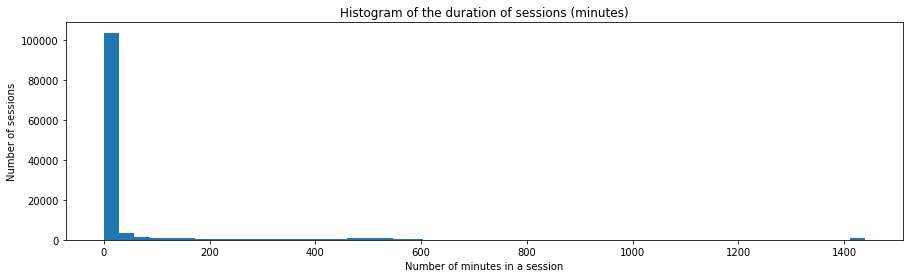

In [4]:
fig = plt.gcf()
fig.set_size_inches(15,4)
plt.hist(sessiondf.dur_in_min, bins=50)
plt.title('Histogram of the duration of sessions (minutes)')
plt.xlabel('Number of minutes in a session')
plt.ylabel('Number of sessions');

This shows that a large number of sessions are very short and the distribution has a long tail.

In [5]:
# find the median duration by user
sessiondf.groupby('user').dur_in_min.median()

user
ABARCAESPIRITU2021     261.250000
ADANIEL2021            510.716667
ADRIANAMARTINEZ2021    207.891667
ADRIANARANGEL2021      454.550000
ADRIANASTROUD2021      343.800000
                          ...    
VBSCE652021             58.616667
VBSTMB652021            25.616667
VICTORIAMACK2021       437.983333
WENDYCRUZ2021           60.683333
YESENIAZENDEJAS2021    165.725000
Name: dur_in_min, Length: 378, dtype: float64

In [ ]:
sessiondf.groupby('user').nop.count()

This is interesting that USER_1 and USERVBS have quite high median durations while all the other users have very low median durations but we can see that both these users have very few sessions which can skew the analysis.

**Finding**
We see that for the users that have a lot of sessions a sessions is around 4 minutes.

### Determine the data requirements

We want to use this data to get a feeling of the data storage requirements of this type of data.  Because this is such a limited dataset we need to make a number of assumptions about it to determine what system requirements could be.

First, let's look at the number of records per day.

In [ ]:
newdf = newdf.copy()
newdf['day'] = newdf.timestamp.apply(lambda x: f"{x.year}-{x.month:02d}-{x.day:02d}")
newdf.day.value_counts()

Looking at this makes me really question this data.  The top of this with around 300 commands per day is maybe reasonable for a small company but the large number of days with one command concern me.  My first assumption was that these days were on weekends but that is not the case and many of these days are during the week.  If the days were missing completely I would assume that we have just a small subset of data with days removed but that does not seems to be the case.

For now, let's assume the 300 records per day with 250 work days per year for a small company.  This gives us 75,000 records per year.  We can simulate the storage requirement of that by taking the original data and duplicating it to 75,000 records.

In [ ]:
year_of_data = pd.concat([df, df, df, df])[:75000]
len(year_of_data)

In [ ]:
year_of_data.to_parquet('year_of_data.pq')

In [ ]:
%ls -l year_of_data.pq

From this we see that a year of data is 762Kb of data per year.  Assume 1024 companies to track and you end up with a very managable 762Mb of data.  I do not believe this dataset size is representative of a typical company and we need to get better data before we make any data architecture decisions.

## Looking at simultaneous sessions

In [ ]:
s = sessiondf[['user', 'start', 'end']].copy().sort_values(by='start')
# set initial session to start at time=0
offset = s['start'].iloc[0]
s['start'] = s['start'] - offset
s['end'] = s['end'] - offset
s.head()

To make the data more legible the session start and end times are converted to seconds since the start of the dataset.

As a data check we want to see if any sessions have the same start and end time.  This should not be possible as something has to happen in a session.  Maybe these represent sessions that are abandoned after exactly one command.

In [ ]:
s[s.start == s.end]

While there are not many of these, they do seem like bogus data that is not meaningful to us so we will delete those.

Now that we have the session start and end times (in seconds) we want to select one user and look at the number of simultaneous sessions.

In [ ]:
sdf = s[(s.user == 'USER_N') & (s.start != s.end)].copy()  # pick a specific user
# Build a new dataframe with start and end events
start_events = pd.DataFrame()
end_events = pd.DataFrame()
start_events['time'] = sdf['start']
start_events['etype'] = 1
end_events['time'] = sdf['end']
end_events['etype'] = -1
events = pd.concat([start_events, end_events]).sort_values(by='time')
events['num_sessions'] = events.etype.cumsum()
# since we want a trasition plot and not a linear plot we have to create some additional data
# for example 
# time num_sessions
#  0     1
#  1     0
#
# needs to become
#  time num_sessions
#  0     1
#  1-delta 1
#  1     0
new_events = events[1:].copy() # we only create new events after the first time
new_events['time'] = new_events['time'] - 1  # this gets the time values
new_events['num_sessions'] = events['num_sessions'].to_list()[:-1]
events = pd.concat([events, new_events]).sort_values(by='time')
events.head(5)

In [ ]:
fig = plt.gcf()
fig.set_size_inches(18,8)
events = events[(events.time > 4.1e7) & (events.time < 4.15e7)]
plt.plot(events.time, events.num_sessions)
plt.title('Number of concurrent sessions for user USER_N')
plt.yticks(range(14))
plt.xlabel('time in seconds')
plt.ylabel('concurrent sessions')
plt.show();

In [ ]:
events

In [ ]:
df[df.SESSIONID == 'bpj5w1f0wae34haqh2twqa3l']

**Finding**
This indicates that for this user there does not seem to be anything unusual with only rare (and very short) cases with multiple simultaneous sessions.


## Looking at rate of command execution

For some users the usage is low enough that it is not an issue but the NAPOLEAN user has 16K commands and it would be good to verify these are not programmatically generated.

For this, we will compute the number of seconds between a page display and the previous page as well as the next page.  I compute both so that we can filter out pages that have long gaps between them as that is probably manual interactions.

In [ ]:
udf = df[df.USERID == 'USER_N'][['PAGENAME', 'timestamp']]
udf['ts_sec'] = udf.timestamp.apply(lambda x: x.timestamp())
udf = udf.sort_values(by='ts_sec')
udf['ts_sec'] = udf.ts_sec - udf.ts_sec.iloc[0]
#udf['prev_sec'] = pd.rolling_apply(udf.rs_sec, 2, lambda x: x[1]-x[0])
tmp = udf.ts_sec.values
diffs = tmp[1:] - tmp[:-1]
udf['prev_sec'] = np.insert(diffs, 0, 0)
udf['next_sec'] = list(udf.ts_sec.diff())[1:] + [0]
udf.head(20)

We now have a table of the time between commands.  In some cases the command is the first or last in a session and the time will be long so we'll filter those out.  What we really care about are the commands where the time to the previous command and the time to the next command are small, smaller than would be expected by a human operator.  Let's pick 3 seconds.

In [ ]:
short_time = 2  # seconds
udf = udf[(udf.prev_sec < short_time) & (udf.next_sec < short_time)]
len(udf)

Now let's look at what the top 10 commands these are.

In [ ]:
udf.PAGENAME.value_counts()[:10]

The page named "Codes" has the most hits so let's look at some of those

In [ ]:
udf[udf.PAGENAME == 'Codes'].head(20)

This is interesting in that a log of these are on the same date and all very close together.  This definitely does not look like a human interaction but it is possible that the software issues mutiple calls to this page.  We should need to understand a big more about the software to be certain.